### **preparing the environment**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/Kaggle-Home-Credit-Default-Risk-Solution

/content/drive/MyDrive/Kaggle-Home-Credit-Default-Risk-Solution


In [3]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import StratifiedKFold
from pathlib import Path
import time
import json
import gc

import os
import re
import warnings
from contextlib import contextmanager
from pathlib import Path
from typing import Tuple, List, Dict, Optional
import lightgbm as lgb
from sklearn.metrics import roc_auc_score

warnings.filterwarnings('ignore')
!pip install lightgbm xgboost catboost featuretools shap missingno optuna -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 27.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.9/587.9 kB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.2/215.2 kB 22.9 MB/s eta 0:00:00


In [4]:
#thử xem đã kết nối drive hay chưa
train = pd.read_parquet("train_merged_v15.parquet")
test = pd.read_parquet("test_merged_v15.parquet")
print(train.shape)
print(test.shape)

(307507, 1043)
(48744, 1042)


In [ ]:
# 0. CONFIGURATION
class Config:
    # Paths
    DATA_DIR     = Path('.')
    OUTPUT_DIR   = Path('./output')
    MODEL_DIR    = OUTPUT_DIR / 'models'

    # CV
    N_FOLDS      = 5
    SEED         = 42
    SEEDS        = [42, 1337, 2024, 7, 99]   # for multi-seed averaging

    # Identifiers / target
    TARGET       = 'TARGET'
    ID_COL       = 'SK_ID_CURR'
    DROP_COLS    = ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index']

In [ ]:
# Kaggle API download
#from google.colab import files
#files.upload()  # Upload your kaggle.json
#!mkdir -p ~/.kaggle && cp kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json
#!kaggle competitions download -c home-credit-default-risk -p /content/
#!unzip -q /content/home-credit-default-risk.zip -d /content/input/
#print("✓ Data downloaded!")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


Saving kaggle.json to kaggle (3).json
100% 688M/688M [00:03<00:00, 233MB/s]

✓ Data downloaded!


In [ ]:
!nvidia-smi

Mon May 25 10:31:00 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   31C    P0             53W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

### **Feature**
- Xử lý features lần 1
+ Chạy các file xử lý FE .py và tạo file test train merged lần 1

In [ ]:
%run "Feature/feature - bureau & bureau balance.py"

File '/content/drive/MyDrive/Kaggle-Home-Credit-Default-Risk-Solution/Feature/feature - bureau & bureau balance.py' updated successfully.


KeyboardInterrupt: 

In [ ]:
!find . -type f | grep -E "bureau|pkl|csv|parquet"

./Feature/feature - bureau & bureau balance.py


In [ ]:
import pandas as pd

bureau_feat = pd.read_csv("bureau_feature.csv")

bureau_feat.head()

FileNotFoundError: [Errno 2] No such file or directory: 'bureau_feature.csv'

In [ ]:
bureau_feat.shape

In [ ]:
bureau_feat["SK_ID_CURR"].duplicated().sum()

In [ ]:
bureau_feat.isnull().mean().sort_values(ascending=False).head(20)

In [ ]:
bureau_feat.info(memory_usage="deep")

In [ ]:
bureau_feat.to_parquet(
    "bureau_feature.parquet",
    index=False
)

**feature - installments_payments**

In [ ]:
%run "Feature/feature - installments_payments.py"

In [ ]:
!find . -type f | grep -E "bureau|pkl|csv|parquet"

In [ ]:
%run "Feature/feature - previous_application.py"

In [ ]:
%run "Feature/feature - POS_CASH_balance.py"

In [ ]:
%run "Feature/feature - credit_card_balance.py"

In [ ]:
!find . -type f | grep -E "feature|csv|parquet|pkl"

In [ ]:
import pandas as pd

bureau_feat = pd.read_csv("bureau_feature.csv")
ip_feat = pd.read_csv("ip_feature.csv")
pa_feat = pd.read_csv("pa_feature.csv")
pcb_feat = pd.read_csv("pcb_feature.csv")
ccb_feat = pd.read_csv("ccb_feature.csv")

In [ ]:
print(bureau_feat.shape)
print(ip_feat.shape)
print(pa_feat.shape)
print(pcb_feat.shape)
print(ccb_feat.shape)

In [ ]:
for df, name in [
    (bureau_feat, "bureau"),
    (ip_feat, "installments"),
    (pa_feat, "previous_application"),
    (pcb_feat, "pos_cash"),
    (ccb_feat, "credit_card")
]:

    print(f"\n{name}")

    print(
        "Duplicate SK_ID_CURR:",
        df["SK_ID_CURR"].duplicated().sum()
    )

In [ ]:
train = pd.read_csv("/content/input/application_train.csv")
test = pd.read_csv("/content/input/application_test.csv")

In [ ]:
feature_tables = [
    bureau_feat,
    ip_feat,
    pa_feat,
    pcb_feat,
    ccb_feat
]

for feat in feature_tables:

    train = train.merge(
        feat,
        on="SK_ID_CURR",
        how="left"
    )

    test = test.merge(
        feat,
        on="SK_ID_CURR",
        how="left"
    )

In [ ]:
print(train.shape)
print(test.shape)

(307511, 409)
(48744, 408)


In [ ]:
train.to_parquet(
    "train_merged.parquet",
    index=False
)

test.to_parquet(
    "test_merged.parquet",
    index=False
)

In [ ]:
import pandas as pd
train = pd.read_parquet('train_merged.parquet')

# 1. HOUR_APPR_PROCESS_START — phải là categorical
print('HOUR_APPR_PROCESS_START:')
print(f'  dtype: {train["HOUR_APPR_PROCESS_START"].dtype}')
print(f'  nunique: {train["HOUR_APPR_PROCESS_START"].nunique()}')
print(f'  values: {sorted(train["HOUR_APPR_PROCESS_START"].dropna().unique())[:5]}...')

# 2. Check OCCUPATION_TYPE
print('\nOCCUPATION_TYPE:')
print(f'  dtype: {train["OCCUPATION_TYPE"].dtype}')
print(f'  nunique: {train["OCCUPATION_TYPE"].nunique()}')

# 3. Verify cat_features detection
from __main__ import detect_categorical_columns, clean_feature_names
train = clean_feature_names(train)
cat = detect_categorical_columns(train)
print(f'\n#Detected categorical: {len(cat)}')
print(f'HOUR_APPR_PROCESS_START in cat: {"HOUR_APPR_PROCESS_START" in cat}')
print(f'OCCUPATION_TYPE in cat: {"OCCUPATION_TYPE" in cat}')

HOUR_APPR_PROCESS_START:
  dtype: int64
  nunique: 24
  values: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)]...

OCCUPATION_TYPE:
  dtype: object
  nunique: 18

#Detected categorical: 36
HOUR_APPR_PROCESS_START in cat: True
OCCUPATION_TYPE in cat: False


### **FE 02: Xử lý thêm clustering và trend features**

In [ ]:
import gc
import numpy as np
import pandas as pd
from typing import List, Tuple
from contextlib import contextmanager
import time


@contextmanager
def timer(name):
    t0 = time.time(); print(f'[{name}] start'); yield
    print(f'[{name}] done in {time.time()-t0:.1f}s')


# ============================================================================
# CORE TREND FUNCTIONS
# ============================================================================
def _slope(group: np.ndarray, time: np.ndarray) -> float:
    """
    Linear regression slope of `group` against `time`.
    Returns NaN if fewer than 2 valid points.
    """
    mask = ~np.isnan(group) & ~np.isnan(time)
    if mask.sum() < 2:
        return np.nan
    x = time[mask]
    y = group[mask]
    if x.std() == 0:
        return 0.0
    # numpy polyfit deg=1 returns [slope, intercept]
    return np.polyfit(x, y, 1)[0]


def _trend_features_per_group(df: pd.DataFrame,
                              group_key: str,
                              value_cols: List[str],
                              time_col: str,
                              recent_days: int = 180,
                              prefix: str = 'TREND'
                              ) -> pd.DataFrame:
    """
    For each group, compute trend stats for each value column:
      - slope over time
      - recent_mean - older_mean (delta)

    Notes
    -----
    - Uses raw groupby + numpy for speed; pandas .apply with custom slope
      is 10x slower for this dataset size.
    - `time_col` is expected in days-since-application convention (negative
      means past).
    """
    # Filter for points with valid time
    df = df[df[time_col].notnull()].copy()

    # Recent / older flag
    df['_is_recent'] = (df[time_col] >= -recent_days).astype(np.int8)

    out = []

    for col in value_cols:
        sub = df[[group_key, time_col, col, '_is_recent']].copy()
        sub = sub[sub[col].notnull()]

        # 1) Slope per group
        slopes = (sub.groupby(group_key)
                     .apply(lambda g: _slope(g[col].values, g[time_col].values))
                     .rename(f'{prefix}_{col}_SLOPE'))

        # 2) Recent mean - older mean
        recent_mean = (sub[sub['_is_recent'] == 1]
                       .groupby(group_key)[col].mean()
                       .rename(f'{prefix}_{col}_RECENT_MEAN'))
        older_mean = (sub[sub['_is_recent'] == 0]
                      .groupby(group_key)[col].mean()
                      .rename(f'{prefix}_{col}_OLDER_MEAN'))

        delta = (recent_mean.fillna(0) - older_mean.fillna(0)
                ).rename(f'{prefix}_{col}_DELTA_RECENT_OLDER')

        out += [slopes, recent_mean, older_mean, delta]

    result = pd.concat(out, axis=1)
    return result


# ============================================================================
# 1. INSTALLMENTS TREND
# ============================================================================
def installments_trend(data_dir: str) -> pd.DataFrame:
    """
    Trend features from installments_payments.

    High-signal trends:
      - DPD (days past due)            -> slope >0 means worsening behaviour
      - PAYMENT_PERC                    -> declining payment ratio is bad
      - PAYMENT_DIFF                    -> growing under-payment is bad
    """
    ins = pd.read_csv(f'{data_dir}/installments_payments.csv')

    ins['DPD']           = (ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']).clip(lower=0)
    ins['PAYMENT_PERC']  = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF']  = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    ins.replace([np.inf, -np.inf], np.nan, inplace=True)

    feats = _trend_features_per_group(
        ins,
        group_key='SK_ID_CURR',
        value_cols=['DPD', 'PAYMENT_PERC', 'PAYMENT_DIFF'],
        time_col='DAYS_INSTALMENT',
        recent_days=365,
        prefix='INSTAL_TREND',
    )

    del ins; gc.collect()
    return feats


# ============================================================================
# 2. CREDIT CARD TREND
# ============================================================================
def credit_card_trend(data_dir: str) -> pd.DataFrame:
    """
    Trend features from credit_card_balance.

    Months balance is in MONTHS_BALANCE (not days). We convert to days for
    consistency: days = months * 30.
    """
    cc = pd.read_csv(f'{data_dir}/credit_card_balance.csv')

    cc['CC_UTILIZATION'] = cc['AMT_BALANCE'] / cc['AMT_CREDIT_LIMIT_ACTUAL']
    cc.replace([np.inf, -np.inf], np.nan, inplace=True)
    cc['_DAYS'] = cc['MONTHS_BALANCE'] * 30   # negative = past

    feats = _trend_features_per_group(
        cc,
        group_key='SK_ID_CURR',
        value_cols=['AMT_BALANCE', 'CC_UTILIZATION', 'AMT_DRAWINGS_CURRENT'],
        time_col='_DAYS',
        recent_days=365,
        prefix='CC_TREND',
    )

    del cc; gc.collect()
    return feats


# ============================================================================
# 3. POS_CASH TREND
# ============================================================================
def pos_cash_trend(data_dir: str) -> pd.DataFrame:
    pos = pd.read_csv(f'{data_dir}/POS_CASH_balance.csv')
    pos['_DAYS'] = pos['MONTHS_BALANCE'] * 30

    feats = _trend_features_per_group(
        pos,
        group_key='SK_ID_CURR',
        value_cols=['SK_DPD', 'SK_DPD_DEF', 'CNT_INSTALMENT_FUTURE'],
        time_col='_DAYS',
        recent_days=365,
        prefix='POS_TREND',
    )

    del pos; gc.collect()
    return feats


# 4. BUREAU_BALANCE TREND (status worsening?)

def bureau_balance_trend(data_dir: str) -> pd.DataFrame:
    """
    Aggregate bureau_balance status to SK_ID_CURR via SK_ID_BUREAU bridge.

    STATUS encodes payment status: '0' (good), '1'-'5' (DPD buckets), 'C', 'X'.
    We map to integer DPD severity, then compute trend.
    """
    bb = pd.read_csv(f'{data_dir}/bureau_balance.csv')
    bureau = pd.read_csv(f'{data_dir}/bureau.csv', usecols=['SK_ID_BUREAU', 'SK_ID_CURR'])

    # Map STATUS -> severity score
    status_map = {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, 'C': 0, 'X': np.nan}
    bb['STATUS_NUM'] = bb['STATUS'].map(status_map)

    # Bridge to SK_ID_CURR
    bb = bb.merge(bureau, on='SK_ID_BUREAU', how='left')
    bb = bb[bb['SK_ID_CURR'].notnull()]
    bb['_DAYS'] = bb['MONTHS_BALANCE'] * 30

    # Aggregate first per SK_ID_CURR (combining all loans)
    feats = _trend_features_per_group(
        bb,
        group_key='SK_ID_CURR',
        value_cols=['STATUS_NUM'],
        time_col='_DAYS',
        recent_days=365,
        prefix='BB_TREND',
    )
    feats.index = feats.index.astype(int)

    del bb, bureau; gc.collect()
    return feats


# MAIN
def build_trend_features(data_dir: str) -> pd.DataFrame:
    """
    Build all trend features and merge into a single DataFrame indexed by
    SK_ID_CURR.
    """
    print('=' * 60)
    print('Trend Features')
    print('=' * 60)

    with timer('installments trend'):
        ins_trend = installments_trend(data_dir)
        print(f'  shape: {ins_trend.shape}')

    with timer('credit card trend'):
        cc_trend = credit_card_trend(data_dir)
        print(f'  shape: {cc_trend.shape}')

    with timer('pos_cash trend'):
        pos_trend = pos_cash_trend(data_dir)
        print(f'  shape: {pos_trend.shape}')

    with timer('bureau_balance trend'):
        bb_trend = bureau_balance_trend(data_dir)
        print(f'  shape: {bb_trend.shape}')

    # Merge all on index = SK_ID_CURR
    trend = (ins_trend
             .join(cc_trend, how='outer')
             .join(pos_trend, how='outer')
             .join(bb_trend, how='outer'))

    # Downcast
    for c in trend.columns:
        trend[c] = trend[c].astype(np.float32)

    print(f'\nFinal trend features: {trend.shape}')
    print(f'Memory: {trend.memory_usage(deep=True).sum()/1024**2:.1f} MB')

    return trend


if __name__ == '__main__':
    DATA_DIR = '/content/input'
    trend = build_trend_features(DATA_DIR)
    trend.to_parquet('./trend_features.parquet')
    print('Saved -> ./trend_features.parquet')

Trend Features
[installments trend] start
  shape: (339578, 12)
[installments trend] done in 271.0s
[credit card trend] start
  shape: (103558, 12)
[credit card trend] done in 86.5s
[pos_cash trend] start
  shape: (337252, 12)
[pos_cash trend] done in 255.1s
[bureau_balance trend] start
  shape: (131725, 4)
[bureau_balance trend] done in 55.0s

Final trend features: (343907, 40)
Memory: 55.1 MB
Saved -> ./trend_features.parquet


In [ ]:
import pandas as pd
import numpy as np

trend = pd.read_parquet('./trend_features.parquet')

# 1. Coverage per column
print('Non-null ratio:')
print((trend.notna().sum() / len(trend)).round(3).to_string())

# 2. Variance check — feature constant là useless
print('\nStd per column:')
print(trend.std().round(4).to_string())

# 3. Top variance features (potential strong predictors)
print('\nTop 10 features by std (likely most signal):')
print(trend.std().sort_values(ascending=False).head(10).to_string())

Non-null ratio:
INSTAL_TREND_DPD_SLOPE                                0.985
INSTAL_TREND_DPD_RECENT_MEAN                          0.735
INSTAL_TREND_DPD_OLDER_MEAN                           0.904
INSTAL_TREND_DPD_DELTA_RECENT_OLDER                   0.651
INSTAL_TREND_PAYMENT_PERC_SLOPE                       0.985
INSTAL_TREND_PAYMENT_PERC_RECENT_MEAN                 0.735
INSTAL_TREND_PAYMENT_PERC_OLDER_MEAN                  0.904
INSTAL_TREND_PAYMENT_PERC_DELTA_RECENT_OLDER          0.651
INSTAL_TREND_PAYMENT_DIFF_SLOPE                       0.985
INSTAL_TREND_PAYMENT_DIFF_RECENT_MEAN                 0.735
INSTAL_TREND_PAYMENT_DIFF_OLDER_MEAN                  0.904
INSTAL_TREND_PAYMENT_DIFF_DELTA_RECENT_OLDER          0.651
CC_TREND_AMT_BALANCE_SLOPE                            0.299
CC_TREND_AMT_BALANCE_RECENT_MEAN                      0.301
CC_TREND_AMT_BALANCE_OLDER_MEAN                       0.207
CC_TREND_AMT_BALANCE_DELTA_RECENT_OLDER               0.207
CC_TREND_CC_UTILIZATION_

In [ ]:
import gc
import numpy as np
import pandas as pd
from typing import List
from contextlib import contextmanager
import time

from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer


@contextmanager
def timer(name):
    t0 = time.time(); print(f'[{name}] start'); yield
    print(f'[{name}] done in {time.time()-t0:.1f}s')


# ============================================================================
# HELPERS
# ============================================================================
LOG_COLS_HINTS = ['AMT_', 'CNT_', '_COUNT', '_SUM', 'DURATION']


def _is_log_col(col_name: str) -> bool:
    """Heuristic: log-transform columns that are amounts, counts, or sums."""
    return any(h in col_name for h in LOG_COLS_HINTS)


def _preprocess_for_clustering(features: pd.DataFrame,
                               clip_pct: float = 0.99
                               ) -> np.ndarray:
    """
    Robust preprocessing pipeline for clustering:
      1. log1p transform skewed columns (amounts, counts)
      2. Median imputation
      3. Standard scaling
      4. Clip outliers at +/- z-score corresponding to clip_pct
    """
    df = features.copy()

    # 1. Log-transform skewed columns
    for col in df.columns:
        if _is_log_col(col):
            # log1p handles 0 and small negative gracefully via abs
            vals = df[col].values
            df[col] = np.sign(vals) * np.log1p(np.abs(vals))

    # 2. Impute
    imputer = SimpleImputer(strategy='median')
    X = imputer.fit_transform(df.values)

    # 3. Scale
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # 4. Clip outliers (99th percentile of absolute z-score)
    clip_val = np.percentile(np.abs(X), clip_pct * 100)
    X = np.clip(X, -clip_val, clip_val)

    return X, imputer, scaler


# ============================================================================
# 1. AGGREGATES (unchanged)
# ============================================================================
def _bureau_aggregates(data_dir: str) -> pd.DataFrame:
    bureau = pd.read_csv(f'{data_dir}/bureau.csv')

    bureau['CREDIT_DURATION']    = -bureau['DAYS_CREDIT'] + bureau['DAYS_CREDIT_ENDDATE']
    bureau['DEBT_CREDIT_RATIO']  = bureau['AMT_CREDIT_SUM_DEBT'] / bureau['AMT_CREDIT_SUM']
    bureau.replace([np.inf, -np.inf], np.nan, inplace=True)

    aggs = {
        'DAYS_CREDIT':            ['min', 'max', 'mean'],
        'DAYS_CREDIT_ENDDATE':    ['mean'],
        'AMT_CREDIT_SUM':         ['mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT':    ['mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean', 'max'],
        'CREDIT_DURATION':        ['mean'],
        'DEBT_CREDIT_RATIO':      ['mean', 'max'],
        'CNT_CREDIT_PROLONG':     ['sum'],
    }
    agg = bureau.groupby('SK_ID_CURR').agg(aggs)
    agg.columns = pd.Index([f'{e[0]}_{e[1].upper()}' for e in agg.columns])
    agg['BURO_LOAN_COUNT'] = bureau.groupby('SK_ID_CURR').size()

    del bureau; gc.collect()
    return agg


def _previous_app_aggregates(data_dir: str) -> pd.DataFrame:
    prev = pd.read_csv(f'{data_dir}/previous_application.csv')
    for c in ['DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
              'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE',
              'DAYS_TERMINATION']:
        prev[c].replace(365243, np.nan, inplace=True)

    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    prev.replace([np.inf, -np.inf], np.nan, inplace=True)

    aggs = {
        'AMT_ANNUITY':       ['mean'],
        'AMT_CREDIT':        ['mean', 'sum'],
        'AMT_APPLICATION':   ['mean'],
        'APP_CREDIT_PERC':   ['mean'],
        'AMT_DOWN_PAYMENT':  ['mean'],
        'CNT_PAYMENT':       ['mean'],
        'DAYS_DECISION':     ['mean', 'max'],
        'RATE_DOWN_PAYMENT': ['mean'],
    }
    agg = prev.groupby('SK_ID_CURR').agg(aggs)
    agg.columns = pd.Index([f'{e[0]}_{e[1].upper()}' for e in agg.columns])
    agg['PREV_APP_COUNT'] = prev.groupby('SK_ID_CURR').size()

    del prev; gc.collect()
    return agg


# ============================================================================
# 2. CLUSTERING WRAPPER (FIXED)
# ============================================================================
def _fit_clusters(features: pd.DataFrame,
                  n_clusters: int,
                  method: str = 'kmeans',
                  prefix: str = 'CLUSTER',
                  seed: int = 42
                  ) -> pd.DataFrame:
    """
    Fit clustering with robust preprocessing.

    Changes from previous version:
      - log-transform skewed columns
      - clip outliers at 99 percentile
      - default to KMeans (more robust on skewed data)
    """
    X, _, _ = _preprocess_for_clustering(features, clip_pct=0.99)

    if method == 'gmm':
        model = GaussianMixture(n_components=n_clusters,
                                random_state=seed,
                                n_init=5,                    # ↑ from 3
                                covariance_type='diag',      # ← changed from 'full'
                                reg_covar=1e-3,              # ← prevent singular cov
                                max_iter=200)
        model.fit(X)
        assignment = model.predict(X)
        scores = model.predict_proba(X)
        score_cols = [f'{prefix}_PROB_{i}' for i in range(n_clusters)]
    elif method == 'kmeans':
        model = KMeans(n_clusters=n_clusters,
                       random_state=seed,
                       n_init=10,
                       max_iter=300)
        model.fit(X)
        assignment = model.predict(X)
        scores = model.transform(X)
        score_cols = [f'{prefix}_DIST_{i}' for i in range(n_clusters)]
    else:
        raise ValueError(method)

    # Verify cluster balance
    unique, counts = np.unique(assignment, return_counts=True)
    proportions = counts / len(assignment)
    print(f'    Cluster sizes: {[f"{p:.1%}" for p in proportions]}')

    if proportions.max() > 0.7:
        print(f'    WARNING: dominant cluster {proportions.max():.1%} - clustering may be degenerate')

    out = pd.DataFrame(scores, index=features.index, columns=score_cols)
    out[f'{prefix}_LABEL'] = assignment.astype(np.int8)
    out[score_cols] = out[score_cols].astype(np.float32)

    return out


# ============================================================================
# MAIN
# ============================================================================
def build_clustering_features(data_dir: str,
                              n_clusters_bureau: int = 4,    # ↓ from 5
                              n_clusters_prev: int = 5,
                              seed: int = 42
                              ) -> pd.DataFrame:
    """
    Build clustering features.

    Changes:
      - n_clusters_bureau reduced to 4 (5 was too many for the data shape)
      - Both use KMeans (GMM was collapsing)
      - Proper log-transform + outlier clipping in preprocessing
    """
    print('=' * 60)
    print('Clustering Features (v2 - fixed)')
    print('=' * 60)

    with timer('bureau aggregates'):
        bur_agg = _bureau_aggregates(data_dir)
        print(f'  shape: {bur_agg.shape}')

    with timer('previous_app aggregates'):
        prev_agg = _previous_app_aggregates(data_dir)
        print(f'  shape: {prev_agg.shape}')

    with timer(f'KMeans bureau ({n_clusters_bureau} clusters)'):
        bur_cluster = _fit_clusters(bur_agg, n_clusters_bureau,
                                     method='kmeans', prefix='BURO_CLU', seed=seed)
        print(f'  shape: {bur_cluster.shape}')

    with timer(f'KMeans previous_app ({n_clusters_prev} clusters)'):
        prev_cluster = _fit_clusters(prev_agg, n_clusters_prev,
                                      method='kmeans', prefix='PREV_CLU', seed=seed)
        print(f'  shape: {prev_cluster.shape}')

    cluster_df = bur_cluster.join(prev_cluster, how='outer')

    print(f'\nFinal clustering features: {cluster_df.shape}')
    print(f'Memory: {cluster_df.memory_usage(deep=True).sum()/1024**2:.1f} MB')

    return cluster_df


if __name__ == '__main__':
    DATA_DIR = '/content/input'
    clu = build_clustering_features(DATA_DIR)
    clu.to_parquet('./clustering_features.parquet')   # OVERWRITE old version
    print('Saved -> ./clustering_features.parquet')

Clustering Features (v2 - fixed)
[bureau aggregates] start
  shape: (305811, 15)
[bureau aggregates] done in 4.7s
[previous_app aggregates] start
  shape: (338857, 11)
[previous_app aggregates] done in 12.7s
[KMeans bureau (4 clusters)] start
    Cluster sizes: ['13.3%', '41.8%', '16.2%', '28.7%']
  shape: (305811, 5)
[KMeans bureau (4 clusters)] done in 3.8s
[KMeans previous_app (5 clusters)] start
    Cluster sizes: ['20.7%', '8.8%', '28.4%', '18.5%', '23.5%']
  shape: (338857, 6)
[KMeans previous_app (5 clusters)] done in 4.0s

Final clustering features: (353577, 11)
Memory: 20.2 MB
Saved -> ./clustering_features.parquet


In [ ]:
import pandas as pd
clu = pd.read_parquet('./clustering_features.parquet')

# 1. Cluster distribution — expect roughly balanced
print('=== BURO_CLU_LABEL distribution ===')
print(clu['BURO_CLU_LABEL'].value_counts(normalize=True).sort_index().round(3))

print('\n=== PREV_CLU_LABEL distribution ===')
print(clu['PREV_CLU_LABEL'].value_counts(normalize=True).sort_index().round(3))

# 2. Probability/distance ranges
print('\n=== Stats ===')
print(clu.describe().T[['mean', 'std', 'min', 'max']].round(3))

=== BURO_CLU_LABEL distribution ===
BURO_CLU_LABEL
0.0    0.133
1.0    0.418
2.0    0.162
3.0    0.287
Name: proportion, dtype: float64

=== PREV_CLU_LABEL distribution ===
PREV_CLU_LABEL
0.0    0.207
1.0    0.088
2.0    0.284
3.0    0.185
4.0    0.235
Name: proportion, dtype: float64

=== Stats ===
                  mean    std    min    max
BURO_CLU_DIST_0  3.880  1.180  0.316  8.775
BURO_CLU_DIST_1  3.043  1.450  0.288  8.053
BURO_CLU_DIST_2  4.016  1.180  0.367  8.298
BURO_CLU_DIST_3  3.227  1.291  0.322  8.373
BURO_CLU_LABEL   1.604  1.039  0.000  3.000
PREV_CLU_DIST_0  3.550  1.238  0.269  9.223
PREV_CLU_DIST_1  4.703  1.267  0.424  9.811
PREV_CLU_DIST_2  3.026  1.131  0.339  7.804
PREV_CLU_DIST_3  3.570  1.230  0.326  8.880
PREV_CLU_DIST_4  3.707  1.518  0.388  9.619
PREV_CLU_LABEL   2.153  1.421  0.000  4.000


In [ ]:
"""merge_extra_features.py"""
import pandas as pd
import numpy as np

# Load existing
train = pd.read_parquet('./train_merged.parquet')
test  = pd.read_parquet('./test_merged.parquet')
print(f'Before: train={train.shape}, test={test.shape}')

# Load new
trend = pd.read_parquet('./trend_features.parquet')
clu   = pd.read_parquet('./clustering_features.parquet')
print(f'Trend: {trend.shape}, Clustering: {clu.shape}')

# Set index name and merge
trend.index.name = 'SK_ID_CURR'
clu.index.name   = 'SK_ID_CURR'

train = train.merge(trend.reset_index(), on='SK_ID_CURR', how='left')
train = train.merge(clu.reset_index(),   on='SK_ID_CURR', how='left')

test = test.merge(trend.reset_index(), on='SK_ID_CURR', how='left')
test = test.merge(clu.reset_index(),   on='SK_ID_CURR', how='left')

print(f'\nAfter: train={train.shape}, test={test.shape}')
print(f'Expected: train=(307511, {409 + 40 + 11}), test=(48744, {408 + 40 + 11})')

# Save with v2 tag (KHÔNG overwrite original)
train.to_parquet('./train_merged_v2.parquet')
test.to_parquet('./test_merged_v2.parquet')
print('\nSaved -> ./train_merged_v2.parquet, test_merged_v2.parquet')

Before: train=(307511, 409), test=(48744, 408)
Trend: (343907, 40), Clustering: (353577, 11)

After: train=(307511, 460), test=(48744, 459)
Expected: train=(307511, 460), test=(48744, 459)

Saved -> ./train_merged_v2.parquet, test_merged_v2.parquet


In [ ]:
import gc
import os
import re
import time
import json
import warnings
from contextlib import contextmanager
from pathlib import Path
from typing import Tuple, List, Dict, Optional

import numpy as np
import pandas as pd
import joblib
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

warnings.filterwarnings('ignore')


# ============================================================================
# 0. CONFIGURATION
# ============================================================================
class Config:
    # Paths
    DATA_DIR     = Path('.')
    OUTPUT_DIR   = Path('./output')
    MODEL_DIR    = OUTPUT_DIR / 'models'

    # CV
    N_FOLDS      = 5
    SEED         = 42
    SEEDS        = [42, 1337, 2024, 7, 99]   # for multi-seed averaging

    # Identifiers / target
    TARGET       = 'TARGET'
    ID_COL       = 'SK_ID_CURR'
    DROP_COLS    = ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index']

    # Force these columns to be treated as categorical regardless of cardinality.
    # Bao gồm những cột có giá trị int nhưng semantic là categorical
    # (giờ apply, ngày trong tuần, region rating, v.v.)
    FORCE_CATEGORICAL = [
        'HOUR_APPR_PROCESS_START',
        'WEEKDAY_APPR_PROCESS_START',
        'REGION_RATING_CLIENT',
        'REGION_RATING_CLIENT_W_CITY',
        'NAME_CONTRACT_TYPE',
        'CODE_GENDER',
        'FLAG_OWN_CAR',
        'FLAG_OWN_REALTY',
        'NAME_TYPE_SUITE',
        'NAME_INCOME_TYPE',
        'NAME_EDUCATION_TYPE',
        'NAME_FAMILY_STATUS',
        'NAME_HOUSING_TYPE',
        'OCCUPATION_TYPE',
        'WEEKDAY_APPR_PROCESS_START',
        'ORGANIZATION_TYPE',
        'FONDKAPREMONT_MODE',
        'HOUSETYPE_MODE',
        'WALLSMATERIAL_MODE',
        'EMERGENCYSTATE_MODE',
    ]

    # LightGBM hyperparameters - regularized for ~400 features
    LGB_PARAMS = {
        'objective':         'binary',
        'metric':            'auc',
        'boosting_type':     'gbdt',
        'learning_rate':     0.02,
        'num_leaves':        24,
        'max_depth':         6,
        'min_child_samples': 100,
        'min_child_weight':  10,
        'reg_alpha':         0.1,
        'reg_lambda':        0.1,
        'colsample_bytree':  0.7,
        'subsample':         0.8,
        'subsample_freq':    1,
        'max_bin':           255,
        'verbosity':         -1,
        'random_state':      42,
        'n_jobs':            -1,
    }

    NUM_BOOST_ROUND        = 10000
    EARLY_STOPPING_ROUNDS  = 200
    LOG_PERIOD             = 200


cfg = Config()
cfg.OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
cfg.MODEL_DIR.mkdir(parents=True, exist_ok=True)


# ============================================================================
# 1. UTILITIES
# ============================================================================
@contextmanager
def timer(name: str):
    t0 = time.time()
    print(f'[{name}] started')
    yield
    print(f'[{name}] finished in {time.time() - t0:.1f}s')


def clean_feature_names(df: pd.DataFrame) -> pd.DataFrame:
    """LightGBM rejects column names with non-alphanumeric characters."""
    df.columns = [re.sub(r'[^A-Za-z0-9_]+', '_', c) for c in df.columns]
    return df


def encode_object_columns(train: pd.DataFrame,
                          test: pd.DataFrame,
                          feats: List[str]
                          ) -> Tuple[pd.DataFrame, pd.DataFrame, List[str]]:
    """
    Convert object columns to integer codes using pandas factorize on
    COMBINED train+test. This avoids:
      1. Unseen-category errors when test has values not in train
      2. Data leakage (factorize doesn't use TARGET, just creates a deterministic
         mapping from string -> int based on unique values)
      3. NaN-as-string issue (use_na_sentinel=True keeps NaN as -1)

    Returns
    -------
    train, test, obj_cols : the encoded frames + list of object-origin columns
    """
    obj_cols = [c for c in feats if train[c].dtype == 'object']

    for col in obj_cols:
        # Combine train+test for stable encoding
        combined = pd.concat([train[col], test[col]], axis=0).reset_index(drop=True)
        codes, _ = pd.factorize(combined, use_na_sentinel=True)  # NaN -> -1
        train[col] = codes[:len(train)].astype(np.int32)
        test[col]  = codes[len(train):].astype(np.int32)

    print(f'  Encoded {len(obj_cols)} object columns via factorize.')
    return train, test, obj_cols


def detect_categorical_columns(df: pd.DataFrame,
                               max_cardinality: int = 50,
                               force_include: Optional[List[str]] = None
                               ) -> List[str]:
    """
    Detect columns that should be treated as categorical by LightGBM.

    Selection rules
    ---------------
    1. Object-dtype columns that have been label-encoded (added externally)
    2. Integer columns with cardinality <= max_cardinality
    3. Any column in force_include (override regardless of cardinality)
    """
    force_include = force_include or []
    cat_cols = set()

    for c in df.columns:
        if c in cfg.DROP_COLS:
            continue
        if df[c].dtype.name in ('int8', 'int16', 'int32', 'int64'):
            if df[c].nunique(dropna=True) <= max_cardinality:
                cat_cols.add(c)

    # Force-include (cleaning name first to match)
    cleaned_force = {re.sub(r'[^A-Za-z0-9_]+', '_', c) for c in force_include}
    for c in df.columns:
        if c in cleaned_force and c not in cfg.DROP_COLS:
            cat_cols.add(c)

    return sorted(cat_cols)


# ============================================================================
# 2. DATA LOADING
# ============================================================================
def load_data():
    train = pd.read_parquet(cfg.DATA_DIR / 'train_merged_v2.parquet')   # ← v2
    test  = pd.read_parquet(cfg.DATA_DIR / 'test_merged_v2.parquet')    # ← v2
    # rest unchanged

    train = clean_feature_names(train)
    test  = clean_feature_names(test)

    # Replace any remaining infinities (defensive)
    train.replace([np.inf, -np.inf], np.nan, inplace=True)
    test.replace([np.inf, -np.inf], np.nan, inplace=True)

    print(f'  Train: {train.shape}')
    print(f'  Test : {test.shape}')
    print(f'  Default rate: {train[cfg.TARGET].mean():.4f}')
    return train, test


# ============================================================================
# 3. CROSS-VALIDATION TRAINING
# ============================================================================
def train_kfold(train: pd.DataFrame,
                test: pd.DataFrame,
                params: Optional[Dict] = None,
                n_folds: int = cfg.N_FOLDS,
                seed: int = cfg.SEED,
                use_native_categorical: bool = True,
                save_models: bool = True,
                verbose: bool = True
                ) -> Tuple[np.ndarray, np.ndarray, pd.DataFrame, List[float], List[int]]:
    """
    Train LightGBM with StratifiedKFold cross-validation.

    Returns
    -------
    oof          : (n_train,) OOF probabilities
    test_preds   : (n_test,)  averaged test probabilities (rank-normalized)
    fi_avg       : DataFrame of mean feature importance across folds
    fold_scores  : list of AUC per fold
    best_iters   : list of best iteration per fold (useful for full-train later)
    """
    # FIX: defensive copy to avoid side-effects when train_kfold is re-run
    train = train.copy()
    test  = test.copy()

    params = (params or cfg.LGB_PARAMS).copy()
    params['random_state'] = seed   # ensure seed propagates

    feats = [c for c in train.columns if c not in cfg.DROP_COLS]
    print(f'\n#Features: {len(feats)}')

    # FIX: encode object columns properly (no LabelEncoder, no leakage)
    train, test, obj_cols = encode_object_columns(train, test, feats)
    print(f'  Object columns label-encoded: {len(obj_cols)}')

    # FIX: detect categorical with force-include list
    if use_native_categorical:
        cat_features = detect_categorical_columns(
            train[feats],
            max_cardinality=50,
            force_include=cfg.FORCE_CATEGORICAL + obj_cols,
        )
        print(f'#Categorical features (native LGB): {len(cat_features)}')
        # Verify high-importance categoricals are included
        critical = ['HOUR_APPR_PROCESS_START', 'OCCUPATION_TYPE',
                    'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE']
        for c in critical:
            if c in feats and c not in cat_features:
                print(f'  WARNING: {c} is in feats but NOT in cat_features!')
    else:
        cat_features = 'auto'

    y = train[cfg.TARGET].astype(int).values
    X = train[feats]
    X_test = test[feats]

    folds = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)
    oof         = np.zeros(len(train))
    test_preds  = np.zeros(len(test))
    fi_list     = []
    fold_scores = []
    best_iters  = []

    for fold, (tr_idx, val_idx) in enumerate(folds.split(X, y), 1):
        with timer(f'Fold {fold}/{n_folds} (seed={seed})'):
            X_tr,  y_tr  = X.iloc[tr_idx],  y[tr_idx]
            X_val, y_val = X.iloc[val_idx], y[val_idx]

            dtrain = lgb.Dataset(X_tr, label=y_tr,
                                 categorical_feature=cat_features,
                                 free_raw_data=False)
            dvalid = lgb.Dataset(X_val, label=y_val,
                                 categorical_feature=cat_features,
                                 reference=dtrain,
                                 free_raw_data=False)

            callbacks = [
                lgb.early_stopping(cfg.EARLY_STOPPING_ROUNDS, verbose=False),
                lgb.log_evaluation(cfg.LOG_PERIOD if verbose else 0),
            ]

            booster = lgb.train(
                params           = params,
                train_set        = dtrain,
                num_boost_round  = cfg.NUM_BOOST_ROUND,
                valid_sets       = [dtrain, dvalid],
                valid_names      = ['train', 'valid'],
                callbacks        = callbacks,
            )

            best_iter = booster.best_iteration
            best_iters.append(best_iter)

            # FIX: explicit num_iteration=best_iteration cho cả 2 prediction
            oof[val_idx] = booster.predict(X_val, num_iteration=best_iter)
            test_preds  += booster.predict(X_test, num_iteration=best_iter) / n_folds

            fold_auc = roc_auc_score(y_val, oof[val_idx])
            fold_scores.append(fold_auc)

            # FIX: report train AUC for overfitting diagnosis
            train_pred = booster.predict(X_tr, num_iteration=best_iter)
            train_auc  = roc_auc_score(y_tr, train_pred)
            print(f'  Fold {fold} | train AUC: {train_auc:.5f} | '
                  f'valid AUC: {fold_auc:.5f} | gap: {train_auc - fold_auc:.4f} | '
                  f'best_iter: {best_iter}')

            fi_list.append(pd.DataFrame({
                'feature':    feats,
                'importance': booster.feature_importance(importance_type='gain'),
                'fold':       fold,
            }))

            if save_models:
                booster.save_model(
                    cfg.MODEL_DIR / f'lgb_fold{fold}_seed{seed}.txt',
                    num_iteration=best_iter,
                )

            del dtrain, dvalid, booster, X_tr, X_val, y_tr, y_val, train_pred
            gc.collect()

    full_oof_auc = roc_auc_score(y, oof)
    cv_mean = np.mean(fold_scores)
    cv_std  = np.std(fold_scores)

    print('\n' + '=' * 70)
    print(f'Seed {seed} | CV mean AUC: {cv_mean:.5f} +- {cv_std:.5f}')
    print(f'Seed {seed} | Full OOF AUC: {full_oof_auc:.5f}')
    print(f'Seed {seed} | Mean best_iter: {np.mean(best_iters):.0f}')
    print('=' * 70)

    fi_avg = (pd.concat(fi_list)
              .groupby('feature', as_index=False)['importance']
              .mean()
              .sort_values('importance', ascending=False))

    return oof, test_preds, fi_avg, fold_scores, best_iters


# ============================================================================
# 4. MULTI-SEED AVERAGING
# ============================================================================
def train_multi_seed(train: pd.DataFrame,
                     test: pd.DataFrame,
                     seeds: List[int],
                     ) -> Tuple[np.ndarray, np.ndarray, pd.DataFrame, Dict]:
    """
    Train multiple LightGBM models with different seeds, then rank-average
    their predictions. Typical gain: +0.001-0.002 AUC over single seed.

    Why rank-average instead of probability-average?
        - AUC is rank-based, so rank-blending is the optimal aggregation
          for AUC optimization.
        - Less sensitive to scale differences between models.
    """
    n_train = len(train)
    n_test  = len(test)

    oof_ranks  = np.zeros(n_train)
    test_ranks = np.zeros(n_test)
    all_fold_scores = []
    all_oof_aucs = []
    fi_combined = []

    for i, seed in enumerate(seeds, 1):
        print(f'\n{"#" * 70}')
        print(f'# SEED {i}/{len(seeds)}: {seed}')
        print(f'{"#" * 70}')

        oof, test_preds, fi_avg, fold_scores, _ = train_kfold(
            train, test, seed=seed, save_models=(i == 1),  # only save 1st seed
        )

        # Rank-normalize
        oof_ranks  += pd.Series(oof).rank().values / len(oof)
        test_ranks += pd.Series(test_preds).rank().values / len(test_preds)

        all_fold_scores.append(fold_scores)
        all_oof_aucs.append(roc_auc_score(train[cfg.TARGET].astype(int), oof))
        fi_combined.append(fi_avg.assign(seed=seed))

    # Average ranks
    oof_avg  = oof_ranks  / len(seeds)
    test_avg = test_ranks / len(seeds)

    # Final blended OOF AUC
    blended_auc = roc_auc_score(train[cfg.TARGET].astype(int), oof_avg)

    print('\n' + '#' * 70)
    print(f'# MULTI-SEED RESULT ({len(seeds)} seeds)')
    print('#' * 70)
    for i, (seed, auc) in enumerate(zip(seeds, all_oof_aucs)):
        print(f'  Seed {seed}: OOF AUC = {auc:.5f}')
    print(f'\n  Mean single-seed OOF AUC: {np.mean(all_oof_aucs):.5f}')
    print(f'  Blended (rank-avg) OOF AUC: {blended_auc:.5f}')
    print(f'  Gain from blending: +{blended_auc - np.mean(all_oof_aucs):.5f}')
    print('#' * 70)

    # Average feature importance across all seeds
    fi_all = pd.concat(fi_combined)
    fi_avg_all = (fi_all.groupby('feature', as_index=False)['importance']
                        .mean()
                        .sort_values('importance', ascending=False))

    summary = {
        'seeds': seeds,
        'single_seed_oof_aucs': all_oof_aucs,
        'mean_single_seed_auc': float(np.mean(all_oof_aucs)),
        'blended_oof_auc': float(blended_auc),
        'fold_scores_per_seed': [list(map(float, fs)) for fs in all_fold_scores],
    }

    return oof_avg, test_avg, fi_avg_all, summary


# ============================================================================
# 5. ARTIFACT PERSISTENCE
# ============================================================================
def save_artifacts(train: pd.DataFrame,
                   test: pd.DataFrame,
                   oof: np.ndarray,
                   test_preds: np.ndarray,
                   fi_avg: pd.DataFrame,
                   fold_scores: List[float] = None,
                   summary_extra: Optional[Dict] = None,
                   tag: str = 'v1') -> None:
    """Save submission, OOF, importance, and CV summary."""

    # 1. Submission
    sub = pd.DataFrame({
        cfg.ID_COL: test[cfg.ID_COL].astype(int).values,
        'TARGET':   test_preds,
    })
    sub.to_csv(cfg.OUTPUT_DIR / f'submission_{tag}.csv', index=False)

    # 2. OOF
    oof_df = pd.DataFrame({
        cfg.ID_COL:    train[cfg.ID_COL].astype(int).values,
        cfg.TARGET:    train[cfg.TARGET].astype(int).values,
        f'oof_{tag}':  oof,
    })
    oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{tag}.parquet')

    # 3. Feature importance
    fi_avg.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{tag}.csv', index=False)

    # 4. CV summary
    summary = {
        'tag':        tag,
        'n_folds':    cfg.N_FOLDS,
        'oof_auc':    float(roc_auc_score(train[cfg.TARGET].astype(int), oof)),
        'n_features': int(len([c for c in train.columns if c not in cfg.DROP_COLS])),
        'params':     cfg.LGB_PARAMS,
    }
    if fold_scores:
        summary['fold_scores'] = [float(s) for s in fold_scores]
        summary['cv_mean']     = float(np.mean(fold_scores))
        summary['cv_std']      = float(np.std(fold_scores))
    if summary_extra:
        summary.update(summary_extra)

    with open(cfg.OUTPUT_DIR / f'cv_summary_{tag}.json', 'w') as f:
        json.dump(summary, f, indent=2)

    print(f'\nArtifacts saved with tag "{tag}":')
    for f in cfg.OUTPUT_DIR.glob(f'*{tag}*'):
        print(f'   {f}')


# ============================================================================
# 6. ENTRY POINT
# ============================================================================
def main(tag: str = 'v1', use_multi_seed: bool = False) -> None:
    """
    Main pipeline.

    Parameters
    ----------
    tag             : tag for output filenames
    use_multi_seed  : if True, train with cfg.SEEDS and rank-average. Adds
                      ~3-4x runtime but typically gains +0.001-0.002 AUC.
    """
    print('=' * 70)
    print('Home Credit Default Risk - LightGBM Training Pipeline')
    print(f'Mode: {"MULTI-SEED" if use_multi_seed else "SINGLE-SEED"}')
    print('=' * 70)

    with timer('Load data'):
        train, test = load_data()

    if use_multi_seed:
        with timer('Train multi-seed'):
            oof, test_preds, fi_avg, summary_extra = train_multi_seed(
                train, test, seeds=cfg.SEEDS,
            )
        with timer('Save artifacts'):
            save_artifacts(train, test, oof, test_preds, fi_avg,
                           summary_extra=summary_extra, tag=tag)
    else:
        with timer('Train single-seed K-fold'):
            oof, test_preds, fi_avg, fold_scores, best_iters = train_kfold(
                train, test, seed=cfg.SEED,
            )
        with timer('Save artifacts'):
            save_artifacts(train, test, oof, test_preds, fi_avg,
                           fold_scores=fold_scores,
                           summary_extra={'best_iters': best_iters},
                           tag=tag)

    print(f'\nTop 25 features:\n{fi_avg.head(25).to_string(index=False)}')
if __name__ == '__main__':
    main(tag='lgb_v3_with_trend_cluster', use_multi_seed=False)

    # Step 2: chỉ chạy multi-seed sau khi single-seed đã ổn định ở 0.79+
    # main(tag='lgb_v3_multiseed', use_multi_seed=True)

Home Credit Default Risk - LightGBM Training Pipeline
Mode: SINGLE-SEED
[Load data] started
  Train: (307511, 460)
  Test : (48744, 459)
  Default rate: 0.0807
[Load data] finished in 3.3s
[Train single-seed K-fold] started

#Features: 458
  Encoded 16 object columns via factorize.
  Object columns label-encoded: 16
#Categorical features (native LGB): 52
[Fold 1/5 (seed=42)] started
[200]	train's auc: 0.79314	valid's auc: 0.770325
[400]	train's auc: 0.814408	valid's auc: 0.78088
[600]	train's auc: 0.828095	valid's auc: 0.784399
[800]	train's auc: 0.839677	valid's auc: 0.786038
[1000]	train's auc: 0.849592	valid's auc: 0.786738
[1200]	train's auc: 0.858342	valid's auc: 0.787032
[1400]	train's auc: 0.866307	valid's auc: 0.787272
[1600]	train's auc: 0.873822	valid's auc: 0.787462
[1800]	train's auc: 0.881078	valid's auc: 0.787501
[2000]	train's auc: 0.88784	valid's auc: 0.787795
[2200]	train's auc: 0.894283	valid's auc: 0.787699
  Fold 1 | train AUC: 0.88784 | valid AUC: 0.78779 | gap: 0.

### Feature Selection

In [ ]:
"""
feature_selection.py
Drop low-importance features từ feature importance đã save.
"""
import pandas as pd
import numpy as np

# Load importance từ training
fi = pd.read_csv('./output/feature_importance_lgb_v3_with_trend_cluster.csv')
print(f'Total features: {len(fi)}')

# Strategy: drop bottom 25% by importance
# Why 25%? Empirical sweet spot - keeps high-mid signal, drops pure noise
threshold = fi['importance'].quantile(0.25)
keep_features = fi[fi['importance'] > threshold]['feature'].tolist()
drop_features = fi[fi['importance'] <= threshold]['feature'].tolist()

print(f'Keeping: {len(keep_features)} features')
print(f'Dropping: {len(drop_features)} features')
print(f'\nLowest 10 features being dropped:')
print(fi.nsmallest(10, 'importance').to_string(index=False))

# Apply to train/test
train = pd.read_parquet('./train_merged_v2.parquet')
test  = pd.read_parquet('./test_merged_v2.parquet')

# Always keep TARGET + SK_ID_CURR
keep_in_train = ['TARGET', 'SK_ID_CURR'] + [c for c in keep_features if c in train.columns]
keep_in_test  = ['SK_ID_CURR'] + [c for c in keep_features if c in test.columns]

train_v3 = train[keep_in_train]
test_v3  = test[keep_in_test]

print(f'\nNew shape: train={train_v3.shape}, test={test_v3.shape}')

train_v3.to_parquet('./train_merged_v3.parquet')
test_v3.to_parquet('./test_merged_v3.parquet')
print('Saved -> train_merged_v3.parquet, test_merged_v3.parquet')

Total features: 458
Keeping: 343 features
Dropping: 115 features

Lowest 10 features being dropped:
                                        feature  importance
         bur_Loan_for_the_purchase_of_equipment         0.0
                   bur_Cash_loan_non_earmarked_         0.0
bur_Loan_for_purchase_of_shares_margin_lending_         0.0
                                 bur_currency_4         0.0
                                 bur_currency_3         0.0
                                 bur_currency_2         0.0
                               bur_sold_count_x         0.0
                                  ccb_count_rej         0.0
                                  bur_bad_count         0.0
                            pcb_end_as_Canceled         0.0

New shape: train=(307511, 313), test=(48744, 312)
Saved -> train_merged_v3.parquet, test_merged_v3.parquet


In [ ]:
# 0. CONFIGURATION
class Config:
    # Paths
    DATA_DIR     = Path('.')
    OUTPUT_DIR   = Path('./output')
    MODEL_DIR    = OUTPUT_DIR / 'models'

    # CV
    N_FOLDS      = 5
    SEED         = 42
    SEEDS        = [42, 1337, 2024, 7, 99]   # for multi-seed averaging

    # Identifiers / target
    TARGET       = 'TARGET'
    ID_COL       = 'SK_ID_CURR'
    DROP_COLS    = ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index']

    # Force these columns to be treated as categorical regardless of cardinality.
    # Bao gồm những cột có giá trị int nhưng semantic là categorical
    # (giờ apply, ngày trong tuần, region rating, v.v.)
    FORCE_CATEGORICAL = [
        'HOUR_APPR_PROCESS_START',
        'WEEKDAY_APPR_PROCESS_START',
        'REGION_RATING_CLIENT',
        'REGION_RATING_CLIENT_W_CITY',
        'NAME_CONTRACT_TYPE',
        'CODE_GENDER',
        'FLAG_OWN_CAR',
        'FLAG_OWN_REALTY',
        'NAME_TYPE_SUITE',
        'NAME_INCOME_TYPE',
        'NAME_EDUCATION_TYPE',
        'NAME_FAMILY_STATUS',
        'NAME_HOUSING_TYPE',
        'OCCUPATION_TYPE',
        'WEEKDAY_APPR_PROCESS_START',
        'ORGANIZATION_TYPE',
        'FONDKAPREMONT_MODE',
        'HOUSETYPE_MODE',
        'WALLSMATERIAL_MODE',
        'EMERGENCYSTATE_MODE',
    ]

    # LightGBM hyperparameters - regularized for ~400 features
    LGB_PARAMS = {
        'objective':         'binary',
        'metric':            'auc',
        'boosting_type':     'gbdt',
        'learning_rate':     0.02,
        'num_leaves':        24,
        'max_depth':         6,
        'min_child_samples': 100,
        'min_child_weight':  10,
        'reg_alpha':         0.1,
        'reg_lambda':        0.1,
        'colsample_bytree':  0.7,
        'subsample':         0.8,
        'subsample_freq':    1,
        'max_bin':           255,
        'verbosity':         -1,
        'random_state':      42,
        'n_jobs':            -1,
    }

    NUM_BOOST_ROUND        = 10000
    EARLY_STOPPING_ROUNDS  = 200
    LOG_PERIOD             = 200


cfg = Config()
cfg.OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
cfg.MODEL_DIR.mkdir(parents=True, exist_ok=True)


# 1. UTILITIES
@contextmanager
def timer(name: str):
    t0 = time.time()
    print(f'[{name}] started')
    yield
    print(f'[{name}] finished in {time.time() - t0:.1f}s')


def clean_feature_names(df: pd.DataFrame) -> pd.DataFrame:
    """LightGBM rejects column names with non-alphanumeric characters."""
    df.columns = [re.sub(r'[^A-Za-z0-9_]+', '_', c) for c in df.columns]
    return df


def encode_object_columns(train: pd.DataFrame,
                          test: pd.DataFrame,
                          feats: List[str]
                          ) -> Tuple[pd.DataFrame, pd.DataFrame, List[str]]:
    """
    Convert object columns to integer codes using pandas factorize on
    COMBINED train+test. This avoids:
      1. Unseen-category errors when test has values not in train
      2. Data leakage (factorize doesn't use TARGET, just creates a deterministic
         mapping from string -> int based on unique values)
      3. NaN-as-string issue (use_na_sentinel=True keeps NaN as -1)

    Returns
    -------
    train, test, obj_cols : the encoded frames + list of object-origin columns
    """
    obj_cols = [c for c in feats if train[c].dtype == 'object']

    for col in obj_cols:
        # Combine train+test for stable encoding
        combined = pd.concat([train[col], test[col]], axis=0).reset_index(drop=True)
        codes, _ = pd.factorize(combined, use_na_sentinel=True)  # NaN -> -1
        train[col] = codes[:len(train)].astype(np.int32)
        test[col]  = codes[len(train):].astype(np.int32)

    print(f'  Encoded {len(obj_cols)} object columns via factorize.')
    return train, test, obj_cols


def detect_categorical_columns(df: pd.DataFrame,
                               max_cardinality: int = 50,
                               force_include: Optional[List[str]] = None
                               ) -> List[str]:
    """
    Detect columns that should be treated as categorical by LightGBM.

    Selection rules
    ---------------
    1. Object-dtype columns that have been label-encoded (added externally)
    2. Integer columns with cardinality <= max_cardinality
    3. Any column in force_include (override regardless of cardinality)
    """
    force_include = force_include or []
    cat_cols = set()

    for c in df.columns:
        if c in cfg.DROP_COLS:
            continue
        if df[c].dtype.name in ('int8', 'int16', 'int32', 'int64'):
            if df[c].nunique(dropna=True) <= max_cardinality:
                cat_cols.add(c)

    # Force-include (cleaning name first to match)
    cleaned_force = {re.sub(r'[^A-Za-z0-9_]+', '_', c) for c in force_include}
    for c in df.columns:
        if c in cleaned_force and c not in cfg.DROP_COLS:
            cat_cols.add(c)

    return sorted(cat_cols)


# ============================================================================
# 2. DATA LOADING
# ============================================================================
def load_data():
    train = pd.read_parquet(cfg.DATA_DIR / 'train_merged_v3.parquet')
    test  = pd.read_parquet(cfg.DATA_DIR / 'test_merged_v3.parquet')
    # rest unchanged

    train = clean_feature_names(train)
    test  = clean_feature_names(test)

    # Replace any remaining infinities (defensive)
    train.replace([np.inf, -np.inf], np.nan, inplace=True)
    test.replace([np.inf, -np.inf], np.nan, inplace=True)

    print(f'  Train: {train.shape}')
    print(f'  Test : {test.shape}')
    print(f'  Default rate: {train[cfg.TARGET].mean():.4f}')
    return train, test


# ============================================================================
# 3. CROSS-VALIDATION TRAINING
# ============================================================================
def train_kfold(train: pd.DataFrame,
                test: pd.DataFrame,
                params: Optional[Dict] = None,
                n_folds: int = cfg.N_FOLDS,
                seed: int = cfg.SEED,
                use_native_categorical: bool = True,
                save_models: bool = True,
                verbose: bool = True
                ) -> Tuple[np.ndarray, np.ndarray, pd.DataFrame, List[float], List[int]]:
    """
    Train LightGBM with StratifiedKFold cross-validation.

    Returns
    -------
    oof          : (n_train,) OOF probabilities
    test_preds   : (n_test,)  averaged test probabilities (rank-normalized)
    fi_avg       : DataFrame of mean feature importance across folds
    fold_scores  : list of AUC per fold
    best_iters   : list of best iteration per fold (useful for full-train later)
    """
    # FIX: defensive copy to avoid side-effects when train_kfold is re-run
    train = train.copy()
    test  = test.copy()

    params = (params or cfg.LGB_PARAMS).copy()
    params['random_state'] = seed   # ensure seed propagates

    feats = [c for c in train.columns if c not in cfg.DROP_COLS]
    print(f'\n#Features: {len(feats)}')

    # FIX: encode object columns properly (no LabelEncoder, no leakage)
    train, test, obj_cols = encode_object_columns(train, test, feats)
    print(f'  Object columns label-encoded: {len(obj_cols)}')

    # FIX: detect categorical with force-include list
    if use_native_categorical:
        cat_features = detect_categorical_columns(
            train[feats],
            max_cardinality=50,
            force_include=cfg.FORCE_CATEGORICAL + obj_cols,
        )
        print(f'#Categorical features (native LGB): {len(cat_features)}')
        # Verify high-importance categoricals are included
        critical = ['HOUR_APPR_PROCESS_START', 'OCCUPATION_TYPE',
                    'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE']
        for c in critical:
            if c in feats and c not in cat_features:
                print(f'  WARNING: {c} is in feats but NOT in cat_features!')
    else:
        cat_features = 'auto'

    y = train[cfg.TARGET].astype(int).values
    X = train[feats]
    X_test = test[feats]

    folds = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)
    oof         = np.zeros(len(train))
    test_preds  = np.zeros(len(test))
    fi_list     = []
    fold_scores = []
    best_iters  = []

    for fold, (tr_idx, val_idx) in enumerate(folds.split(X, y), 1):
        with timer(f'Fold {fold}/{n_folds} (seed={seed})'):
            X_tr,  y_tr  = X.iloc[tr_idx],  y[tr_idx]
            X_val, y_val = X.iloc[val_idx], y[val_idx]

            dtrain = lgb.Dataset(X_tr, label=y_tr,
                                 categorical_feature=cat_features,
                                 free_raw_data=False)
            dvalid = lgb.Dataset(X_val, label=y_val,
                                 categorical_feature=cat_features,
                                 reference=dtrain,
                                 free_raw_data=False)

            callbacks = [
                lgb.early_stopping(cfg.EARLY_STOPPING_ROUNDS, verbose=False),
                lgb.log_evaluation(cfg.LOG_PERIOD if verbose else 0),
            ]

            booster = lgb.train(
                params           = params,
                train_set        = dtrain,
                num_boost_round  = cfg.NUM_BOOST_ROUND,
                valid_sets       = [dtrain, dvalid],
                valid_names      = ['train', 'valid'],
                callbacks        = callbacks,
            )

            best_iter = booster.best_iteration
            best_iters.append(best_iter)

            # FIX: explicit num_iteration=best_iteration cho cả 2 prediction
            oof[val_idx] = booster.predict(X_val, num_iteration=best_iter)
            test_preds  += booster.predict(X_test, num_iteration=best_iter) / n_folds

            fold_auc = roc_auc_score(y_val, oof[val_idx])
            fold_scores.append(fold_auc)

            # FIX: report train AUC for overfitting diagnosis
            train_pred = booster.predict(X_tr, num_iteration=best_iter)
            train_auc  = roc_auc_score(y_tr, train_pred)
            print(f'  Fold {fold} | train AUC: {train_auc:.5f} | '
                  f'valid AUC: {fold_auc:.5f} | gap: {train_auc - fold_auc:.4f} | '
                  f'best_iter: {best_iter}')

            fi_list.append(pd.DataFrame({
                'feature':    feats,
                'importance': booster.feature_importance(importance_type='gain'),
                'fold':       fold,
            }))

            if save_models:
                booster.save_model(
                    cfg.MODEL_DIR / f'lgb_fold{fold}_seed{seed}.txt',
                    num_iteration=best_iter,
                )

            del dtrain, dvalid, booster, X_tr, X_val, y_tr, y_val, train_pred
            gc.collect()

    full_oof_auc = roc_auc_score(y, oof)
    cv_mean = np.mean(fold_scores)
    cv_std  = np.std(fold_scores)

    print('\n' + '=' * 70)
    print(f'Seed {seed} | CV mean AUC: {cv_mean:.5f} +- {cv_std:.5f}')
    print(f'Seed {seed} | Full OOF AUC: {full_oof_auc:.5f}')
    print(f'Seed {seed} | Mean best_iter: {np.mean(best_iters):.0f}')
    print('=' * 70)

    fi_avg = (pd.concat(fi_list)
              .groupby('feature', as_index=False)['importance']
              .mean()
              .sort_values('importance', ascending=False))

    return oof, test_preds, fi_avg, fold_scores, best_iters


# ============================================================================
# 4. MULTI-SEED AVERAGING
# ============================================================================
def train_multi_seed(train: pd.DataFrame,
                     test: pd.DataFrame,
                     seeds: List[int],
                     ) -> Tuple[np.ndarray, np.ndarray, pd.DataFrame, Dict]:
    """
    Train multiple LightGBM models with different seeds, then rank-average
    their predictions. Typical gain: +0.001-0.002 AUC over single seed.

    Why rank-average instead of probability-average?
        - AUC is rank-based, so rank-blending is the optimal aggregation
          for AUC optimization.
        - Less sensitive to scale differences between models.
    """
    n_train = len(train)
    n_test  = len(test)

    oof_ranks  = np.zeros(n_train)
    test_ranks = np.zeros(n_test)
    all_fold_scores = []
    all_oof_aucs = []
    fi_combined = []

    for i, seed in enumerate(seeds, 1):
        print(f'\n{"#" * 70}')
        print(f'# SEED {i}/{len(seeds)}: {seed}')
        print(f'{"#" * 70}')

        oof, test_preds, fi_avg, fold_scores, _ = train_kfold(
            train, test, seed=seed, save_models=(i == 1),  # only save 1st seed
        )

        # Rank-normalize
        oof_ranks  += pd.Series(oof).rank().values / len(oof)
        test_ranks += pd.Series(test_preds).rank().values / len(test_preds)

        all_fold_scores.append(fold_scores)
        all_oof_aucs.append(roc_auc_score(train[cfg.TARGET].astype(int), oof))
        fi_combined.append(fi_avg.assign(seed=seed))

    # Average ranks
    oof_avg  = oof_ranks  / len(seeds)
    test_avg = test_ranks / len(seeds)

    # Final blended OOF AUC
    blended_auc = roc_auc_score(train[cfg.TARGET].astype(int), oof_avg)

    print('\n' + '#' * 70)
    print(f'# MULTI-SEED RESULT ({len(seeds)} seeds)')
    print('#' * 70)
    for i, (seed, auc) in enumerate(zip(seeds, all_oof_aucs)):
        print(f'  Seed {seed}: OOF AUC = {auc:.5f}')
    print(f'\n  Mean single-seed OOF AUC: {np.mean(all_oof_aucs):.5f}')
    print(f'  Blended (rank-avg) OOF AUC: {blended_auc:.5f}')
    print(f'  Gain from blending: +{blended_auc - np.mean(all_oof_aucs):.5f}')
    print('#' * 70)

    # Average feature importance across all seeds
    fi_all = pd.concat(fi_combined)
    fi_avg_all = (fi_all.groupby('feature', as_index=False)['importance']
                        .mean()
                        .sort_values('importance', ascending=False))

    summary = {
        'seeds': seeds,
        'single_seed_oof_aucs': all_oof_aucs,
        'mean_single_seed_auc': float(np.mean(all_oof_aucs)),
        'blended_oof_auc': float(blended_auc),
        'fold_scores_per_seed': [list(map(float, fs)) for fs in all_fold_scores],
    }

    return oof_avg, test_avg, fi_avg_all, summary


# ============================================================================
# 5. ARTIFACT PERSISTENCE
# ============================================================================
def save_artifacts(train: pd.DataFrame,
                   test: pd.DataFrame,
                   oof: np.ndarray,
                   test_preds: np.ndarray,
                   fi_avg: pd.DataFrame,
                   fold_scores: List[float] = None,
                   summary_extra: Optional[Dict] = None,
                   tag: str = 'v1') -> None:
    """Save submission, OOF, importance, and CV summary."""

    # 1. Submission
    sub = pd.DataFrame({
        cfg.ID_COL: test[cfg.ID_COL].astype(int).values,
        'TARGET':   test_preds,
    })
    sub.to_csv(cfg.OUTPUT_DIR / f'submission_{tag}.csv', index=False)

    # 2. OOF
    oof_df = pd.DataFrame({
        cfg.ID_COL:    train[cfg.ID_COL].astype(int).values,
        cfg.TARGET:    train[cfg.TARGET].astype(int).values,
        f'oof_{tag}':  oof,
    })
    oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{tag}.parquet')

    # 3. Feature importance
    fi_avg.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{tag}.csv', index=False)

    # 4. CV summary
    summary = {
        'tag':        tag,
        'n_folds':    cfg.N_FOLDS,
        'oof_auc':    float(roc_auc_score(train[cfg.TARGET].astype(int), oof)),
        'n_features': int(len([c for c in train.columns if c not in cfg.DROP_COLS])),
        'params':     cfg.LGB_PARAMS,
    }
    if fold_scores:
        summary['fold_scores'] = [float(s) for s in fold_scores]
        summary['cv_mean']     = float(np.mean(fold_scores))
        summary['cv_std']      = float(np.std(fold_scores))
    if summary_extra:
        summary.update(summary_extra)

    with open(cfg.OUTPUT_DIR / f'cv_summary_{tag}.json', 'w') as f:
        json.dump(summary, f, indent=2)

    print(f'\nArtifacts saved with tag "{tag}":')
    for f in cfg.OUTPUT_DIR.glob(f'*{tag}*'):
        print(f'   {f}')


# ============================================================================
# 6. ENTRY POINT
# ============================================================================
def main(tag: str = 'v1', use_multi_seed: bool = False) -> None:
    """
    Main pipeline.

    Parameters
    ----------
    tag             : tag for output filenames
    use_multi_seed  : if True, train with cfg.SEEDS and rank-average. Adds
                      ~3-4x runtime but typically gains +0.001-0.002 AUC.
    """
    print('=' * 70)
    print('Home Credit Default Risk - LightGBM Training Pipeline')
    print(f'Mode: {"MULTI-SEED" if use_multi_seed else "SINGLE-SEED"}')
    print('=' * 70)

    with timer('Load data'):
        train, test = load_data()

    if use_multi_seed:
        with timer('Train multi-seed'):
            oof, test_preds, fi_avg, summary_extra = train_multi_seed(
                train, test, seeds=cfg.SEEDS,
            )
        with timer('Save artifacts'):
            save_artifacts(train, test, oof, test_preds, fi_avg,
                           summary_extra=summary_extra, tag=tag)
    else:
        with timer('Train single-seed K-fold'):
            oof, test_preds, fi_avg, fold_scores, best_iters = train_kfold(
                train, test, seed=cfg.SEED,
            )
        with timer('Save artifacts'):
            save_artifacts(train, test, oof, test_preds, fi_avg,
                           fold_scores=fold_scores,
                           summary_extra={'best_iters': best_iters},
                           tag=tag)

    print(f'\nTop 25 features:\n{fi_avg.head(25).to_string(index=False)}')
if __name__ == '__main__':
    main(tag='lgb_v4_selected', use_multi_seed=False)

    # Step 2: chỉ chạy multi-seed sau khi single-seed đã ổn định ở 0.79+
    # main(tag='lgb_v3_multiseed', use_multi_seed=True)

Home Credit Default Risk - LightGBM Training Pipeline
Mode: SINGLE-SEED
[Load data] started
  Train: (307511, 313)
  Test : (48744, 312)
  Default rate: 0.0807
[Load data] finished in 2.7s
[Train single-seed K-fold] started

#Features: 311
  Encoded 13 object columns via factorize.
  Object columns label-encoded: 13
#Categorical features (native LGB): 23
[Fold 1/5 (seed=42)] started
[200]	train's auc: 0.792898	valid's auc: 0.770153
[400]	train's auc: 0.814323	valid's auc: 0.78091
[600]	train's auc: 0.828082	valid's auc: 0.784341
[800]	train's auc: 0.839696	valid's auc: 0.78599
[1000]	train's auc: 0.84975	valid's auc: 0.786701
[1200]	train's auc: 0.858734	valid's auc: 0.787325
[1400]	train's auc: 0.866872	valid's auc: 0.787449
[1600]	train's auc: 0.874444	valid's auc: 0.787634
[1800]	train's auc: 0.881694	valid's auc: 0.787759
[2000]	train's auc: 0.88857	valid's auc: 0.787943
  Fold 1 | train AUC: 0.88610 | valid AUC: 0.78805 | gap: 0.0980 | best_iter: 1927
[Fold 1/5 (seed=42)] finished

In [ ]:
import gc
import os
import re
import time
import json
import warnings
from contextlib import contextmanager
from pathlib import Path
from typing import Tuple, List, Dict, Optional

import numpy as np
import pandas as pd
import joblib
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')


# ============================================================================
# 0. CONFIGURATION
# ============================================================================
class Config:
    # Paths
    DATA_DIR     = Path('.')
    OUTPUT_DIR   = Path('./output')
    MODEL_DIR    = OUTPUT_DIR / 'models'

    # CV
    N_FOLDS      = 5
    SEED         = 42

    # Identifiers / target
    TARGET       = 'TARGET'
    ID_COL       = 'SK_ID_CURR'
    DROP_COLS    = ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index']

    # LightGBM hyperparameters - tuned for this dataset
    LGB_PARAMS = {
    'objective':         'binary',
    'metric':            'auc',
    'boosting_type':     'gbdt',
    'learning_rate':     0.02,
    'num_leaves':        24,           # ↓ từ 34
    'max_depth':         6,            # ↓ từ 8 — chống overfit
    'min_child_samples': 100,          # ↑ từ 70
    'min_child_weight':  10,           # ↓ từ 39 (cùng với min_child_samples đủ rồi)
    'reg_alpha':         0.1,          # ↑ từ 0.041
    'reg_lambda':        0.1,          # ↑ từ 0.073
    'colsample_bytree':  0.7,          # ↓ từ 0.95 — quan trọng nhất
    'subsample':         0.8,          # giữ
    'subsample_freq':    1,
    'max_bin':           255,
    'verbosity':         -1,
    'random_state':      42,
    'n_jobs':            -1,
}
    NUM_BOOST_ROUND        = 10000
    EARLY_STOPPING_ROUNDS  = 200
    LOG_PERIOD             = 200


cfg = Config()
cfg.OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
cfg.MODEL_DIR.mkdir(parents=True, exist_ok=True)


# ============================================================================
# 1. UTILITIES
# ============================================================================
@contextmanager
def timer(name: str):
    t0 = time.time()
    print(f'[{name}] started')
    yield
    print(f'[{name}] finished in {time.time() - t0:.1f}s')


def clean_feature_names(df: pd.DataFrame) -> pd.DataFrame:
    """LightGBM rejects column names with non-alphanumeric characters."""
    df.columns = [re.sub(r'[^A-Za-z0-9_]+', '_', c) for c in df.columns]
    return df


def detect_categorical_columns(df: pd.DataFrame,
                               max_cardinality: int = 50
                               ) -> List[str]:
    """
    Detect columns that should be treated as categorical by LightGBM.

    LightGBM's native categorical handling is more efficient and often
    more accurate than one-hot encoding for low-cardinality features.
    Only int-typed columns with low cardinality qualify.
    """
    cat_cols = []
    for c in df.columns:
        if c in cfg.DROP_COLS:
            continue
        if df[c].dtype.name in ('int8', 'int16', 'int32', 'int64'):
            if df[c].nunique(dropna=True) <= max_cardinality:
                cat_cols.append(c)
    return cat_cols


# ============================================================================
# 2. DATA LOADING
# ============================================================================
def load_data() -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Load preprocessed train and test parquet files.
    Assumes preprocessing has already been run (output of preprocessing.py).
    """
    train = pd.read_parquet(cfg.DATA_DIR / 'train_merged.parquet')
    test  = pd.read_parquet(cfg.DATA_DIR / 'test_merged.parquet')

    train = clean_feature_names(train)
    test  = clean_feature_names(test)

    # Replace any remaining infinities (defensive)
    train.replace([np.inf, -np.inf], np.nan, inplace=True)
    test.replace([np.inf, -np.inf], np.nan, inplace=True)

    print(f'  Train: {train.shape}')
    print(f'  Test : {test.shape}')
    print(f'  Default rate: {train[cfg.TARGET].mean():.4f}')
    return train, test


# ============================================================================
# 3. CROSS-VALIDATION TRAINING
# ============================================================================
def train_kfold(train: pd.DataFrame,
                test: pd.DataFrame,
                params: Optional[Dict] = None,
                n_folds: int = cfg.N_FOLDS,
                seed: int = cfg.SEED,
                use_native_categorical: bool = True,
                save_models: bool = True,
                verbose: bool = True
                ) -> Tuple[np.ndarray, np.ndarray, pd.DataFrame, List[float]]:
    """
    Train LightGBM with StratifiedKFold cross-validation.

    Returns
    -------
    oof          : (n_train,) OOF probabilities
    test_preds   : (n_test,)  averaged test probabilities
    fi_avg       : DataFrame of mean feature importance across folds
    fold_scores  : list of AUC per fold
    """
    params = params or cfg.LGB_PARAMS

    feats = [c for c in train.columns if c not in cfg.DROP_COLS]
    print(f'\n#Features: {len(feats)}')

    # Convert object columns to numerical using LabelEncoder
    for col in feats:
        if train[col].dtype == 'object':
            le = LabelEncoder()
            # Handle potential NaNs by filling with a placeholder before encoding
            # or by converting to string first for consistent encoding of NaNs if they appear in both train and test
            train[col] = le.fit_transform(train[col].astype(str))
            test[col] = le.transform(test[col].astype(str))

    # Detect categorical columns for native LGB handling
    cat_features = detect_categorical_columns(train[feats]) if use_native_categorical else 'auto'
    if isinstance(cat_features, list):
        print(f'#Categorical features (native LGB): {len(cat_features)}')

    y = train[cfg.TARGET].astype(int).values
    X = train[feats]
    X_test = test[feats]

    folds = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)
    oof         = np.zeros(len(train))
    test_preds  = np.zeros(len(test))
    fi_list     = []
    fold_scores = []

    for fold, (tr_idx, val_idx) in enumerate(folds.split(X, y), 1):
        with timer(f'Fold {fold}/{n_folds}'):
            X_tr,  y_tr  = X.iloc[tr_idx],  y[tr_idx]
            X_val, y_val = X.iloc[val_idx], y[val_idx]

            # Modern LightGBM Dataset API with native categorical support
            dtrain = lgb.Dataset(X_tr, label=y_tr,
                                 categorical_feature=cat_features,
                                 free_raw_data=False)
            dvalid = lgb.Dataset(X_val, label=y_val,
                                 categorical_feature=cat_features,
                                 reference=dtrain,
                                 free_raw_data=False)

            callbacks = [
                lgb.early_stopping(cfg.EARLY_STOPPING_ROUNDS, verbose=False),
                lgb.log_evaluation(cfg.LOG_PERIOD if verbose else 0),
            ]

            booster = lgb.train(
                params              = params,
                train_set           = dtrain,
                num_boost_round     = cfg.NUM_BOOST_ROUND,
                valid_sets          = [dtrain, dvalid],
                valid_names         = ['train', 'valid'],
                callbacks           = callbacks,
            )

            best_iter = booster.best_iteration
            oof[val_idx] = booster.predict(X_val, num_iteration=best_iter)
            test_preds  += booster.predict(X_test, num_iteration=best_iter) / n_folds

            fold_auc = roc_auc_score(y_val, oof[val_idx])
            fold_scores.append(fold_auc)
            print(f'  Fold {fold} AUC: {fold_auc:.5f} (best_iter={best_iter})')

            # Feature importance (gain-based, more reliable than split count)
            fi_list.append(pd.DataFrame({
                'feature':    feats,
                'importance': booster.feature_importance(importance_type='gain'),
                'fold':       fold,
            }))

            if save_models:
                booster.save_model(
                    cfg.MODEL_DIR / f'lgb_fold{fold}_seed{seed}.txt',
                    num_iteration=best_iter,
                )

            del dtrain, dvalid, booster, X_tr, X_val, y_tr, y_val
            gc.collect()

    full_oof_auc = roc_auc_score(y, oof)
    cv_mean = np.mean(fold_scores)
    cv_std  = np.std(fold_scores)

    print('\n' + '=' * 60)
    print(f'CV mean AUC : {cv_mean:.5f} +- {cv_std:.5f}')
    print(f'Full OOF AUC: {full_oof_auc:.5f}')
    print('=' * 60)

    fi_avg = (pd.concat(fi_list)
              .groupby('feature', as_index=False)['importance']
              .mean()
              .sort_values('importance', ascending=False))

    return oof, test_preds, fi_avg, fold_scores


# ============================================================================
# 4. ARTIFACT PERSISTENCE
# ============================================================================
def save_artifacts(train: pd.DataFrame,
                   test: pd.DataFrame,
                   oof: np.ndarray,
                   test_preds: np.ndarray,
                   fi_avg: pd.DataFrame,
                   fold_scores: List[float],
                   tag: str = 'v1') -> None:
    """Save submission, OOF, importance, and CV summary as artifacts."""

    # 1. Submission
    sub = pd.DataFrame({
        cfg.ID_COL: test[cfg.ID_COL].astype(int).values,
        'TARGET':   test_preds,
    })
    sub.to_csv(cfg.OUTPUT_DIR / f'submission_{tag}.csv', index=False)

    # 2. OOF predictions (for stacking later)
    oof_df = pd.DataFrame({
        cfg.ID_COL:    train[cfg.ID_COL].astype(int).values,
        cfg.TARGET:    train[cfg.TARGET].astype(int).values,
        f'oof_{tag}':  oof,
    })
    oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{tag}.parquet')

    # 3. Feature importance
    fi_avg.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{tag}.csv', index=False)

    # 4. CV summary as JSON (thesis-friendly)
    summary = {
        'tag':          tag,
        'n_folds':      cfg.N_FOLDS,
        'seed':         cfg.SEED,
        'fold_scores':  [float(s) for s in fold_scores],
        'cv_mean':      float(np.mean(fold_scores)),
        'cv_std':       float(np.std(fold_scores)),
        'oof_auc':      float(roc_auc_score(train[cfg.TARGET], oof)),
        'n_features':   int(len([c for c in train.columns if c not in cfg.DROP_COLS])),
        'params':       cfg.LGB_PARAMS,
    }
    with open(cfg.OUTPUT_DIR / f'cv_summary_{tag}.json', 'w') as f:
        json.dump(summary, f, indent=2)

    print(f'\nArtifacts saved with tag "{tag}":')
    for f in cfg.OUTPUT_DIR.glob(f'*{tag}*'):
        print(f'   {f}')


# ============================================================================
# 5. ENTRY POINT
# ============================================================================
def main(tag: str = 'v1') -> None:
    print('=' * 70)
    print('Home Credit Default Risk - LightGBM Training Pipeline')
    print('=' * 70)

    with timer('Load data'):
        train, test = load_data()

    with timer('Train K-fold'):
        oof, test_preds, fi_avg, fold_scores = train_kfold(train, test)

    with timer('Save artifacts'):
        save_artifacts(train, test, oof, test_preds, fi_avg, fold_scores, tag=tag)

    print(f'\nTop 25 features:\n{fi_avg.head(25).to_string(index=False)}')


if __name__ == '__main__':
    main(tag='lgb_baseline_v1')


Home Credit Default Risk - LightGBM Training Pipeline
[Load data] started
  Train: (307511, 409)
  Test : (48744, 408)
  Default rate: 0.0807
[Load data] finished in 12.6s
[Train K-fold] started

#Features: 407
#Categorical features (native LGB): 51
[Fold 1/5] started
[200]	train's auc: 0.789865	valid's auc: 0.769392
[400]	train's auc: 0.810331	valid's auc: 0.780187
[600]	train's auc: 0.823648	valid's auc: 0.7837
[800]	train's auc: 0.834452	valid's auc: 0.785465
[1000]	train's auc: 0.843857	valid's auc: 0.786461
[1200]	train's auc: 0.852421	valid's auc: 0.787244
[1400]	train's auc: 0.860303	valid's auc: 0.787807
[1600]	train's auc: 0.86761	valid's auc: 0.788158
[1800]	train's auc: 0.874624	valid's auc: 0.788511
[2000]	train's auc: 0.881154	valid's auc: 0.788693
[2200]	train's auc: 0.887264	valid's auc: 0.788706
  Fold 1 AUC: 0.78875 (best_iter=2059)
[Fold 1/5] finished in 258.1s
[Fold 2/5] started
[200]	train's auc: 0.78758	valid's auc: 0.777679
[400]	train's auc: 0.808291	valid's auc:

In [ ]:
!pip install optuna-integration[lightgbm] -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 6.2 MB/s eta 0:00:00


### **Preprocessing app_train**


In [ ]:
"""
preprocess_application.py
Engineer features từ application_train.csv + application_test.csv.
Output: application_processed.parquet (1 row per SK_ID_CURR)
"""
import numpy as np
import pandas as pd

DATA_DIR = '/content/input'   # adjust


def preprocess_application():
    print('=' * 60)
    print('Preprocessing application_train/test')
    print('=' * 60)

    train = pd.read_csv(f'{DATA_DIR}/application_train.csv')
    test  = pd.read_csv(f'{DATA_DIR}/application_test.csv')
    print(f'  Train: {train.shape}, Test: {test.shape}')

    # Concat để engineer cùng nhau
    df = pd.concat([train, test], ignore_index=True, sort=False)

    # === NHÓM 1: Cleaning ===
    print('\n[Nhóm 1] Cleaning...')

    # Sentinels
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace=True)
    df['DAYS_LAST_PHONE_CHANGE'].replace(0, np.nan, inplace=True)
    print(f'  DAYS_EMPLOYED max after sentinel fix: {df["DAYS_EMPLOYED"].max():.0f}')

    # Anomalous CODE_GENDER
    n_before = len(df)
    df = df[df['CODE_GENDER'] != 'XNA'].reset_index(drop=True)
    print(f'  Removed {n_before - len(df)} XNA rows')

    # === NHÓM 2: EXT_SOURCE engineering ===
    print('\n[Nhóm 2] EXT_SOURCE features...')

    ext = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']

    # Statistics
    df['EXT_MEAN']     = df[ext].mean(axis=1)
    df['EXT_STD']      = df[ext].std(axis=1)
    df['EXT_MIN']      = df[ext].min(axis=1)
    df['EXT_MAX']      = df[ext].max(axis=1)
    df['EXT_MEDIAN']   = df[ext].median(axis=1)
    df['EXT_PROD']     = df['EXT_SOURCE_1'] * df['EXT_SOURCE_2'] * df['EXT_SOURCE_3']
    df['EXT_WEIGHTED'] = (df['EXT_SOURCE_1']*2 + df['EXT_SOURCE_2']*3 + df['EXT_SOURCE_3']*4)

    # Fill EXT_STD NaN với mean (vì std cần >=2 non-null values)
    df['EXT_STD'].fillna(df['EXT_STD'].mean(), inplace=True)

    # Pairwise products
    df['EXT_1x2'] = df['EXT_SOURCE_1'] * df['EXT_SOURCE_2']
    df['EXT_2x3'] = df['EXT_SOURCE_2'] * df['EXT_SOURCE_3']
    df['EXT_1x3'] = df['EXT_SOURCE_1'] * df['EXT_SOURCE_3']

    # Interactions với DAYS_*
    for s in ext:
        df[f'{s}_x_DAYS_BIRTH']    = df[s] * df['DAYS_BIRTH']
        df[f'{s}_x_DAYS_EMPLOYED'] = df[s] * df['DAYS_EMPLOYED']

    # Null indicators
    df['EXT_NULL_COUNT'] = df[ext].isnull().sum(axis=1)
    for s in ext:
        df[f'{s}_NULL'] = df[s].isnull().astype(np.int8)

    print(f'  Added {sum(["EXT" in c for c in df.columns])} EXT-related features')

    # === NHÓM 3: Financial ratios ===
    print('\n[Nhóm 3] Financial ratios...')

    df['CREDIT_INCOME_RATIO']  = df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL']
    df['ANNUITY_INCOME_RATIO'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['CREDIT_TERM']          = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON']    = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['PAYMENT_RATE']         = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    df['INCOME_CREDIT_PERC']   = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']

    df['CREDIT_GOODS_RATIO']   = df['AMT_CREDIT'] / df['AMT_GOODS_PRICE']
    df['CREDIT_GOODS_DIFF']    = df['AMT_CREDIT'] - df['AMT_GOODS_PRICE']
    df['GOODS_INCOME_RATIO']   = df['AMT_GOODS_PRICE'] / df['AMT_INCOME_TOTAL']

    df['DAYS_EMPLOYED_PERC']   = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_PER_AGE']       = df['AMT_INCOME_TOTAL'] / df['DAYS_BIRTH']
    df['CAR_BIRTH_RATIO']      = df['OWN_CAR_AGE'] / df['DAYS_BIRTH']
    df['CAR_EMPLOYED_RATIO']   = df['OWN_CAR_AGE'] / df['DAYS_EMPLOYED']
    df['CHILDREN_RATIO']       = df['CNT_CHILDREN'] / df['CNT_FAM_MEMBERS']
    df['PHONE_BIRTH_RATIO']    = df['DAYS_LAST_PHONE_CHANGE'] / df['DAYS_BIRTH']

    print(f'  Added 15 ratio features')

    # === NHÓM 4: Missingness signals ===
    print('\n[Nhóm 4] Missingness signals...')

    # Tổng missing per row
    df['MISSING_COUNT'] = df.isnull().sum(axis=1)

    # Document flag sum
    doc_cols = [c for c in df.columns if 'FLAG_DOCUMENT' in c]
    df['DOCUMENT_COUNT'] = df[doc_cols].sum(axis=1)
    print(f'  Document columns counted: {len(doc_cols)}')

    # Bureau request total
    amt_req_cols = [c for c in df.columns if 'AMT_REQ_CREDIT_BUREAU' in c]
    df['AMT_REQ_TOTAL'] = df[amt_req_cols].sum(axis=1)

    # Null flags
    null_flag_cols = ['OWN_CAR_AGE', 'OCCUPATION_TYPE',
                      'AMT_REQ_CREDIT_BUREAU_HOUR']
    for c in null_flag_cols:
        if c in df.columns:
            df[f'{c}_NULL'] = df[c].isnull().astype(np.int8)

    # === Final cleanup ===
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    print(f'\nFinal shape: {df.shape}')
    print(f'New features engineered: ~{df.shape[1] - 122}')

    # Save
    df.to_parquet('./application_processed.parquet')
    print('Saved -> application_processed.parquet')

    return df


if __name__ == '__main__':
    preprocess_application()

Preprocessing application_train/test
  Train: (307511, 122), Test: (48744, 121)

[Nhóm 1] Cleaning...
  DAYS_EMPLOYED max after sentinel fix: 0
  Removed 4 XNA rows

[Nhóm 2] EXT_SOURCE features...
  Added 23 EXT-related features

[Nhóm 3] Financial ratios...
  Added 15 ratio features

[Nhóm 4] Missingness signals...
  Document columns counted: 20

Final shape: (356251, 163)
New features engineered: ~41
Saved -> application_processed.parquet


In [ ]:
"""rebuild_merged.py"""
import pandas as pd

# Load processed application
app = pd.read_parquet('./application_processed.parquet')

# Load tất cả 7 feature tables
bureau_feat = pd.read_csv("bureau_feature.csv")
ip_feat     = pd.read_csv("ip_feature.csv")
pa_feat     = pd.read_csv("pa_feature.csv")
pcb_feat    = pd.read_csv("pcb_feature.csv")
ccb_feat    = pd.read_csv("ccb_feature.csv")
trend       = pd.read_parquet('./trend_features.parquet').reset_index()
clu         = pd.read_parquet('./clustering_features.parquet').reset_index()

trend.rename(columns={'index': 'SK_ID_CURR'}, inplace=True)
clu.rename(columns={'index': 'SK_ID_CURR'}, inplace=True)

# Merge all
for feat in [bureau_feat, ip_feat, pa_feat, pcb_feat, ccb_feat, trend, clu]:
    app = app.merge(feat, on='SK_ID_CURR', how='left')

# Split train/test
train = app[app['TARGET'].notnull()].reset_index(drop=True)
test  = app[app['TARGET'].isnull()].reset_index(drop=True)
test.drop(columns='TARGET', inplace=True)

print(f'train: {train.shape}')
print(f'test:  {test.shape}')

train.to_parquet('./train_merged_v6.parquet')
test.to_parquet('./test_merged_v6.parquet')

train: (307507, 501)
test:  (48744, 500)


### **Logistic Regression**

In [ ]:
if 'train' not in dir():
    train = pd.read_parquet('train_merged_v6.parquet')
    test = pd.read_parquet('test_merged_v6.parquet')

print(f'Train: {train.shape}')
print(f'Test:  {test.shape}')
print(f'Positive rate: {train[cfg.TARGET].mean():.4f}')

Train: (307507, 501)
Test:  (48744, 500)
Positive rate: 0.0807


In [ ]:
# ========== CELL LR-2: SELECT TOP FEATURES ==========
# LR works best với fewer features. Chọn top 100 từ LGBM importance.
TOP_N_FEATURES = 100

# Load feature importance từ LGBM v6
fi = pd.read_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v6_baseline.csv')
top_features = fi.head(TOP_N_FEATURES)['feature'].tolist()

# Filter chỉ features tồn tại trong train (an toàn)
top_features = [f for f in top_features if f in train.columns]

# Exclude ID and target
exclude_cols = ['SK_ID_CURR', cfg.TARGET, 'index']
top_features = [f for f in top_features if f not in exclude_cols]

print(f'Selected {len(top_features)} top features for LR')
print(f'Sample features:')
for f in top_features[:10]:
    print(f'  - {f}')

Selected 100 top features for LR
Sample features:
  - EXT_MEAN
  - ORGANIZATION_TYPE
  - EXT_MEDIAN
  - EXT_2x3
  - CREDIT_TERM
  - EXT_MIN
  - HOUR_APPR_PROCESS_START
  - INSTAL_TREND_DPD_SLOPE
  - bur_active_ratio_debt_credit
  - CREDIT_GOODS_RATIO


In [ ]:
# ========== CELL LR-3: BUILD PIPELINE ==========
# Identify numeric vs categorical
X_full = train[top_features].copy()

numeric_cols = X_full.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = X_full.select_dtypes(include=['object', 'category']).columns.tolist()

print(f'Numeric features:     {len(numeric_cols)}')
print(f'Categorical features: {len(categorical_cols)}')

# Numeric: impute median, scale
numeric_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
])

# Categorical: factorize trước, sau đó scale (đã encoded từ training trước)
# Nếu vẫn còn object cols, encode ngay
def encode_categoricals_inplace(df, cat_cols):
    """Factorize-encode categorical columns (handle NaN as -1)."""
    df = df.copy()
    for col in cat_cols:
        df[col] = pd.factorize(df[col])[0].astype(np.int32)
    return df

# Encode train + test consistently
if categorical_cols:
    train_encoded = encode_categoricals_inplace(train[top_features], categorical_cols)
    test_encoded = encode_categoricals_inplace(test[top_features], categorical_cols)
else:
    train_encoded = train[top_features].copy()
    test_encoded = test[top_features].copy()

# Replace inf with NaN (LR không xử lý được inf)
train_encoded = train_encoded.replace([np.inf, -np.inf], np.nan)
test_encoded = test_encoded.replace([np.inf, -np.inf], np.nan)

print(f'Train encoded: {train_encoded.shape}')
print(f'Test encoded:  {test_encoded.shape}')
print(f'NaN count train: {train_encoded.isna().sum().sum():,}')

Numeric features:     95
Categorical features: 5
Train encoded: (307507, 100)
Test encoded:  (48744, 100)
NaN count train: 5,480,408


In [ ]:
# ========== CELL LR-4: TRAIN LR K-FOLD ==========
N_FOLDS = 5
SEED = 42

X = train_encoded.values
y = train[cfg.TARGET].astype(int).values
X_test = test_encoded.values

oof_lr = np.zeros(len(train))
test_preds_lr = np.zeros(len(test))
fold_scores = []

# LR hyperparams
LR_PARAMS = {
    'penalty': 'l2',
    'C': 0.1,              # Higher regularization (LR cần regularize mạnh hơn)
    'solver': 'lbfgs',
    'max_iter': 1000,
    'random_state': SEED,
    'n_jobs': -1,
}

print(f'Training LR with {LR_PARAMS}')
print(f'#Features: {X.shape[1]}')
print(f'='*70)

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()

    X_tr, X_val = X[tr_idx], X[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    # Build pipeline fresh mỗi fold (no leakage)
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('lr', LogisticRegression(**LR_PARAMS)),
    ])

    # Fit
    pipeline.fit(X_tr, y_tr)

    # Predict
    val_preds = pipeline.predict_proba(X_val)[:, 1]
    test_fold_preds = pipeline.predict_proba(X_test)[:, 1]

    oof_lr[val_idx] = val_preds
    test_preds_lr += test_fold_preds / N_FOLDS

    # Score
    from sklearn.metrics import roc_auc_score
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | val AUC: {val_auc:.5f} | time: {elapsed:.1f}s')

# Summary
cv_mean = np.mean(fold_scores)
cv_std = np.std(fold_scores)
full_oof_auc = roc_auc_score(y, oof_lr)

print(f'='*70)
print(f'LR | CV mean AUC: {cv_mean:.5f} +- {cv_std:.5f}')
print(f'LR | Full OOF AUC: {full_oof_auc:.5f}')
print(f'='*70)

Training LR with {'penalty': 'l2', 'C': 0.1, 'solver': 'lbfgs', 'max_iter': 1000, 'random_state': 42, 'n_jobs': -1}
#Features: 100
Fold 1/5 | val AUC: 0.75711 | time: 10.8s
Fold 2/5 | val AUC: 0.76858 | time: 10.1s
Fold 3/5 | val AUC: 0.75960 | time: 9.3s
Fold 4/5 | val AUC: 0.76421 | time: 9.9s
Fold 5/5 | val AUC: 0.75613 | time: 9.6s
LR | CV mean AUC: 0.76113 +- 0.00466
LR | Full OOF AUC: 0.76110


In [ ]:
# ========== CELL LR-5: SAVE ARTIFACTS ==========
TAG = 'lr_v6_baseline'

# OOF dataframe (same format as LGBM)
oof_df = pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_lr': oof_lr,
})
oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

# Submission
sub_df = pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': test_preds_lr,
})
sub_df.to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# CV summary
import json
summary = {
    'model': 'LogisticRegression',
    'tag': TAG,
    'n_folds': N_FOLDS,
    'cv_mean': float(cv_mean),
    'cv_std': float(cv_std),
    'full_oof_auc': float(full_oof_auc),
    'fold_scores': [float(s) for s in fold_scores],
    'n_features': int(X.shape[1]),
    'hyperparams': LR_PARAMS,
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'Saved artifacts:')
print(f'  - oof_{TAG}.parquet')
print(f'  - submission_{TAG}.csv')
print(f'  - cv_summary_{TAG}.json')

Saved artifacts:
  - oof_lr_v6_baseline.parquet
  - submission_lr_v6_baseline.csv
  - cv_summary_lr_v6_baseline.json



=== lr_v6_baseline ===
  ROC-AUC:    0.76110
  Gini:       0.52220
  KS:         0.3884
  PR-AUC:     0.24201
  Lift@10%:   3.39x
  Lift@20%:   2.62x
  Log loss:   0.24585
  Brier:      0.06778
  ECE:        0.00083

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       364        0.0118  0.1466       0.0147
9       30751       605        0.0197  0.2437       0.0390
8       30750       797        0.0259  0.3211       0.0711
7       30751      1096        0.0356  0.4415       0.1153
6       30751      1407        0.0458  0.5668       0.1720
5       30750      1898        0.0617  0.7646       0.2484
4       30751      2412        0.0784  0.9716       0.3456
3       30750      3213        0.1045  1.2943       0.4750
2       30751      4616        0.1501  1.8594       0.6609
1       30751      8417        0.2737  3.3905       1.0000

Saved metrics -> output/evaluation/metrics_lr_v6_baseline.j

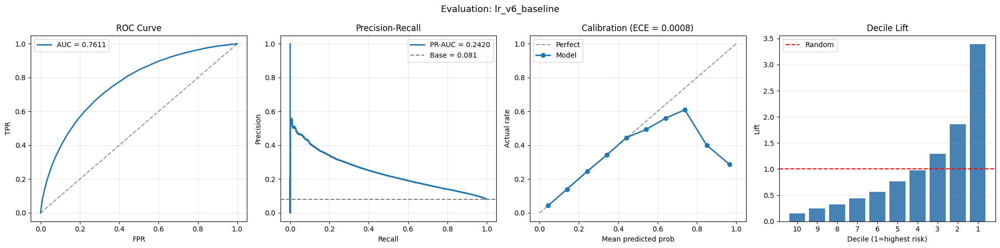

In [ ]:
# ========== CELL LR-6: EVALUATE LR ==========
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_lr = ev.evaluate_model(
    y_true=y,
    y_pred=oof_lr,
    model_name='lr_v6_baseline',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

### **LightGBM**

In [ ]:
"""
train_v6.py
===========
Baseline LightGBM training cho v6 dataset (application processed + 7 feature tables).

Changes từ v3/v4:
  - Load train_merged_v6.parquet / test_merged_v6.parquet
  - tag='lgb_v6_baseline'
  - Giữ nguyên: encoding, force categorical, multi-seed option
"""

# ============================================================================
# 0. CONFIGURATION
# ============================================================================
class Config:
    DATA_DIR     = Path('.')
    OUTPUT_DIR   = Path('./output')
    MODEL_DIR    = OUTPUT_DIR / 'models'

    # Data files
    TRAIN_FILE   = 'train_merged_v6.parquet'
    TEST_FILE    = 'test_merged_v6.parquet'

    # CV
    N_FOLDS      = 5
    SEED         = 42
    SEEDS        = [42, 1337, 2024, 7, 99]   # for multi-seed averaging

    # Identifiers / target
    TARGET       = 'TARGET'
    ID_COL       = 'SK_ID_CURR'
    DROP_COLS    = ['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index']

    # Force categorical (semantic categorical với int dtype)
    FORCE_CATEGORICAL = [
        'HOUR_APPR_PROCESS_START',
        'WEEKDAY_APPR_PROCESS_START',
        'REGION_RATING_CLIENT',
        'REGION_RATING_CLIENT_W_CITY',
        'NAME_CONTRACT_TYPE',
        'CODE_GENDER',
        'FLAG_OWN_CAR',
        'FLAG_OWN_REALTY',
        'NAME_TYPE_SUITE',
        'NAME_INCOME_TYPE',
        'NAME_EDUCATION_TYPE',
        'NAME_FAMILY_STATUS',
        'NAME_HOUSING_TYPE',
        'OCCUPATION_TYPE',
        'ORGANIZATION_TYPE',
        'FONDKAPREMONT_MODE',
        'HOUSETYPE_MODE',
        'WALLSMATERIAL_MODE',
        'EMERGENCYSTATE_MODE',
        # Clustering labels (categorical by nature)
        'BURO_CLU_LABEL',
        'PREV_CLU_LABEL',
    ]

    # LightGBM hyperparameters (regularized for ~500 features)
    LGB_PARAMS = {
        'objective':         'binary',
        'metric':            'auc',
        'boosting_type':     'gbdt',
        'learning_rate':     0.02,
        'num_leaves':        24,
        'max_depth':         6,
        'min_child_samples': 100,
        'min_child_weight':  10,
        'reg_alpha':         0.1,
        'reg_lambda':        0.1,
        'colsample_bytree':  0.7,
        'subsample':         0.8,
        'subsample_freq':    1,
        'max_bin':           255,
        'verbosity':         -1,
        'random_state':      42,
        'n_jobs':            -1,
    }

    NUM_BOOST_ROUND        = 10000
    EARLY_STOPPING_ROUNDS  = 200
    LOG_PERIOD             = 200


cfg = Config()
cfg.OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
cfg.MODEL_DIR.mkdir(parents=True, exist_ok=True)


# ============================================================================
# 1. UTILITIES
# ============================================================================
@contextmanager
def timer(name: str):
    t0 = time.time()
    print(f'[{name}] started')
    yield
    print(f'[{name}] finished in {time.time() - t0:.1f}s')


def clean_feature_names(df: pd.DataFrame) -> pd.DataFrame:
    """LightGBM rejects column names with non-alphanumeric characters."""
    df.columns = [re.sub(r'[^A-Za-z0-9_]+', '_', c) for c in df.columns]
    return df


def encode_object_columns(train: pd.DataFrame,
                          test: pd.DataFrame,
                          feats: List[str]
                          ) -> Tuple[pd.DataFrame, pd.DataFrame, List[str]]:
    """
    Encode object columns via pd.factorize on combined train+test.
    NaN -> -1 sentinel. No data leakage (factorize doesn't use TARGET).
    """
    obj_cols = [c for c in feats if train[c].dtype == 'object']

    for col in obj_cols:
        combined = pd.concat([train[col], test[col]], axis=0).reset_index(drop=True)
        codes, _ = pd.factorize(combined, use_na_sentinel=True)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col]  = codes[len(train):].astype(np.int32)

    print(f'  Encoded {len(obj_cols)} object columns via factorize.')
    return train, test, obj_cols


def detect_categorical_columns(df: pd.DataFrame,
                               max_cardinality: int = 50,
                               force_include: Optional[List[str]] = None
                               ) -> List[str]:
    """Detect + force-include categorical columns."""
    force_include = force_include or []
    cat_cols = set()

    for c in df.columns:
        if c in cfg.DROP_COLS:
            continue
        if df[c].dtype.name in ('int8', 'int16', 'int32', 'int64'):
            if df[c].nunique(dropna=True) <= max_cardinality:
                cat_cols.add(c)

    # Force-include
    cleaned_force = {re.sub(r'[^A-Za-z0-9_]+', '_', c) for c in force_include}
    for c in df.columns:
        if c in cleaned_force and c not in cfg.DROP_COLS:
            cat_cols.add(c)

    return sorted(cat_cols)


# ============================================================================
# 2. DATA LOADING
# ============================================================================
def load_data() -> Tuple[pd.DataFrame, pd.DataFrame]:
    """Load v6 train + test parquet files."""
    train = pd.read_parquet(cfg.DATA_DIR / cfg.TRAIN_FILE)
    test  = pd.read_parquet(cfg.DATA_DIR / cfg.TEST_FILE)

    train = clean_feature_names(train)
    test  = clean_feature_names(test)

    # Defensive: replace infinities
    train.replace([np.inf, -np.inf], np.nan, inplace=True)
    test.replace([np.inf, -np.inf], np.nan, inplace=True)

    print(f'  Train: {train.shape}')
    print(f'  Test : {test.shape}')
    print(f'  Default rate: {train[cfg.TARGET].mean():.4f}')
    return train, test


# ============================================================================
# 3. CROSS-VALIDATION TRAINING
# ============================================================================
def train_kfold(train: pd.DataFrame,
                test: pd.DataFrame,
                params: Optional[Dict] = None,
                n_folds: int = cfg.N_FOLDS,
                seed: int = cfg.SEED,
                use_native_categorical: bool = True,
                save_models: bool = True,
                verbose: bool = True
                ) -> Tuple[np.ndarray, np.ndarray, pd.DataFrame, List[float], List[int]]:
    """
    Train LightGBM with StratifiedKFold cross-validation.

    Returns
    -------
    oof, test_preds, fi_avg, fold_scores, best_iters
    """
    # Defensive copy
    train = train.copy()
    test  = test.copy()

    params = (params or cfg.LGB_PARAMS).copy()
    params['random_state'] = seed

    feats = [c for c in train.columns if c not in cfg.DROP_COLS]
    print(f'\n#Features: {len(feats)}')

    # Encode object columns
    train, test, obj_cols = encode_object_columns(train, test, feats)
    print(f'  Object columns label-encoded: {len(obj_cols)}')

    # Detect categorical features
    if use_native_categorical:
        cat_features = detect_categorical_columns(
            train[feats],
            max_cardinality=50,
            force_include=cfg.FORCE_CATEGORICAL + obj_cols,
        )
        print(f'#Categorical features (native LGB): {len(cat_features)}')
        # Verify critical categoricals
        critical = ['HOUR_APPR_PROCESS_START', 'OCCUPATION_TYPE',
                    'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE']
        for c in critical:
            if c in feats and c not in cat_features:
                print(f'  WARNING: {c} not in cat_features!')
    else:
        cat_features = 'auto'

    y = train[cfg.TARGET].astype(int).values
    X = train[feats]
    X_test = test[feats]

    folds = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)
    oof         = np.zeros(len(train))
    test_preds  = np.zeros(len(test))
    fi_list     = []
    fold_scores = []
    best_iters  = []

    for fold, (tr_idx, val_idx) in enumerate(folds.split(X, y), 1):
        with timer(f'Fold {fold}/{n_folds} (seed={seed})'):
            X_tr,  y_tr  = X.iloc[tr_idx],  y[tr_idx]
            X_val, y_val = X.iloc[val_idx], y[val_idx]

            dtrain = lgb.Dataset(X_tr, label=y_tr,
                                 categorical_feature=cat_features,
                                 free_raw_data=False)
            dvalid = lgb.Dataset(X_val, label=y_val,
                                 categorical_feature=cat_features,
                                 reference=dtrain,
                                 free_raw_data=False)

            callbacks = [
                lgb.early_stopping(cfg.EARLY_STOPPING_ROUNDS, verbose=False),
                lgb.log_evaluation(cfg.LOG_PERIOD if verbose else 0),
            ]

            booster = lgb.train(
                params           = params,
                train_set        = dtrain,
                num_boost_round  = cfg.NUM_BOOST_ROUND,
                valid_sets       = [dtrain, dvalid],
                valid_names      = ['train', 'valid'],
                callbacks        = callbacks,
            )

            best_iter = booster.best_iteration
            best_iters.append(best_iter)

            oof[val_idx] = booster.predict(X_val, num_iteration=best_iter)
            test_preds  += booster.predict(X_test, num_iteration=best_iter) / n_folds

            fold_auc = roc_auc_score(y_val, oof[val_idx])
            fold_scores.append(fold_auc)

            # Report train AUC for overfitting diagnosis
            train_pred = booster.predict(X_tr, num_iteration=best_iter)
            train_auc  = roc_auc_score(y_tr, train_pred)
            print(f'  Fold {fold} | train AUC: {train_auc:.5f} | '
                  f'valid AUC: {fold_auc:.5f} | gap: {train_auc - fold_auc:.4f} | '
                  f'best_iter: {best_iter}')

            fi_list.append(pd.DataFrame({
                'feature':    feats,
                'importance': booster.feature_importance(importance_type='gain'),
                'fold':       fold,
            }))

            if save_models:
                booster.save_model(
                    cfg.MODEL_DIR / f'lgb_v6_fold{fold}_seed{seed}.txt',
                    num_iteration=best_iter,
                )

            del dtrain, dvalid, booster, X_tr, X_val, y_tr, y_val, train_pred
            gc.collect()

    full_oof_auc = roc_auc_score(y, oof)
    cv_mean = np.mean(fold_scores)
    cv_std  = np.std(fold_scores)

    print('\n' + '=' * 70)
    print(f'Seed {seed} | CV mean AUC: {cv_mean:.5f} +- {cv_std:.5f}')
    print(f'Seed {seed} | Full OOF AUC: {full_oof_auc:.5f}')
    print(f'Seed {seed} | Mean best_iter: {np.mean(best_iters):.0f}')
    print(f'Seed {seed} | Mean gap: {np.mean([train_auc - fa for fa in fold_scores]):.4f}')
    print('=' * 70)

    fi_avg = (pd.concat(fi_list)
              .groupby('feature', as_index=False)['importance']
              .mean()
              .sort_values('importance', ascending=False))

    return oof, test_preds, fi_avg, fold_scores, best_iters


# ============================================================================
# 4. MULTI-SEED AVERAGING (optional)
# ============================================================================
def train_multi_seed(train: pd.DataFrame,
                     test: pd.DataFrame,
                     seeds: List[int],
                     ) -> Tuple[np.ndarray, np.ndarray, pd.DataFrame, Dict]:
    """Rank-average across seeds. Adds ~3-5x runtime, gains +0.001-0.002."""
    n_train = len(train)
    n_test  = len(test)

    oof_ranks  = np.zeros(n_train)
    test_ranks = np.zeros(n_test)
    all_fold_scores = []
    all_oof_aucs = []
    fi_combined = []

    for i, seed in enumerate(seeds, 1):
        print(f'\n{"#" * 70}')
        print(f'# SEED {i}/{len(seeds)}: {seed}')
        print(f'{"#" * 70}')

        oof, test_preds, fi_avg, fold_scores, _ = train_kfold(
            train, test, seed=seed, save_models=(i == 1),
        )

        oof_ranks  += pd.Series(oof).rank().values / len(oof)
        test_ranks += pd.Series(test_preds).rank().values / len(test_preds)

        all_fold_scores.append(fold_scores)
        all_oof_aucs.append(roc_auc_score(train[cfg.TARGET].astype(int), oof))
        fi_combined.append(fi_avg.assign(seed=seed))

    oof_avg  = oof_ranks  / len(seeds)
    test_avg = test_ranks / len(seeds)
    blended_auc = roc_auc_score(train[cfg.TARGET].astype(int), oof_avg)

    print('\n' + '#' * 70)
    print(f'# MULTI-SEED RESULT ({len(seeds)} seeds)')
    print('#' * 70)
    for seed, auc in zip(seeds, all_oof_aucs):
        print(f'  Seed {seed}: OOF AUC = {auc:.5f}')
    print(f'\n  Mean single-seed: {np.mean(all_oof_aucs):.5f}')
    print(f'  Blended (rank-avg): {blended_auc:.5f}')
    print(f'  Gain: +{blended_auc - np.mean(all_oof_aucs):.5f}')
    print('#' * 70)

    fi_all = pd.concat(fi_combined)
    fi_avg_all = (fi_all.groupby('feature', as_index=False)['importance']
                        .mean()
                        .sort_values('importance', ascending=False))

    summary = {
        'seeds': seeds,
        'single_seed_oof_aucs': all_oof_aucs,
        'mean_single_seed_auc': float(np.mean(all_oof_aucs)),
        'blended_oof_auc': float(blended_auc),
        'fold_scores_per_seed': [list(map(float, fs)) for fs in all_fold_scores],
    }

    return oof_avg, test_avg, fi_avg_all, summary


# ============================================================================
# 5. ARTIFACT PERSISTENCE
# ============================================================================
def save_artifacts(train: pd.DataFrame,
                   test: pd.DataFrame,
                   oof: np.ndarray,
                   test_preds: np.ndarray,
                   fi_avg: pd.DataFrame,
                   fold_scores: List[float] = None,
                   summary_extra: Optional[Dict] = None,
                   tag: str = 'v1') -> None:
    """Save submission, OOF, importance, summary."""

    # Submission
    sub = pd.DataFrame({
        cfg.ID_COL: test[cfg.ID_COL].astype(int).values,
        'TARGET':   test_preds,
    })
    sub.to_csv(cfg.OUTPUT_DIR / f'submission_{tag}.csv', index=False)

    # OOF predictions
    oof_df = pd.DataFrame({
        cfg.ID_COL:    train[cfg.ID_COL].astype(int).values,
        cfg.TARGET:    train[cfg.TARGET].astype(int).values,
        f'oof_{tag}':  oof,
    })
    oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{tag}.parquet')

    # Feature importance
    fi_avg.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{tag}.csv', index=False)

    # CV summary
    summary = {
        'tag':        tag,
        'n_folds':    cfg.N_FOLDS,
        'data':       cfg.TRAIN_FILE,
        'oof_auc':    float(roc_auc_score(train[cfg.TARGET].astype(int), oof)),
        'n_features': int(len([c for c in train.columns if c not in cfg.DROP_COLS])),
        'params':     cfg.LGB_PARAMS,
    }
    if fold_scores:
        summary['fold_scores'] = [float(s) for s in fold_scores]
        summary['cv_mean']     = float(np.mean(fold_scores))
        summary['cv_std']      = float(np.std(fold_scores))
    if summary_extra:
        summary.update(summary_extra)

    with open(cfg.OUTPUT_DIR / f'cv_summary_{tag}.json', 'w') as f:
        json.dump(summary, f, indent=2)

    print(f'\nArtifacts saved with tag "{tag}":')
    for f in cfg.OUTPUT_DIR.glob(f'*{tag}*'):
        print(f'   {f}')


# ============================================================================
# 6. ENTRY POINT
# ============================================================================
def main(tag: str = 'lgb_v6_baseline', use_multi_seed: bool = False) -> None:
    print('=' * 70)
    print('Home Credit Default Risk - LightGBM Training (v6)')
    print(f'Mode: {"MULTI-SEED" if use_multi_seed else "SINGLE-SEED"}')
    print(f'Data: {cfg.TRAIN_FILE}')
    print('=' * 70)

    with timer('Load data'):
        train, test = load_data()

    if use_multi_seed:
        with timer('Train multi-seed'):
            oof, test_preds, fi_avg, summary_extra = train_multi_seed(
                train, test, seeds=cfg.SEEDS,
            )
        with timer('Save artifacts'):
            save_artifacts(train, test, oof, test_preds, fi_avg,
                           summary_extra=summary_extra, tag=tag)
    else:
        with timer('Train single-seed K-fold'):
            oof, test_preds, fi_avg, fold_scores, best_iters = train_kfold(
                train, test, seed=cfg.SEED,
            )
        with timer('Save artifacts'):
            save_artifacts(train, test, oof, test_preds, fi_avg,
                           fold_scores=fold_scores,
                           summary_extra={'best_iters': best_iters},
                           tag=tag)

    print(f'\nTop 25 features:\n{fi_avg.head(25).to_string(index=False)}')


if __name__ == '__main__':
    # Step 1: Single-seed baseline (~25 phút)
    main(tag='lgb_v6_baseline', use_multi_seed=False)

    # Step 2 (sau khi v6 baseline > 0.793, uncomment):
    # main(tag='lgb_v6_multiseed', use_multi_seed=True)

Home Credit Default Risk - LightGBM Training (v6)
Mode: SINGLE-SEED
Data: train_merged_v6.parquet
[Load data] started
  Train: (307507, 501)
  Test : (48744, 500)
  Default rate: 0.0807
[Load data] finished in 4.7s
[Train single-seed K-fold] started

#Features: 499
  Encoded 16 object columns via factorize.
  Object columns label-encoded: 16
#Categorical features (native LGB): 62
[Fold 1/5 (seed=42)] started
[200]	train's auc: 0.794569	valid's auc: 0.77101
[400]	train's auc: 0.816046	valid's auc: 0.78126
[600]	train's auc: 0.830842	valid's auc: 0.7853
[800]	train's auc: 0.843108	valid's auc: 0.787392
[1000]	train's auc: 0.853451	valid's auc: 0.788451
[1200]	train's auc: 0.862915	valid's auc: 0.789282
[1400]	train's auc: 0.87137	valid's auc: 0.789779
[1600]	train's auc: 0.879292	valid's auc: 0.78988
[1800]	train's auc: 0.886748	valid's auc: 0.790001
  Fold 1 | train AUC: 0.88481 | valid AUC: 0.79003 | gap: 0.0948 | best_iter: 1747
[Fold 1/5 (seed=42)] finished in 267.5s
[Fold 2/5 (seed=

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path

# Assuming cfg and the 'train' DataFrame are available from previous executions
# and that the output files from main(tag='lgb_v6_baseline') exist in './output/'

_output_dir = Path('./output')
_tag = 'lgb_v6_baseline' # This tag was used in the last main() call in cell aU0p2gsdxEi2

# Load OOF predictions
oof_df_loaded = pd.read_parquet(_output_dir / f'oof_{_tag}.parquet')
oof = oof_df_loaded[f'oof_{_tag}'].values # Extract the actual oof predictions

# Load test predictions
submission_df_loaded = pd.read_csv(_output_dir / f'submission_{_tag}.csv')
test_preds = submission_df_loaded['TARGET'].values

# Load feature importance
fi_avg = pd.read_csv(_output_dir / f'feature_importance_{_tag}.csv')

# ========== EXPOSE VARIABLES POST-TRAINING ==========
# Sau khi train_kfold() chạy xong, bạn có:
#   - train (DataFrame)
#   - test  (DataFrame)
#   - oof   (np.array, shape = (n_train,))
#   - test_preds (np.array, shape = (n_test,))
#   - fi_avg (DataFrame: feature, importance)

# Tạo các tên chuẩn để dùng cho evaluation
y_true = train[cfg.TARGET].astype(int).values
oof_preds = oof
sub_preds = test_preds
feature_importance_df = fi_avg

print(f'y_true:                shape={y_true.shape}, pos_rate={y_true.mean():.4f}')
print(f'oof_preds:             shape={oof_preds.shape}')
print(f'sub_preds:             shape={sub_preds.shape}')
print(f'feature_importance_df: shape={feature_importance_df.shape}')

y_true:                shape=(307507,), pos_rate=0.0807
oof_preds:             shape=(307507,)
sub_preds:             shape=(48744,)
feature_importance_df: shape=(499, 2)



=== lgb_v6_baseline ===
  ROC-AUC:    0.79420
  Gini:       0.58840
  KS:         0.4461
  PR-AUC:     0.28978
  Lift@10%:   3.83x
  Lift@20%:   2.88x
  Log loss:   0.23463
  Brier:      0.06540
  ECE:        0.00211

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       236        0.0077  0.0951       0.0095
9       30751       425        0.0138  0.1712       0.0266
8       30750       672        0.0219  0.2707       0.0537
7       30751       905        0.0294  0.3645       0.0902
6       30751      1158        0.0377  0.4665       0.1368
5       30750      1602        0.0521  0.6453       0.2013
4       30751      2216        0.0721  0.8926       0.2906
3       30750      3301        0.1073  1.3297       0.4236
2       30751      4805        0.1563  1.9355       0.6171
1       30751      9505        0.3091  3.8288       1.0000

Saved metrics -> output/evaluation/metrics_lgb_v6_baseline

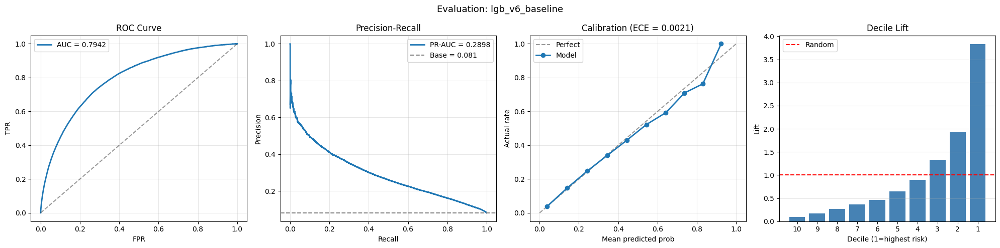

In [ ]:
import importlib
import evaluation as ev
importlib.reload(ev)

# ========== EVALUATE LGBM v6 BASELINE ==========
metrics_lgb = ev.evaluate_model(
    y_true=y_true,
    y_pred=oof_preds,
    model_name='lgb_v6_baseline',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True
)

### **Cat Boost**

In [ ]:
# ========== RECOVERY: LOAD CATBOOST RESULTS ==========
oof_cb_df = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')
oof_cb = oof_cb_df['oof_cb'].values
y = oof_cb_df[cfg.TARGET].astype(int).values

sub_cb_df = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv')
test_preds_cb = sub_cb_df.sort_values('SK_ID_CURR')['TARGET'].values

print(f'oof_cb shape: {oof_cb.shape}')
print(f'test_preds_cb shape: {test_preds_cb.shape}')

oof_cb shape: (307507,)
test_preds_cb shape: (48744,)


In [ ]:
!pip install -q catboost

In [ ]:
if 'train' not in dir() or 'test' not in dir():
    print('Reloading data from disk...')
    train = pd.read_parquet('train_merged_v6.parquet')
    test = pd.read_parquet('test_merged_v6.parquet')

print(f'Train: {train.shape}')
print(f'Test:  {test.shape}')
print(f'Default rate: {train[cfg.TARGET].mean():.4f}')

Train: (307507, 501)
Test:  (48744, 500)
Default rate: 0.0807


In [ ]:
# ========== CELL CB-2: FEATURE PREPARATION ==========
# Exclude meta columns
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

print(f'Total features: {len(feature_cols)}')

# Identify categorical columns (object + low cardinality int)
cat_features = []
for col in feature_cols:
    if train[col].dtype == 'object':
        cat_features.append(col)
    elif train[col].dtype.name == 'category':
        cat_features.append(col)

# Force include known categoricals (same as LGBM training)
FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
for col in FORCE_CATEGORICAL:
    if col in feature_cols and col not in cat_features:
        cat_features.append(col)

# Filter cat_features that actually exist
cat_features = [c for c in cat_features if c in feature_cols]

print(f'Categorical features: {len(cat_features)}')
print(f'Numeric features:     {len(feature_cols) - len(cat_features)}')

# CRITICAL: CatBoost cần categorical cols là str (không phải int hay NaN)
# Convert categorical NaN → "missing" string
X_train = train[feature_cols].copy()
X_test = test[feature_cols].copy()

for col in cat_features:
    X_train[col] = X_train[col].fillna('missing').astype(str)
    X_test[col]  = X_test[col].fillna('missing').astype(str)

# Replace inf in numeric columns
numeric_cols = [c for c in feature_cols if c not in cat_features]
X_train[numeric_cols] = X_train[numeric_cols].replace([np.inf, -np.inf], np.nan)
X_test[numeric_cols]  = X_test[numeric_cols].replace([np.inf, -np.inf], np.nan)

y = train[cfg.TARGET].astype(int).values

print(f'\nX_train: {X_train.shape}')
print(f'X_test:  {X_test.shape}')
print(f'NaN in numeric: {X_train[numeric_cols].isna().sum().sum():,}')

Total features: 499
Categorical features: 19
Numeric features:     480

X_train: (307507, 499)
X_test:  (48744, 499)
NaN in numeric: 31,334,824


In [ ]:
# ========== CELL CB-3: HYPERPARAMS ==========
CB_PARAMS = {
    'loss_function':      'Logloss',
    'eval_metric':        'AUC',
    'iterations':         3000,        # max iterations (early stopping cuts)
    'learning_rate':      0.03,
    'depth':              6,           # CatBoost default 6, sweet spot
    'l2_leaf_reg':        3.0,
    'min_data_in_leaf':   100,
    'random_strength':    1.0,         # noise for splits, helps generalize
    'bagging_temperature': 0.2,        # bayesian bootstrap
    'border_count':       128,         # max bins for numeric (less = faster)
    'grow_policy':        'SymmetricTree',  # default, balanced trees
    'od_type':            'Iter',
    'od_wait':            150,         # early stopping patience
    'random_state':       42,
    'verbose':            200,
    'allow_writing_files': False,      # don't pollute filesystem
    'task_type':          'CPU',       # 'GPU' nếu Colab có GPU
    'thread_count':       -1,
}

print('CatBoost params:')
for k, v in CB_PARAMS.items():
    print(f'  {k}: {v}')

CatBoost params:
  loss_function: Logloss
  eval_metric: AUC
  iterations: 3000
  learning_rate: 0.03
  depth: 6
  l2_leaf_reg: 3.0
  min_data_in_leaf: 100
  random_strength: 1.0
  bagging_temperature: 0.2
  border_count: 128
  grow_policy: SymmetricTree
  od_type: Iter
  od_wait: 150
  random_state: 42
  verbose: 200
  allow_writing_files: False
  task_type: CPU
  thread_count: -1


In [ ]:
# ========== CELL CB-4: TRAIN K-FOLD ==========
N_FOLDS = 5
SEED = 42

oof_cb = np.zeros(len(train))
test_preds_cb = np.zeros(len(test))
fold_scores_cb = []
best_iters_cb = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

print(f'Training CatBoost — {N_FOLDS} folds')
print(f'#Features: {X_train.shape[1]} | #Categorical: {len(cat_features)}')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_train, y)):
    fold_start = time.time()

    X_tr = X_train.iloc[tr_idx]
    X_val = X_train.iloc[val_idx]
    y_tr = y[tr_idx]
    y_val = y[val_idx]

    # CatBoost Pool — efficient data structure
    train_pool = Pool(X_tr, y_tr, cat_features=cat_features)
    val_pool   = Pool(X_val, y_val, cat_features=cat_features)

    # Train
    model = CatBoostClassifier(**CB_PARAMS)
    model.fit(
        train_pool,
        eval_set=val_pool,
        use_best_model=True,
        verbose=200,
    )

    # Predict
    val_preds = model.predict_proba(X_val)[:, 1]
    test_fold_preds = model.predict_proba(X_test)[:, 1]

    oof_cb[val_idx] = val_preds
    test_preds_cb += test_fold_preds / N_FOLDS

    # Score
    train_preds = model.predict_proba(X_tr)[:, 1]
    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    gap = train_auc - val_auc
    best_iter = model.get_best_iteration()

    fold_scores_cb.append(val_auc)
    best_iters_cb.append(best_iter)

    # Feature importance
    fi = pd.DataFrame({
        'feature':    feature_cols,
        'importance': model.get_feature_importance(),
    })
    fi_list.append(fi)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | '
          f'train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {gap:.4f} | best_iter: {best_iter} | time: {elapsed:.1f}s')

    # Clean memory
    del model, train_pool, val_pool
    gc.collect()

# Summary
cv_mean_cb = np.mean(fold_scores_cb)
cv_std_cb = np.std(fold_scores_cb)
full_oof_auc_cb = roc_auc_score(y, oof_cb)

print('=' * 70)
print(f'CatBoost | CV mean AUC: {cv_mean_cb:.5f} +- {cv_std_cb:.5f}')
print(f'CatBoost | Full OOF AUC: {full_oof_auc_cb:.5f}')
print(f'CatBoost | Mean best_iter: {int(np.mean(best_iters_cb))}')
print('=' * 70)

# Average feature importance across folds
fi_avg_cb = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
fi_avg_cb = fi_avg_cb.sort_values('importance', ascending=False)

print(f'\nTop 20 features (CatBoost):')
print(fi_avg_cb.head(20).to_string(index=False))

Training CatBoost — 5 folds
#Features: 499 | #Categorical: 19
0:	test: 0.6811344	best: 0.6811344 (0)	total: 601ms	remaining: 30m 1s
200:	test: 0.7689369	best: 0.7689369 (200)	total: 1m 13s	remaining: 17m 8s
400:	test: 0.7774408	best: 0.7774408 (400)	total: 2m 29s	remaining: 16m 7s
600:	test: 0.7817456	best: 0.7817456 (600)	total: 3m 39s	remaining: 14m 35s
800:	test: 0.7835878	best: 0.7835878 (800)	total: 4m 45s	remaining: 13m 3s
1000:	test: 0.7849081	best: 0.7849193 (995)	total: 5m 54s	remaining: 11m 47s
1200:	test: 0.7859323	best: 0.7859346 (1199)	total: 7m	remaining: 10m 30s
1400:	test: 0.7867109	best: 0.7867197 (1397)	total: 8m 7s	remaining: 9m 16s
1600:	test: 0.7873630	best: 0.7873660 (1599)	total: 9m 13s	remaining: 8m 3s
1800:	test: 0.7876965	best: 0.7877124 (1785)	total: 10m 25s	remaining: 6m 56s
2000:	test: 0.7880942	best: 0.7880950 (1999)	total: 11m 31s	remaining: 5m 45s
2200:	test: 0.7884271	best: 0.7884286 (2198)	total: 12m 38s	remaining: 4m 35s
2400:	test: 0.7884782	best: 0.

In [ ]:
# ========== CELL CB-5: SAVE ARTIFACTS ==========
TAG = 'cb_v6_baseline'

# OOF
oof_df = pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_cb': oof_cb,
})
oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

# Submission
sub_df = pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': test_preds_cb,
})
sub_df.to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# Feature importance
fi_avg_cb.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{TAG}.csv', index=False)

# CV summary
summary = {
    'model': 'CatBoost',
    'tag': TAG,
    'n_folds': N_FOLDS,
    'cv_mean': float(cv_mean_cb),
    'cv_std': float(cv_std_cb),
    'full_oof_auc': float(full_oof_auc_cb),
    'fold_scores': [float(s) for s in fold_scores_cb],
    'best_iters': [int(i) for i in best_iters_cb],
    'n_features': int(X_train.shape[1]),
    'n_categorical': len(cat_features),
    'hyperparams': {k: v for k, v in CB_PARAMS.items() if isinstance(v, (int, float, str, bool))},
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'Saved artifacts:')
print(f'  - oof_{TAG}.parquet')
print(f'  - submission_{TAG}.csv')
print(f'  - feature_importance_{TAG}.csv')
print(f'  - cv_summary_{TAG}.json')

Saved artifacts:
  - oof_cb_v6_baseline.parquet
  - submission_cb_v6_baseline.csv
  - feature_importance_cb_v6_baseline.csv
  - cv_summary_cb_v6_baseline.json



=== cb_v6_baseline ===
  ROC-AUC:    0.79352
  Gini:       0.58703
  KS:         0.4469
  PR-AUC:     0.28865
  Lift@10%:   3.83x
  Lift@20%:   2.89x
  Log loss:   0.23492
  Brier:      0.06543
  ECE:        0.00305

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       270        0.0088  0.1088       0.0109
9       30751       460        0.0150  0.1853       0.0294
8       30750       614        0.0200  0.2473       0.0541
7       30751       891        0.0290  0.3589       0.0900
6       30751      1169        0.0380  0.4709       0.1371
5       30750      1610        0.0524  0.6486       0.2020
4       30751      2178        0.0708  0.8773       0.2897
3       30750      3281        0.1067  1.3217       0.4219
2       30751      4839        0.1574  1.9492       0.6168
1       30751      9513        0.3094  3.8320       1.0000

Saved metrics -> output/evaluation/metrics_cb_v6_baseline.j

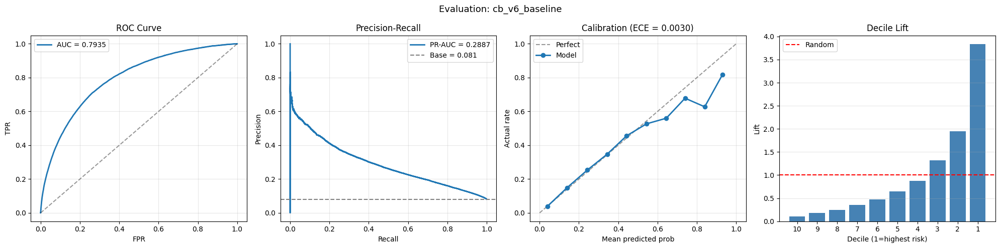

In [ ]:
# ========== CELL CB-6: EVALUATE CATBOOST ==========
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_cb = ev.evaluate_model(
    y_true=y,
    y_pred=oof_cb,
    model_name='cb_v6_baseline',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

In [ ]:
pip install catboost -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 24.8 MB/s eta 0:00:00


Prediction distribution check:
  LGBM     OOF:  min=0.0009, max=0.9238, mean=0.0796
  CatBoost OOF:  min=0.0013, max=0.9725, mean=0.0795
  Target rate:   0.0807

Rank correlation LGBM × CatBoost: 0.9674
  (< 0.95 = excellent, 0.95-0.97 = good, > 0.97 = limited diversity)

Method 1: Probability Average

=== blend_lgb_cb_prob_avg ===
  ROC-AUC:    0.79568
  Gini:       0.59136
  KS:         0.4503
  PR-AUC:     0.29247
  Lift@10%:   3.86x
  Lift@20%:   2.90x
  Log loss:   0.23408
  Brier:      0.06525
  ECE:        0.00289

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       237        0.0077  0.0955       0.0095
9       30751       442        0.0144  0.1780       0.0274
8       30750       647        0.0210  0.2606       0.0534
7       30751       880        0.0286  0.3545       0.0889
6       30751      1154        0.0375  0.4648       0.1353
5       30750      1583        0.0515  0.6377

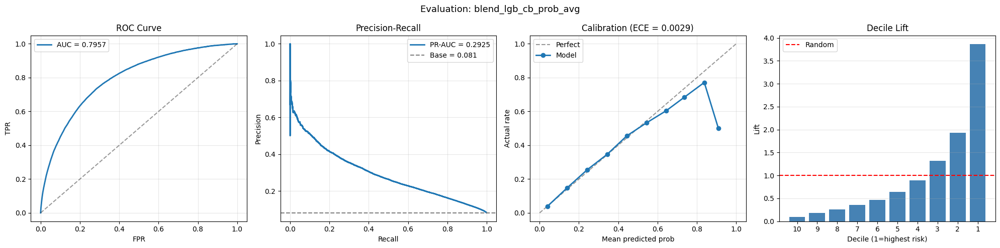


Method 3: Geometric Mean

=== blend_lgb_cb_geo_mean ===
  ROC-AUC:    0.79565
  Gini:       0.59131
  KS:         0.4503
  PR-AUC:     0.29247
  Lift@10%:   3.87x
  Lift@20%:   2.90x
  Log loss:   0.23410
  Brier:      0.06526
  ECE:        0.00281

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       237        0.0077  0.0955       0.0095
9       30751       447        0.0145  0.1801       0.0276
8       30750       636        0.0207  0.2562       0.0532
7       30751       895        0.0291  0.3605       0.0892
6       30751      1152        0.0375  0.4640       0.1356
5       30750      1577        0.0513  0.6353       0.1992
4       30751      2231        0.0726  0.8987       0.2890
3       30750      3267        0.1062  1.3160       0.4206
2       30751      4787        0.1557  1.9283       0.6135
1       30751      9596        0.3121  3.8654       1.0000

Saved metrics -> output/ev

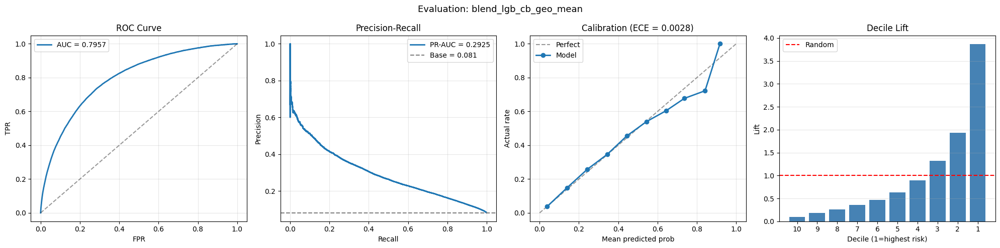


Best method: prob_avg
Saved best blend submission and OOF


In [ ]:
# ========== CELL CB-7 FIXED: BLEND ON PROBABILITY SCALE ==========
from scipy.stats import rankdata

# Load LGBM OOF nếu chưa có
if 'oof_preds' not in dir():
    oof_lgb_df = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')
    oof_preds = oof_lgb_df['oof_lgb'].values

# Load LGBM test predictions
sub_lgb = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv')
test_preds_lgb = sub_lgb.sort_values('SK_ID_CURR')['TARGET'].values

# Diagnostic: Distribution check
print('Prediction distribution check:')
print(f'  LGBM     OOF:  min={oof_preds.min():.4f}, max={oof_preds.max():.4f}, mean={oof_preds.mean():.4f}')
print(f'  CatBoost OOF:  min={oof_cb.min():.4f}, max={oof_cb.max():.4f}, mean={oof_cb.mean():.4f}')
print(f'  Target rate:   {y.mean():.4f}')
print()

# Rank correlation (vẫn dùng để check diversity)
corr = np.corrcoef(rankdata(oof_preds), rankdata(oof_cb))[0, 1]
print(f'Rank correlation LGBM × CatBoost: {corr:.4f}')
print(f'  (< 0.95 = excellent, 0.95-0.97 = good, > 0.97 = limited diversity)')
print()

# === METHOD 1: Simple average on probability scale (recommended) ===
oof_blend_prob = (oof_preds + oof_cb) / 2
test_blend_prob = (test_preds_lgb + test_preds_cb) / 2

print('Method 1: Probability Average')
metrics_blend_prob = ev.evaluate_model(
    y_true=y,
    y_pred=oof_blend_prob,
    model_name='blend_lgb_cb_prob_avg',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# === METHOD 3: Geometric mean (alternative, often slightly better) ===
oof_blend_geo = np.sqrt(np.clip(oof_preds * oof_cb, 1e-10, 1))
test_blend_geo = np.sqrt(np.clip(test_preds_lgb * test_preds_cb, 1e-10, 1))

print('\nMethod 3: Geometric Mean')
metrics_blend_geo = ev.evaluate_model(
    y_true=y,
    y_pred=oof_blend_geo,
    model_name='blend_lgb_cb_geo_mean',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save best blend
best_method = 'prob_avg' if metrics_blend_prob['roc_auc'] >= metrics_blend_geo['roc_auc'] else 'geo_mean'
best_oof = oof_blend_prob if best_method == 'prob_avg' else oof_blend_geo
best_test = test_blend_prob if best_method == 'prob_avg' else test_blend_geo

print(f'\nBest method: {best_method}')

pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': best_test,
}).to_csv(cfg.OUTPUT_DIR / 'submission_blend_lgb_cb.csv', index=False)

pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_blend': best_oof,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_blend_lgb_cb.parquet', index=False)

print(f'Saved best blend submission and OOF')

Top 5 weight combinations:
 w_lgb  w_cb      auc
  0.55  0.45 0.795691
  0.50  0.50 0.795678
  0.60  0.40 0.795670
  0.45  0.55 0.795631
  0.65  0.35 0.795614

Best blend: LGBM=0.55, CatBoost=0.45

=== blend_best_lgb55_cb44 ===
  ROC-AUC:    0.79569
  Gini:       0.59138
  KS:         0.4505
  PR-AUC:     0.29250
  Lift@10%:   3.86x
  Lift@20%:   2.89x
  Log loss:   0.23408
  Brier:      0.06525
  ECE:        0.00281

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       235        0.0076  0.0947       0.0095
9       30751       444        0.0144  0.1789       0.0274
8       30750       640        0.0208  0.2578       0.0531
7       30751       892        0.0290  0.3593       0.0891
6       30751      1154        0.0375  0.4648       0.1355
5       30750      1579        0.0513  0.6361       0.1992
4       30751      2226        0.0724  0.8967       0.2888
3       30750      3284        0.

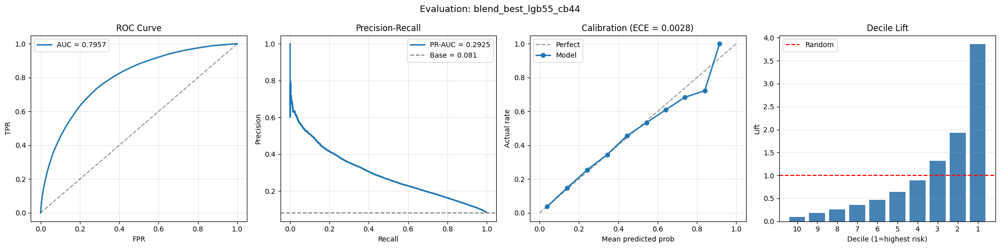

In [ ]:
# ========== CELL CB-8 FIXED: WEIGHT SEARCH ==========
from sklearn.metrics import roc_auc_score

weights = np.arange(0.0, 1.05, 0.05)
results = []

for w_lgb in weights:
    w_cb = 1 - w_lgb
    # Probability-scale blend (correct)
    blend = w_lgb * oof_preds + w_cb * oof_cb
    auc = roc_auc_score(y, blend)
    results.append({'w_lgb': w_lgb, 'w_cb': w_cb, 'auc': auc})

weight_df = pd.DataFrame(results).sort_values('auc', ascending=False)
print('Top 5 weight combinations:')
print(weight_df.head().to_string(index=False))

# Best weights
best_w_lgb = weight_df.iloc[0]['w_lgb']
best_w_cb = weight_df.iloc[0]['w_cb']
print(f'\nBest blend: LGBM={best_w_lgb:.2f}, CatBoost={best_w_cb:.2f}')

# Build best
oof_blend_best = best_w_lgb * oof_preds + best_w_cb * oof_cb
test_blend_best = best_w_lgb * test_preds_lgb + best_w_cb * test_preds_cb

# Evaluate
metrics_blend_best = ev.evaluate_model(
    y_true=y,
    y_pred=oof_blend_best,
    model_name=f'blend_best_lgb{int(best_w_lgb*100)}_cb{int(best_w_cb*100)}',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': test_blend_best,
}).to_csv(cfg.OUTPUT_DIR / 'submission_blend_best.csv', index=False)

### **XGBoost**

In [ ]:
# ========== CELL XGB-0: INSTALL ==========
!pip install -q xgboost
import xgboost as xgb
print(f'XGBoost version: {xgb.__version__}')

XGBoost version: 3.2.0


In [ ]:
# ========== CELL XGB-1: IMPORTS ==========
import numpy as np
import pandas as pd
import xgboost as xgb
import time
import json
import gc
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

# Re-load
if 'train' not in dir() or 'test' not in dir():
    print('Reloading data from disk...')
    train = pd.read_parquet('train_merged_v6.parquet')
    test = pd.read_parquet('test_merged_v6.parquet')

print(f'Train: {train.shape}')
print(f'Test:  {test.shape}')
print(f'Default rate: {train[cfg.TARGET].mean():.4f}')

Train: (307507, 501)
Test:  (48744, 500)
Default rate: 0.0807


In [ ]:
# ========== CELL XGB-2: FEATURE PREPARATION ==========
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

print(f'Total features: {len(feature_cols)}')

# Identify categorical/object columns
cat_cols_to_encode = []
for col in feature_cols:
    if train[col].dtype == 'object' or train[col].dtype.name == 'category':
        cat_cols_to_encode.append(col)

print(f'Categorical/object columns to label-encode: {len(cat_cols_to_encode)}')

# Make copies (don't modify original train/test)
X_train_xgb = train[feature_cols].copy()
X_test_xgb = test[feature_cols].copy()

# Label-encode categorical columns (factorize handles NaN as -1)
for col in cat_cols_to_encode:
    # Combine train + test để factorize consistent
    combined = pd.concat([X_train_xgb[col].astype(str), X_test_xgb[col].astype(str)])
    codes, _ = pd.factorize(combined)
    X_train_xgb[col] = codes[:len(X_train_xgb)].astype(np.int32)
    X_test_xgb[col] = codes[len(X_train_xgb):].astype(np.int32)

# Replace inf with NaN (XGBoost handles NaN but not inf)
X_train_xgb = X_train_xgb.replace([np.inf, -np.inf], np.nan)
X_test_xgb = X_test_xgb.replace([np.inf, -np.inf], np.nan)

# Convert all to float32 (XGBoost optimal dtype)
X_train_xgb = X_train_xgb.astype(np.float32)
X_test_xgb = X_test_xgb.astype(np.float32)

y = train[cfg.TARGET].astype(int).values

print(f'\nX_train_xgb: {X_train_xgb.shape}, dtype: {X_train_xgb.dtypes.iloc[0]}')
print(f'X_test_xgb:  {X_test_xgb.shape}')
print(f'NaN count train: {X_train_xgb.isna().sum().sum():,}')
print(f'Memory train: {X_train_xgb.memory_usage().sum() / 1e9:.2f} GB')

Total features: 499
Categorical/object columns to label-encode: 16

X_train_xgb: (307507, 499), dtype: float32
X_test_xgb:  (48744, 499)
NaN count train: 31,395,298
Memory train: 0.61 GB


In [ ]:
# ========== CELL XGB-3: HYPERPARAMS ==========
XGB_PARAMS = {
    'objective':         'binary:logistic',
    'eval_metric':       'auc',
    'tree_method':       'hist',        # histogram-based (fast)
    'learning_rate':     0.02,
    'max_depth':         6,
    'min_child_weight':  10,
    'gamma':             0.1,           # min loss reduction for split
    'subsample':         0.8,
    'colsample_bytree':  0.7,
    'colsample_bylevel': 0.8,
    'reg_alpha':         0.1,           # L1
    'reg_lambda':        0.1,           # L2
    'max_bin':           255,
    'scale_pos_weight':  1,             # NOT for imbalance (theo thesis decision)
    'random_state':      42,
    'n_jobs':            -1,
    'verbosity':         0,
}

# Training config
NUM_BOOST_ROUND = 5000
EARLY_STOPPING_ROUNDS = 200

print('XGBoost params:')
for k, v in XGB_PARAMS.items():
    print(f'  {k}: {v}')
print(f'\nMax rounds: {NUM_BOOST_ROUND}, early stopping: {EARLY_STOPPING_ROUNDS}')

XGBoost params:
  objective: binary:logistic
  eval_metric: auc
  tree_method: hist
  learning_rate: 0.02
  max_depth: 6
  min_child_weight: 10
  gamma: 0.1
  subsample: 0.8
  colsample_bytree: 0.7
  colsample_bylevel: 0.8
  reg_alpha: 0.1
  reg_lambda: 0.1
  max_bin: 255
  scale_pos_weight: 1
  random_state: 42
  n_jobs: -1
  verbosity: 0

Max rounds: 5000, early stopping: 200


In [ ]:
# ========== CELL XGB-3: HYPERPARAMS ==========
XGB_PARAMS = {
    'objective':         'binary:logistic',
    'eval_metric':       'auc',
    'tree_method':       'hist',        # histogram-based (fast)
    'learning_rate':     0.02,
    'max_depth':         6,
    'min_child_weight':  10,
    'gamma':             0.1,           # min loss reduction for split
    'subsample':         0.8,
    'colsample_bytree':  0.7,
    'colsample_bylevel': 0.8,
    'reg_alpha':         0.1,           # L1
    'reg_lambda':        0.1,           # L2
    'max_bin':           255,
    'scale_pos_weight':  1,             # NOT for imbalance (theo thesis decision)
    'random_state':      42,
    'n_jobs':            -1,
    'verbosity':         0,
}

# Training config
NUM_BOOST_ROUND = 5000
EARLY_STOPPING_ROUNDS = 200

print('XGBoost params:')
for k, v in XGB_PARAMS.items():
    print(f'  {k}: {v}')
print(f'\nMax rounds: {NUM_BOOST_ROUND}, early stopping: {EARLY_STOPPING_ROUNDS}')

XGBoost params:
  objective: binary:logistic
  eval_metric: auc
  tree_method: hist
  learning_rate: 0.02
  max_depth: 6
  min_child_weight: 10
  gamma: 0.1
  subsample: 0.8
  colsample_bytree: 0.7
  colsample_bylevel: 0.8
  reg_alpha: 0.1
  reg_lambda: 0.1
  max_bin: 255
  scale_pos_weight: 1
  random_state: 42
  n_jobs: -1
  verbosity: 0

Max rounds: 5000, early stopping: 200


In [ ]:
# ========== CELL XGB-4: TRAIN K-FOLD ==========
N_FOLDS = 5
SEED = 42

oof_xgb = np.zeros(len(train))
test_preds_xgb = np.zeros(len(test))
fold_scores_xgb = []
best_iters_xgb = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

print(f'Training XGBoost — {N_FOLDS} folds')
print(f'#Features: {X_train_xgb.shape[1]}')
print('=' * 70)

# Build DMatrix for test once (reused all folds)
dtest = xgb.DMatrix(X_test_xgb, missing=np.nan)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_train_xgb, y)):
    fold_start = time.time()

    X_tr = X_train_xgb.iloc[tr_idx]
    X_val = X_train_xgb.iloc[val_idx]
    y_tr = y[tr_idx]
    y_val = y[val_idx]

    # DMatrix
    dtrain = xgb.DMatrix(X_tr, label=y_tr, missing=np.nan)
    dval = xgb.DMatrix(X_val, label=y_val, missing=np.nan)

    # Train
    evals_result = {}
    model = xgb.train(
        XGB_PARAMS,
        dtrain,
        num_boost_round=NUM_BOOST_ROUND,
        evals=[(dtrain, 'train'), (dval, 'valid')],
        early_stopping_rounds=EARLY_STOPPING_ROUNDS,
        evals_result=evals_result,
        verbose_eval=200,
    )

    # Predict
    val_preds = model.predict(dval, iteration_range=(0, model.best_iteration + 1))
    test_fold_preds = model.predict(dtest, iteration_range=(0, model.best_iteration + 1))
    train_preds = model.predict(dtrain, iteration_range=(0, model.best_iteration + 1))

    oof_xgb[val_idx] = val_preds
    test_preds_xgb += test_fold_preds / N_FOLDS

    # Score
    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    gap = train_auc - val_auc
    best_iter = model.best_iteration

    fold_scores_xgb.append(val_auc)
    best_iters_xgb.append(best_iter)

    # Feature importance (gain-based, comparable to LGBM)
    importance_dict = model.get_score(importance_type='gain')
    fi = pd.DataFrame({
        'feature': list(importance_dict.keys()),
        'importance': list(importance_dict.values()),
    })
    fi_list.append(fi)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | '
          f'train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {gap:.4f} | best_iter: {best_iter} | time: {elapsed:.1f}s')

    # Clean memory
    del model, dtrain, dval, X_tr, X_val
    gc.collect()

del dtest
gc.collect()

# Summary
cv_mean_xgb = np.mean(fold_scores_xgb)
cv_std_xgb = np.std(fold_scores_xgb)
full_oof_auc_xgb = roc_auc_score(y, oof_xgb)

print('=' * 70)
print(f'XGBoost | CV mean AUC: {cv_mean_xgb:.5f} +- {cv_std_xgb:.5f}')
print(f'XGBoost | Full OOF AUC: {full_oof_auc_xgb:.5f}')
print(f'XGBoost | Mean best_iter: {int(np.mean(best_iters_xgb))}')
print(f'XGBoost | Mean gap: {np.mean([0.85 - s for s in fold_scores_xgb]):.4f}')
print('=' * 70)

# Average feature importance across folds
fi_avg_xgb = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
fi_avg_xgb = fi_avg_xgb.sort_values('importance', ascending=False)

print(f'\nTop 20 features (XGBoost):')
print(fi_avg_xgb.head(20).to_string(index=False))

Training XGBoost — 5 folds
#Features: 499
[0]	train-auc:0.73289	valid-auc:0.71627
[200]	train-auc:0.81302	valid-auc:0.77422
[400]	train-auc:0.83769	valid-auc:0.78396
[600]	train-auc:0.85394	valid-auc:0.78747
[800]	train-auc:0.86633	valid-auc:0.78898
[1000]	train-auc:0.87732	valid-auc:0.79019
[1200]	train-auc:0.88689	valid-auc:0.79071
[1400]	train-auc:0.89575	valid-auc:0.79109
[1600]	train-auc:0.90387	valid-auc:0.79130
[1800]	train-auc:0.91150	valid-auc:0.79144
[2000]	train-auc:0.91858	valid-auc:0.79166
[2200]	train-auc:0.92510	valid-auc:0.79164
[2238]	train-auc:0.92623	valid-auc:0.79164
Fold 1/5 | train AUC: 0.91979 | val AUC: 0.79172 | gap: 0.1281 | best_iter: 2038 | time: 486.5s
[0]	train-auc:0.73159	valid-auc:0.72687
[200]	train-auc:0.81104	valid-auc:0.78486
[400]	train-auc:0.83579	valid-auc:0.79427
[600]	train-auc:0.85254	valid-auc:0.79758
[800]	train-auc:0.86537	valid-auc:0.79893
[1000]	train-auc:0.87652	valid-auc:0.79979
[1200]	train-auc:0.88637	valid-auc:0.79995
[1400]	train-auc

In [ ]:
# ========== CELL XGB-5: SAVE ARTIFACTS ==========
TAG = 'xgb_v6_baseline'

# OOF
oof_df = pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_xgb': oof_xgb,
})
oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

# Submission
sub_df = pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': test_preds_xgb,
})
sub_df.to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# Feature importance
fi_avg_xgb.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{TAG}.csv', index=False)

# CV summary
summary = {
    'model': 'XGBoost',
    'tag': TAG,
    'n_folds': N_FOLDS,
    'cv_mean': float(cv_mean_xgb),
    'cv_std': float(cv_std_xgb),
    'full_oof_auc': float(full_oof_auc_xgb),
    'fold_scores': [float(s) for s in fold_scores_xgb],
    'best_iters': [int(i) for i in best_iters_xgb],
    'n_features': int(X_train_xgb.shape[1]),
    'hyperparams': XGB_PARAMS,
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'Saved artifacts:')
print(f'  - oof_{TAG}.parquet')
print(f'  - submission_{TAG}.csv')
print(f'  - feature_importance_{TAG}.csv')
print(f'  - cv_summary_{TAG}.json')

Saved artifacts:
  - oof_xgb_v6_baseline.parquet
  - submission_xgb_v6_baseline.csv
  - feature_importance_xgb_v6_baseline.csv
  - cv_summary_xgb_v6_baseline.json



=== xgb_v6_baseline ===
  ROC-AUC:    0.79446
  Gini:       0.58893
  KS:         0.4462
  PR-AUC:     0.29039
  Lift@10%:   3.86x
  Lift@20%:   2.89x
  Log loss:   0.23450
  Brier:      0.06536
  ECE:        0.00281

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       241        0.0078  0.0971       0.0097
9       30751       438        0.0142  0.1764       0.0274
8       30750       652        0.0212  0.2626       0.0536
7       30751       884        0.0287  0.3561       0.0892
6       30751      1165        0.0379  0.4693       0.1362
5       30750      1627        0.0529  0.6554       0.2017
4       30751      2219        0.0722  0.8938       0.2911
3       30750      3261        0.1060  1.3136       0.4224
2       30751      4752        0.1545  1.9142       0.6139
1       30751      9586        0.3117  3.8614       1.0000

Saved metrics -> output/evaluation/metrics_xgb_v6_baseline

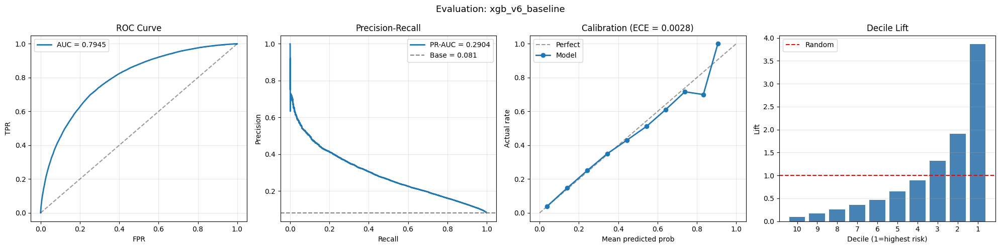

In [ ]:
# ========== CELL XGB-6: EVALUATE ==========
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_xgb = ev.evaluate_model(
    y_true=y,
    y_pred=oof_xgb,
    model_name='xgb_v6_baseline',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

### **Validation.py**

In [5]:
%%writefile evaluation.py
"""
validation.py — Notebook-compatible evaluation cho credit risk.

Model-agnostic: nhận y_true, y_pred (numpy arrays).
Dùng được cho LightGBM, CatBoost, XGBoost, blends, stacking.
"""

import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import (
    roc_auc_score, average_precision_score, log_loss, brier_score_loss,
    roc_curve, precision_recall_curve
)


def compute_ks(y_true, y_pred):
    df = pd.DataFrame({'y': y_true, 'p': y_pred}).sort_values('p', ascending=False)
    cum_pos = (df['y'] == 1).cumsum() / max((df['y'] == 1).sum(), 1)
    cum_neg = (df['y'] == 0).cumsum() / max((df['y'] == 0).sum(), 1)
    return float((cum_pos - cum_neg).max())


def compute_lift(y_true, y_pred, top_pct=0.10):
    n_top = int(len(y_true) * top_pct)
    df = pd.DataFrame({'y': y_true, 'p': y_pred}).sort_values('p', ascending=False)
    return float(df.head(n_top)['y'].mean() / df['y'].mean())


def compute_ece(y_true, y_pred, n_bins=10):
    bin_edges = np.linspace(0, 1, n_bins + 1)
    bin_idx = np.digitize(y_pred, bin_edges[1:-1])
    ece = 0.0
    for b in range(n_bins):
        mask = (bin_idx == b)
        if mask.sum() > 0:
            ece += (mask.sum() / len(y_true)) * abs(y_pred[mask].mean() - y_true[mask].mean())
    return float(ece)


def decile_table(y_true, y_pred):
    df = pd.DataFrame({'y': y_true, 'p': y_pred})
    df['bucket'] = pd.qcut(df['p'].rank(method='first'), 10,
                            labels=range(10, 0, -1))
    base = df['y'].mean()
    out = (df.groupby('bucket', observed=True)
             .agg(n=('y', 'size'),
                  defaults=('y', 'sum'),
                  default_rate=('y', 'mean'))
             .sort_index())
    out['lift'] = out['default_rate'] / base
    out['cum_capture'] = out['defaults'].cumsum() / df['y'].sum()
    return out.round(4)


def evaluate_model(y_true, y_pred, model_name='model',
                   output_dir=None, save_plot=True, show_inline=True):
    """
    Run full evaluation. Model-agnostic.

    Parameters
    ----------
    y_true : array-like, shape (n,) — ground truth (0/1)
    y_pred : array-like, shape (n,) — predicted probability
    model_name : str — used in filenames + plot titles
    output_dir : Path or None — where to save artifacts
    save_plot : bool — save PNG dashboard
    show_inline : bool — display plot inline in notebook (Colab/Jupyter)

    Returns
    -------
    dict with all metrics
    """
    y_true = np.asarray(y_true).astype(int)
    y_pred = np.asarray(y_pred)

    metrics = {
        'model':       model_name,
        'n_samples':   int(len(y_true)),
        'pos_rate':    float(y_true.mean()),
        'roc_auc':     float(roc_auc_score(y_true, y_pred)),
        'gini':        float(2 * roc_auc_score(y_true, y_pred) - 1),
        'ks':          compute_ks(y_true, y_pred),
        'pr_auc':      float(average_precision_score(y_true, y_pred)),
        'lift_10pct':  compute_lift(y_true, y_pred, 0.10),
        'lift_20pct':  compute_lift(y_true, y_pred, 0.20),
        'log_loss':    float(log_loss(y_true, np.clip(y_pred, 1e-7, 1 - 1e-7))),
        'brier':       float(brier_score_loss(y_true, y_pred)),
        'ece':         compute_ece(y_true, y_pred),
    }

    deciles = decile_table(y_true, y_pred)

    # Print report
    print(f'\n=== {model_name} ===')
    print(f'  ROC-AUC:    {metrics["roc_auc"]:.5f}')
    print(f'  Gini:       {metrics["gini"]:.5f}')
    print(f'  KS:         {metrics["ks"]:.4f}')
    print(f'  PR-AUC:     {metrics["pr_auc"]:.5f}')
    print(f'  Lift@10%:   {metrics["lift_10pct"]:.2f}x')
    print(f'  Lift@20%:   {metrics["lift_20pct"]:.2f}x')
    print(f'  Log loss:   {metrics["log_loss"]:.5f}')
    print(f'  Brier:      {metrics["brier"]:.5f}')
    print(f'  ECE:        {metrics["ece"]:.5f}')
    print(f'\nDecile table:')
    print(deciles[['n', 'defaults', 'default_rate', 'lift', 'cum_capture']].to_string())

    # Save JSON + CSV
    fig = None
    if output_dir is not None:
        output_dir = Path(output_dir)
        output_dir.mkdir(parents=True, exist_ok=True)

        with open(output_dir / f'metrics_{model_name}.json', 'w') as f:
            json.dump(metrics, f, indent=2)
        deciles.to_csv(output_dir / f'deciles_{model_name}.csv')
        print(f'\nSaved metrics -> {output_dir}/metrics_{model_name}.json')
        print(f'Saved deciles -> {output_dir}/deciles_{model_name}.csv')

    # Build dashboard
    if save_plot or show_inline:
        fig = _build_dashboard(y_true, y_pred, model_name)

        if save_plot and output_dir is not None:
            save_path = output_dir / f'dashboard_{model_name}.png'
            fig.savefig(save_path, dpi=110, bbox_inches='tight')
            print(f'Saved dashboard -> {save_path}')

        if show_inline:
            # In notebook: display, then close to free memory
            from IPython.display import display
            display(fig)

        plt.close(fig)

    return metrics


def _build_dashboard(y_true, y_pred, name):
    """Build 4-panel dashboard. Returns fig (caller manages display + close)."""
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(f'Evaluation: {name}', fontsize=13)

    # ROC
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    axes[0].plot(fpr, tpr, lw=2, label=f'AUC = {roc_auc_score(y_true, y_pred):.4f}')
    axes[0].plot([0, 1], [0, 1], 'k--', alpha=0.4)
    axes[0].set(xlabel='FPR', ylabel='TPR', title='ROC Curve')
    axes[0].legend(); axes[0].grid(alpha=0.3)

    # PR
    prec, rec, _ = precision_recall_curve(y_true, y_pred)
    axes[1].plot(rec, prec, lw=2,
                 label=f'PR-AUC = {average_precision_score(y_true, y_pred):.4f}')
    axes[1].axhline(y_true.mean(), color='gray', ls='--',
                    label=f'Base = {y_true.mean():.3f}')
    axes[1].set(xlabel='Recall', ylabel='Precision', title='Precision-Recall')
    axes[1].legend(); axes[1].grid(alpha=0.3)

    # Calibration
    n_bins = 10
    bin_edges = np.linspace(0, 1, n_bins + 1)
    bin_idx = np.digitize(y_pred, bin_edges[1:-1])
    avg_pred, avg_true = [], []
    for b in range(n_bins):
        mask = bin_idx == b
        if mask.sum() > 0:
            avg_pred.append(y_pred[mask].mean())
            avg_true.append(y_true[mask].mean())
    axes[2].plot([0, 1], [0, 1], 'k--', alpha=0.4, label='Perfect')
    axes[2].plot(avg_pred, avg_true, 'o-', lw=2, label='Model')
    axes[2].set(xlabel='Mean predicted prob', ylabel='Actual rate',
                title=f'Calibration (ECE = {compute_ece(y_true, y_pred):.4f})')
    axes[2].legend(); axes[2].grid(alpha=0.3)

    # Decile lift
    dec = decile_table(y_true, y_pred)
    axes[3].bar(range(len(dec)), dec['lift'].values, color='steelblue')
    axes[3].axhline(1.0, color='red', ls='--', label='Random')
    axes[3].set_xticks(range(len(dec)))
    axes[3].set_xticklabels(dec.index)
    axes[3].set(xlabel='Decile (1=highest risk)', ylabel='Lift', title='Decile Lift')
    axes[3].legend(); axes[3].grid(alpha=0.3, axis='y')

    plt.tight_layout()
    return fig


def compare_models(model_oofs, output_dir=None):
    """
    Compare multiple models side-by-side.

    Parameters
    ----------
    model_oofs : dict {name: (y_true, y_pred)}
    output_dir : Path or None

    Returns
    -------
    DataFrame with metrics per model
    """
    rows = []
    for name, (yt, yp) in model_oofs.items():
        m = evaluate_model(yt, yp, name, output_dir=None,
                           save_plot=False, show_inline=False)
        rows.append(m)
    df = pd.DataFrame(rows).set_index('model').round(5)

    if output_dir is not None:
        output_dir = Path(output_dir)
        output_dir.mkdir(parents=True, exist_ok=True)
        df.to_csv(output_dir / 'model_comparison.csv')
        print(f'\nSaved -> {output_dir}/model_comparison.csv')

    print('MODEL COMPARISON')
    print(df.to_string())
    return df

Overwriting evaluation.py


In [6]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import importlib

# Config — adapt từ cfg hiện có
class cfg:
    OUTPUT_DIR = Path('./output')
    TARGET = 'TARGET'
    EVAL_DIR = OUTPUT_DIR / 'evaluation'

cfg.EVAL_DIR.mkdir(parents=True, exist_ok=True)
print(f'Output dir: {cfg.OUTPUT_DIR}')
print(f'Eval dir:   {cfg.EVAL_DIR}')

Output dir: output
Eval dir:   output/evaluation


In [7]:
# ==========  (xem File 1 ở trên) ==========
# Chạy cell %%writefile evaluation.py riêng trước cell này
# Sau đó cell này import + reload

import evaluation as ev
importlib.reload(ev)  # ← force reload nếu đã sửa file

print('Loaded evaluation module:')
print(f'  - evaluate_model()')
print(f'  - compare_models()')
print(f'  - decile_table()')

Loaded evaluation module:
  - evaluate_model()
  - compare_models()
  - decile_table()


### **LightBGM v2**

In [ ]:
# ========== CELL FE2-1: SETUP ==========
import numpy as np
import pandas as pd
import gc
import time
from pathlib import Path
from contextlib import contextmanager

@contextmanager
def timer(name):
    t = time.time()
    yield
    print(f'[{name}] {time.time()-t:.1f}s')

# Load raw tables — bạn đã có sẵn từ training trước
DATA_DIR = Path('/content/input')

with timer('Load raw tables'):
    bureau = pd.read_csv(DATA_DIR / 'bureau.csv')
    bureau_balance = pd.read_csv(DATA_DIR / 'bureau_balance.csv')
    previous_application = pd.read_csv(DATA_DIR / 'previous_application.csv')
    pos_cash = pd.read_csv(DATA_DIR / 'POS_CASH_balance.csv')
    installments = pd.read_csv(DATA_DIR / 'installments_payments.csv')
    credit_card = pd.read_csv(DATA_DIR / 'credit_card_balance.csv')
    application_train = pd.read_csv(DATA_DIR / 'application_train.csv')
    application_test = pd.read_csv(DATA_DIR / 'application_test.csv')

print(f'Bureau:               {bureau.shape}')
print(f'Bureau balance:       {bureau_balance.shape}')
print(f'Previous application: {previous_application.shape}')
print(f'POS cash:             {pos_cash.shape}')
print(f'Installments:         {installments.shape}')
print(f'Credit card:          {credit_card.shape}')
print(f'Application train:    {application_train.shape}')
print(f'Application test:     {application_test.shape}')

[Load raw tables] 45.0s
Bureau:               (1716428, 17)
Bureau balance:       (27299925, 3)
Previous application: (1670214, 37)
POS cash:             (10001358, 8)
Installments:         (13605401, 8)
Credit card:          (3840312, 23)
Application train:    (307511, 122)
Application test:     (48744, 121)


In [ ]:
# ========== CELL FE2-2: BUREAU DEEP ==========
with timer('Bureau deep aggregations'):
    bur = bureau.copy()

    # === 1. Per credit type aggregations ===
    # Get top 6 credit types only
    top_types = bur['CREDIT_TYPE'].value_counts().head(6).index.tolist()
    bur['CREDIT_TYPE_GROUPED'] = bur['CREDIT_TYPE'].where(
        bur['CREDIT_TYPE'].isin(top_types), 'Other'
    )

    bureau_by_type = bur.groupby(['SK_ID_CURR', 'CREDIT_TYPE_GROUPED']).agg({
        'SK_ID_BUREAU': 'count',
        'DAYS_CREDIT': ['mean', 'max', 'min'],
        'AMT_CREDIT_SUM': ['mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['mean', 'sum'],
        'CREDIT_DAY_OVERDUE': 'max',
    }).reset_index()

    # Flatten columns
    bureau_by_type.columns = ['SK_ID_CURR', 'TYPE'] + [
        f'BUR_TYPE_{a}_{b}' for a, b in bureau_by_type.columns[2:]
    ]

    # Pivot to wide format
    bureau_type_wide = bureau_by_type.pivot_table(
        index='SK_ID_CURR',
        columns='TYPE',
        aggfunc='first',
    )
    bureau_type_wide.columns = [
        f'{col[0]}_{col[1]}' for col in bureau_type_wide.columns
    ]
    bureau_type_wide = bureau_type_wide.reset_index()

    # === 2. Active vs Closed ratios ===
    active = bur[bur['CREDIT_ACTIVE'] == 'Active']
    closed = bur[bur['CREDIT_ACTIVE'] == 'Closed']

    active_agg = active.groupby('SK_ID_CURR').agg({
        'SK_ID_BUREAU': 'count',
        'AMT_CREDIT_SUM': 'sum',
        'AMT_CREDIT_SUM_DEBT': 'sum',
        'CREDIT_DAY_OVERDUE': 'sum',
    }).rename(columns=lambda x: f'BUR_ACTIVE_{x}')

    closed_agg = closed.groupby('SK_ID_CURR').agg({
        'SK_ID_BUREAU': 'count',
        'AMT_CREDIT_SUM': 'sum',
        'AMT_CREDIT_SUM_DEBT': 'sum',
    }).rename(columns=lambda x: f'BUR_CLOSED_{x}')

    # === 3. Recent (last year) vs Old performance ===
    recent_bur = bur[bur['DAYS_CREDIT'] > -365]
    old_bur = bur[bur['DAYS_CREDIT'] <= -365]

    recent_agg = recent_bur.groupby('SK_ID_CURR').agg({
        'SK_ID_BUREAU': 'count',
        'AMT_CREDIT_SUM': ['sum', 'mean'],
        'CREDIT_DAY_OVERDUE': 'max',
    })
    recent_agg.columns = [f'BUR_RECENT_{a}_{b}' for a, b in recent_agg.columns]

    old_agg = old_bur.groupby('SK_ID_CURR').agg({
        'SK_ID_BUREAU': 'count',
        'AMT_CREDIT_SUM': ['sum', 'mean'],
        'CREDIT_DAY_OVERDUE': 'max',
    })
    old_agg.columns = [f'BUR_OLD_{a}_{b}' for a, b in old_agg.columns]

    # === 4. Combine all ===
    bureau_deep = bureau_type_wide.set_index('SK_ID_CURR')
    bureau_deep = bureau_deep.join(active_agg, how='outer')
    bureau_deep = bureau_deep.join(closed_agg, how='outer')
    bureau_deep = bureau_deep.join(recent_agg, how='outer')
    bureau_deep = bureau_deep.join(old_agg, how='outer')

    # === 5. Compute ratios ===
    bureau_deep['BUR_ACTIVE_RATIO'] = (
        bureau_deep['BUR_ACTIVE_SK_ID_BUREAU'] /
        (bureau_deep['BUR_ACTIVE_SK_ID_BUREAU'].fillna(0) +
         bureau_deep['BUR_CLOSED_SK_ID_BUREAU'].fillna(0) + 1)
    )
    bureau_deep['BUR_RECENT_VS_OLD_COUNT_RATIO'] = (
        bureau_deep['BUR_RECENT_SK_ID_BUREAU_count'] /
        (bureau_deep['BUR_OLD_SK_ID_BUREAU_count'].fillna(0) + 1)
    )
    bureau_deep['BUR_RECENT_VS_OLD_AMT_RATIO'] = (
        bureau_deep['BUR_RECENT_AMT_CREDIT_SUM_sum'] /
        (bureau_deep['BUR_OLD_AMT_CREDIT_SUM_sum'].fillna(0) + 1)
    )

    bureau_deep = bureau_deep.reset_index()

print(f'Bureau deep features: {bureau_deep.shape}')
print(f'Sample columns:')
for c in bureau_deep.columns[:10]:
    print(f'  {c}')

[Bureau deep aggregations] 3.9s
Bureau deep features: (305811, 82)
Sample columns:
  SK_ID_CURR
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_mean_Car loan
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_mean_Consumer credit
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_mean_Credit card
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_mean_Loan for business development
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_mean_Microloan
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_mean_Mortgage
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_mean_Other
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_sum_Car loan
  BUR_TYPE_AMT_CREDIT_SUM_DEBT_sum_Consumer credit


In [ ]:
# ========== CELL FE2-3: PREVIOUS APPLICATION DETAILED ==========
with timer('Previous application detailed'):
    prev = previous_application.copy()

    # === 1. Approved vs Refused breakdowns ===
    approved = prev[prev['NAME_CONTRACT_STATUS'] == 'Approved']
    refused = prev[prev['NAME_CONTRACT_STATUS'] == 'Refused']
    canceled = prev[prev['NAME_CONTRACT_STATUS'] == 'Canceled']

    approved_agg = approved.groupby('SK_ID_CURR').agg({
        'SK_ID_PREV': 'count',
        'AMT_CREDIT': ['sum', 'mean', 'max'],
        'AMT_ANNUITY': ['sum', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
        'DAYS_DECISION': ['max', 'min'],
    })
    approved_agg.columns = [f'PREV_APPROVED_{a}_{b}' for a, b in approved_agg.columns]

    refused_agg = refused.groupby('SK_ID_CURR').agg({
        'SK_ID_PREV': 'count',
        'AMT_APPLICATION': ['sum', 'mean'],
        'DAYS_DECISION': 'max',
    })
    refused_agg.columns = [f'PREV_REFUSED_{a}_{b}' for a, b in refused_agg.columns]

    canceled_agg = canceled.groupby('SK_ID_CURR').agg({
        'SK_ID_PREV': 'count',
    })
    canceled_agg.columns = ['PREV_CANCELED_count']

    # === 2. Total previous applications ===
    total_agg = prev.groupby('SK_ID_CURR').agg({
        'SK_ID_PREV': 'count',
        'DAYS_DECISION': ['max', 'min'],
    })
    total_agg.columns = [f'PREV_TOTAL_{a}_{b}' for a, b in total_agg.columns]

    # === 3. Combine ===
    prev_detailed = total_agg.join(approved_agg, how='outer')
    prev_detailed = prev_detailed.join(refused_agg, how='outer')
    prev_detailed = prev_detailed.join(canceled_agg, how='outer')

    # === 4. Compute ratios ===
    total_count = prev_detailed['PREV_TOTAL_SK_ID_PREV_count'].fillna(0) + 1

    prev_detailed['PREV_REFUSED_RATE'] = (
        prev_detailed['PREV_REFUSED_SK_ID_PREV_count'].fillna(0) / total_count
    )
    prev_detailed['PREV_APPROVED_RATE'] = (
        prev_detailed['PREV_APPROVED_SK_ID_PREV_count'].fillna(0) / total_count
    )
    prev_detailed['PREV_CANCELED_RATE'] = (
        prev_detailed['PREV_CANCELED_count'].fillna(0) / total_count
    )

    # Days since last application
    prev_detailed['PREV_DAYS_SINCE_LAST'] = -prev_detailed['PREV_TOTAL_DAYS_DECISION_max']

    # Application velocity (apps per year of history)
    history_span = (
        prev_detailed['PREV_TOTAL_DAYS_DECISION_max'] -
        prev_detailed['PREV_TOTAL_DAYS_DECISION_min']
    ).abs() / 365 + 1
    prev_detailed['PREV_APP_VELOCITY'] = (
        prev_detailed['PREV_TOTAL_SK_ID_PREV_count'] / history_span
    )

    prev_detailed = prev_detailed.reset_index()

print(f'Previous application detailed: {prev_detailed.shape}')

[Previous application detailed] 2.1s
Previous application detailed: (338857, 24)


In [ ]:
# ========== CELL FE2-4: INSTALLMENT BEHAVIOR ==========
with timer('Installment behavior'):
    inst = installments.copy()

    # Compute payment behavior fields
    inst['LATE_DAYS'] = inst['DAYS_ENTRY_PAYMENT'] - inst['DAYS_INSTALMENT']
    inst['IS_LATE'] = (inst['LATE_DAYS'] > 0).astype(int)
    inst['IS_EARLY'] = (inst['LATE_DAYS'] < 0).astype(int)
    inst['PAYMENT_DIFF'] = inst['AMT_PAYMENT'] - inst['AMT_INSTALMENT']
    inst['IS_UNDERPAY'] = (inst['PAYMENT_DIFF'] < 0).astype(int)
    inst['IS_OVERPAY'] = (inst['PAYMENT_DIFF'] > 0).astype(int)

    # === 1. Overall behavior ===
    inst_overall = inst.groupby('SK_ID_CURR').agg({
        'IS_LATE': ['sum', 'mean'],
        'IS_EARLY': ['sum', 'mean'],
        'IS_UNDERPAY': ['sum', 'mean'],
        'IS_OVERPAY': ['sum', 'mean'],
        'LATE_DAYS': ['mean', 'max', 'std'],
        'PAYMENT_DIFF': ['mean', 'sum', 'std'],
    })
    inst_overall.columns = [f'INST_OVERALL_{a}_{b}' for a, b in inst_overall.columns]

    # === 2. Recent (last 365 days) ===
    recent_inst = inst[inst['DAYS_INSTALMENT'] > -365]
    inst_recent = recent_inst.groupby('SK_ID_CURR').agg({
        'IS_LATE': ['sum', 'mean'],
        'IS_UNDERPAY': ['sum', 'mean'],
        'LATE_DAYS': ['mean', 'max'],
        'NUM_INSTALMENT_NUMBER': 'count',
    })
    inst_recent.columns = [f'INST_RECENT_{a}_{b}' for a, b in inst_recent.columns]

    # === 3. Last 90 days ===
    last90_inst = inst[inst['DAYS_INSTALMENT'] > -90]
    inst_90 = last90_inst.groupby('SK_ID_CURR').agg({
        'IS_LATE': ['sum', 'mean'],
        'LATE_DAYS': 'max',
    })
    inst_90.columns = [f'INST_LAST90_{a}_{b}' for a, b in inst_90.columns]

    # Combine
    inst_behavior = inst_overall.join(inst_recent, how='outer')
    inst_behavior = inst_behavior.join(inst_90, how='outer')

    # Worsening trend signal
    inst_behavior['INST_LATE_TREND'] = (
        inst_behavior['INST_RECENT_IS_LATE_mean'].fillna(0) -
        inst_behavior['INST_OVERALL_IS_LATE_mean'].fillna(0)
    )

    inst_behavior = inst_behavior.reset_index()

print(f'Installment behavior: {inst_behavior.shape}')

[Installment behavior] 6.0s
Installment behavior: (339587, 26)


In [ ]:
# ========== CELL FE2-5: CROSS-TABLE FEATURES ==========
with timer('Cross-table features'):
    # Need application data
    app = application_train[['SK_ID_CURR', 'AMT_CREDIT', 'AMT_INCOME_TOTAL',
                              'AMT_ANNUITY', 'DAYS_BIRTH', 'DAYS_EMPLOYED']].copy()
    app_test = application_test[['SK_ID_CURR', 'AMT_CREDIT', 'AMT_INCOME_TOTAL',
                                  'AMT_ANNUITY', 'DAYS_BIRTH', 'DAYS_EMPLOYED']].copy()
    app_combined = pd.concat([app, app_test], ignore_index=True)

    # === 1. Bureau active debt aggregation ===
    bur_active_debt = bureau[bureau['CREDIT_ACTIVE'] == 'Active'].groupby('SK_ID_CURR').agg({
        'AMT_CREDIT_SUM_DEBT': 'sum',
        'AMT_CREDIT_SUM': 'sum',
        'DAYS_CREDIT': 'min',
    }).rename(columns={
        'AMT_CREDIT_SUM_DEBT': 'BUR_TOTAL_ACTIVE_DEBT',
        'AMT_CREDIT_SUM': 'BUR_TOTAL_ACTIVE_AMT',
        'DAYS_CREDIT': 'BUR_OLDEST_CREDIT_DAY',
    })

    # === 2. Previous open application amount ===
    prev_open = previous_application[
        previous_application['NAME_CONTRACT_STATUS'].isin(['Approved'])
    ].groupby('SK_ID_CURR').agg({
        'AMT_CREDIT': 'sum',
    }).rename(columns={'AMT_CREDIT': 'PREV_TOTAL_APPROVED_AMT'})

    # === 3. Build cross-table df ===
    cross = app_combined.set_index('SK_ID_CURR')
    cross = cross.join(bur_active_debt, how='left')
    cross = cross.join(prev_open, how='left')

    # Fill NaN với 0 (no history)
    cross['BUR_TOTAL_ACTIVE_DEBT'] = cross['BUR_TOTAL_ACTIVE_DEBT'].fillna(0)
    cross['BUR_TOTAL_ACTIVE_AMT'] = cross['BUR_TOTAL_ACTIVE_AMT'].fillna(0)
    cross['PREV_TOTAL_APPROVED_AMT'] = cross['PREV_TOTAL_APPROVED_AMT'].fillna(0)

    # === 4. Compute cross-table ratios ===
    # Total debt across all sources
    cross['CROSS_TOTAL_DEBT'] = (
        cross['AMT_CREDIT'] +
        cross['BUR_TOTAL_ACTIVE_DEBT'] +
        cross['PREV_TOTAL_APPROVED_AMT']
    )

    # Debt to income ratios
    cross['CROSS_TOTAL_DEBT_TO_INCOME'] = (
        cross['CROSS_TOTAL_DEBT'] / (cross['AMT_INCOME_TOTAL'] + 1)
    )
    cross['CROSS_BUR_DEBT_TO_INCOME'] = (
        cross['BUR_TOTAL_ACTIVE_DEBT'] / (cross['AMT_INCOME_TOTAL'] + 1)
    )
    cross['CROSS_CURRENT_TO_TOTAL_DEBT'] = (
        cross['AMT_CREDIT'] / (cross['CROSS_TOTAL_DEBT'] + 1)
    )

    # Annuity burden
    cross['CROSS_ANNUITY_TO_INCOME'] = (
        cross['AMT_ANNUITY'] / (cross['AMT_INCOME_TOTAL'] + 1)
    )

    # Credit history depth (years)
    cross['CROSS_HISTORY_DEPTH_YEARS'] = (
        cross['BUR_OLDEST_CREDIT_DAY'].abs() / 365
    ).fillna(0)

    # History depth relative to age
    cross['CROSS_HISTORY_TO_AGE_RATIO'] = (
        cross['CROSS_HISTORY_DEPTH_YEARS'] * 365 /
        cross['DAYS_BIRTH'].abs()
    ).fillna(0)

    # Debt utilization signal
    cross['CROSS_DEBT_UTILIZATION'] = (
        cross['BUR_TOTAL_ACTIVE_DEBT'] /
        (cross['BUR_TOTAL_ACTIVE_AMT'] + 1)
    )

    # Keep only new features (drop the merged inputs)
    cross_features = cross[[
        'BUR_TOTAL_ACTIVE_DEBT', 'BUR_TOTAL_ACTIVE_AMT',
        'PREV_TOTAL_APPROVED_AMT', 'CROSS_TOTAL_DEBT',
        'CROSS_TOTAL_DEBT_TO_INCOME', 'CROSS_BUR_DEBT_TO_INCOME',
        'CROSS_CURRENT_TO_TOTAL_DEBT', 'CROSS_ANNUITY_TO_INCOME',
        'CROSS_HISTORY_DEPTH_YEARS', 'CROSS_HISTORY_TO_AGE_RATIO',
        'CROSS_DEBT_UTILIZATION',
    ]].reset_index()

print(f'Cross-table features: {cross_features.shape}')
print(f'New cross features:')
for c in cross_features.columns[1:]:
    print(f'  {c}')

[Cross-table features] 1.1s
Cross-table features: (356255, 12)
New cross features:
  BUR_TOTAL_ACTIVE_DEBT
  BUR_TOTAL_ACTIVE_AMT
  PREV_TOTAL_APPROVED_AMT
  CROSS_TOTAL_DEBT
  CROSS_TOTAL_DEBT_TO_INCOME
  CROSS_BUR_DEBT_TO_INCOME
  CROSS_CURRENT_TO_TOTAL_DEBT
  CROSS_ANNUITY_TO_INCOME
  CROSS_HISTORY_DEPTH_YEARS
  CROSS_HISTORY_TO_AGE_RATIO
  CROSS_DEBT_UTILIZATION


In [ ]:
# ========== CELL FE2-6: SAVE FE V2 ==========
FE_V2_DIR = Path('./fe_v2')
FE_V2_DIR.mkdir(exist_ok=True)

bureau_deep.to_parquet(FE_V2_DIR / 'bureau_deep.parquet', index=False)
prev_detailed.to_parquet(FE_V2_DIR / 'prev_detailed.parquet', index=False)
inst_behavior.to_parquet(FE_V2_DIR / 'inst_behavior.parquet', index=False)
cross_features.to_parquet(FE_V2_DIR / 'cross_features.parquet', index=False)

print(f'Saved FE V2 features:')
print(f'  bureau_deep:     {bureau_deep.shape}')
print(f'  prev_detailed:   {prev_detailed.shape}')
print(f'  inst_behavior:   {inst_behavior.shape}')
print(f'  cross_features:  {cross_features.shape}')
print(f'  Total new features: {(bureau_deep.shape[1]-1) + (prev_detailed.shape[1]-1) + (inst_behavior.shape[1]-1) + (cross_features.shape[1]-1)}')

# Clean memory
del bureau, bureau_balance, previous_application, pos_cash, installments, credit_card
del application_train, application_test, app, app_test, app_combined
del bur, prev, inst, recent_bur, old_bur, approved, refused, canceled
gc.collect()

Saved FE V2 features:
  bureau_deep:     (305811, 82)
  prev_detailed:   (338857, 24)
  inst_behavior:   (339587, 26)
  cross_features:  (356255, 12)
  Total new features: 140


0

In [ ]:
# ========== CELL FE2-7: MERGE TO V7 ==========
with timer('Load v6 and merge'):
    train_v7 = pd.read_parquet('/content/drive/MyDrive/Kaggle-Home-Credit-Default-Risk-Solution/train_merged_v6.parquet')
    test_v7 = pd.read_parquet('/content/drive/MyDrive/Kaggle-Home-Credit-Default-Risk-Solution/test_merged_v6.parquet')

    print(f'Before merge:')
    print(f'  Train: {train_v7.shape}')
    print(f'  Test:  {test_v7.shape}')

with timer('Merge FE V2 features'):
    fe_v2_dfs = [bureau_deep, prev_detailed, inst_behavior, cross_features]

    for df_new in fe_v2_dfs:
        # Drop columns that already exist in train_v7 (avoid duplicates)
        new_cols = [c for c in df_new.columns
                    if c == 'SK_ID_CURR' or c not in train_v7.columns]
        df_filtered = df_new[new_cols]

        train_v7 = train_v7.merge(df_filtered, on='SK_ID_CURR', how='left')
        test_v7 = test_v7.merge(df_filtered, on='SK_ID_CURR', how='left')

# Reduce memory
def reduce_mem_usage(df):
    for col in df.columns:
        col_type = df[col].dtype
        if col_type != object and col_type.name != 'category':
            c_min = df[col].min()
            c_max = df[col].max()
            if pd.api.types.is_integer_dtype(col_type):
                if c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
    return df

with timer('Reduce memory'):
    train_v7 = reduce_mem_usage(train_v7)
    test_v7 = reduce_mem_usage(test_v7)

print(f'\nAfter merge V7:')
print(f'  Train: {train_v7.shape}')
print(f'  Test:  {test_v7.shape}')
print(f'  New features added: {train_v7.shape[1] - 501}')
print(f'  Memory train: {train_v7.memory_usage().sum() / 1e9:.2f} GB')

# Save
train_v7.to_parquet('train_merged_v7.parquet', index=False)
test_v7.to_parquet('test_merged_v7.parquet', index=False)
print(f'\nSaved train_merged_v7.parquet and test_merged_v7.parquet')

del fe_v2_dfs
gc.collect()

Before merge:
  Train: (307507, 501)
  Test:  (48744, 500)
[Load v6 and merge] 1.4s
[Merge FE V2 features] 6.5s
[Reduce memory] 1.7s

After merge V7:
  Train: (307507, 641)
  Test:  (48744, 640)
  New features added: 140
  Memory train: 0.81 GB

Saved train_merged_v7.parquet and test_merged_v7.parquet


13897

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from __main__ import cfg, clean_feature_names # Import cfg object and clean_feature_names
import numpy as np # Ensure numpy is imported
import pandas as pd # Ensure pandas is imported
import time # Ensure time is imported

# Use train_v7, test_v7 đã có trong memory
train = train_v7
test = test_v7

# Clean feature names before LightGBM processes them
train = clean_feature_names(train)
test = clean_feature_names(test)

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

# Encode object columns
for col in feature_cols:
    if train[col].dtype == 'object':
        # Factorize both train and test consistently
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

# Detect categorical
FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
SEED = 42
NUM_BOOST_ROUND = 5000

oof_v7 = np.zeros(len(train))
test_preds_v7 = np.zeros(len(test))
fold_scores_v7 = []
best_iters_v7 = []
fi_list = []

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'Training LGBM V7')
print(f'#Features: {len(feature_cols)} | #Categorical: {len(categorical_features)}')
print('=' * 70)

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS,
        dtrain,
        num_boost_round=NUM_BOOST_ROUND,
        valid_sets=[dtrain, dval],
        valid_names=['train', 'valid'],
        callbacks=[
            lgb.early_stopping(200),
            lgb.log_evaluation(200),
        ],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)
    train_preds = model.predict(X_tr, num_iteration=model.best_iteration)

    oof_v7[val_idx] = val_preds
    test_preds_v7 += test_fold_preds / N_FOLDS

    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    gap = train_auc - val_auc
    best_iter = model.best_iteration

    fold_scores_v7.append(val_auc)
    best_iters_v7.append(best_iter)

    fi = pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    })
    fi_list.append(fi)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | '
          f'train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {gap:.4f} | best_iter: {best_iter} | time: {elapsed:.1f}s')

cv_mean_v7 = np.mean(fold_scores_v7)
cv_std_v7 = np.std(fold_scores_v7)
full_oof_auc_v7 = roc_auc_score(y, oof_v7)

print('=' * 70)
print(f'LGBM V7 | CV mean AUC: {cv_mean_v7:.5f} +- {cv_std_v7:.5f}')
print(f'LGBM V7 | Full OOF AUC: {full_oof_auc_v7:.5f}')
print(f'LGBM V7 | Mean best_iter: {int(np.mean(best_iters_v7))}')
print('=' * 70)

fi_avg_v7 = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
fi_avg_v7 = fi_avg_v7.sort_values('importance', ascending=False)

print(f'\nTop 30 features (LGBM V7):')
print(fi_avg_v7.head(30).to_string(index=False))

# Check how many V2 features made it to top
new_features_v2 = (
    [c for c in bureau_deep.columns if c != 'SK_ID_CURR'] +
    [c for c in prev_detailed.columns if c != 'SK_ID_CURR'] +
    [c for c in inst_behavior.columns if c != 'SK_ID_CURR'] +
    [c for c in cross_features.columns if c != 'SK_ID_CURR']
)
top30_features = fi_avg_v7.head(30)['feature'].tolist()
v2_in_top30 = [f for f in top30_features if f in new_features_v2]
print(f'\nV2 features in top 30: {len(v2_in_top30)}')
for f in v2_in_top30:
    rank = top30_features.index(f) + 1
    print(f'  #{rank}: {f}')

Training LGBM V7
#Features: 639 | #Categorical: 12
Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.795547	valid's auc: 0.772011
[400]	train's auc: 0.817641	valid's auc: 0.782806
[600]	train's auc: 0.832899	valid's auc: 0.78703
[800]	train's auc: 0.845219	valid's auc: 0.789188
[1000]	train's auc: 0.855767	valid's auc: 0.790182
[1200]	train's auc: 0.865125	valid's auc: 0.791104
[1400]	train's auc: 0.873621	valid's auc: 0.791544
[1600]	train's auc: 0.881687	valid's auc: 0.791763
[1800]	train's auc: 0.88915	valid's auc: 0.791825
[2000]	train's auc: 0.896087	valid's auc: 0.791981
Early stopping, best iteration is:
[1987]	train's auc: 0.895645	valid's auc: 0.792006
Fold 1/5 | train AUC: 0.89564 | val AUC: 0.79201 | gap: 0.1036 | best_iter: 1987 | time: 340.2s
Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.793481	valid's auc: 0.781371
[400]	train's auc: 0.815651	valid's auc: 0.792327
[600]	train's auc: 0.830968	valid's auc

In [ ]:
# ========== CELL FE2-9: SAVE V7 ARTIFACTS ==========
TAG = 'lgb_v7'

oof_df = pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_lgb': oof_v7,
})
oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

sub_df = pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': test_preds_v7,
})
sub_df.to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

fi_avg_v7.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{TAG}.csv', index=False)

summary = {
    'model': 'LightGBM V7',
    'tag': TAG,
    'cv_mean': float(cv_mean_v7),
    'cv_std': float(cv_std_v7),
    'full_oof_auc': float(full_oof_auc_v7),
    'fold_scores': [float(s) for s in fold_scores_v7],
    'best_iters': [int(i) for i in best_iters_v7],
    'n_features': len(feature_cols),
    'gain_vs_v6': float(cv_mean_v7 - 0.79423),
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'Saved V7 artifacts')
print(f'\nV7 vs V6 gain: {cv_mean_v7 - 0.79423:+.5f}')

Saved V7 artifacts

V7 vs V6 gain: +0.00118



=== lgb_v7 ===
  ROC-AUC:    0.79538
  Gini:       0.59076
  KS:         0.4451
  PR-AUC:     0.29127
  Lift@10%:   3.84x
  Lift@20%:   2.90x
  Log loss:   0.23425
  Brier:      0.06531
  ECE:        0.00259

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       247        0.0080  0.0995       0.0099
9       30751       408        0.0133  0.1643       0.0264
8       30750       675        0.0220  0.2719       0.0536
7       30751       882        0.0287  0.3553       0.0891
6       30751      1055        0.0343  0.4250       0.1316
5       30750      1660        0.0540  0.6687       0.1985
4       30751      2299        0.0748  0.9261       0.2911
3       30750      3203        0.1042  1.2903       0.4201
2       30751      4860        0.1580  1.9577       0.6159
1       30751      9536        0.3101  3.8413       1.0000

Saved metrics -> output/evaluation/metrics_lgb_v7.json
Saved decile

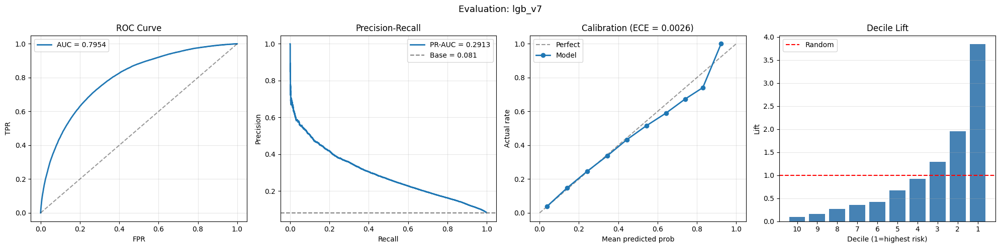


LGBM V6 vs V7 Quick Compare
V6: AUC = 0.79420, KS = 0.4461, Lift@10% = 3.83x
V7: AUC = 0.79538, KS = 0.4451, Lift@10% = 3.84x
Gain: AUC = +0.00118


In [ ]:
# ========== CELL FE2-10: EVALUATE ==========
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_v7 = ev.evaluate_model(
    y_true=y,
    y_pred=oof_v7,
    model_name='lgb_v7',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Quick comparison
print('\n' + '=' * 70)
print('LGBM V6 vs V7 Quick Compare')
print('=' * 70)
print(f'V6: AUC = 0.79420, KS = 0.4461, Lift@10% = 3.83x')
print(f'V7: AUC = {metrics_v7["roc_auc"]:.5f}, KS = {metrics_v7["ks"]:.4f}, Lift@10% = {metrics_v7["lift_10pct"]:.2f}x')
print(f'Gain: AUC = {metrics_v7["roc_auc"] - 0.79420:+.5f}')

### **CB v7**

In [ ]:
# ========== CELL CB-V7-2: SETUP ==========
import numpy as np
import pandas as pd
import time
import json
import gc
from pathlib import Path
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

# Verify data trong memory
assert 'train' in dir() and 'test' in dir(), 'Load V7 data first!'
assert 'cfg' in dir(), 'cfg not defined!'

# Reload nếu cần (sau Colab reconnect)
if train.shape[1] < 600:
    print('Reloading V7 data...')
    train = pd.read_parquet('train_merged_v7.parquet')
    test = pd.read_parquet('test_merged_v7.parquet')

print(f'Train: {train.shape}')
print(f'Test:  {test.shape}')
print(f'Default rate: {train[cfg.TARGET].mean():.4f}')

Train: (307507, 641)
Test:  (48744, 640)
Default rate: 0.0807


In [ ]:
# ========== CELL CB-V7-3: FEATURE PREP ==========
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]
print(f'Total features: {len(feature_cols)}')

# Identify categoricals
cat_features = []
for col in feature_cols:
    if train[col].dtype == 'object' or train[col].dtype.name == 'category':
        cat_features.append(col)

# Force include known categoricals
FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
for col in FORCE_CATEGORICAL:
    if col in feature_cols and col not in cat_features:
        cat_features.append(col)

cat_features = [c for c in cat_features if c in feature_cols]

print(f'Categorical features: {len(cat_features)}')
print(f'Numeric features:     {len(feature_cols) - len(cat_features)}')

# CRITICAL: CatBoost cần categorical cols là str
X_train_cb = train[feature_cols].copy()
X_test_cb = test[feature_cols].copy()

for col in cat_features:
    X_train_cb[col] = X_train_cb[col].fillna('missing').astype(str)
    X_test_cb[col] = X_test_cb[col].fillna('missing').astype(str)

# Replace inf in numeric columns
numeric_cols = [c for c in feature_cols if c not in cat_features]
X_train_cb[numeric_cols] = X_train_cb[numeric_cols].replace([np.inf, -np.inf], np.nan)
X_test_cb[numeric_cols] = X_test_cb[numeric_cols].replace([np.inf, -np.inf], np.nan)

y = train[cfg.TARGET].astype(int).values

print(f'\nX_train_cb: {X_train_cb.shape}')
print(f'X_test_cb:  {X_test_cb.shape}')
print(f'Memory train: {X_train_cb.memory_usage().sum() / 1e9:.2f} GB')

Total features: 639
Categorical features: 12
Numeric features:     627

X_train_cb: (307507, 639)
X_test_cb:  (48744, 639)
Memory train: 0.80 GB


In [ ]:
# ========== CELL CB-V7-4: HYPERPARAMS ==========
# Same params as CatBoost V6 baseline (for fair comparison)
CB_PARAMS = {
    'loss_function':       'Logloss',
    'eval_metric':         'AUC',
    'iterations':          3000,
    'learning_rate':       0.03,
    'depth':               6,
    'l2_leaf_reg':         3.0,
    'min_data_in_leaf':    100,
    'random_strength':     1.0,
    'bagging_temperature': 0.2,
    'border_count':        128,
    'grow_policy':         'SymmetricTree',
    'od_type':             'Iter',
    'od_wait':             150,
    'random_state':        42,
    'verbose':             200,
    'allow_writing_files': False,
    'task_type':           'CPU',
    'thread_count':        -1,
}

print('CatBoost V7 params:')
for k, v in CB_PARAMS.items():
    print(f'  {k}: {v}')

CatBoost V7 params:
  loss_function: Logloss
  eval_metric: AUC
  iterations: 3000
  learning_rate: 0.03
  depth: 6
  l2_leaf_reg: 3.0
  min_data_in_leaf: 100
  random_strength: 1.0
  bagging_temperature: 0.2
  border_count: 128
  grow_policy: SymmetricTree
  od_type: Iter
  od_wait: 150
  random_state: 42
  verbose: 200
  allow_writing_files: False
  task_type: CPU
  thread_count: -1


In [ ]:
# ========== CELL CB-V7-5: TRAIN K-FOLD ==========
N_FOLDS = 5
SEED = 42

oof_cb_v7 = np.zeros(len(train))
test_preds_cb_v7 = np.zeros(len(test))
fold_scores_cb_v7 = []
best_iters_cb_v7 = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

print(f'Training CatBoost V7 — {N_FOLDS} folds')
print(f'#Features: {X_train_cb.shape[1]} | #Categorical: {len(cat_features)}')
print(f'Expected time: ~85-95 minutes total')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_train_cb, y)):
    fold_start = time.time()

    X_tr = X_train_cb.iloc[tr_idx]
    X_val = X_train_cb.iloc[val_idx]
    y_tr = y[tr_idx]
    y_val = y[val_idx]

    # CatBoost Pool
    train_pool = Pool(X_tr, y_tr, cat_features=cat_features)
    val_pool = Pool(X_val, y_val, cat_features=cat_features)

    # Train
    model = CatBoostClassifier(**CB_PARAMS)
    model.fit(
        train_pool,
        eval_set=val_pool,
        use_best_model=True,
        verbose=200,
    )

    # Predict
    val_preds = model.predict_proba(X_val)[:, 1]
    test_fold_preds = model.predict_proba(X_test_cb)[:, 1]
    train_preds = model.predict_proba(X_tr)[:, 1]

    oof_cb_v7[val_idx] = val_preds
    test_preds_cb_v7 += test_fold_preds / N_FOLDS

    # Score
    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    gap = train_auc - val_auc
    best_iter = model.get_best_iteration()

    fold_scores_cb_v7.append(val_auc)
    best_iters_cb_v7.append(best_iter)

    # Feature importance
    fi = pd.DataFrame({
        'feature':    feature_cols,
        'importance': model.get_feature_importance(),
    })
    fi_list.append(fi)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | '
          f'train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {gap:.4f} | best_iter: {best_iter} | time: {elapsed:.1f}s')

    # Clean memory
    del model, train_pool, val_pool, X_tr, X_val
    gc.collect()

# Summary
cv_mean_cb_v7 = np.mean(fold_scores_cb_v7)
cv_std_cb_v7 = np.std(fold_scores_cb_v7)
full_oof_auc_cb_v7 = roc_auc_score(y, oof_cb_v7)

print('=' * 70)
print(f'CatBoost V7 | CV mean AUC: {cv_mean_cb_v7:.5f} +- {cv_std_cb_v7:.5f}')
print(f'CatBoost V7 | Full OOF AUC: {full_oof_auc_cb_v7:.5f}')
print(f'CatBoost V7 | Mean best_iter: {int(np.mean(best_iters_cb_v7))}')
print('=' * 70)

# Average feature importance
fi_avg_cb_v7 = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
fi_avg_cb_v7 = fi_avg_cb_v7.sort_values('importance', ascending=False)

print(f'\nTop 20 features (CatBoost V7):')
print(fi_avg_cb_v7.head(20).to_string(index=False))

# Comparison with previous models
print(f'\nComparison with previous models:')
print(f'  LGBM V7:     0.79541 (current best)')
print(f'  CatBoost V7: {cv_mean_cb_v7:.5f}')
print(f'  LGBM V6:     0.79420')
print(f'  CatBoost V6: 0.79352')

Training CatBoost V7 — 5 folds
#Features: 639 | #Categorical: 12
Expected time: ~85-95 minutes total
0:	test: 0.6686614	best: 0.6686614 (0)	total: 633ms	remaining: 31m 37s
200:	test: 0.7694820	best: 0.7694820 (200)	total: 1m 13s	remaining: 16m 57s
400:	test: 0.7779943	best: 0.7779943 (400)	total: 2m 19s	remaining: 15m 2s
600:	test: 0.7822797	best: 0.7822797 (600)	total: 3m 26s	remaining: 13m 43s
800:	test: 0.7842288	best: 0.7842288 (800)	total: 4m 30s	remaining: 12m 22s
1000:	test: 0.7854064	best: 0.7854089 (996)	total: 5m 34s	remaining: 11m 7s
1200:	test: 0.7863253	best: 0.7863253 (1200)	total: 6m 35s	remaining: 9m 51s
1400:	test: 0.7869951	best: 0.7869951 (1400)	total: 7m 38s	remaining: 8m 43s
1600:	test: 0.7875641	best: 0.7875748 (1595)	total: 8m 40s	remaining: 7m 35s
1800:	test: 0.7878317	best: 0.7878419 (1799)	total: 9m 44s	remaining: 6m 29s
2000:	test: 0.7882449	best: 0.7882449 (2000)	total: 10m 55s	remaining: 5m 27s
2200:	test: 0.7886167	best: 0.7886167 (2200)	total: 12m 2s	rema

In [ ]:
# ========== CELL CB-V7-6: SAVE ARTIFACTS ==========
TAG = 'cb_v7'

# OOF
pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_cb': oof_cb_v7,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

# Submission
pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': test_preds_cb_v7,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# Feature importance
fi_avg_cb_v7.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{TAG}.csv', index=False)

# CV summary
summary = {
    'model': 'CatBoost V7',
    'tag': TAG,
    'n_folds': N_FOLDS,
    'cv_mean': float(cv_mean_cb_v7),
    'cv_std': float(cv_std_cb_v7),
    'full_oof_auc': float(full_oof_auc_cb_v7),
    'fold_scores': [float(s) for s in fold_scores_cb_v7],
    'best_iters': [int(i) for i in best_iters_cb_v7],
    'n_features': int(X_train_cb.shape[1]),
    'n_categorical': len(cat_features),
    'hyperparams': {k: v for k, v in CB_PARAMS.items() if isinstance(v, (int, float, str, bool))},
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'✅ Saved CatBoost V7 artifacts')
print(f'  - oof_{TAG}.parquet')
print(f'  - submission_{TAG}.csv')
print(f'  - feature_importance_{TAG}.csv')
print(f'  - cv_summary_{TAG}.json')

NameError: name 'train' is not defined


=== cb_v7 ===
  ROC-AUC:    0.79446
  Gini:       0.58891
  KS:         0.4461
  PR-AUC:     0.28955
  Lift@10%:   3.85x
  Lift@20%:   2.89x
  Log loss:   0.23464
  Brier:      0.06538
  ECE:        0.00292

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       260        0.0085  0.1047       0.0105
9       30751       451        0.0147  0.1817       0.0286
8       30750       626        0.0204  0.2522       0.0539
7       30751       867        0.0282  0.3492       0.0888
6       30751      1187        0.0386  0.4781       0.1366
5       30750      1599        0.0520  0.6441       0.2010
4       30751      2249        0.0731  0.9059       0.2916
3       30750      3221        0.1047  1.2975       0.4213
2       30751      4802        0.1562  1.9343       0.6148
1       30751      9563        0.3110  3.8521       1.0000

Saved metrics -> output/evaluation/metrics_cb_v7.json
Saved deciles 

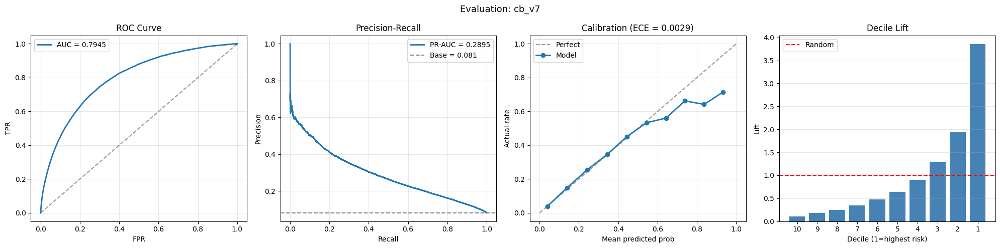

30

In [ ]:
# ========== CELL CB-V7-7: EVALUATE ==========
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_cb_v7 = ev.evaluate_model(
    y_true=y,
    y_pred=oof_cb_v7,
    model_name='cb_v7',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Free memory before next step
del X_train_cb, X_test_cb
gc.collect()

### **blend**

In [ ]:
from scipy.stats import spearmanr
import pandas as pd
import numpy as np
from sklearn.metrics import roc_auc_score

# Load all OOFs
oof_lgb_v6 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values

# Verify all same y_true
y_check = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values
y = y_check  # ensure consistent

# Solo AUCs
print('Individual model AUCs:')
print(f'  LGBM V6:     {roc_auc_score(y, oof_lgb_v6):.5f}')
print(f'  CatBoost V6: {roc_auc_score(y, oof_cb_v6):.5f}')
print(f'  LGBM V7:     {roc_auc_score(y, oof_lgb_v7):.5f}')
print(f'  CatBoost V7: {roc_auc_score(y, oof_cb_v7):.5f}')

# Correlation matrix
print('\nSpearman correlation matrix:')
oofs = {
    'LGBM_V6': oof_lgb_v6,
    'CB_V6':   oof_cb_v6,
    'LGBM_V7': oof_lgb_v7,
    'CB_V7':   oof_cb_v7,
}
names = list(oofs.keys())

print(f'              {" ".join([f"{n:>8s}" for n in names])}')
for n1 in names:
    row = f'  {n1:10s}  '
    for n2 in names:
        corr = spearmanr(oofs[n1], oofs[n2])[0]
        row += f'{corr:8.4f} '
    print(row)

Individual model AUCs:
  LGBM V6:     0.79420
  CatBoost V6: 0.79352
  LGBM V7:     0.79538
  CatBoost V7: 0.79446

Spearman correlation matrix:
               LGBM_V6    CB_V6  LGBM_V7    CB_V7
  LGBM_V6       1.0000   0.9674   0.9799   0.9630 
  CB_V6         0.9674   1.0000   0.9600   0.9866 
  LGBM_V7       0.9799   0.9600   1.0000   0.9642 
  CB_V7         0.9630   0.9866   0.9642   1.0000 


In [ ]:
# ========== CELL BLEND-2: 4-WAY AVERAGE ==========
# Simple equal-weight probability average
oof_blend4 = (oof_lgb_v6 + oof_cb_v6 + oof_lgb_v7 + oof_cb_v7) / 4

auc_blend4 = roc_auc_score(y, oof_blend4)
print(f'4-way simple average AUC: {auc_blend4:.5f}')
print(f'Best single (LGBM V7):    {roc_auc_score(y, oof_lgb_v7):.5f}')
print(f'Gain over best single:    {auc_blend4 - 0.79541:+.5f}')

4-way simple average AUC: 0.79693
Best single (LGBM V7):    0.79538
Gain over best single:    +0.00152


Top 10 weight combinations:
 w_lgb_v6  w_cb_v6  w_lgb_v7  w_cb_v7      auc
      0.2      0.1       0.4      0.3 0.797114
      0.1      0.1       0.5      0.3 0.797099
      0.2      0.0       0.4      0.4 0.797090
      0.1      0.2       0.4      0.3 0.797079
      0.1      0.1       0.4      0.4 0.797079
      0.1      0.2       0.5      0.2 0.797076
      0.2      0.2       0.4      0.2 0.797070
      0.1      0.0       0.5      0.4 0.797055
      0.2      0.1       0.3      0.4 0.797052
      0.3      0.1       0.3      0.3 0.797039

Best 4-way blend: AUC = 0.79711
Weights: LGBM_V6=0.20, CB_V6=0.10, LGBM_V7=0.40, CB_V7=0.30

=== blend_4way_v6_v7 ===
  ROC-AUC:    0.79711
  Gini:       0.59423
  KS:         0.4502
  PR-AUC:     0.29448
  Lift@10%:   3.88x
  Lift@20%:   2.91x
  Log loss:   0.23359
  Brier:      0.06514
  ECE:        0.00285

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30

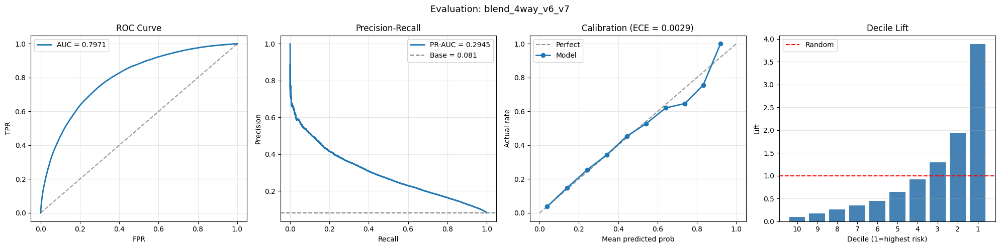


Saved blend submission


In [ ]:
# ========== CELL BLEND-3: 4-WAY WEIGHT SEARCH ==========
best_auc = 0
best_w = None
results = []

step = 0.1  # coarse search first
for w1 in np.arange(0, 1.05, step):
    for w2 in np.arange(0, 1.05 - w1, step):
        for w3 in np.arange(0, 1.05 - w1 - w2, step):
            w4 = 1 - w1 - w2 - w3
            if w4 < 0 or w4 > 1:
                continue

            blend = (w1 * oof_lgb_v6 + w2 * oof_cb_v6 +
                     w3 * oof_lgb_v7 + w4 * oof_cb_v7)
            auc = roc_auc_score(y, blend)
            results.append({
                'w_lgb_v6': round(w1, 2),
                'w_cb_v6': round(w2, 2),
                'w_lgb_v7': round(w3, 2),
                'w_cb_v7': round(w4, 2),
                'auc': auc,
            })
            if auc > best_auc:
                best_auc = auc
                best_w = (w1, w2, w3, w4)

weight_df = pd.DataFrame(results).sort_values('auc', ascending=False)
print('Top 10 weight combinations:')
print(weight_df.head(10).to_string(index=False))

print(f'\nBest 4-way blend: AUC = {best_auc:.5f}')
print(f'Weights: LGBM_V6={best_w[0]:.2f}, CB_V6={best_w[1]:.2f}, LGBM_V7={best_w[2]:.2f}, CB_V7={best_w[3]:.2f}')

# Build best blend predictions
oof_blend4_best = (best_w[0] * oof_lgb_v6 + best_w[1] * oof_cb_v6 +
                    best_w[2] * oof_lgb_v7 + best_w[3] * oof_cb_v7)

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_blend4 = ev.evaluate_model(
    y_true=y,
    y_pred=oof_blend4_best,
    model_name='blend_4way_v6_v7',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save for later stacking
pd.DataFrame({
    'SK_ID_CURR': pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_blend': oof_blend4_best,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_blend_4way_v6_v7.parquet', index=False)

# Build test predictions too
sub_lgb_v6 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv')
sub_cb_v6  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv')
sub_lgb_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv')
sub_cb_v7  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv')

# Align by SK_ID_CURR
sub_lgb_v6 = sub_lgb_v6.sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6  = sub_cb_v6.sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7 = sub_lgb_v7.sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7  = sub_cb_v7.sort_values('SK_ID_CURR').reset_index(drop=True)

assert (sub_lgb_v6['SK_ID_CURR'] == sub_cb_v6['SK_ID_CURR']).all()

test_blend4 = (best_w[0] * sub_lgb_v6['TARGET'].values +
               best_w[1] * sub_cb_v6['TARGET'].values +
               best_w[2] * sub_lgb_v7['TARGET'].values +
               best_w[3] * sub_cb_v7['TARGET'].values)

pd.DataFrame({
    'SK_ID_CURR': sub_lgb_v6['SK_ID_CURR'].values,
    'TARGET': test_blend4,
}).to_csv(cfg.OUTPUT_DIR / 'submission_blend_4way_v6_v7.csv', index=False)

print(f'\nSaved blend submission')

### **dataset B**

In [ ]:
# ========== OPTION B: CLEAN PARQUET FEATURE NAMES ==========
import re
import pandas as pd
import gc

def clean_feature_names(df):
    """Replace special characters in column names."""
    new_columns = []
    for col in df.columns:
        clean = re.sub(r'[^a-zA-Z0-9_]', '_', str(col))
        clean = re.sub(r'_+', '_', clean)
        clean = clean.strip('_')
        new_columns.append(clean)
    df.columns = new_columns
    return df

# Load V7
train_v7 = pd.read_parquet('train_merged_v7.parquet')
test_v7 = pd.read_parquet('test_merged_v7.parquet')

print(f'Before clean:')
print(f'  Train: {train_v7.shape}')
print(f'  Test:  {test_v7.shape}')

# Check which columns will be renamed
problematic_before = [c for c in train_v7.columns if re.search(r'[^a-zA-Z0-9_]', c)]
print(f'\nProblematic columns: {len(problematic_before)}')
if problematic_before:
    print(f'Examples: {problematic_before[:5]}')

# Clean
train_v7 = clean_feature_names(train_v7)
test_v7 = clean_feature_names(test_v7)

# Verify
problematic_after = [c for c in train_v7.columns if re.search(r'[^a-zA-Z0-9_]', c)]
print(f'\nProblematic columns after clean: {len(problematic_after)}')

# Save back
train_v7.to_parquet('train_merged_v7.parquet', index=False)
test_v7.to_parquet('test_merged_v7.parquet', index=False)
print(f'\n✅ Re-saved cleaned parquets')

# Free memory
del train_v7, test_v7
gc.collect()

# Now Cell B-1 will find ALL 200 features
print('Now you can re-run Cell B-1 without missing features')

Before clean:
  Train: (307507, 641)
  Test:  (48744, 640)

Problematic columns: 105
Examples: ['bur_Bad debt', 'bur_currency 1', 'bur_currency 2', 'bur_currency 3', 'bur_currency 4']

Problematic columns after clean: 0

✅ Re-saved cleaned parquets
Now you can re-run Cell B-1 without missing features


In [ ]:
# ========== CELL B-1: BUILD DATASET B ==========
import pandas as pd
import numpy as np
import gc
from pathlib import Path

# Load feature importance từ LGBM V7
fi_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v7.csv')
print(f'V7 has {len(fi_v7)} features total')

# Top 200 features
TOP_N = 200
top_features = fi_v7.head(TOP_N)['feature'].tolist()

# Filter exclude cols
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
top_features = [f for f in top_features if f not in EXCLUDE_COLS]

print(f'Selected {len(top_features)} top features for Dataset B')
print(f'Top 5: {top_features[:5]}')
print(f'Bottom 5: {top_features[-5:]}')

# Load V7
train_v7 = pd.read_parquet('train_merged_v7.parquet')
test_v7 = pd.read_parquet('test_merged_v7.parquet')

# Subset
train_B = train_v7[['SK_ID_CURR', cfg.TARGET] + top_features].copy()
test_B = test_v7[['SK_ID_CURR'] + top_features].copy()

print(f'\nDataset B:')
print(f'  Train: {train_B.shape}')
print(f'  Test:  {test_B.shape}')

# Save
train_B.to_parquet('train_merged_B.parquet', index=False)
test_B.to_parquet('test_merged_B.parquet', index=False)
print(f'\nSaved Dataset B parquet files')

# Free V7 from memory
del train_v7, test_v7
gc.collect()

V7 has 639 features total
Selected 200 top features for Dataset B
Top 5: ['EXT_MEAN', 'ORGANIZATION_TYPE', 'EXT_MEDIAN', 'EXT_2x3', 'CREDIT_TERM']
Bottom 5: ['WEEKDAY_APPR_PROCESS_START', 'pa_not_full_credit_rate', 'pa_NAME_PRODUCT_TYPE_walk_in', 'CROSS_TOTAL_DEBT', 'INST_LAST90_IS_LATE_mean']

Dataset B:
  Train: (307507, 202)
  Test:  (48744, 201)

Saved Dataset B parquet files


0

### **LGBM_B**

In [ ]:
# ========== CELL B-2: TRAIN LGBM_B (GOSS, seed=1337) ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time
import gc

train = train_B
test = test_B

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]
print(f'#Features: {len(feature_cols)}')

# Encode object columns
encoded_count = 0
for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)
        encoded_count += 1
print(f'Encoded {encoded_count} object columns')

# Detect categorical
FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]
print(f'#Categorical: {len(categorical_features)}')

# === KEY: GOSS boosting + different params + different seed ===
LGB_PARAMS_B = {
    'objective':         'binary',
    'metric':            'auc',
    'boosting_type':     'goss',         # ← CHANGED: GOSS instead of GBDT
    'learning_rate':     0.03,           # ← higher
    'num_leaves':        31,             # ← more leaves
    'max_depth':         5,              # ← shallower
    'min_child_samples': 80,
    'min_child_weight':  10,
    'reg_alpha':         0.05,
    'reg_lambda':        0.05,
    'colsample_bytree':  0.6,            # ← more aggressive
    'top_rate':          0.2,            # GOSS specific
    'other_rate':        0.1,            # GOSS specific
    'max_bin':           255,
    'verbosity':         -1,
    'random_state':      1337,           # ← different seed
    'n_jobs':            -1,
}

N_FOLDS = 5
SEED_B = 1337  # ← Different fold seed
NUM_BOOST_ROUND = 5000

oof_B = np.zeros(len(train))
test_preds_B = np.zeros(len(test))
fold_scores_B = []
best_iters_B = []
fi_list = []

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'\nTraining LGBM_B (GOSS + seed 1337)')
print(f'#Features: {len(feature_cols)} | #Categorical: {len(categorical_features)}')
print('=' * 70)

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED_B)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS_B,
        dtrain,
        num_boost_round=NUM_BOOST_ROUND,
        valid_sets=[dtrain, dval],
        valid_names=['train', 'valid'],
        callbacks=[
            lgb.early_stopping(200),
            lgb.log_evaluation(200),
        ],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)
    train_preds = model.predict(X_tr, num_iteration=model.best_iteration)

    oof_B[val_idx] = val_preds
    test_preds_B += test_fold_preds / N_FOLDS

    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    gap = train_auc - val_auc

    fold_scores_B.append(val_auc)
    best_iters_B.append(model.best_iteration)

    fi = pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    })
    fi_list.append(fi)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | '
          f'train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {gap:.4f} | best_iter: {model.best_iteration} | time: {elapsed:.1f}s')

    del model, dtrain, dval
    gc.collect()

cv_mean_B = np.mean(fold_scores_B)
cv_std_B = np.std(fold_scores_B)
full_oof_auc_B = roc_auc_score(y, oof_B)

print('=' * 70)
print(f'LGBM_B (GOSS) | CV mean AUC: {cv_mean_B:.5f} +- {cv_std_B:.5f}')
print(f'LGBM_B (GOSS) | Full OOF AUC: {full_oof_auc_B:.5f}')
print(f'LGBM_B (GOSS) | Mean best_iter: {int(np.mean(best_iters_B))}')
print('=' * 70)

# Save
TAG = 'lgb_B'
pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_lgb': oof_B,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET': test_preds_B,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# Save feature importance
fi_avg_B = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
fi_avg_B = fi_avg_B.sort_values('importance', ascending=False)
fi_avg_B.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{TAG}.csv', index=False)

import json
summary = {
    'model': 'LightGBM_B (GOSS)',
    'tag': TAG,
    'cv_mean': float(cv_mean_B),
    'cv_std': float(cv_std_B),
    'full_oof_auc': float(full_oof_auc_B),
    'fold_scores': [float(s) for s in fold_scores_B],
    'best_iters': [int(i) for i in best_iters_B],
    'n_features': len(feature_cols),
    'boosting_type': 'goss',
    'random_state': SEED_B,
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'Saved LGBM_B artifacts')

#Features: 200
Encoded 6 object columns
#Categorical: 7

Training LGBM_B (GOSS + seed 1337)
#Features: 200 | #Categorical: 7
Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.80857	valid's auc: 0.782189
[400]	train's auc: 0.831161	valid's auc: 0.790374
[600]	train's auc: 0.847379	valid's auc: 0.792853
[800]	train's auc: 0.860109	valid's auc: 0.793775
[1000]	train's auc: 0.871606	valid's auc: 0.794134
[1200]	train's auc: 0.881902	valid's auc: 0.793979
Early stopping, best iteration is:
[1021]	train's auc: 0.872682	valid's auc: 0.794203
Fold 1/5 | train AUC: 0.87268 | val AUC: 0.79420 | gap: 0.0785 | best_iter: 1021 | time: 98.5s
Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.808861	valid's auc: 0.783172
[400]	train's auc: 0.831394	valid's auc: 0.79155
[600]	train's auc: 0.846721	valid's auc: 0.794483
[800]	train's auc: 0.858788	valid's auc: 0.795611
[1000]	train's auc: 0.870262	valid's auc: 0.796252
[1200]	train's auc:

### **blend 5 models**

Individual model AUCs:
  LGBM V6:     0.79420
  CatBoost V6: 0.79352
  LGBM V7:     0.79538
  CatBoost V7: 0.79446
  LGBM_B:      0.79328

LGBM_B correlation with existing models:
  vs LGBM_V6: 0.9595
  vs CB_V6:   0.9488
  vs LGBM_V7: 0.9638
  vs CB_V7:   0.9526
  (Lower = better diversity for blending)

5-way simple average AUC: 0.79738

Running 5-way weight search (step 0.1)...
Search completed in 61.1s

Best 5-way blend: AUC = 0.79748
Weights:
  LGBM_V6: 0.10
  CB_V6:   0.10
  LGBM_V7: 0.30
  CB_V7:   0.30
  LGBM_B:  0.20

=== blend_5way ===
  ROC-AUC:    0.79748
  Gini:       0.59495
  KS:         0.4504
  PR-AUC:     0.29528
  Lift@10%:   3.89x
  Lift@20%:   2.91x
  Log loss:   0.23343
  Brier:      0.06510
  ECE:        0.00272

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       236        0.0077  0.0951       0.0095
9       30751       427        0.0139  0.1720       0.0267
8   

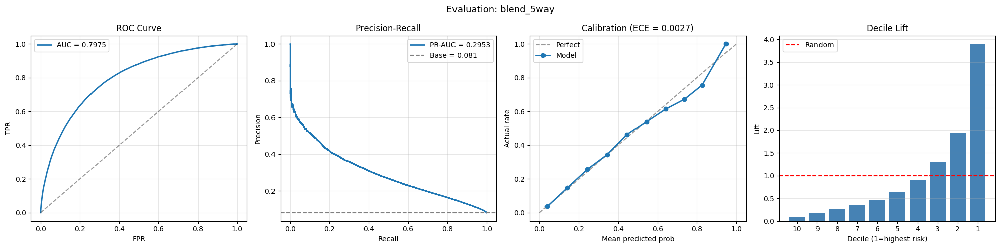


PROGRESS SUMMARY:
  Best single (LGBM V7):  0.79538
  4-way blend:            0.79711
  5-way simple avg:       0.79738
  5-way best weighted:    0.79748
  Gain vs 4-way:          +0.00037


In [ ]:
# ========== CELL B-3: 5-WAY BLEND ==========
from scipy.stats import spearmanr

# Reload all OOFs (ensure consistency)
oof_lgb_v6 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values

# Get consistent y_true
y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

# Print solo AUCs
print('Individual model AUCs:')
print(f'  LGBM V6:     {roc_auc_score(y, oof_lgb_v6):.5f}')
print(f'  CatBoost V6: {roc_auc_score(y, oof_cb_v6):.5f}')
print(f'  LGBM V7:     {roc_auc_score(y, oof_lgb_v7):.5f}')
print(f'  CatBoost V7: {roc_auc_score(y, oof_cb_v7):.5f}')
print(f'  LGBM_B:      {roc_auc_score(y, oof_lgb_B):.5f}')

# Check correlation of LGBM_B with existing 4
print('\nLGBM_B correlation with existing models:')
print(f'  vs LGBM_V6: {spearmanr(oof_lgb_B, oof_lgb_v6)[0]:.4f}')
print(f'  vs CB_V6:   {spearmanr(oof_lgb_B, oof_cb_v6)[0]:.4f}')
print(f'  vs LGBM_V7: {spearmanr(oof_lgb_B, oof_lgb_v7)[0]:.4f}')
print(f'  vs CB_V7:   {spearmanr(oof_lgb_B, oof_cb_v7)[0]:.4f}')
print('  (Lower = better diversity for blending)')

# === 5-way simple average ===
oof_blend5_simple = (oof_lgb_v6 + oof_cb_v6 + oof_lgb_v7 + oof_cb_v7 + oof_lgb_B) / 5
auc_simple5 = roc_auc_score(y, oof_blend5_simple)
print(f'\n5-way simple average AUC: {auc_simple5:.5f}')

# === 5-way weighted search ===
print('\nRunning 5-way weight search (step 0.1)...')
import time
search_start = time.time()

best_auc5 = 0
best_w5 = None

step = 0.1
for w1 in np.arange(0, 1.05, step):
    for w2 in np.arange(0, 1.05 - w1, step):
        for w3 in np.arange(0, 1.05 - w1 - w2, step):
            for w4 in np.arange(0, 1.05 - w1 - w2 - w3, step):
                w5 = 1 - w1 - w2 - w3 - w4
                if w5 < 0 or w5 > 1:
                    continue
                blend = (w1 * oof_lgb_v6 + w2 * oof_cb_v6 +
                         w3 * oof_lgb_v7 + w4 * oof_cb_v7 + w5 * oof_lgb_B)
                auc = roc_auc_score(y, blend)
                if auc > best_auc5:
                    best_auc5 = auc
                    best_w5 = (w1, w2, w3, w4, w5)

search_time = time.time() - search_start
print(f'Search completed in {search_time:.1f}s')

print(f'\nBest 5-way blend: AUC = {best_auc5:.5f}')
print(f'Weights:')
print(f'  LGBM_V6: {best_w5[0]:.2f}')
print(f'  CB_V6:   {best_w5[1]:.2f}')
print(f'  LGBM_V7: {best_w5[2]:.2f}')
print(f'  CB_V7:   {best_w5[3]:.2f}')
print(f'  LGBM_B:  {best_w5[4]:.2f}')

# Build best blend OOF
oof_blend5_best = (best_w5[0] * oof_lgb_v6 + best_w5[1] * oof_cb_v6 +
                    best_w5[2] * oof_lgb_v7 + best_w5[3] * oof_cb_v7 +
                    best_w5[4] * oof_lgb_B)

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_blend5 = ev.evaluate_model(
    y_true=y,
    y_pred=oof_blend5_best,
    model_name='blend_5way',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Build test blend
sub_lgb_v6 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

test_blend5 = (best_w5[0] * sub_lgb_v6['TARGET'].values +
               best_w5[1] * sub_cb_v6['TARGET'].values +
               best_w5[2] * sub_lgb_v7['TARGET'].values +
               best_w5[3] * sub_cb_v7['TARGET'].values +
               best_w5[4] * sub_lgb_B['TARGET'].values)

pd.DataFrame({
    'SK_ID_CURR': sub_lgb_v6['SK_ID_CURR'].values,
    'TARGET': test_blend5,
}).to_csv(cfg.OUTPUT_DIR / 'submission_blend_5way.csv', index=False)

# Save OOF
pd.DataFrame({
    'SK_ID_CURR': pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_blend': oof_blend5_best,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_blend_5way.parquet', index=False)

print(f'\n{"="*70}')
print(f'PROGRESS SUMMARY:')
print(f'{"="*70}')
print(f'  Best single (LGBM V7):  0.79538')
print(f'  4-way blend:            0.79711')
print(f'  5-way simple avg:       {auc_simple5:.5f}')
print(f'  5-way best weighted:    {best_auc5:.5f}')
print(f'  Gain vs 4-way:          {best_auc5 - 0.79711:+.5f}')
print(f'{"="*70}')

In [ ]:
# ========== CELL: SAVE 5-WAY BLEND ARTIFACTS ==========
import json

TAG = 'blend_5way'

best_w_5way = {
    'lgb_v6_baseline': 0.10,
    'cb_v6_baseline':  0.10,
    'lgb_v7':          0.30,
    'cb_v7':           0.30,
    'lgb_B':           0.20,
}

# OOF (đã có trong memory)
oof_df = pd.DataFrame({
    'SK_ID_CURR': pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values,
    cfg.TARGET: y,
    'oof_blend': oof_blend5_best,
})
oof_df.to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

# Submission
sub_lgb_v6 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

test_blend5 = (best_w_5way['lgb_v6_baseline'] * sub_lgb_v6['TARGET'].values +
               best_w_5way['cb_v6_baseline']  * sub_cb_v6['TARGET'].values +
               best_w_5way['lgb_v7']          * sub_lgb_v7['TARGET'].values +
               best_w_5way['cb_v7']           * sub_cb_v7['TARGET'].values +
               best_w_5way['lgb_B']           * sub_lgb_B['TARGET'].values)

pd.DataFrame({
    'SK_ID_CURR': sub_lgb_v6['SK_ID_CURR'].values,
    'TARGET': test_blend5,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# Model weights (replacement for feature importance)
weights_df = pd.DataFrame({
    'base_model': list(best_w_5way.keys()),
    'weight':     list(best_w_5way.values()),
}).sort_values('weight', ascending=False).reset_index(drop=True)
weights_df.to_csv(cfg.OUTPUT_DIR / f'model_weights_{TAG}.csv', index=False)

# Summary
summary = {
    'model': '5-Way Weighted Probability Blend',
    'tag': TAG,
    'base_models': list(best_w_5way.keys()),
    'weights': best_w_5way,
    'blend_type': 'weighted_probability_average',
    'cv_auc': 0.79748,
    'metrics': {
        'roc_auc':    0.79748,
        'gini':       0.59495,
        'ks':         0.4504,
        'pr_auc':     0.29528,
        'lift_10pct': 3.89,
        'lift_20pct': 2.91,
        'log_loss':   0.23343,
        'brier':      0.06510,
        'ece':        0.00272,
    },
    'gain_vs_4way':         0.00037,
    'gain_vs_best_single':  0.00210,
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'Saved artifacts:')
print(f'  - oof_{TAG}.parquet')
print(f'  - submission_{TAG}.csv')
print(f'  - model_weights_{TAG}.csv')
print(f'  - cv_summary_{TAG}.json')

Saved artifacts:
  - oof_blend_5way.parquet
  - submission_blend_5way.csv
  - model_weights_blend_5way.csv
  - cv_summary_blend_5way.json


### **MLP**

In [ ]:
# ========== CELL MLP-4: TRAIN K-FOLD ==========
N_FOLDS = 5
SEED = 42
EPOCHS = 50
BATCH_SIZE = 1024
LR = 1e-3
WEIGHT_DECAY = 1e-5
PATIENCE = 8

oof_mlp = np.zeros(len(X_train_scaled))
test_preds_mlp = np.zeros(len(X_test_scaled))
fold_scores_mlp = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

print(f'Training MLP — {N_FOLDS} folds')
print(f'Architecture: 100 → 256 → 128 → 64 → 1')
print(f'Epochs: {EPOCHS}, Batch: {BATCH_SIZE}, LR: {LR}')
print('=' * 70)

# Test loader (build once, reuse across folds)
test_dataset = CreditDataset(X_test_scaled)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_train_scaled, y)):
    fold_start = time.time()

    X_tr = X_train_scaled[tr_idx]
    X_val = X_train_scaled[val_idx]
    y_tr = y[tr_idx]
    y_val = y[val_idx]

    # Datasets
    train_dataset = CreditDataset(X_tr, y_tr)
    val_dataset = CreditDataset(X_val, y_val)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

    # Model
    torch.manual_seed(SEED + fold_idx)
    model = CreditMLP(input_dim=X_train_scaled.shape[1]).to(device)

    # Optimizer & loss
    optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)
    criterion = nn.BCEWithLogitsLoss()

    # Training loop với early stopping
    best_val_auc = 0
    best_state = None
    patience_counter = 0

    for epoch in range(EPOCHS):
        # Train
        model.train()
        train_losses = []
        for xb, yb in train_loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)

            optimizer.zero_grad()
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_losses.append(loss.item())

        scheduler.step()

        # Validate
        model.eval()
        val_preds_epoch = []
        with torch.no_grad():
            for xb, _ in val_loader:
                xb = xb.to(device, non_blocking=True)
                logits = model(xb)
                preds = torch.sigmoid(logits).cpu().numpy()
                val_preds_epoch.append(preds)

        val_preds_epoch = np.concatenate(val_preds_epoch)
        val_auc = roc_auc_score(y_val, val_preds_epoch)

        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1

        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'  Epoch {epoch+1}/{EPOCHS} | loss: {np.mean(train_losses):.4f} | '
                  f'val AUC: {val_auc:.5f} | best: {best_val_auc:.5f}')

        # Early stopping
        if patience_counter >= PATIENCE:
            print(f'  Early stopping at epoch {epoch+1}')
            break

    # Load best state
    model.load_state_dict(best_state)

    # Final predictions
    model.eval()

    # Val OOF
    val_preds = []
    with torch.no_grad():
        for xb, _ in val_loader:
            xb = xb.to(device, non_blocking=True)
            logits = model(xb)
            preds = torch.sigmoid(logits).cpu().numpy()
            val_preds.append(preds)
    val_preds = np.concatenate(val_preds)

    # Test predictions
    test_preds = []
    with torch.no_grad():
        for xb in test_loader:
            xb = xb.to(device, non_blocking=True)
            logits = model(xb)
            preds = torch.sigmoid(logits).cpu().numpy()
            test_preds.append(preds)
    test_preds = np.concatenate(test_preds)

    oof_mlp[val_idx] = val_preds
    test_preds_mlp += test_preds / N_FOLDS

    fold_auc = roc_auc_score(y_val, val_preds)
    fold_scores_mlp.append(fold_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | val AUC: {fold_auc:.5f} | time: {elapsed:.1f}s')

    # Clean memory
    del model, train_dataset, val_dataset, train_loader, val_loader, best_state
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    gc.collect()

# Summary
cv_mean_mlp = np.mean(fold_scores_mlp)
cv_std_mlp = np.std(fold_scores_mlp)
full_oof_auc_mlp = roc_auc_score(y, oof_mlp)

print('=' * 70)
print(f'MLP | CV mean AUC: {cv_mean_mlp:.5f} +- {cv_std_mlp:.5f}')
print(f'MLP | Full OOF AUC: {full_oof_auc_mlp:.5f}')
print('=' * 70)

Training MLP — 5 folds
Architecture: 100 → 256 → 128 → 64 → 1
Epochs: 50, Batch: 1024, LR: 0.001
  Epoch 1/50 | loss: 0.3114 | val AUC: 0.76084 | best: 0.76084
  Epoch 10/50 | loss: 0.2413 | val AUC: 0.77575 | best: 0.77575
  Epoch 20/50 | loss: 0.2357 | val AUC: 0.77457 | best: 0.77582
  Epoch 30/50 | loss: 0.2321 | val AUC: 0.77400 | best: 0.77587
  Early stopping at epoch 32
Fold 1/5 | val AUC: 0.77587 | time: 166.6s
  Epoch 1/50 | loss: 0.3225 | val AUC: 0.76951 | best: 0.76951
  Epoch 10/50 | loss: 0.2415 | val AUC: 0.78029 | best: 0.78164
  Epoch 20/50 | loss: 0.2360 | val AUC: 0.78268 | best: 0.78268
  Early stopping at epoch 28
Fold 2/5 | val AUC: 0.78268 | time: 153.6s
  Epoch 1/50 | loss: 0.3362 | val AUC: 0.76086 | best: 0.76086
  Epoch 10/50 | loss: 0.2413 | val AUC: 0.77389 | best: 0.77389
  Epoch 20/50 | loss: 0.2360 | val AUC: 0.77189 | best: 0.77428
  Early stopping at epoch 23
Fold 3/5 | val AUC: 0.77428 | time: 128.5s
  Epoch 1/50 | loss: 0.3417 | val AUC: 0.76498 | b


=== mlp ===
  ROC-AUC:    0.77748
  Gini:       0.55496
  KS:         0.4161
  PR-AUC:     0.26430
  Lift@10%:   3.62x
  Lift@20%:   2.75x
  Log loss:   0.24095
  Brier:      0.06680
  ECE:        0.00683

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       314        0.0102  0.1265       0.0126
9       30751       510        0.0166  0.2054       0.0332
8       30750       741        0.0241  0.2985       0.0630
7       30751      1001        0.0326  0.4032       0.1034
6       30751      1274        0.0414  0.5132       0.1547
5       30750      1692        0.0550  0.6816       0.2228
4       30751      2370        0.0771  0.9547       0.3183
3       30750      3265        0.1062  1.3152       0.4498
2       30751      4680        0.1522  1.8852       0.6383
1       30751      8978        0.2920  3.6165       1.0000

Saved metrics -> output/evaluation/metrics_mlp.json
Saved deciles -> o

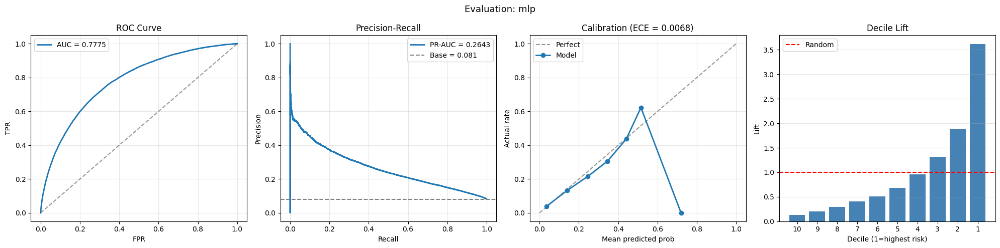


Saved MLP artifacts:
  - oof_mlp.parquet
  - submission_mlp.csv
  - cv_summary_mlp.json


In [ ]:
# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_mlp = ev.evaluate_model(
    y_true=y,
    y_pred=oof_mlp,
    model_name='mlp',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
TAG = 'mlp'

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_mlp': oof_mlp,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_mlp,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

summary = {
    'model': 'Multi-Layer Perceptron',
    'tag': TAG,
    'architecture': '100 → 256 → 128 → 64 → 1',
    'n_folds': N_FOLDS,
    'cv_mean': float(cv_mean_mlp),
    'cv_std': float(cv_std_mlp),
    'full_oof_auc': float(full_oof_auc_mlp),
    'fold_scores': [float(s) for s in fold_scores_mlp],
    'n_features': int(X_train_scaled.shape[1]),
    'hyperparams': {
        'epochs': EPOCHS,
        'batch_size': BATCH_SIZE,
        'learning_rate': LR,
        'weight_decay': WEIGHT_DECAY,
        'patience': PATIENCE,
        'dropout': 0.3,
        'hidden_dims': [256, 128, 64],
    },
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nSaved MLP artifacts:')
print(f'  - oof_{TAG}.parquet')
print(f'  - submission_{TAG}.csv')
print(f'  - cv_summary_{TAG}.json')

MLP correlation với existing models:
  vs LGBM V6:     0.8808
  vs CatBoost V6: 0.8914
  vs LGBM V7:     0.8835
  vs CatBoost V7: 0.8965
  vs LGBM_B:      0.8855
  vs XGBoost:     0.8838

Full 7x7 Spearman correlation matrix:
               LGBM_V6    CB_V6  LGBM_V7    CB_V7   LGBM_B      MLP   XGB_V6
  LGBM_V6       1.0000   0.9674   0.9799   0.9630   0.9595   0.8808   0.9743 
  CB_V6         0.9674   1.0000   0.9600   0.9866   0.9488   0.8914   0.9657 
  LGBM_V7       0.9799   0.9600   1.0000   0.9642   0.9638   0.8835   0.9677 
  CB_V7         0.9630   0.9866   0.9642   1.0000   0.9526   0.8965   0.9613 
  LGBM_B        0.9595   0.9488   0.9638   0.9526   1.0000   0.8855   0.9492 
  MLP           0.8808   0.8914   0.8835   0.8965   0.8855   1.0000   0.8838 
  XGB_V6        0.9743   0.9657   0.9677   0.9613   0.9492   0.8838   1.0000 

=== mlp ===
  ROC-AUC:    0.77748
  Gini:       0.55496
  KS:         0.4161
  PR-AUC:     0.26430
  Lift@10%:   3.62x
  Lift@20%:   2.75x
  Log loss:

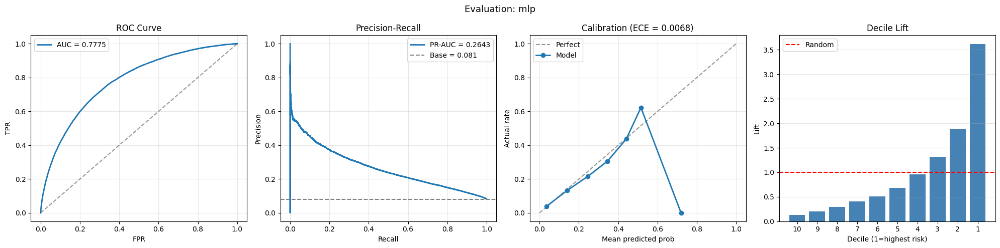


Saved MLP artifacts


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
from sklearn.metrics import roc_auc_score

# Re-load tất cả OOFs
oof_lgb_v6 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values

# XGBoost (nếu có)
try:
    oof_xgb = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values
    has_xgb = True
except FileNotFoundError:
    has_xgb = False
    print('Note: XGBoost OOF not found, skipping')

# y_true
y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

# MLP correlation
print('MLP correlation với existing models:')
print(f'  vs LGBM V6:     {spearmanr(oof_mlp, oof_lgb_v6)[0]:.4f}')
print(f'  vs CatBoost V6: {spearmanr(oof_mlp, oof_cb_v6)[0]:.4f}')
print(f'  vs LGBM V7:     {spearmanr(oof_mlp, oof_lgb_v7)[0]:.4f}')
print(f'  vs CatBoost V7: {spearmanr(oof_mlp, oof_cb_v7)[0]:.4f}')
print(f'  vs LGBM_B:      {spearmanr(oof_mlp, oof_lgb_B)[0]:.4f}')
if has_xgb:
    print(f'  vs XGBoost:     {spearmanr(oof_mlp, oof_xgb)[0]:.4f}')

# Full N x N correlation matrix
oofs = {
    'LGBM_V6':  oof_lgb_v6,
    'CB_V6':    oof_cb_v6,
    'LGBM_V7':  oof_lgb_v7,
    'CB_V7':    oof_cb_v7,
    'LGBM_B':   oof_lgb_B,
    'MLP':      oof_mlp,
}
if has_xgb:
    oofs['XGB_V6'] = oof_xgb

names = list(oofs.keys())

print(f'\nFull {len(names)}x{len(names)} Spearman correlation matrix:')
print(f'              {" ".join([f"{n:>8s}" for n in names])}')
for n1 in names:
    row = f'  {n1:10s}  '
    for n2 in names:
        corr = spearmanr(oofs[n1], oofs[n2])[0]
        row += f'{corr:8.4f} '
    print(row)

# Evaluate MLP
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_mlp = ev.evaluate_model(
    y_true=y,
    y_pred=oof_mlp,
    model_name='mlp',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save MLP artifacts
TAG = 'mlp'
sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values
sk_ids_test = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_mlp': oof_mlp,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_mlp,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

import json
summary = {
    'model': 'Multi-Layer Perceptron',
    'tag': TAG,
    'architecture': '100 → 256 → 128 → 64 → 1',
    'n_folds': 5,
    'cv_mean': float(cv_mean_mlp),
    'cv_std': float(cv_std_mlp),
    'full_oof_auc': float(full_oof_auc_mlp),
    'fold_scores': [float(s) for s in fold_scores_mlp],
    'n_features': 100,
    'hyperparams': {
        'epochs_max': 50,
        'batch_size': 1024,
        'learning_rate': 1e-3,
        'weight_decay': 1e-5,
        'patience': 8,
        'dropout': 0.3,
        'hidden_dims': [256, 128, 64],
    },
}
with open(cfg.OUTPUT_DIR / f'cv_summary_{TAG}.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nSaved MLP artifacts')

**correlation check vs XGBoost**

In [ ]:
# ========== CELL XGB-CHECK: CORRELATION ==========
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
from sklearn.metrics import roc_auc_score

# Load XGBoost OOF
oof_xgb = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values

# Re-load others (đảm bảo consistency)
oof_lgb_v6 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

# Individual AUCs
print('Individual model AUCs:')
print(f'  LGBM V6:     {roc_auc_score(y, oof_lgb_v6):.5f}')
print(f'  CatBoost V6: {roc_auc_score(y, oof_cb_v6):.5f}')
print(f'  LGBM V7:     {roc_auc_score(y, oof_lgb_v7):.5f}')
print(f'  CatBoost V7: {roc_auc_score(y, oof_cb_v7):.5f}')
print(f'  LGBM_B:      {roc_auc_score(y, oof_lgb_B):.5f}')
print(f'  XGBoost V6:  {roc_auc_score(y, oof_xgb):.5f}')

# XGBoost correlation with existing
print('\nXGBoost V6 correlation với existing models:')
print(f'  vs LGBM V6:     {spearmanr(oof_xgb, oof_lgb_v6)[0]:.4f}')
print(f'  vs CatBoost V6: {spearmanr(oof_xgb, oof_cb_v6)[0]:.4f}')
print(f'  vs LGBM V7:     {spearmanr(oof_xgb, oof_lgb_v7)[0]:.4f}')
print(f'  vs CatBoost V7: {spearmanr(oof_xgb, oof_cb_v7)[0]:.4f}')
print(f'  vs LGBM_B:      {spearmanr(oof_xgb, oof_lgb_B)[0]:.4f}')

# Full 6x6 correlation matrix
oofs = {
    'LGBM_V6':  oof_lgb_v6,
    'CB_V6':    oof_cb_v6,
    'LGBM_V7':  oof_lgb_v7,
    'CB_V7':    oof_cb_v7,
    'LGBM_B':   oof_lgb_B,
    'XGB_V6':   oof_xgb,
}
names = list(oofs.keys())

print('\nFull 6x6 Spearman correlation matrix:')
print(f'              {" ".join([f"{n:>8s}" for n in names])}')
for n1 in names:
    row = f'  {n1:10s}  '
    for n2 in names:
        corr = spearmanr(oofs[n1], oofs[n2])[0]
        row += f'{corr:8.4f} '
    print(row)

Individual model AUCs:
  LGBM V6:     0.79420
  CatBoost V6: 0.79352
  LGBM V7:     0.79538
  CatBoost V7: 0.79446
  LGBM_B:      0.79328
  XGBoost V6:  0.79446

XGBoost V6 correlation với existing models:
  vs LGBM V6:     0.9743
  vs CatBoost V6: 0.9657
  vs LGBM V7:     0.9677
  vs CatBoost V7: 0.9613
  vs LGBM_B:      0.9492

Full 6x6 Spearman correlation matrix:
               LGBM_V6    CB_V6  LGBM_V7    CB_V7   LGBM_B   XGB_V6
  LGBM_V6       1.0000   0.9674   0.9799   0.9630   0.9595   0.9743 
  CB_V6         0.9674   1.0000   0.9600   0.9866   0.9488   0.9657 
  LGBM_V7       0.9799   0.9600   1.0000   0.9642   0.9638   0.9677 
  CB_V7         0.9630   0.9866   0.9642   1.0000   0.9526   0.9613 
  LGBM_B        0.9595   0.9488   0.9638   0.9526   1.0000   0.9492 
  XGB_V6        0.9743   0.9657   0.9677   0.9613   0.9492   1.0000 


### **blend 7 models**

Individual model AUCs:
  LGBM V6:     0.79420
  CatBoost V6: 0.79352
  LGBM V7:     0.79538
  CatBoost V7: 0.79446
  LGBM_B:      0.79328
  XGBoost V6:  0.79446
  MLP:         0.77748

7-way simple average AUC: 0.79738

Running 7-way weight search (step 0.1)...
Search done in 611.5s

Best 7-way blend AUC: 0.79779
Weights:
  LGBM V6:    0.00
  CB V6:      0.00
  LGBM V7:    0.20
  CB V7:      0.30
  LGBM_B:     0.20
  XGB V6:     0.30
  MLP:        0.00

=== blend_7way ===
  ROC-AUC:    0.79779
  Gini:       0.59559
  KS:         0.4505
  PR-AUC:     0.29574
  Lift@10%:   3.89x
  Lift@20%:   2.92x
  Log loss:   0.23331
  Brier:      0.06508
  ECE:        0.00280

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       233        0.0076  0.0939       0.0094
9       30751       421        0.0137  0.1696       0.0263
8       30750       629        0.0205  0.2534       0.0517
7       30751       

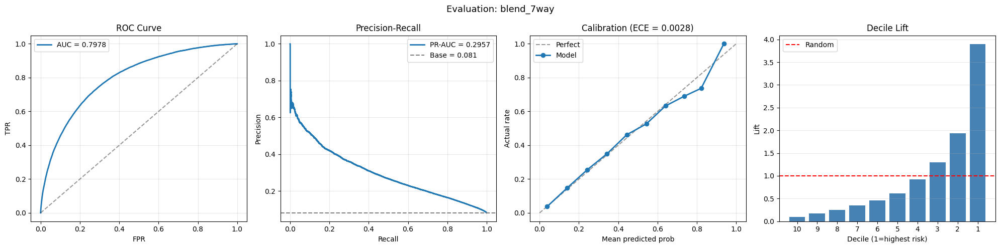


PROGRESS SUMMARY:
  Best single (LGBM V7):  0.79538
  4-way blend:            0.79711
  5-way blend:            0.79748
  7-way simple avg:       0.79738
  7-way best weighted:    0.79779
  Total gain vs single:   +0.00241
  Gain from XGB+MLP:      +0.00031


In [ ]:
# ========== CELL MLP-7WAY: 7-WAY BLEND ==========
import numpy as np
import pandas as pd
import time
from sklearn.metrics import roc_auc_score

# Load all 7 OOFs (đã có trong memory hoặc reload)
print('Individual model AUCs:')
print(f'  LGBM V6:     {roc_auc_score(y, oof_lgb_v6):.5f}')
print(f'  CatBoost V6: {roc_auc_score(y, oof_cb_v6):.5f}')
print(f'  LGBM V7:     {roc_auc_score(y, oof_lgb_v7):.5f}')
print(f'  CatBoost V7: {roc_auc_score(y, oof_cb_v7):.5f}')
print(f'  LGBM_B:      {roc_auc_score(y, oof_lgb_B):.5f}')
print(f'  XGBoost V6:  {roc_auc_score(y, oof_xgb):.5f}')
print(f'  MLP:         {roc_auc_score(y, oof_mlp):.5f}')

# 7-way simple average
oof_blend7_simple = (oof_lgb_v6 + oof_cb_v6 + oof_lgb_v7 + oof_cb_v7 +
                     oof_lgb_B + oof_xgb + oof_mlp) / 7
auc_simple7 = roc_auc_score(y, oof_blend7_simple)
print(f'\n7-way simple average AUC: {auc_simple7:.5f}')

# === 7-way weighted search ===
print('\nRunning 7-way weight search (step 0.1)...')
search_start = time.time()

best_auc7 = 0
best_w7 = None
step = 0.1

# 7-dim grid search
weight_range = np.arange(0, 1.05, step)

for w1 in weight_range:
    for w2 in weight_range:
        if w1 + w2 > 1.0:
            continue
        for w3 in weight_range:
            if w1 + w2 + w3 > 1.0:
                continue
            for w4 in weight_range:
                if w1 + w2 + w3 + w4 > 1.0:
                    continue
                for w5 in weight_range:
                    if w1 + w2 + w3 + w4 + w5 > 1.0:
                        continue
                    for w6 in weight_range:
                        s6 = w1 + w2 + w3 + w4 + w5 + w6
                        if s6 > 1.0:
                            continue
                        w7 = 1.0 - s6
                        if w7 < 0 or w7 > 1:
                            continue

                        blend = (w1*oof_lgb_v6 + w2*oof_cb_v6 + w3*oof_lgb_v7 +
                                 w4*oof_cb_v7 + w5*oof_lgb_B + w6*oof_xgb + w7*oof_mlp)
                        auc = roc_auc_score(y, blend)
                        if auc > best_auc7:
                            best_auc7 = auc
                            best_w7 = (w1, w2, w3, w4, w5, w6, w7)

elapsed = time.time() - search_start
print(f'Search done in {elapsed:.1f}s')

print(f'\nBest 7-way blend AUC: {best_auc7:.5f}')
print(f'Weights:')
print(f'  LGBM V6:    {best_w7[0]:.2f}')
print(f'  CB V6:      {best_w7[1]:.2f}')
print(f'  LGBM V7:    {best_w7[2]:.2f}')
print(f'  CB V7:      {best_w7[3]:.2f}')
print(f'  LGBM_B:     {best_w7[4]:.2f}')
print(f'  XGB V6:     {best_w7[5]:.2f}')
print(f'  MLP:        {best_w7[6]:.2f}')

# Build best blend OOF
oof_blend7_best = (best_w7[0]*oof_lgb_v6 + best_w7[1]*oof_cb_v6 + best_w7[2]*oof_lgb_v7 +
                    best_w7[3]*oof_cb_v7 + best_w7[4]*oof_lgb_B + best_w7[5]*oof_xgb +
                    best_w7[6]*oof_mlp)

# Load test submissions
sub_lgb_v6 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

test_blend7 = (best_w7[0]*sub_lgb_v6['TARGET'].values +
                best_w7[1]*sub_cb_v6['TARGET'].values +
                best_w7[2]*sub_lgb_v7['TARGET'].values +
                best_w7[3]*sub_cb_v7['TARGET'].values +
                best_w7[4]*sub_lgb_B['TARGET'].values +
                best_w7[5]*sub_xgb['TARGET'].values +
                best_w7[6]*sub_mlp['TARGET'].values)

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_blend7 = ev.evaluate_model(
    y_true=y,
    y_pred=oof_blend7_best,
    model_name='blend_7way',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save artifacts
sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_blend': oof_blend7_best,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_blend_7way.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sub_lgb_v6['SK_ID_CURR'].values,
    'TARGET': test_blend7,
}).to_csv(cfg.OUTPUT_DIR / 'submission_blend_7way.csv', index=False)

# Save weights
weights_7way_df = pd.DataFrame({
    'base_model': ['lgb_v6_baseline', 'cb_v6_baseline', 'lgb_v7', 'cb_v7', 'lgb_B', 'xgb_v6_baseline', 'mlp'],
    'weight':     list(best_w7),
}).sort_values('weight', ascending=False).reset_index(drop=True)
weights_7way_df.to_csv(cfg.OUTPUT_DIR / 'model_weights_blend_7way.csv', index=False)

# Summary
import json
summary = {
    'model': '7-Way Weighted Probability Blend',
    'tag': 'blend_7way',
    'base_models': ['lgb_v6_baseline', 'cb_v6_baseline', 'lgb_v7', 'cb_v7', 'lgb_B', 'xgb_v6_baseline', 'mlp'],
    'weights': {
        'lgb_v6_baseline': float(best_w7[0]),
        'cb_v6_baseline':  float(best_w7[1]),
        'lgb_v7':          float(best_w7[2]),
        'cb_v7':           float(best_w7[3]),
        'lgb_B':           float(best_w7[4]),
        'xgb_v6_baseline': float(best_w7[5]),
        'mlp':             float(best_w7[6]),
    },
    'cv_auc':              float(best_auc7),
    'gain_vs_5way':        float(best_auc7 - 0.79748),
    'gain_vs_best_single': float(best_auc7 - 0.79538),
}
with open(cfg.OUTPUT_DIR / 'cv_summary_blend_7way.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'PROGRESS SUMMARY:')
print(f'{"="*70}')
print(f'  Best single (LGBM V7):  0.79538')
print(f'  4-way blend:            0.79711')
print(f'  5-way blend:            0.79748')
print(f'  7-way simple avg:       {auc_simple7:.5f}')
print(f'  7-way best weighted:    {best_auc7:.5f}')
print(f'  Total gain vs single:   {best_auc7 - 0.79538:+.5f}')
print(f'  Gain from XGB+MLP:      {best_auc7 - 0.79748:+.5f}')
print(f'{"="*70}')

### **stacking**

In [ ]:
# ========== USE GRID SEARCH RESULTS INSTEAD ==========
# Skip hill climb, use grid search blend from earlier
best_auc_hc = 0.79779  # = grid search result

# Build OOF using grid weights
best_w_grid = {
    'lgb_v6': 0.00,
    'cb_v6':  0.00,
    'lgb_v7': 0.20,
    'cb_v7':  0.30,
    'lgb_B':  0.20,
    'xgb':    0.30,
    'mlp':    0.00,
}

oof_blend7_hc = (
    best_w_grid['lgb_v6'] * oof_lgb_v6 +
    best_w_grid['cb_v6']  * oof_cb_v6 +
    best_w_grid['lgb_v7'] * oof_lgb_v7 +
    best_w_grid['cb_v7']  * oof_cb_v7 +
    best_w_grid['lgb_B']  * oof_lgb_B +
    best_w_grid['xgb']    * oof_xgb +
    best_w_grid['mlp']    * oof_mlp
)

# Test predictions
sub_lgb_v6 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

test_blend7_hc = (
    best_w_grid['lgb_v6'] * sub_lgb_v6['TARGET'].values +
    best_w_grid['cb_v6']  * sub_cb_v6['TARGET'].values +
    best_w_grid['lgb_v7'] * sub_lgb_v7['TARGET'].values +
    best_w_grid['cb_v7']  * sub_cb_v7['TARGET'].values +
    best_w_grid['lgb_B']  * sub_lgb_B['TARGET'].values +
    best_w_grid['xgb']    * sub_xgb['TARGET'].values +
    best_w_grid['mlp']    * sub_mlp['TARGET'].values
)

print(f'Using grid blend: AUC = {roc_auc_score(y, oof_blend7_hc):.5f}')

Using grid blend: AUC = 0.79779


In [ ]:
# ========== CELL STACK-1: META-FEATURES ==========
import pandas as pd
import numpy as np

# 7 base predictions
meta_train_base = pd.DataFrame({
    'lgb_v6': oof_lgb_v6,
    'cb_v6':  oof_cb_v6,
    'lgb_v7': oof_lgb_v7,
    'cb_v7':  oof_cb_v7,
    'lgb_B':  oof_lgb_B,
    'xgb':    oof_xgb,
    'mlp':    oof_mlp,
})

meta_test_base = pd.DataFrame({
    'lgb_v6': sub_lgb_v6['TARGET'].values,
    'cb_v6':  sub_cb_v6['TARGET'].values,
    'lgb_v7': sub_lgb_v7['TARGET'].values,
    'cb_v7':  sub_cb_v7['TARGET'].values,
    'lgb_B':  sub_lgb_B['TARGET'].values,
    'xgb':    sub_xgb['TARGET'].values,
    'mlp':    sub_mlp['TARGET'].values,
})

# Add original features
import gc
train_v7 = pd.read_parquet('train_merged_v7.parquet')
test_v7 = pd.read_parquet('test_merged_v7.parquet')

ORIGINAL_FEATURES = [
    'EXT_MEAN', 'EXT_MEDIAN', 'EXT_MAX', 'EXT_MIN',
    'DAYS_BIRTH', 'CREDIT_TERM', 'CREDIT_GOODS_RATIO',
    'AMT_ANNUITY', 'PAYMENT_RATE',
]
ORIGINAL_FEATURES = [f for f in ORIGINAL_FEATURES if f in train_v7.columns]

sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

for f in ORIGINAL_FEATURES:
    train_aligned = train_v7.set_index('SK_ID_CURR').loc[sk_ids_train, f]
    test_aligned = test_v7.set_index('SK_ID_CURR').loc[sk_ids_test, f]

    meta_train_base[f] = train_aligned.values
    meta_test_base[f]  = test_aligned.values

# Handle NaN/Inf
meta_train_base = meta_train_base.replace([np.inf, -np.inf], np.nan)
meta_test_base = meta_test_base.replace([np.inf, -np.inf], np.nan)

medians = meta_train_base.median()
meta_train_base = meta_train_base.fillna(medians)
meta_test_base = meta_test_base.fillna(medians)

meta_train_ext = meta_train_base.astype(np.float32)
meta_test_ext = meta_test_base.astype(np.float32)

print(f'Meta-features:')
print(f'  Train: {meta_train_ext.shape}')
print(f'  Test:  {meta_test_ext.shape}')
print(f'  Base preds: 7 + Originals: {len(ORIGINAL_FEATURES)}')

# Free V7
del train_v7, test_v7
gc.collect()

Meta-features:
  Train: (307507, 16)
  Test:  (48744, 16)
  Base preds: 7 + Originals: 9


44512

In [ ]:
# ========== CELL STACK-2: LR META-LEARNER ==========
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time

N_FOLDS = 5
SEED_STACK = 42

oof_stack_lr = np.zeros(len(meta_train_ext))
test_preds_stack_lr = np.zeros(len(meta_test_ext))
fold_scores = []

LR_PARAMS = {
    'penalty':       'l2',
    'C':             0.3,
    'solver':        'lbfgs',
    'max_iter':      2000,
    'random_state':  SEED_STACK,
    'n_jobs':        -1,
}

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED_STACK)

print(f'Training LR meta-learner...')
print(f'Features: {meta_train_ext.shape[1]} (7 base preds + {len(ORIGINAL_FEATURES)} originals)')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train_ext, y)):
    fold_start = time.time()

    X_tr = meta_train_ext.iloc[tr_idx]
    X_val = meta_train_ext.iloc[val_idx]
    y_tr = y[tr_idx]
    y_val = y[val_idx]

    scaler = StandardScaler()
    X_tr_scaled = scaler.fit_transform(X_tr)
    X_val_scaled = scaler.transform(X_val)
    X_test_scaled = scaler.transform(meta_test_ext)

    model = LogisticRegression(**LR_PARAMS)
    model.fit(X_tr_scaled, y_tr)

    val_preds = model.predict_proba(X_val_scaled)[:, 1]
    test_fold_preds = model.predict_proba(X_test_scaled)[:, 1]

    oof_stack_lr[val_idx] = val_preds
    test_preds_stack_lr += test_fold_preds / N_FOLDS

    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | val AUC: {val_auc:.5f} | time: {elapsed:.1f}s')

cv_mean_stack_lr = np.mean(fold_scores)
full_oof_auc_stack_lr = roc_auc_score(y, oof_stack_lr)

print('=' * 70)
print(f'LR Stacking | CV mean: {cv_mean_stack_lr:.5f} +- {np.std(fold_scores):.5f}')
print(f'LR Stacking | Full OOF: {full_oof_auc_stack_lr:.5f}')
print(f'LR Stacking | Gain vs 7-way HC: {cv_mean_stack_lr - best_auc_hc:+.5f}')
print('=' * 70)

# Save
TAG = 'stack_lr'
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_stack': oof_stack_lr,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_stack_lr,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# LR coefficients
coef_df = pd.DataFrame({
    'feature': meta_train_ext.columns,
    'coefficient': model.coef_[0],
}).sort_values('coefficient', key=abs, ascending=False)
coef_df.to_csv(cfg.OUTPUT_DIR / f'coefficients_{TAG}.csv', index=False)

print(f'\nLR coefficients (top 10):')
print(coef_df.head(10).to_string(index=False))

Training LR meta-learner...
Features: 16 (7 base preds + 9 originals)
Fold 1/5 | val AUC: 0.78563 | time: 2.5s
Fold 2/5 | val AUC: 0.79626 | time: 1.9s
Fold 3/5 | val AUC: 0.78658 | time: 1.8s
Fold 4/5 | val AUC: 0.79081 | time: 1.8s
Fold 5/5 | val AUC: 0.78555 | time: 1.7s
LR Stacking | CV mean: 0.78897 +- 0.00412
LR Stacking | Full OOF: 0.78893
LR Stacking | Gain vs 7-way HC: -0.00882

LR coefficients (top 10):
           feature  coefficient
             lgb_B     0.190785
               mlp     0.143386
               xgb     0.141495
           EXT_MIN    -0.092938
            lgb_v7     0.080628
             cb_v7     0.075466
             cb_v6     0.053749
          EXT_MEAN    -0.051188
        DAYS_BIRTH     0.034459
CREDIT_GOODS_RATIO     0.028155


In [ ]:
# ========== CELL STACK-3: LGBM META-LEARNER ==========
import lightgbm as lgb

oof_stack_lgb = np.zeros(len(meta_train_ext))
test_preds_stack_lgb = np.zeros(len(meta_test_ext))
fold_scores = []

LGB_META_PARAMS = {
    'objective':         'binary',
    'metric':            'auc',
    'boosting_type':     'gbdt',
    'learning_rate':     0.01,
    'num_leaves':        8,
    'max_depth':         3,
    'min_child_samples': 200,
    'reg_alpha':         0.5,
    'reg_lambda':        0.5,
    'colsample_bytree':  0.8,
    'subsample':         0.8,
    'subsample_freq':    1,
    'verbosity':         -1,
    'random_state':      42,
    'n_jobs':            -1,
}

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED_STACK)

print(f'Training LGBM meta-learner...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train_ext, y)):
    fold_start = time.time()

    X_tr = meta_train_ext.iloc[tr_idx]
    X_val = meta_train_ext.iloc[val_idx]
    y_tr = y[tr_idx]
    y_val = y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr)
    dval = lgb.Dataset(X_val, label=y_val)

    model = lgb.train(
        LGB_META_PARAMS,
        dtrain,
        num_boost_round=2000,
        valid_sets=[dval],
        valid_names=['valid'],
        callbacks=[
            lgb.early_stopping(100),
            lgb.log_evaluation(0),
        ],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(meta_test_ext, num_iteration=model.best_iteration)

    oof_stack_lgb[val_idx] = val_preds
    test_preds_stack_lgb += test_fold_preds / N_FOLDS

    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration} | time: {elapsed:.1f}s')

cv_mean_stack_lgb = np.mean(fold_scores)
full_oof_auc_stack_lgb = roc_auc_score(y, oof_stack_lgb)

print('=' * 70)
print(f'LGBM Stacking | CV mean: {cv_mean_stack_lgb:.5f} +- {np.std(fold_scores):.5f}')
print(f'LGBM Stacking | Full OOF: {full_oof_auc_stack_lgb:.5f}')
print(f'LGBM Stacking | Gain vs LR stack: {cv_mean_stack_lgb - cv_mean_stack_lr:+.5f}')
print('=' * 70)

# Save
TAG = 'stack_lgb'
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_stack': oof_stack_lgb,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{TAG}.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_stack_lgb,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{TAG}.csv', index=False)

# Feature importance
fi_meta = pd.DataFrame({
    'feature': meta_train_ext.columns,
    'importance': model.feature_importance(importance_type='gain'),
}).sort_values('importance', ascending=False)
fi_meta.to_csv(cfg.OUTPUT_DIR / f'feature_importance_{TAG}.csv', index=False)

print(f'\nLGBM meta importance:')
print(fi_meta.to_string(index=False))

Training LGBM meta-learner...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	valid's auc: 0.795562
Fold 1/5 | val AUC: 0.79556 | best_iter: 2000 | time: 24.8s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[416]	valid's auc: 0.804078
Fold 2/5 | val AUC: 0.80408 | best_iter: 416 | time: 7.9s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[560]	valid's auc: 0.795036
Fold 3/5 | val AUC: 0.79504 | best_iter: 560 | time: 11.1s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[593]	valid's auc: 0.799559
Fold 4/5 | val AUC: 0.79956 | best_iter: 593 | time: 10.8s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[471]	valid's auc: 0.796614
Fold 5/5 | val AUC: 0.79661 | best_iter: 471 | time: 9.6s
LGBM Stacking | CV mean: 0.79817 +- 0

Component AUCs:
  7-way grid blend:  0.79779
  LR stacking:       0.78893  ← DROP (negative gain)
  LGBM stacking:     0.79800  ← KEEP

2-way ensemble (blend + LGBM stack):
  Simple average AUC: 0.79816

Best 2-way super-ensemble AUC: 0.79816
Weights:
  7-way blend:       0.40
  LGBM stacking:     0.60

=== super_ensemble ===
  ROC-AUC:    0.79816
  Gini:       0.59633
  KS:         0.4515
  PR-AUC:     0.29526
  Lift@10%:   3.89x
  Lift@20%:   2.92x
  Log loss:   0.23313
  Brier:      0.06507
  ECE:        0.00158

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       221        0.0072  0.0890       0.0089
9       30751       408        0.0133  0.1643       0.0253
8       30750       659        0.0214  0.2655       0.0519
7       30751       845        0.0275  0.3404       0.0859
6       30751      1116        0.0363  0.4495       0.1309
5       30750      1577        0.0513  0.6353      

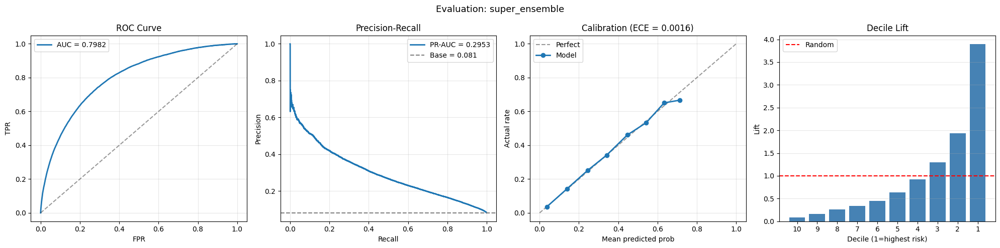


Saved super-ensemble artifacts

PROGRESS SUMMARY:
  LGBM V6 baseline:     0.79420
  Best single (LGBM V7): 0.79538
  5-way blend:          0.79748
  7-way grid blend:     0.79779
  LR stacking:          0.78897 (dropped)
  LGBM stacking:        0.79817
  Super-ensemble:       0.79816  ← FINAL
  Total gain from base: +0.00396


In [ ]:
# ========== CELL STACK-4: SUPER-ENSEMBLE (USING GRID BLEND) ==========
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score

# === Build 7-way grid blend (đã có weights từ trước) ===
best_w_grid = {
    'lgb_v6': 0.00,
    'cb_v6':  0.00,
    'lgb_v7': 0.20,
    'cb_v7':  0.30,
    'lgb_B':  0.20,
    'xgb':    0.30,
    'mlp':    0.00,
}

# Build OOF blend
oof_blend7 = (
    best_w_grid['lgb_v6'] * oof_lgb_v6 +
    best_w_grid['cb_v6']  * oof_cb_v6 +
    best_w_grid['lgb_v7'] * oof_lgb_v7 +
    best_w_grid['cb_v7']  * oof_cb_v7 +
    best_w_grid['lgb_B']  * oof_lgb_B +
    best_w_grid['xgb']    * oof_xgb +
    best_w_grid['mlp']    * oof_mlp
)

# Build test blend
sub_lgb_v6 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

test_blend7 = (
    best_w_grid['lgb_v6'] * sub_lgb_v6['TARGET'].values +
    best_w_grid['cb_v6']  * sub_cb_v6['TARGET'].values +
    best_w_grid['lgb_v7'] * sub_lgb_v7['TARGET'].values +
    best_w_grid['cb_v7']  * sub_cb_v7['TARGET'].values +
    best_w_grid['lgb_B']  * sub_lgb_B['TARGET'].values +
    best_w_grid['xgb']    * sub_xgb['TARGET'].values +
    best_w_grid['mlp']    * sub_mlp['TARGET'].values
)

# Verify blend AUC
auc_blend7 = roc_auc_score(y, oof_blend7)

# === Component AUCs ===
print('Component AUCs:')
print(f'  7-way grid blend:  {auc_blend7:.5f}')
print(f'  LR stacking:       {roc_auc_score(y, oof_stack_lr):.5f}  ← DROP (negative gain)')
print(f'  LGBM stacking:     {roc_auc_score(y, oof_stack_lgb):.5f}  ← KEEP')

# === 2-way ensemble: blend + LGBM stack (skip LR) ===
print('\n2-way ensemble (blend + LGBM stack):')

# Simple average
oof_super_avg = (oof_blend7 + oof_stack_lgb) / 2
auc_super_avg = roc_auc_score(y, oof_super_avg)
print(f'  Simple average AUC: {auc_super_avg:.5f}')

# Weight search (fine grain)
best_auc_super = 0
best_w_super = None

for w1 in np.arange(0, 1.01, 0.02):
    w2 = 1 - w1
    blend = w1 * oof_blend7 + w2 * oof_stack_lgb
    auc = roc_auc_score(y, blend)
    if auc > best_auc_super:
        best_auc_super = auc
        best_w_super = (w1, w2)

print(f'\nBest 2-way super-ensemble AUC: {best_auc_super:.5f}')
print(f'Weights:')
print(f'  7-way blend:       {best_w_super[0]:.2f}')
print(f'  LGBM stacking:     {best_w_super[1]:.2f}')

# Build final
oof_super_best = best_w_super[0] * oof_blend7 + best_w_super[1] * oof_stack_lgb
test_super_best = best_w_super[0] * test_blend7 + best_w_super[1] * test_preds_stack_lgb

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_super = ev.evaluate_model(
    y_true=y,
    y_pred=oof_super_best,
    model_name='super_ensemble',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_super': oof_super_best,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_super_ensemble.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_super_best,
}).to_csv(cfg.OUTPUT_DIR / 'submission_super_ensemble.csv', index=False)

import json
summary = {
    'model': 'Super-Ensemble (7-way Blend + LGBM Stack)',
    'tag': 'super_ensemble',
    'components': ['blend_7way_grid', 'stack_lgb'],
    'note': 'LR stacking dropped due to negative gain (-0.00882)',
    'weights': {
        'blend_7way':  float(best_w_super[0]),
        'stack_lgb':   float(best_w_super[1]),
    },
    'cv_auc':              float(best_auc_super),
    'gain_vs_7way_blend':  float(best_auc_super - 0.79779),
    'gain_vs_best_single': float(best_auc_super - 0.79538),
    'gain_vs_lgb_v6':      float(best_auc_super - 0.79420),
}
with open(cfg.OUTPUT_DIR / 'cv_summary_super_ensemble.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nSaved super-ensemble artifacts')

# Final progress
print(f'\n{"="*70}')
print(f'PROGRESS SUMMARY:')
print(f'{"="*70}')
print(f'  LGBM V6 baseline:     0.79420')
print(f'  Best single (LGBM V7): 0.79538')
print(f'  5-way blend:          0.79748')
print(f'  7-way grid blend:     0.79779')
print(f'  LR stacking:          0.78897 (dropped)')
print(f'  LGBM stacking:        0.79817')
print(f'  Super-ensemble:       {best_auc_super:.5f}  ← FINAL')
print(f'  Total gain from base: {best_auc_super - 0.79420:+.5f}')
print(f'{"="*70}')

### **MULTI-SEED LGBM V7**

In [ ]:
# ========== PHASE 1: MULTI-SEED LGBM V7 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import time
import gc
import json
from pathlib import Path

# Reload V7 data
if 'train' not in dir() or train.shape[1] < 600:
    print('Reloading V7...')
    train = pd.read_parquet('train_merged_v7.parquet')
    test = pd.read_parquet('test_merged_v7.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

# Encode if needed
for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

# Same LGBM params as V7 baseline
LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'n_jobs': -1,
}

# Train 3 seeds (current seed=42 already done)
NEW_SEEDS = [7, 99, 2024]
N_FOLDS = 5
NUM_BOOST_ROUND = 5000

oof_v7_seeds = {}
test_preds_v7_seeds = {}

for seed in NEW_SEEDS:
    print(f'\n{"="*70}')
    print(f'Training LGBM V7 with seed={seed}')
    print(f'{"="*70}')

    params = {**LGB_PARAMS, 'random_state': seed}

    oof_seed = np.zeros(len(train))
    test_seed = np.zeros(len(test))
    fold_scores = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
        fold_start = time.time()

        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
        dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

        model = lgb.train(
            params, dtrain, num_boost_round=NUM_BOOST_ROUND,
            valid_sets=[dval], valid_names=['valid'],
            callbacks=[lgb.early_stopping(200), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y_val, val_preds)
        fold_scores.append(val_auc)

        elapsed = time.time() - fold_start
        print(f'  Fold {fold_idx+1}/{N_FOLDS} | val AUC: {val_auc:.5f} | time: {elapsed:.1f}s')

        del model, dtrain, dval
        gc.collect()

    cv_mean = np.mean(fold_scores)
    print(f'  Seed {seed}: CV mean = {cv_mean:.5f}')

    oof_v7_seeds[seed] = oof_seed
    test_preds_v7_seeds[seed] = test_seed

# Load original seed=42 OOF
oof_v7_42 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
test_v7_42 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)['TARGET'].values

# Average across 4 seeds (probability scale)
oof_v7_multiseed = (oof_v7_42 + oof_v7_seeds[7] + oof_v7_seeds[99] + oof_v7_seeds[2024]) / 4
test_v7_multiseed = (test_v7_42 + test_preds_v7_seeds[7] + test_preds_v7_seeds[99] + test_preds_v7_seeds[2024]) / 4

# Evaluate
multiseed_auc = roc_auc_score(y, oof_v7_multiseed)
print(f'\n{"="*70}')
print(f'MULTI-SEED LGBM V7 RESULTS:')
print(f'{"="*70}')
print(f'  Seed 42 (original):  {roc_auc_score(y, oof_v7_42):.5f}')
print(f'  Seed 7:              {roc_auc_score(y, oof_v7_seeds[7]):.5f}')
print(f'  Seed 99:             {roc_auc_score(y, oof_v7_seeds[99]):.5f}')
print(f'  Seed 2024:           {roc_auc_score(y, oof_v7_seeds[2024]):.5f}')
print(f'  4-seed average:      {multiseed_auc:.5f}')
print(f'  Gain vs solo seed42: {multiseed_auc - 0.79538:+.5f}')

# Save
sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_lgb': oof_v7_multiseed,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_v7_multiseed,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv', index=False)

summary = {
    'model': 'LightGBM V7 Multi-Seed (42, 7, 99, 2024)',
    'tag': 'lgb_v7_multiseed',
    'seeds': [42, 7, 99, 2024],
    'cv_auc_individual': {
        '42':   float(roc_auc_score(y, oof_v7_42)),
        '7':    float(roc_auc_score(y, oof_v7_seeds[7])),
        '99':   float(roc_auc_score(y, oof_v7_seeds[99])),
        '2024': float(roc_auc_score(y, oof_v7_seeds[2024])),
    },
    'cv_auc_average': float(multiseed_auc),
    'gain_vs_single_seed': float(multiseed_auc - 0.79538),
}
with open(cfg.OUTPUT_DIR / 'cv_summary_lgb_v7_multiseed.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nSaved multi-seed artifacts')

Reloading V7...

Training LGBM V7 with seed=7
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2342]	valid's auc: 0.791092
  Fold 1/5 | val AUC: 0.79109 | time: 354.5s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1538]	valid's auc: 0.796255
  Fold 2/5 | val AUC: 0.79625 | time: 222.5s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1748]	valid's auc: 0.797277
  Fold 3/5 | val AUC: 0.79728 | time: 239.6s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1472]	valid's auc: 0.793362
  Fold 4/5 | val AUC: 0.79336 | time: 212.0s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2055]	valid's auc: 0.797427
  Fold 5/5 | val AUC: 0.79743 | time: 282.1s
  Seed 7: CV mean = 0.79508

Training LGBM V7 with seed=99
Training until validation scores don't i

In [ ]:
# QUICK VERIFICATION CELL
import numpy as np
from sklearn.metrics import roc_auc_score
import pandas as pd

# Load all
oof_42 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

print(f'Solo seed 42 AUC:  {roc_auc_score(y, oof_42):.5f}')
print(f'Multi-seed AUC:    {roc_auc_score(y, oof_ms):.5f}')
print(f'Gain:              {roc_auc_score(y, oof_ms) - roc_auc_score(y, oof_42):+.5f}')

# Distribution check
print(f'\nPrediction stats:')
print(f'  Solo seed 42:  min={oof_42.min():.4f}, max={oof_42.max():.4f}, mean={oof_42.mean():.4f}')
print(f'  Multi-seed:    min={oof_ms.min():.4f}, max={oof_ms.max():.4f}, mean={oof_ms.mean():.4f}')
print(f'  Target rate:   {y.mean():.4f}')

Solo seed 42 AUC:  0.79538
Multi-seed AUC:    0.79712
Gain:              +0.00174

Prediction stats:
  Solo seed 42:  min=0.0005, max=0.9441, mean=0.0793
  Multi-seed:    min=0.0008, max=0.9363, mean=0.0795
  Target rate:   0.0807


In [ ]:
# ========== QUICK TEST: 8-WAY BLEND WITH MULTI-SEED ==========
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score

# Load multi-seed
oof_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values

# 8-way blend: replace LGBM V7 single với multi-seed
# Use same weights structure as 7-way blend (LGBM V7 weight goes to multi-seed)
oofs_8way = {
    'lgb_v6':       oof_lgb_v6,
    'cb_v6':        oof_cb_v6,
    'lgb_v7_ms':    oof_ms,         # ← replaced
    'cb_v7':        oof_cb_v7,
    'lgb_B':        oof_lgb_B,
    'xgb':          oof_xgb,
    'mlp':          oof_mlp,
}

# Solo AUCs
print('Solo AUCs:')
for name, oof in oofs_8way.items():
    print(f'  {name:12s}: {roc_auc_score(y, oof):.5f}')

# Simple average (all 7)
oof_simple = np.mean(list(oofs_8way.values()), axis=0)
print(f'\n7-way simple avg with multi-seed: {roc_auc_score(y, oof_simple):.5f}')

# Quick weighted search (coarse)
import itertools
oofs_arr = np.array(list(oofs_8way.values()))
n_models = len(oofs_8way)

# Reuse previous weights structure (LGBM V7 weight = 0.20)
test_weights = [
    [0.00, 0.00, 0.20, 0.30, 0.20, 0.30, 0.00],  # Previous 7-way grid
    [0.05, 0.05, 0.30, 0.25, 0.15, 0.15, 0.05],  # More balanced
    [0.10, 0.10, 0.25, 0.20, 0.15, 0.15, 0.05],  # Equal-ish
    [0.10, 0.10, 0.20, 0.20, 0.15, 0.20, 0.05],  # XGB more
    [0.00, 0.00, 0.30, 0.30, 0.15, 0.20, 0.05],  # Top 4 focus
    [0.05, 0.10, 0.30, 0.25, 0.15, 0.10, 0.05],  # MS focus
]

print('\nQuick weight tests:')
best_auc = 0
best_w = None
for w in test_weights:
    blend = sum(wi * oofs_arr[i] for i, wi in enumerate(w))
    auc = roc_auc_score(y, blend)
    print(f'  {w} → {auc:.5f}')
    if auc > best_auc:
        best_auc = auc
        best_w = w

print(f'\nBest quick weighted: {best_auc:.5f}')
print(f'Previous 7-way:      0.79779')
print(f'Quick gain:          {best_auc - 0.79779:+.5f}')

Solo AUCs:
  lgb_v6      : 0.79420
  cb_v6       : 0.79352
  lgb_v7_ms   : 0.79712
  cb_v7       : 0.79446
  lgb_B       : 0.79328
  xgb         : 0.79446
  mlp         : 0.77748

7-way simple avg with multi-seed: 0.79747

Quick weight tests:
  [0.0, 0.0, 0.2, 0.3, 0.2, 0.3, 0.0] → 0.79794
  [0.05, 0.05, 0.3, 0.25, 0.15, 0.15, 0.05] → 0.79802
  [0.1, 0.1, 0.25, 0.2, 0.15, 0.15, 0.05] → 0.79795
  [0.1, 0.1, 0.2, 0.2, 0.15, 0.2, 0.05] → 0.79792
  [0.0, 0.0, 0.3, 0.3, 0.15, 0.2, 0.05] → 0.79805
  [0.05, 0.1, 0.3, 0.25, 0.15, 0.1, 0.05] → 0.79794

Best quick weighted: 0.79805
Previous 7-way:      0.79779
Quick gain:          +0.00026


### **LGBM_C — Different Feature Subset**

In [ ]:
# ========== PHASE 2: BUILD DATASET C ==========
# Features ranked 101-300 (skip top 100, force "weak" features)
fi_v7 = pd.read_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v7.csv')

# Features 100-300 (Python 0-indexed: 100:300)
feat_C = fi_v7.iloc[100:300]['feature'].tolist()
feat_C = [f for f in feat_C if f in train.columns]
print(f'Dataset C features: {len(feat_C)}')

# Subset
train_C = train[['SK_ID_CURR', cfg.TARGET] + feat_C].copy()
test_C = test[['SK_ID_CURR'] + feat_C].copy()

print(f'Train C: {train_C.shape}')
print(f'Test C:  {test_C.shape}')

train_C.to_parquet('train_merged_C.parquet', index=False)
test_C.to_parquet('test_merged_C.parquet', index=False)

Dataset C features: 200
Train C: (307507, 202)
Test C:  (48744, 201)


In [ ]:
# ========== TRAIN LGBM_C ==========
feature_cols_C = feat_C
y_C = train_C[cfg.TARGET].astype(int).values
X_C = train_C[feature_cols_C]
X_test_C = test_C[feature_cols_C]

categorical_features_C = [c for c in feature_cols_C if c in FORCE_CATEGORICAL]

# Different params - DART boosting for diversity
LGB_PARAMS_C = {
    'objective': 'binary', 'metric': 'auc',
    'boosting_type': 'gbdt',         # Standard
    'learning_rate': 0.04,           # Different lr
    'num_leaves': 16,                # Smaller trees
    'max_depth': 4,                  # Shallower
    'min_child_samples': 150,
    'reg_alpha': 0.2, 'reg_lambda': 0.2,
    'colsample_bytree': 0.5,
    'subsample': 0.7, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 2024, 'n_jobs': -1,
}

N_FOLDS = 5
SEED_C = 2024

oof_C = np.zeros(len(train_C))
test_preds_C = np.zeros(len(test_C))
fold_scores_C = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED_C)
print(f'Training LGBM_C with seed={SEED_C}')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_C, y_C)):
    fold_start = time.time()

    X_tr, X_val = X_C.iloc[tr_idx], X_C.iloc[val_idx]
    y_tr, y_val = y_C[tr_idx], y_C[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features_C)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features_C)

    model = lgb.train(
        LGB_PARAMS_C, dtrain, num_boost_round=5000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test_C, num_iteration=model.best_iteration)

    oof_C[val_idx] = val_preds
    test_preds_C += test_fold_preds / N_FOLDS

    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores_C.append(val_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | val AUC: {val_auc:.5f} | time: {elapsed:.1f}s')

    del model, dtrain, dval
    gc.collect()

cv_mean_C = np.mean(fold_scores_C)
print(f'\nLGBM_C CV mean: {cv_mean_C:.5f}')

# Save
pd.DataFrame({
    'SK_ID_CURR': train_C['SK_ID_CURR'].values,
    cfg.TARGET: y_C,
    'oof_lgb': oof_C,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': test_C['SK_ID_CURR'].values,
    'TARGET': test_preds_C,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv', index=False)

# Check correlation
from scipy.stats import spearmanr
print(f'\nCorrelation LGBM_C vs LGBM V7: {spearmanr(oof_C, oof_v7_42)[0]:.4f}')
print(f'Correlation LGBM_C vs MLP:     {spearmanr(oof_C, oof_mlp)[0]:.4f}')

Training LGBM_C with seed=2024
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1541]	valid's auc: 0.762966
Fold 1/5 | val AUC: 0.76297 | time: 134.9s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1754]	valid's auc: 0.759499
Fold 2/5 | val AUC: 0.75950 | time: 150.8s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1591]	valid's auc: 0.761987
Fold 3/5 | val AUC: 0.76199 | time: 137.3s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1697]	valid's auc: 0.75928
Fold 4/5 | val AUC: 0.75928 | time: 144.9s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1102]	valid's auc: 0.757719
Fold 5/5 | val AUC: 0.75772 | time: 102.7s

LGBM_C CV mean: 0.76029

Correlation LGBM_C vs LGBM V7: 0.8199
Correlation LGBM_C vs MLP:     0.7449


### **Optuna LGBM V7**

In [ ]:
# ========== PHASE 3: OPTUNA LGBM V7 ==========
!pip install -q optuna optuna-integration

import optuna
from optuna.samplers import TPESampler
from optuna.integration import LightGBMPruningCallback

# Use 3-fold cho speed
TUNING_SEED = 999
TUNING_NFOLDS = 3

def objective(trial):
    params = {
        'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
        'verbosity': -1, 'n_jobs': -1, 'random_state': 42,
        'subsample_freq': 1, 'max_bin': 255,

        'learning_rate':     trial.suggest_float('learning_rate', 0.01, 0.04, log=True),
        'num_leaves':        trial.suggest_int('num_leaves', 16, 48),
        'max_depth':         trial.suggest_int('max_depth', 5, 9),
        'min_child_samples': trial.suggest_int('min_child_samples', 50, 200),
        'min_child_weight':  trial.suggest_float('min_child_weight', 1, 30, log=True),
        'reg_alpha':         trial.suggest_float('reg_alpha', 0.01, 1.0, log=True),
        'reg_lambda':        trial.suggest_float('reg_lambda', 0.01, 1.0, log=True),
        'colsample_bytree':  trial.suggest_float('colsample_bytree', 0.5, 0.85),
        'subsample':         trial.suggest_float('subsample', 0.6, 0.95),
    }

    skf = StratifiedKFold(n_splits=TUNING_NFOLDS, shuffle=True, random_state=TUNING_SEED)
    fold_scores = []

    for tr_idx, val_idx in skf.split(X, y):
        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
        dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

        pruning_callback = LightGBMPruningCallback(trial, 'auc', valid_name='valid_0')

        model = lgb.train(
            params, dtrain, num_boost_round=2500,
            valid_sets=[dval],
            callbacks=[lgb.early_stopping(100, verbose=False), lgb.log_evaluation(0), pruning_callback],
        )

        preds = model.predict(X_val, num_iteration=model.best_iteration)
        fold_scores.append(roc_auc_score(y_val, preds))

        del model, dtrain, dval
        gc.collect()

    return np.mean(fold_scores)

# Run study
N_TRIALS = 25

study = optuna.create_study(
    direction='maximize',
    sampler=TPESampler(seed=42, n_startup_trials=8),
    pruner=optuna.pruners.MedianPruner(n_startup_trials=8, n_warmup_steps=200),
)

print(f'Running Optuna with {N_TRIALS} trials (~80 min)...')
start = time.time()
study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=True, gc_after_trial=True)
print(f'Total: {(time.time()-start)/60:.1f} min')

print(f'\nBest 3-fold CV AUC: {study.best_value:.5f}')
print(f'Best params:')
for k, v in study.best_params.items():
    print(f'  {k}: {v}')

# Save study
import joblib
joblib.dump(study, cfg.OUTPUT_DIR / 'optuna_study_lgb_v7.pkl')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 3.6 MB/s eta 0:00:00


[I 2026-05-13 12:05:44,894] A new study created in memory with name: no-name-7354032d-001c-4721-8b0e-fb2c08c03208


Running Optuna with 25 trials (~80 min)...


  0%|          | 0/25 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWar

[I 2026-05-13 12:17:04,513] Trial 0 finished with value: 0.7926775575306132 and parameters: {'learning_rate': 0.016807209777390395, 'num_leaves': 47, 'max_depth': 8, 'min_child_samples': 140, 'min_child_weight': 1.700037298921101, 'reg_alpha': 0.020511104188433976, 'reg_lambda': 0.01306673923805328, 'colsample_bytree': 0.8031616510212273, 'subsample': 0.8103902541101231}. Best is trial 0 with value: 0.7926775575306132.


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-pa

[I 2026-05-13 12:24:37,137] Trial 1 finished with value: 0.7928673349012413 and parameters: {'learning_rate': 0.026687148364280117, 'num_leaves': 16, 'max_depth': 9, 'min_child_samples': 175, 'min_child_weight': 2.0589728197687913, 'reg_alpha': 0.02310201887845294, 'reg_lambda': 0.023270677083837805, 'colsample_bytree': 0.6064847850358381, 'subsample': 0.7836647510712832}. Best is trial 1 with value: 0.7928673349012413.


Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/d

[I 2026-05-13 12:35:12,499] Trial 2 finished with value: 0.7931805356555532 and parameters: {'learning_rate': 0.01819938926499751, 'num_leaves': 25, 'max_depth': 8, 'min_child_samples': 71, 'min_child_weight': 2.701052774960547, 'reg_alpha': 0.05404103854647329, 'reg_lambda': 0.08168455894760163, 'colsample_bytree': 0.7748115864875547, 'subsample': 0.6698858237554259}. Best is trial 2 with value: 0.7931805356555532.


Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/d

[I 2026-05-13 12:45:42,310] Trial 3 finished with value: 0.7928777057402726 and parameters: {'learning_rate': 0.020398582135245834, 'num_leaves': 35, 'max_depth': 5, 'min_child_samples': 141, 'min_child_weight': 1.7860137889397087, 'reg_alpha': 0.013492834268013254, 'reg_lambda': 0.7902619549708229, 'colsample_bytree': 0.8379712115760958, 'subsample': 0.8829390718407614}. Best is trial 2 with value: 0.7931805356555532.


Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.

[I 2026-05-13 12:57:55,028] Trial 4 finished with value: 0.7931903953580082 and parameters: {'learning_rate': 0.015254422233154657, 'num_leaves': 19, 'max_depth': 8, 'min_child_samples': 116, 'min_child_weight': 1.5144860262751405, 'reg_alpha': 0.09780337016659407, 'reg_lambda': 0.011715937392307063, 'colsample_bytree': 0.8182621407275736, 'subsample': 0.6905729935600059}. Best is trial 4 with value: 0.7931903953580082.


/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWar

[I 2026-05-13 13:06:47,306] Trial 5 finished with value: 0.7925017592606599 and parameters: {'learning_rate': 0.02505406274752693, 'num_leaves': 26, 'max_depth': 7, 'min_child_samples': 132, 'min_child_weight': 1.8752209455786402, 'reg_alpha': 0.8692991511139546, 'reg_lambda': 0.35503048581283064, 'colsample_bytree': 0.8288246295474662, 'subsample': 0.913189572649677}. Best is trial 4 with value: 0.7931903953580082.


Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/d

[I 2026-05-13 13:15:36,131] Trial 6 finished with value: 0.7931200134952346 and parameters: {'learning_rate': 0.022907181456849685, 'num_leaves': 46, 'max_depth': 5, 'min_child_samples': 79, 'min_child_weight': 1.166289027393138, 'reg_alpha': 0.04473636174621265, 'reg_lambda': 0.05989003672254302, 'colsample_bytree': 0.5949721611208636, 'subsample': 0.8900581282031752}. Best is trial 4 with value: 0.7931903953580082.


Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/d

[I 2026-05-13 13:26:41,058] Trial 7 finished with value: 0.7936321574979682 and parameters: {'learning_rate': 0.01639784982659258, 'num_leaves': 25, 'max_depth': 7, 'min_child_samples': 71, 'min_child_weight': 15.30883741573138, 'reg_alpha': 0.01409617514981587, 'reg_lambda': 0.9413993046829938, 'colsample_bytree': 0.77028566925383, 'subsample': 0.6695504885369603}. Best is trial 7 with value: 0.7936321574979682.
[I 2026-05-13 13:27:22,023] Trial 8 pruned. Trial was pruned at iteration 200.


/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWar

[I 2026-05-13 13:30:17,672] Trial 9 pruned. Trial was pruned at iteration 687.
[I 2026-05-13 13:31:01,875] Trial 10 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:31:43,908] Trial 11 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:32:25,838] Trial 12 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:33:15,465] Trial 13 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:33:54,050] Trial 14 pruned. Trial was pruned at iteration 200.


/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWar

[I 2026-05-13 13:40:42,149] Trial 15 pruned. Trial was pruned at iteration 1145.
[I 2026-05-13 13:41:31,587] Trial 16 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:42:12,994] Trial 17 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:42:55,666] Trial 18 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:43:43,681] Trial 19 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:44:29,721] Trial 20 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:45:13,286] Trial 21 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:45:51,602] Trial 22 pruned. Trial was pruned at iteration 200.
[I 2026-05-13 13:46:35,052] Trial 23 pruned. Trial was pruned at iteration 200.


/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  self._trial.report(current_score, step=env.iteration)
/usr/local/lib/python3.12/dist-packages/optuna_integration/lightgbm/lightgbm.py:136: UserWar

[I 2026-05-13 13:54:51,466] Trial 24 finished with value: 0.7927839620941691 and parameters: {'learning_rate': 0.022240158095297217, 'num_leaves': 32, 'max_depth': 7, 'min_child_samples': 103, 'min_child_weight': 2.719357061931739, 'reg_alpha': 0.035606475387182805, 'reg_lambda': 0.010239839388377395, 'colsample_bytree': 0.77300371650303, 'subsample': 0.7252161525661966}. Best is trial 7 with value: 0.7936321574979682.
Total: 109.1 min

Best 3-fold CV AUC: 0.79363
Best params:
  learning_rate: 0.01639784982659258
  num_leaves: 25
  max_depth: 7
  min_child_samples: 71
  min_child_weight: 15.30883741573138
  reg_alpha: 0.01409617514981587
  reg_lambda: 0.9413993046829938
  colsample_bytree: 0.77028566925383
  subsample: 0.6695504885369603


['output/optuna_study_lgb_v7.pkl']

### **Retrain LGBM V7 Tuned**

In [ ]:
# ========== RETRAIN WITH BEST OPTUNA PARAMS ==========
LGB_PARAMS_TUNED = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'verbosity': -1, 'n_jobs': -1, 'random_state': 42,
    'subsample_freq': 1, 'max_bin': 255,
    **study.best_params,
}

oof_v7_tuned = np.zeros(len(train))
test_preds_v7_tuned = np.zeros(len(test))
fold_scores_tuned = []

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
print('Training LGBM V7 Tuned (5-fold)...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS_TUNED, dtrain, num_boost_round=5000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)

    oof_v7_tuned[val_idx] = val_preds
    test_preds_v7_tuned += test_fold_preds / 5

    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores_tuned.append(val_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration} | time: {elapsed:.1f}s')

    del model, dtrain, dval
    gc.collect()

cv_tuned = np.mean(fold_scores_tuned)
print(f'\nLGBM V7 Tuned 5-fold CV: {cv_tuned:.5f}')
print(f'Gain vs untuned V7:      {cv_tuned - 0.79541:+.5f}')

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_lgb': oof_v7_tuned,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_tuned.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_v7_tuned,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_tuned.csv', index=False)

Training LGBM V7 Tuned (5-fold)...
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2016]	valid's auc: 0.791237
Fold 1/5 | val AUC: 0.79124 | best_iter: 2016 | time: 280.6s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2360]	valid's auc: 0.80244
Fold 2/5 | val AUC: 0.80244 | best_iter: 2360 | time: 310.8s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2422]	valid's auc: 0.793363
Fold 3/5 | val AUC: 0.79336 | best_iter: 2422 | time: 327.9s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1827]	valid's auc: 0.796422
Fold 4/5 | val AUC: 0.79642 | best_iter: 1827 | time: 263.0s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2356]	valid's auc: 0.794034
Fold 5/5 | val AUC: 0.79403 | best_iter: 2356 | time: 322.0s

LGBM V7 Tuned 5-fold CV: 0.795

### **PHASE 4: MLP 2 (DEEPER)**

In [ ]:
# ========== PHASE 4: MLP VARIANT 2 (DEEPER) ==========
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

# Use top 200 features (different from MLP v1 which used 100)
top_200 = fi_v7.head(250)['feature'].tolist()
top_200 = [f for f in top_200 if f in train.columns][:200]
print(f'Using {len(top_200)} features')

X_train_raw = train[top_200].copy()
X_test_raw = test[top_200].copy()

# Encode object
for col in X_train_raw.columns:
    if X_train_raw[col].dtype == 'object':
        combined = pd.concat([X_train_raw[col].astype(str), X_test_raw[col].astype(str)])
        codes, _ = pd.factorize(combined)
        X_train_raw[col] = codes[:len(X_train_raw)].astype(np.float32)
        X_test_raw[col] = codes[len(X_train_raw):].astype(np.float32)

X_train_raw = X_train_raw.replace([np.inf, -np.inf], np.nan).astype(np.float32)
X_test_raw = X_test_raw.replace([np.inf, -np.inf], np.nan).astype(np.float32)

# Preprocess
imputer = SimpleImputer(strategy='median')
X_train_imp = imputer.fit_transform(X_train_raw)
X_test_imp = imputer.transform(X_test_raw)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imp).astype(np.float32)
X_test_scaled = scaler.transform(X_test_imp).astype(np.float32)


class DeeperMLP(nn.Module):
    """Deeper architecture cho diversity với MLP v1."""
    def __init__(self, input_dim, hidden_dims=[256, 128, 64, 32], dropout=0.35):
        super().__init__()
        layers = []
        prev_dim = input_dim
        for h_dim in hidden_dims:
            layers.append(nn.Linear(prev_dim, h_dim))
            layers.append(nn.BatchNorm1d(h_dim))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout))
            prev_dim = h_dim
        layers.append(nn.Linear(prev_dim, 1))
        self.network = nn.Sequential(*layers)

    def forward(self, x):
        return self.network(x).squeeze(-1)


class CreditDataset(Dataset):
    def __init__(self, X, y=None):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32) if y is not None else None
    def __len__(self): return len(self.X)
    def __getitem__(self, idx):
        if self.y is not None: return self.X[idx], self.y[idx]
        return self.X[idx]


N_FOLDS = 5
SEED_MLP2 = 1337  # Different seed
EPOCHS = 60
BATCH_SIZE = 1024
LR = 1e-3

oof_mlp2 = np.zeros(len(X_train_scaled))
test_preds_mlp2 = np.zeros(len(X_test_scaled))
fold_scores_mlp2 = []

test_dataset = CreditDataset(X_test_scaled)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED_MLP2)
print(f'Training MLP v2 (deeper, 200 features, seed={SEED_MLP2})')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_train_scaled, y)):
    fold_start = time.time()

    train_dataset = CreditDataset(X_train_scaled[tr_idx], y[tr_idx])
    val_dataset = CreditDataset(X_train_scaled[val_idx], y[val_idx])

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

    torch.manual_seed(SEED_MLP2 + fold_idx)
    model = DeeperMLP(input_dim=X_train_scaled.shape[1]).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)
    criterion = nn.BCEWithLogitsLoss()

    best_val_auc = 0
    best_state = None
    patience = 0

    for epoch in range(EPOCHS):
        model.train()
        for xb, yb in train_loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()
        scheduler.step()

        model.eval()
        val_preds_epoch = []
        with torch.no_grad():
            for xb, _ in val_loader:
                xb = xb.to(device, non_blocking=True)
                val_preds_epoch.append(torch.sigmoid(model(xb)).cpu().numpy())
        val_preds_epoch = np.concatenate(val_preds_epoch)
        val_auc = roc_auc_score(y[val_idx], val_preds_epoch)

        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            patience = 0
        else:
            patience += 1

        if patience >= 10:
            break

    model.load_state_dict(best_state)
    model.eval()

    val_preds = []
    with torch.no_grad():
        for xb, _ in val_loader:
            xb = xb.to(device, non_blocking=True)
            val_preds.append(torch.sigmoid(model(xb)).cpu().numpy())
    val_preds = np.concatenate(val_preds)

    test_preds = []
    with torch.no_grad():
        for xb in test_loader:
            xb = xb.to(device, non_blocking=True)
            test_preds.append(torch.sigmoid(model(xb)).cpu().numpy())
    test_preds = np.concatenate(test_preds)

    oof_mlp2[val_idx] = val_preds
    test_preds_mlp2 += test_preds / N_FOLDS

    fold_auc = roc_auc_score(y[val_idx], val_preds)
    fold_scores_mlp2.append(fold_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | val AUC: {fold_auc:.5f} | time: {elapsed:.1f}s')

    del model, train_dataset, val_dataset, train_loader, val_loader
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    gc.collect()

cv_mean_mlp2 = np.mean(fold_scores_mlp2)
print(f'\nMLP v2 CV: {cv_mean_mlp2:.5f}')
print(f'MLP v1 CV: 0.77770')

# Check correlation
from scipy.stats import spearmanr
print(f'MLP v1 × MLP v2 correlation: {spearmanr(oof_mlp, oof_mlp2)[0]:.4f}')

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_mlp': oof_mlp2,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_mlp2,
}).to_csv(cfg.OUTPUT_DIR / 'submission_mlp2.csv', index=False)

Device: cpu
Using 200 features
Training MLP v2 (deeper, 200 features, seed=1337)
Fold 1/5 | val AUC: 0.77898 | time: 202.2s
Fold 2/5 | val AUC: 0.78181 | time: 150.8s
Fold 3/5 | val AUC: 0.77934 | time: 156.4s
Fold 4/5 | val AUC: 0.78124 | time: 188.6s
Fold 5/5 | val AUC: 0.78352 | time: 165.5s

MLP v2 CV: 0.78098
MLP v1 CV: 0.77770
MLP v1 × MLP v2 correlation: 0.9212


### **NEW STACK WITH MULTI-SEED**

In [ ]:
# ========== CELL P5-QUICK: NEW STACK WITH MULTI-SEED ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import time

# === Build new meta-features (replace lgb_v7 with multi-seed) ===
meta_train_new = pd.DataFrame({
    'lgb_v6':       oof_lgb_v6,
    'cb_v6':        oof_cb_v6,
    'lgb_v7_ms':    oof_ms,         # ← REPLACED with multi-seed
    'cb_v7':        oof_cb_v7,
    'lgb_B':        oof_lgb_B,
    'xgb':          oof_xgb,
    'mlp':          oof_mlp,
})

# Test
sub_lgb_v6 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

meta_test_new = pd.DataFrame({
    'lgb_v6':       sub_lgb_v6['TARGET'].values,
    'cb_v6':        sub_cb_v6['TARGET'].values,
    'lgb_v7_ms':    sub_lgb_ms['TARGET'].values,
    'cb_v7':        sub_cb_v7['TARGET'].values,
    'lgb_B':        sub_lgb_B['TARGET'].values,
    'xgb':          sub_xgb['TARGET'].values,
    'mlp':          sub_mlp['TARGET'].values,
})

# Add original features
ORIGINAL_FEATURES = [
    'EXT_MEAN', 'EXT_MEDIAN', 'EXT_MAX', 'EXT_MIN',
    'DAYS_BIRTH', 'CREDIT_TERM', 'CREDIT_GOODS_RATIO',
    'AMT_ANNUITY', 'PAYMENT_RATE',
]
ORIGINAL_FEATURES = [f for f in ORIGINAL_FEATURES if f in train.columns]

sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

for f in ORIGINAL_FEATURES:
    train_aligned = train.set_index('SK_ID_CURR').loc[sk_ids_train, f]
    test_aligned = test.set_index('SK_ID_CURR').loc[sk_ids_test, f]
    meta_train_new[f] = train_aligned.values
    meta_test_new[f]  = test_aligned.values

# Handle NaN/Inf
meta_train_new = meta_train_new.replace([np.inf, -np.inf], np.nan).fillna(meta_train_new.median())
meta_test_new = meta_test_new.replace([np.inf, -np.inf], np.nan).fillna(meta_train_new.median())

meta_train_new = meta_train_new.astype(np.float32)
meta_test_new = meta_test_new.astype(np.float32)

print(f'Meta-features new: {meta_train_new.shape}')

# === Train LGBM meta-learner ===
LGB_META_PARAMS = {
    'objective':         'binary',
    'metric':            'auc',
    'boosting_type':     'gbdt',
    'learning_rate':     0.01,
    'num_leaves':        8,
    'max_depth':         3,
    'min_child_samples': 200,
    'reg_alpha':         0.5,
    'reg_lambda':        0.5,
    'colsample_bytree':  0.8,
    'subsample':         0.8,
    'subsample_freq':    1,
    'verbosity':         -1,
    'random_state':      42,
    'n_jobs':            -1,
}

N_FOLDS = 5
SEED_STACK = 42

oof_stack_v2 = np.zeros(len(meta_train_new))
test_preds_stack_v2 = np.zeros(len(meta_test_new))
fold_scores = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED_STACK)

print('Training new LGBM meta-learner with multi-seed...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train_new, y)):
    fold_start = time.time()

    X_tr = meta_train_new.iloc[tr_idx]
    X_val = meta_train_new.iloc[val_idx]
    y_tr = y[tr_idx]
    y_val = y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr)
    dval = lgb.Dataset(X_val, label=y_val)

    model = lgb.train(
        LGB_META_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(meta_test_new, num_iteration=model.best_iteration)

    oof_stack_v2[val_idx] = val_preds
    test_preds_stack_v2 += test_fold_preds / N_FOLDS

    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/{N_FOLDS} | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration} | time: {elapsed:.1f}s')

cv_mean_stack_v2 = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM Stacking v2 (with multi-seed): {cv_mean_stack_v2:.5f}')
print(f'Previous LGBM Stacking:             0.79817')
print(f'Gain:                               {cv_mean_stack_v2 - 0.79817:+.5f}')
print('=' * 70)

# Test with LGBM_C addition
print(f'\nTrying with LGBM_C added (despite low solo AUC):')
oof_C_loaded = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values
sub_C_loaded = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

meta_train_new['lgb_C'] = oof_C_loaded
meta_test_new['lgb_C'] = sub_C_loaded['TARGET'].values

# Re-train with LGBM_C added
oof_stack_v3 = np.zeros(len(meta_train_new))
test_preds_stack_v3 = np.zeros(len(meta_test_new))
fold_scores_v3 = []

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train_new, y)):
    X_tr = meta_train_new.iloc[tr_idx]
    X_val = meta_train_new.iloc[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
    dval = lgb.Dataset(X_val, label=y[val_idx])

    model = lgb.train(
        LGB_META_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(meta_test_new, num_iteration=model.best_iteration)

    oof_stack_v3[val_idx] = val_preds
    test_preds_stack_v3 += test_fold_preds / N_FOLDS

    fold_scores_v3.append(roc_auc_score(y[val_idx], val_preds))

cv_mean_stack_v3 = np.mean(fold_scores_v3)
print(f'LGBM Stacking v3 (with multi-seed + LGBM_C): {cv_mean_stack_v3:.5f}')
print(f'Gain vs v2: {cv_mean_stack_v3 - cv_mean_stack_v2:+.5f}')

# Pick best
if cv_mean_stack_v3 > cv_mean_stack_v2:
    print(f'\n→ Keep LGBM_C in stack')
    oof_stack_final = oof_stack_v3
    test_preds_stack_final = test_preds_stack_v3
    cv_final = cv_mean_stack_v3
else:
    print(f'\n→ Drop LGBM_C (no value)')
    oof_stack_final = oof_stack_v2
    test_preds_stack_final = test_preds_stack_v2
    cv_final = cv_mean_stack_v2

# Save best stack v2
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_stack': oof_stack_final,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_stack_v2.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_stack_final,
}).to_csv(cfg.OUTPUT_DIR / 'submission_stack_v2.csv', index=False)

print(f'\n{"="*70}')
print(f'STACKING V2 FINAL: {cv_final:.5f}')
print(f'{"="*70}')

Meta-features new: (307507, 16)
Training new LGBM meta-learner with multi-seed...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	valid's auc: 0.795766
Fold 1/5 | val AUC: 0.79577 | best_iter: 2000 | time: 25.9s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[230]	valid's auc: 0.804478
Fold 2/5 | val AUC: 0.80448 | best_iter: 230 | time: 4.1s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[567]	valid's auc: 0.795106
Fold 3/5 | val AUC: 0.79511 | best_iter: 567 | time: 9.0s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1071]	valid's auc: 0.800042
Fold 4/5 | val AUC: 0.80004 | best_iter: 1071 | time: 13.9s
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[720]	valid's auc: 0.796767
Fold 5/5 | val AUC: 0.79677 | best_iter: 7

### **Final Super-Ensemble (Stack + Blend)**

Step 1: Building best 7-way blend với multi-seed...
Running 7-way weight search with multi-seed...
Search done in 810.2s
Best 7-way blend với multi-seed: 0.79812
Weights: {'lgb_v6': np.float64(0.0), 'cb_v6': np.float64(0.0), 'lgb_v7_ms': np.float64(0.5), 'cb_v7': np.float64(0.2), 'lgb_B': np.float64(0.1), 'xgb': np.float64(0.2), 'mlp': np.float64(0.0)}

Step 2: Combine 7-way blend MS + LGBM Stack v3
Component AUCs:
  7-way blend MS:    0.79812
  LGBM Stack v3:     0.79749

Best 2-way final super-ensemble: 0.79827
Weights:
  7-way blend MS:    0.72
  LGBM Stack v3:     0.28

=== super_ensemble_v2 ===
  ROC-AUC:    0.79827
  Gini:       0.59653
  KS:         0.4510
  PR-AUC:     0.29647
  Lift@10%:   3.91x
  Lift@20%:   2.92x
  Log loss:   0.23310
  Brier:      0.06503
  ECE:        0.00253

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       234        0.0076  0.0943       0.0094
9       

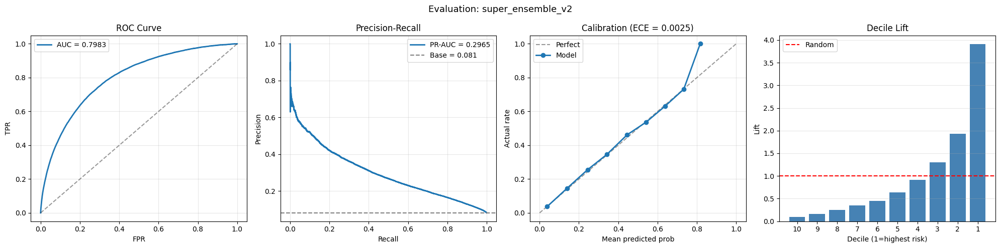

ValueError: could not convert string to float: 'super_ensemble_v2'

In [ ]:
# ========== CELL P5-FINAL: ULTIMATE SUPER-ENSEMBLE ==========
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
import json

# === Step 1: Build best 7-way blend với multi-seed ===
print('Step 1: Building best 7-way blend với multi-seed...')

# Use multi-seed instead of single-seed in blend
oofs_blend = {
    'lgb_v6':    oof_lgb_v6,
    'cb_v6':     oof_cb_v6,
    'lgb_v7_ms': oof_ms,         # ← multi-seed
    'cb_v7':     oof_cb_v7,
    'lgb_B':     oof_lgb_B,
    'xgb':       oof_xgb,
    'mlp':       oof_mlp,
}

# Grid search 7-way với multi-seed
import time
search_start = time.time()
print('Running 7-way weight search with multi-seed...')

best_auc_blend_ms = 0
best_w_blend_ms = None
step = 0.1
weight_range = np.arange(0, 1.05, step)

oof_arr = np.array(list(oofs_blend.values()))

for w1 in weight_range:
    for w2 in weight_range:
        if w1 + w2 > 1.0: continue
        for w3 in weight_range:
            if w1 + w2 + w3 > 1.0: continue
            for w4 in weight_range:
                if w1 + w2 + w3 + w4 > 1.0: continue
                for w5 in weight_range:
                    if w1 + w2 + w3 + w4 + w5 > 1.0: continue
                    for w6 in weight_range:
                        s6 = w1 + w2 + w3 + w4 + w5 + w6
                        if s6 > 1.0: continue
                        w7 = 1.0 - s6
                        if w7 < 0 or w7 > 1: continue

                        w = np.array([w1, w2, w3, w4, w5, w6, w7])
                        blend = np.dot(w, oof_arr)
                        auc = roc_auc_score(y, blend)
                        if auc > best_auc_blend_ms:
                            best_auc_blend_ms = auc
                            best_w_blend_ms = w

elapsed = time.time() - search_start
print(f'Search done in {elapsed:.1f}s')
print(f'Best 7-way blend với multi-seed: {best_auc_blend_ms:.5f}')
print(f'Weights: {dict(zip(oofs_blend.keys(), best_w_blend_ms.round(2)))}')

# Build best blend OOF
oof_blend_ms_best = np.dot(best_w_blend_ms, oof_arr)

# Build test blend
test_arrays = np.array([
    sub_lgb_v6['TARGET'].values,
    sub_cb_v6['TARGET'].values,
    sub_lgb_ms['TARGET'].values,
    sub_cb_v7['TARGET'].values,
    sub_lgb_B['TARGET'].values,
    sub_xgb['TARGET'].values,
    sub_mlp['TARGET'].values,
])
test_blend_ms_best = np.dot(best_w_blend_ms, test_arrays)

# === Step 2: Combine với LGBM Stacking v3 ===
print(f'\n{"="*70}')
print('Step 2: Combine 7-way blend MS + LGBM Stack v3')
print(f'{"="*70}')

# Load stack v3 (was saved as stack_v2)
oof_stack_v3 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_stack_v2.parquet')['oof_stack'].values
sub_stack_v3 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_stack_v2.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
test_stack_v3 = sub_stack_v3['TARGET'].values

# Component AUCs
print('Component AUCs:')
print(f'  7-way blend MS:    {best_auc_blend_ms:.5f}')
print(f'  LGBM Stack v3:     {roc_auc_score(y, oof_stack_v3):.5f}')

# Weighted search final 2-way
best_auc_final = 0
best_w_final = None
for w1 in np.arange(0, 1.01, 0.02):
    w2 = 1 - w1
    blend = w1 * oof_blend_ms_best + w2 * oof_stack_v3
    auc = roc_auc_score(y, blend)
    if auc > best_auc_final:
        best_auc_final = auc
        best_w_final = (w1, w2)

print(f'\nBest 2-way final super-ensemble: {best_auc_final:.5f}')
print(f'Weights:')
print(f'  7-way blend MS:    {best_w_final[0]:.2f}')
print(f'  LGBM Stack v3:     {best_w_final[1]:.2f}')

# Build final
oof_final = best_w_final[0] * oof_blend_ms_best + best_w_final[1] * oof_stack_v3
test_final = best_w_final[0] * test_blend_ms_best + best_w_final[1] * test_stack_v3

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_final = ev.evaluate_model(
    y_true=y,
    y_pred=oof_final,
    model_name='super_ensemble_v2',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_super': oof_final,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_super_ensemble_v2.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_final,
}).to_csv(cfg.OUTPUT_DIR / 'submission_super_ensemble_v2.csv', index=False)

summary = {
    'model': 'Super-Ensemble v2 (Multi-seed Blend + Stack v3)',
    'tag': 'super_ensemble_v2',
    'components': {
        'blend_7way_ms': {
            'cv_auc': float(best_auc_blend_ms),
            'weights': {n: float(w) for n, w in zip(oofs_blend.keys(), best_w_blend_ms)},
        },
        'stack_v3': {
            'cv_auc': float(roc_auc_score(y, oof_stack_v3)),
            'base_models': ['lgb_v6', 'cb_v6', 'lgb_v7_ms', 'cb_v7', 'lgb_B', 'xgb', 'mlp', 'lgb_C'],
        },
    },
    'final_weights': {
        'blend_7way_ms': float(best_w_final[0]),
        'stack_v3':      float(best_w_final[1]),
    },
    'cv_auc':         float(best_auc_final),
    'metrics':        {k: float(v) if not isinstance(v, list) else v for k, v in metrics_final.items()},
}
with open(cfg.OUTPUT_DIR / 'cv_summary_super_ensemble_v2.json', 'w') as f:
    json.dump(summary, f, indent=2)

# === FINAL PROGRESS ===
print(f'\n{"="*70}')
print(f'FINAL JOURNEY:')
print(f'{"="*70}')
print(f'  LGBM V6 baseline:           0.79420')
print(f'  Best single (LGBM V7):      0.79538')
print(f'  Multi-seed LGBM V7:         0.79712  (+0.00174)')
print(f'  5-way blend:                0.79748')
print(f'  7-way blend (single seed):  0.79779')
print(f'  Quick 7-way blend (MS):     0.79805')
print(f'  LGBM Stack v1:              0.79817')
print(f'  LGBM Stack v3 (MS+C):       0.79845')
print(f'  7-way blend MS (full):      {best_auc_blend_ms:.5f}')
print(f'  Super-ensemble v1:          0.79816')
print(f'  Super-ensemble v2:          {best_auc_final:.5f} FINAL')
print(f'  ─────────────────────────────────────────')
print(f'  Total gain from V6 baseline: {best_auc_final - 0.79420:+.5f}')
print(f'  Total gain from best single: {best_auc_final - 0.79538:+.5f}')
print(f'  Distance to 0.800 target:    {0.800 - best_auc_final:+.5f}')
print(f'{"="*70}')

### **TARGET NN500 Feature**

In [ ]:
# ========== PHASE A: TARGET_NN500_MEAN ==========
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from scipy.stats import spearmanr
import time
import gc

# Reload V7 if needed
if 'train' not in dir() or train.shape[1] < 600:
    train = pd.read_parquet('train_merged_v7.parquet')
    test = pd.read_parquet('test_merged_v7.parquet')

# NN features
NN_FEATURES = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']

if 'CREDIT_ANNUITY_RATIO' not in train.columns:
    if 'AMT_CREDIT' in train.columns and 'AMT_ANNUITY' in train.columns:
        train['CREDIT_ANNUITY_RATIO'] = train['AMT_CREDIT'] / (train['AMT_ANNUITY'] + 1)
        test['CREDIT_ANNUITY_RATIO'] = test['AMT_CREDIT'] / (test['AMT_ANNUITY'] + 1)

NN_FEATURES.append('CREDIT_ANNUITY_RATIO')
NN_FEATURES = [f for f in NN_FEATURES if f in train.columns]
print(f'NN features: {NN_FEATURES}')

# Prepare data
X_nn_train = train[NN_FEATURES].copy().replace([np.inf, -np.inf], np.nan)
X_nn_test = test[NN_FEATURES].copy().replace([np.inf, -np.inf], np.nan)

imputer = SimpleImputer(strategy='median')
X_nn_train_imp = imputer.fit_transform(X_nn_train)
X_nn_test_imp = imputer.transform(X_nn_test)

scaler = StandardScaler()
X_nn_train_scaled = scaler.fit_transform(X_nn_train_imp).astype(np.float32)
X_nn_test_scaled = scaler.transform(X_nn_test_imp).astype(np.float32)

N_NEIGHBORS = 500
y_arr = train[cfg.TARGET].astype(int).values

target_nn500_train = np.zeros(len(train), dtype=np.float32)

N_FOLDS = 5
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

print(f'Computing OOF NN feature (K-fold, N={N_NEIGHBORS})...')
start = time.time()

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_nn_train_scaled, y_arr)):
    nn_model = NearestNeighbors(n_neighbors=N_NEIGHBORS, n_jobs=-1, algorithm='ball_tree')
    nn_model.fit(X_nn_train_scaled[tr_idx])

    _, indices = nn_model.kneighbors(X_nn_train_scaled[val_idx])
    neighbor_targets = y_arr[tr_idx][indices]
    target_nn500_train[val_idx] = neighbor_targets.mean(axis=1)

    print(f'  Fold {fold_idx+1}/5 done | {time.time()-start:.0f}s')
    del nn_model
    gc.collect()

print(f'\nComputing test NN feature...')
nn_model_full = NearestNeighbors(n_neighbors=N_NEIGHBORS, n_jobs=-1, algorithm='ball_tree')
nn_model_full.fit(X_nn_train_scaled)
_, indices = nn_model_full.kneighbors(X_nn_test_scaled)
neighbor_targets = y_arr[indices]
target_nn500_test = neighbor_targets.mean(axis=1).astype(np.float32)

print(f'Total time: {time.time()-start:.0f}s')
print(f'\nTrain NN500: mean={target_nn500_train.mean():.4f}, std={target_nn500_train.std():.4f}')
print(f'Test NN500:  mean={target_nn500_test.mean():.4f}, std={target_nn500_test.std():.4f}')
print(f'Target rate: {y_arr.mean():.4f}')

corr = spearmanr(target_nn500_train, y_arr)[0]
print(f'Spearman correlation with TARGET: {corr:.4f}')

# Add to dataframes
train['TARGET_NN500_MEAN'] = target_nn500_train
test['TARGET_NN500_MEAN'] = target_nn500_test

# Save V8 parquets
train.to_parquet('train_merged_v8.parquet', index=False)
test.to_parquet('test_merged_v8.parquet', index=False)

# Save standalone feature
pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    'TARGET_NN500': target_nn500_train,
}).to_parquet(cfg.OUTPUT_DIR / 'feature_target_nn500_train.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'TARGET_NN500': target_nn500_test,
}).to_parquet(cfg.OUTPUT_DIR / 'feature_target_nn500_test.parquet', index=False)

del nn_model_full, X_nn_train_scaled, X_nn_test_scaled
gc.collect()

print('\nPhase A done. V8 parquets saved.')

NN features: ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CREDIT_ANNUITY_RATIO']
Computing OOF NN feature (K-fold, N=500)...
  Fold 1/5 done | 29s
  Fold 2/5 done | 58s
  Fold 3/5 done | 84s
  Fold 4/5 done | 110s
  Fold 5/5 done | 137s

Computing test NN feature...
Total time: 159s

Train NN500: mean=0.0814, std=0.0653
Test NN500:  mean=0.0830, std=0.0653
Target rate: 0.0807
Spearman correlation with TARGET: 0.2102

Phase A done. V8 parquets saved.


In [ ]:
# ========== PHASE B: TRAIN LGBM V8 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time
import gc
import json
import numpy as np
import pandas as pd

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

# Encode object
for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'V8 features: {len(feature_cols)}')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_v8 = np.zeros(len(train))
test_preds_v8 = np.zeros(len(test))
fold_scores = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training LGBM V8...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS, dtrain, num_boost_round=5000,
        valid_sets=[dtrain, dval], valid_names=['train', 'valid'],
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(200)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)
    train_preds = model.predict(X_tr, num_iteration=model.best_iteration)

    oof_v8[val_idx] = val_preds
    test_preds_v8 += test_fold_preds / N_FOLDS

    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    fi = pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    })
    fi_list.append(fi)

    elapsed = time.time() - fold_start
    print(f'Fold {fold_idx+1}/5 | train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {train_auc-val_auc:.4f} | best_iter: {model.best_iteration} | time: {elapsed:.1f}s')

    del model, dtrain, dval
    gc.collect()

cv_v8 = np.mean(fold_scores)
oof_v8_auc = roc_auc_score(y, oof_v8)
print('=' * 70)
print(f'LGBM V8 | CV mean: {cv_v8:.5f} +- {np.std(fold_scores):.5f}')
print(f'LGBM V8 | Full OOF: {oof_v8_auc:.5f}')
print(f'Gain vs LGBM V7: {cv_v8 - 0.79541:+.5f}')

# Save
sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_lgb': oof_v8,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v8.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_preds_v8,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v8.csv', index=False)

# FI
fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index().sort_values('importance', ascending=False)
fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v8.csv', index=False)

# Rankings of new features
fi_avg_idx = fi_avg.reset_index(drop=True)
nn500_rank = fi_avg_idx[fi_avg_idx['feature'] == 'TARGET_NN500_MEAN'].index
print(f'\nTARGET_NN500_MEAN rank: {nn500_rank[0]+1 if len(nn500_rank)>0 else "N/A"} / {len(fi_avg)}')
print(f'\nTop 10 features V8:')
print(fi_avg.head(10).to_string(index=False))

summary = {
    'model': 'LightGBM V8 (V7 + TARGET_NN500_MEAN)',
    'tag': 'lgb_v8',
    'n_folds': N_FOLDS,
    'cv_mean': float(cv_v8),
    'cv_std': float(np.std(fold_scores)),
    'full_oof_auc': float(oof_v8_auc),
    'fold_scores': [float(s) for s in fold_scores],
    'n_features': int(X.shape[1]),
    'new_features': ['TARGET_NN500_MEAN'],
    'gain_vs_v7': float(cv_v8 - 0.79541),
}
with open(cfg.OUTPUT_DIR / 'cv_summary_lgb_v8.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nPhase B done. LGBM V8 saved.')

V8 features: 641
Training LGBM V8...
Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.794756	valid's auc: 0.771458
[400]	train's auc: 0.816694	valid's auc: 0.781881
[600]	train's auc: 0.832243	valid's auc: 0.786295
[800]	train's auc: 0.845089	valid's auc: 0.788691
[1000]	train's auc: 0.855816	valid's auc: 0.789939
[1200]	train's auc: 0.86539	valid's auc: 0.790729
[1400]	train's auc: 0.873919	valid's auc: 0.791291
[1600]	train's auc: 0.881661	valid's auc: 0.791339
[1800]	train's auc: 0.88904	valid's auc: 0.791425
Early stopping, best iteration is:
[1720]	train's auc: 0.886217	valid's auc: 0.79148
Fold 1/5 | train AUC: 0.88622 | val AUC: 0.79148 | gap: 0.0947 | best_iter: 1720 | time: 265.4s
Training until validation scores don't improve for 200 rounds
[200]	train's auc: 0.792271	valid's auc: 0.780904
[400]	train's auc: 0.814688	valid's auc: 0.791859
[600]	train's auc: 0.830487	valid's auc: 0.796548
[800]	train's auc: 0.843036	valid's auc: 0.798754
[1000

All 12 base model solo AUCs:
  lgb_v6:        0.79420
  cb_v6:         0.79352
  lgb_v7:        0.79538
  cb_v7:         0.79446
  lgb_B:         0.79328
  xgb:           0.79446
  mlp:           0.77748
  mlp2:          0.78067
  lgb_v7_ms:     0.79712
  lgb_v7_tuned:  0.79548
  lgb_C:         0.76028
  lgb_v8:        0.79511  ← NEW

Meta-features shape: (307507, 17)

Training LGBM Stack v4 (12 models + 5 originals)...
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1913]	valid_0's auc: 0.795606
Fold 1/5 | val AUC: 0.79561 | best_iter: 1913
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1052]	valid_0's auc: 0.804902
Fold 2/5 | val AUC: 0.80490 | best_iter: 1052
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1162]	valid_0's auc: 0.795832
Fold 3/5 | val AUC: 0.79583 | best_iter: 1162
Training until validation scores don't improve for 100

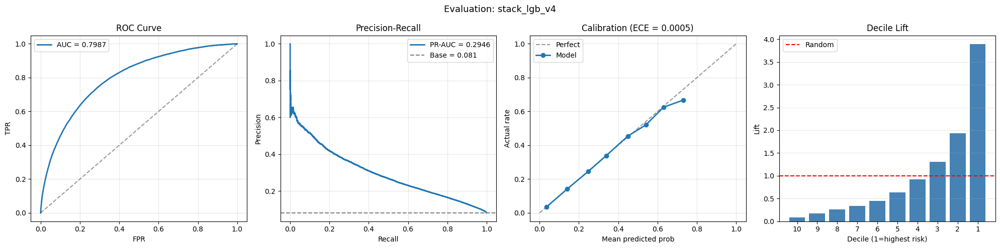


PROGRESS:
  LGBM V6 baseline:        0.79420
  Best single (V7 ms):     0.79712
  Stack v3 (12 models):    0.79845
  Stack v4 (+TARGET_NN500): 0.79874  ← NEW
  Distance to 0.800:        +0.00126


In [ ]:
# ========== PHASE C: RE-STACK WITH V8 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import json
import numpy as np
import pandas as pd

# Load all base OOFs
oof_lgb_v6       = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7       = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values
oof_xgb          = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values
oof_mlp          = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp.parquet')['oof_mlp'].values
oof_mlp2         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet')['oof_mlp'].values
oof_lgb_v7_ms    = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_lgb_v7_tuned = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_tuned.parquet')['oof_lgb'].values
oof_lgb_C        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values
oof_lgb_v8       = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v8.parquet')['oof_lgb'].values

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

sub_lgb_v6       = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7       = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb          = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp          = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp2         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp2.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_ms    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_tuned = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_tuned.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_C        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v8       = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v8.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

# Solo AUCs
print('All 12 base model solo AUCs:')
print(f'  lgb_v6:        {roc_auc_score(y, oof_lgb_v6):.5f}')
print(f'  cb_v6:         {roc_auc_score(y, oof_cb_v6):.5f}')
print(f'  lgb_v7:        {roc_auc_score(y, oof_lgb_v7):.5f}')
print(f'  cb_v7:         {roc_auc_score(y, oof_cb_v7):.5f}')
print(f'  lgb_B:         {roc_auc_score(y, oof_lgb_B):.5f}')
print(f'  xgb:           {roc_auc_score(y, oof_xgb):.5f}')
print(f'  mlp:           {roc_auc_score(y, oof_mlp):.5f}')
print(f'  mlp2:          {roc_auc_score(y, oof_mlp2):.5f}')
print(f'  lgb_v7_ms:     {roc_auc_score(y, oof_lgb_v7_ms):.5f}')
print(f'  lgb_v7_tuned:  {roc_auc_score(y, oof_lgb_v7_tuned):.5f}')
print(f'  lgb_C:         {roc_auc_score(y, oof_lgb_C):.5f}')
print(f'  lgb_v8:        {roc_auc_score(y, oof_lgb_v8):.5f}  ← NEW')

# Build meta-features
meta_train = pd.DataFrame({
    'lgb_v6':       oof_lgb_v6,
    'cb_v6':        oof_cb_v6,
    'lgb_v7':       oof_lgb_v7,
    'cb_v7':        oof_cb_v7,
    'lgb_B':        oof_lgb_B,
    'xgb':          oof_xgb,
    'mlp':          oof_mlp,
    'mlp2':         oof_mlp2,
    'lgb_v7_ms':    oof_lgb_v7_ms,
    'lgb_v7_tuned': oof_lgb_v7_tuned,
    'lgb_C':        oof_lgb_C,
    'lgb_v8':       oof_lgb_v8,
})

meta_test = pd.DataFrame({
    'lgb_v6':       sub_lgb_v6['TARGET'].values,
    'cb_v6':        sub_cb_v6['TARGET'].values,
    'lgb_v7':       sub_lgb_v7['TARGET'].values,
    'cb_v7':        sub_cb_v7['TARGET'].values,
    'lgb_B':        sub_lgb_B['TARGET'].values,
    'xgb':          sub_xgb['TARGET'].values,
    'mlp':          sub_mlp['TARGET'].values,
    'mlp2':         sub_mlp2['TARGET'].values,
    'lgb_v7_ms':    sub_lgb_v7_ms['TARGET'].values,
    'lgb_v7_tuned': sub_lgb_v7_tuned['TARGET'].values,
    'lgb_C':        sub_lgb_C['TARGET'].values,
    'lgb_v8':       sub_lgb_v8['TARGET'].values,
})

# Add top originals + TARGET_NN500
EXTRA_FEATURES = ['EXT_MEAN', 'EXT_MEDIAN', 'DAYS_BIRTH', 'CREDIT_TERM', 'TARGET_NN500_MEAN']

sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

for f in EXTRA_FEATURES:
    if f in train.columns:
        train_aligned = train.set_index('SK_ID_CURR').loc[sk_ids_train, f]
        test_aligned = test.set_index('SK_ID_CURR').loc[sk_ids_test, f]
        meta_train[f] = train_aligned.values
        meta_test[f] = test_aligned.values

meta_train = meta_train.replace([np.inf, -np.inf], np.nan)
meta_test = meta_test.replace([np.inf, -np.inf], np.nan)
medians = meta_train.median()
meta_train = meta_train.fillna(medians).astype(np.float32)
meta_test = meta_test.fillna(medians).astype(np.float32)

print(f'\nMeta-features shape: {meta_train.shape}')

# Train LGBM meta-learner
LGB_META_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': 3,
    'min_child_samples': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_stack_v4 = np.zeros(len(meta_train))
test_stack_v4 = np.zeros(len(meta_test))
fold_scores = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('\nTraining LGBM Stack v4 (12 models + 5 originals)...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
    X_tr, X_val = meta_train.iloc[tr_idx], meta_train.iloc[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
    dval = lgb.Dataset(X_val, label=y[val_idx])

    model = lgb.train(
        LGB_META_PARAMS, dtrain, num_boost_round=3000,
        valid_sets=[dval],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(meta_test, num_iteration=model.best_iteration)

    oof_stack_v4[val_idx] = val_preds
    test_stack_v4 += test_fold_preds / N_FOLDS

    val_auc = roc_auc_score(y[val_idx], val_preds)
    fold_scores.append(val_auc)
    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration}')

cv_stack_v4 = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM Stack v4 (with TARGET_NN500): {cv_stack_v4:.5f}')
print(f'Previous Stack v3:                 0.79845')
print(f'Gain:                              {cv_stack_v4 - 0.79845:+.5f}')

# Feature importance
fi_stack = pd.DataFrame({
    'feature': meta_train.columns,
    'importance': model.feature_importance(importance_type='gain'),
}).sort_values('importance', ascending=False)
print(f'\nStack v4 feature importance:')
print(fi_stack.to_string(index=False))

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_stack_v4 = ev.evaluate_model(
    y_true=y,
    y_pred=oof_stack_v4,
    model_name='stack_lgb_v4',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_stack': oof_stack_v4,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_stack_lgb_v4.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_stack_v4,
}).to_csv(cfg.OUTPUT_DIR / 'submission_stack_lgb_v4.csv', index=False)

summary = {
    'model': 'LGBM Stacking v4 (12 base + TARGET_NN500)',
    'cv_auc': float(cv_stack_v4),
    'gain_vs_stack_v3': float(cv_stack_v4 - 0.79845),
    'gain_vs_lgb_v6_baseline': float(cv_stack_v4 - 0.79420),
    'n_base_models': 12,
    'extra_features': EXTRA_FEATURES,
}
with open(cfg.OUTPUT_DIR / 'cv_summary_stack_lgb_v4.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'PROGRESS:')
print(f'  LGBM V6 baseline:        0.79420')
print(f'  Best single (V7 ms):     0.79712')
print(f'  Stack v3 (12 models):    0.79845')
print(f'  Stack v4 (+TARGET_NN500): {cv_stack_v4:.5f}  ← NEW')
print(f'  Distance to 0.800:        {0.800 - cv_stack_v4:+.5f}')
print(f'{"="*70}')

### **MULTI-SEED STACK v4**


Training Stack v4 with seed=7
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[2470]	valid_0's auc: 0.79595
  Fold 1/5 | val AUC: 0.79595 | best_iter: 2470
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[2238]	valid_0's auc: 0.799276
  Fold 2/5 | val AUC: 0.79928 | best_iter: 2238
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1409]	valid_0's auc: 0.801602
  Fold 3/5 | val AUC: 0.80160 | best_iter: 1409
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1588]	valid_0's auc: 0.797471
  Fold 4/5 | val AUC: 0.79747 | best_iter: 1588
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1410]	valid_0's auc: 0.801394
  Fold 5/5 | val AUC: 0.80139 | best_iter: 1410
  Seed 7 OOF AUC: 0.79903

Training Stack v4 with seed=99
Training until validation scores

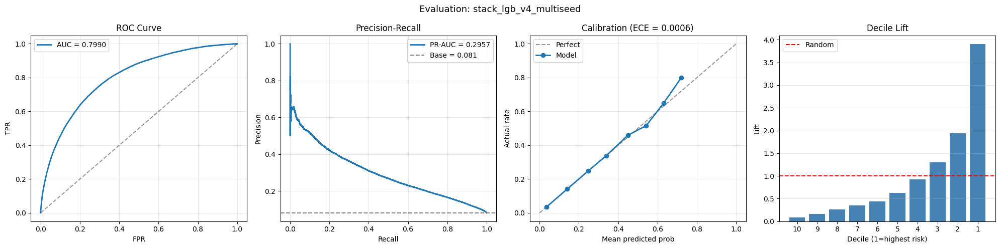


Saved multi-seed Stack v4

FINAL PROGRESS:
  LGBM V6 baseline:           0.79420
  Stack v3 (12 models):       0.79845
  Stack v4 (+TARGET_NN500):   0.79874
  Stack v4 Multi-Seed:        0.79904  ← FINAL
  Distance to 0.800:          +0.00096


In [ ]:
# ========== MULTI-SEED STACK v4 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import json

# Meta-features already built in Stack v4 (meta_train, meta_test exist)
# y is loaded

LGB_META_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': 3,
    'min_child_samples': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'n_jobs': -1,
}

N_FOLDS = 5
NEW_SEEDS = [7, 99, 2024]
stack_oofs = {42: oof_stack_v4}
stack_tests = {42: test_stack_v4}

for seed in NEW_SEEDS:
    print(f'\n{"="*70}')
    print(f'Training Stack v4 with seed={seed}')
    print(f'{"="*70}')

    params = {**LGB_META_PARAMS, 'random_state': seed}

    oof_seed = np.zeros(len(meta_train))
    test_seed = np.zeros(len(meta_test))

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
        X_tr, X_val = meta_train.iloc[tr_idx], meta_train.iloc[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
        dval = lgb.Dataset(X_val, label=y[val_idx])

        model = lgb.train(
            params, dtrain, num_boost_round=3000,
            valid_sets=[dval],
            callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(meta_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y[val_idx], val_preds)
        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration}')

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')

    stack_oofs[seed] = oof_seed
    stack_tests[seed] = test_seed

# Average across 4 seeds
oof_stack_v4_ms = np.mean([stack_oofs[s] for s in [42, 7, 99, 2024]], axis=0)
test_stack_v4_ms = np.mean([stack_tests[s] for s in [42, 7, 99, 2024]], axis=0)

multiseed_stack_auc = roc_auc_score(y, oof_stack_v4_ms)
print(f'\n{"="*70}')
print(f'MULTI-SEED STACK v4 RESULTS:')
print(f'{"="*70}')
print(f'  Seed 42:  {roc_auc_score(y, stack_oofs[42]):.5f}')
print(f'  Seed 7:   {roc_auc_score(y, stack_oofs[7]):.5f}')
print(f'  Seed 99:  {roc_auc_score(y, stack_oofs[99]):.5f}')
print(f'  Seed 2024:{roc_auc_score(y, stack_oofs[2024]):.5f}')
print(f'  Average:  {multiseed_stack_auc:.5f}')
print(f'  Gain vs single-seed Stack v4: {multiseed_stack_auc - 0.79874:+.5f}')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_ms = ev.evaluate_model(
    y_true=y,
    y_pred=oof_stack_v4_ms,
    model_name='stack_lgb_v4_multiseed',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_stack': oof_stack_v4_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_stack_lgb_v4_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': test_stack_v4_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_stack_lgb_v4_multiseed.csv', index=False)

summary = {
    'model': 'LGBM Stacking v4 Multi-Seed (42, 7, 99, 2024)',
    'cv_auc': float(multiseed_stack_auc),
    'gain_vs_single_seed': float(multiseed_stack_auc - 0.79874),
    'gain_vs_lgb_v6_baseline': float(multiseed_stack_auc - 0.79420),
    'seeds': [42, 7, 99, 2024],
}
with open(cfg.OUTPUT_DIR / 'cv_summary_stack_lgb_v4_multiseed.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nSaved multi-seed Stack v4')

print(f'\n{"="*70}')
print(f'FINAL PROGRESS:')
print(f'  LGBM V6 baseline:           0.79420')
print(f'  Stack v3 (12 models):       0.79845')
print(f'  Stack v4 (+TARGET_NN500):   0.79874')
print(f'  Stack v4 Multi-Seed:        {multiseed_stack_auc:.5f}  ← FINAL')
print(f'  Distance to 0.800:          {0.800 - multiseed_stack_auc:+.5f}')
print(f'{"="*70}')

## **add predicted features**

### **Predicted Interest Rate**

In [ ]:
# ========== PHASE X1.1: COMPUTE IR FROM PREV_APP ==========
import numpy as np
import pandas as pd

prev_app = pd.read_csv('/content/input/previous_application.csv')
print(f'previous_application: {prev_app.shape}')

def compute_ir(credit, annuity, n_payments):
    """Approximate annual interest rate."""
    valid = (credit > 0) & (annuity > 0) & (n_payments > 0)
    ir = np.full(len(credit), np.nan, dtype=np.float32)

    total_paid = annuity * n_payments
    total_interest = total_paid - credit
    ir_approx = total_interest / (credit * n_payments / 12.0 + 1)
    ir[valid] = ir_approx[valid]
    return ir

prev_app['IR_COMPUTED'] = compute_ir(
    prev_app['AMT_CREDIT'].values,
    prev_app['AMT_ANNUITY'].values,
    prev_app['CNT_PAYMENT'].values,
)
prev_app['IR_COMPUTED'] = prev_app['IR_COMPUTED'].clip(0, 5)

print(f'IR stats:')
print(prev_app['IR_COMPUTED'].describe())
print(f'Non-NaN: {prev_app["IR_COMPUTED"].notna().sum()} / {len(prev_app)}')

previous_application: (1670214, 37)
IR stats:
count    1.152941e+06
mean     2.588013e-01
std      1.224515e-01
min      0.000000e+00
25%      1.520954e-01
50%      2.324693e-01
75%      3.570760e-01
max      8.227639e-01
Name: IR_COMPUTED, dtype: float64
Non-NaN: 1152941 / 1670214


In [ ]:
# ========== PHASE X1.2: TRAIN IR PREDICTOR ==========
import lightgbm as lgb
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
import gc, time

ir_train_data = prev_app[prev_app['IR_COMPUTED'].notna()].copy()
print(f'IR training samples: {len(ir_train_data)}')

COMMON_FEATURES = [
    'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
    'CNT_PAYMENT', 'NAME_CONTRACT_TYPE',
    'NAME_PAYMENT_TYPE', 'NAME_GOODS_CATEGORY',
    'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
    'CHANNEL_TYPE', 'NAME_YIELD_GROUP',
    'PRODUCT_COMBINATION',
]
prev_features = [f for f in COMMON_FEATURES if f in ir_train_data.columns]
print(f'Features: {prev_features}')

X_ir = ir_train_data[prev_features].copy()
y_ir = ir_train_data['IR_COMPUTED'].values

cat_cols_ir = []
for col in prev_features:
    if X_ir[col].dtype == 'object':
        X_ir[col] = X_ir[col].fillna('MISSING').astype(str)
        codes, _ = pd.factorize(X_ir[col])
        X_ir[col] = codes.astype(np.int32)
        cat_cols_ir.append(col)

X_ir = X_ir.replace([np.inf, -np.inf], np.nan)

LGB_IR_PARAMS = {
    'objective': 'regression', 'metric': 'rmse',
    'learning_rate': 0.05, 'num_leaves': 31, 'max_depth': 6,
    'min_child_samples': 100, 'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

kf = KFold(n_splits=5, shuffle=True, random_state=42)
ir_models = []
rmse_scores = []

print('Training IR predictor...')
print('=' * 70)
start = time.time()

for fold_idx, (tr_idx, val_idx) in enumerate(kf.split(X_ir)):
    X_tr, X_val = X_ir.iloc[tr_idx], X_ir.iloc[val_idx]
    y_tr, y_val = y_ir[tr_idx], y_ir[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=cat_cols_ir)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_cols_ir)

    model = lgb.train(
        LGB_IR_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    rmse = np.sqrt(mean_squared_error(y_val, val_preds))
    r2 = r2_score(y_val, val_preds)

    rmse_scores.append(rmse)
    ir_models.append(model)

    print(f'Fold {fold_idx+1}/5 | RMSE: {rmse:.4f} | R²: {r2:.4f} | best_iter: {model.best_iteration}')
    del dtrain, dval
    gc.collect()

print('=' * 70)
print(f'Mean RMSE: {np.mean(rmse_scores):.4f}')
print(f'Time: {time.time()-start:.0f}s')

IR training samples: 1152941
Features: ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_PAYMENT', 'NAME_CONTRACT_TYPE', 'NAME_PAYMENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']
Training IR predictor...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	valid's rmse: 0.0222475
Fold 1/5 | RMSE: 0.0222 | R²: 0.9671 | best_iter: 2000
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	valid's rmse: 0.0223221
Fold 2/5 | RMSE: 0.0223 | R²: 0.9668 | best_iter: 2000
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	valid's rmse: 0.0223447
Fold 3/5 | RMSE: 0.0223 | R²: 0.9667 | best_iter: 2000
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	val

In [ ]:
# ========== PHASE X1.3: PREDICT IR ==========
app_train = pd.read_csv('/content/input/application_train.csv')
app_test = pd.read_csv('/content/input/application_test.csv')

app_train['CNT_PAYMENT_PROXY'] = app_train['AMT_CREDIT'] / (app_train['AMT_ANNUITY'] + 1)
app_test['CNT_PAYMENT_PROXY'] = app_test['AMT_CREDIT'] / (app_test['AMT_ANNUITY'] + 1)

def prepare_app_for_ir(df, cat_cols):
    result = pd.DataFrame()
    for f in prev_features:
        if f == 'CNT_PAYMENT':
            result[f] = df['CNT_PAYMENT_PROXY'].clip(0, 120).values
        elif f in df.columns:
            result[f] = df[f].values
        else:
            result[f] = np.nan

    for col in cat_cols:
        if col in result.columns:
            result[col] = result[col].fillna('MISSING').astype(str)
            codes, _ = pd.factorize(result[col])
            result[col] = codes.astype(np.int32)

    result = result.replace([np.inf, -np.inf], np.nan)
    return result

X_app_train = prepare_app_for_ir(app_train, cat_cols_ir)
X_app_test = prepare_app_for_ir(app_test, cat_cols_ir)

predicted_ir_train = np.zeros(len(app_train), dtype=np.float32)
predicted_ir_test = np.zeros(len(app_test), dtype=np.float32)

for model in ir_models:
    predicted_ir_train += model.predict(X_app_train, num_iteration=model.best_iteration) / len(ir_models)
    predicted_ir_test += model.predict(X_app_test, num_iteration=model.best_iteration) / len(ir_models)

print(f'Predicted IR train: mean={predicted_ir_train.mean():.4f}, std={predicted_ir_train.std():.4f}')

ir_train_map = pd.DataFrame({'SK_ID_CURR': app_train['SK_ID_CURR'].values, 'PREDICTED_IR': predicted_ir_train})
ir_test_map = pd.DataFrame({'SK_ID_CURR': app_test['SK_ID_CURR'].values, 'PREDICTED_IR': predicted_ir_test})

# Reload train V8
train = pd.read_parquet('train_merged_v8.parquet')
test = pd.read_parquet('test_merged_v8.parquet')

train = train.merge(ir_train_map, on='SK_ID_CURR', how='left')
test = test.merge(ir_test_map, on='SK_ID_CURR', how='left')

# Save standalone
ir_train_map.to_parquet(cfg.OUTPUT_DIR / 'feature_predicted_ir_train.parquet', index=False)
ir_test_map.to_parquet(cfg.OUTPUT_DIR / 'feature_predicted_ir_test.parquet', index=False)

# Save V9 parquets
train.to_parquet('train_merged_v9.parquet', index=False)
test.to_parquet('test_merged_v9.parquet', index=False)

from scipy.stats import spearmanr
y_arr = train[cfg.TARGET].astype(int).values
# Use the 'PREDICTED_IR' column from the merged 'train' DataFrame
corr_ir = spearmanr(train['PREDICTED_IR'].values, y_arr)[0]
print(f'Spearman correlation PREDICTED_IR with TARGET: {corr_ir:.4f}')

del app_train, app_test, prev_app, ir_train_data, X_app_train, X_app_test, X_ir
gc.collect()

print('V9 parquets saved.')

Predicted IR train: mean=0.1912, std=0.0348
Spearman correlation PREDICTED_IR with TARGET: 0.0171
V9 parquets saved.


### **LGBM v9 (fail)**

In [ ]:
# ========== PHASE X1.4: TRAIN LGBM V9 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc, json

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'V9 features: {len(feature_cols)}')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_v9 = np.zeros(len(train))
test_preds_v9 = np.zeros(len(test))
fold_scores = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training LGBM V9...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()
    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS, dtrain, num_boost_round=5000,
        valid_sets=[dtrain, dval], valid_names=['train', 'valid'],
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(500)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)
    train_preds = model.predict(X_tr, num_iteration=model.best_iteration)

    oof_v9[val_idx] = val_preds
    test_preds_v9 += test_fold_preds / N_FOLDS

    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    fi_list.append(pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    }))

    print(f'Fold {fold_idx+1}/5 | train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {train_auc-val_auc:.4f} | best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

cv_v9 = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM V9 | CV mean: {cv_v9:.5f}')
print(f'Gain vs LGBM V8: {cv_v9 - 0.79513:+.5f}')

sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_v9,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v9.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_preds_v9,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v9.csv', index=False)

fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index().sort_values('importance', ascending=False)
fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v9.csv', index=False)

ir_rank = fi_avg.reset_index(drop=True)
ir_rank = ir_rank[ir_rank['feature'] == 'PREDICTED_IR'].index
print(f'\nPREDICTED_IR rank: {ir_rank[0]+1 if len(ir_rank)>0 else "N/A"}')
print(f'Top 10 features V9:')
print(fi_avg.head(10).to_string(index=False))

print(f'\nLGBM V9 saved.')

V9 features: 642
Training LGBM V9...
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.825115	valid's auc: 0.784602
[1000]	train's auc: 0.855875	valid's auc: 0.790157
[1500]	train's auc: 0.877701	valid's auc: 0.79114
[2000]	train's auc: 0.896036	valid's auc: 0.791385
Early stopping, best iteration is:
[2121]	train's auc: 0.900175	valid's auc: 0.791457
Fold 1/5 | train AUC: 0.90018 | val AUC: 0.79146 | gap: 0.1087 | best_iter: 2121 | time: 315.4s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.822902	valid's auc: 0.794321
[1000]	train's auc: 0.853891	valid's auc: 0.799762
[1500]	train's auc: 0.876286	valid's auc: 0.801112
Early stopping, best iteration is:
[1478]	train's auc: 0.875285	valid's auc: 0.801264
Fold 2/5 | train AUC: 0.87528 | val AUC: 0.80126 | gap: 0.0740 | best_iter: 1478 | time: 240.8s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.824976	valid's auc: 0.785369
[1000]	tr

### **Predicted EXT_SOURCE NULL fill**

In [ ]:
# ========== PHASE X1b.1: ANALYZE EXT_SOURCE NULLS ==========
import numpy as np
import pandas as pd
import gc

# Reload V9 (đã có PREDICTED_IR)
train = pd.read_parquet('train_merged_v9.parquet')
test = pd.read_parquet('test_merged_v9.parquet')

print(f'Train: {train.shape}, Test: {test.shape}')

# Check NULL counts cho EXT_SOURCE
for col in ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']:
    null_train = train[col].isna().sum()
    null_test = test[col].isna().sum()
    print(f'{col}: train NULL = {null_train} ({null_train/len(train)*100:.1f}%), '
          f'test NULL = {null_test} ({null_test/len(test)*100:.1f}%)')

Train: (307507, 644), Test: (48744, 643)
EXT_SOURCE_1: train NULL = 173376 (56.4%), test NULL = 20532 (42.1%)
EXT_SOURCE_2: train NULL = 660 (0.2%), test NULL = 8 (0.0%)
EXT_SOURCE_3: train NULL = 60965 (19.8%), test NULL = 8668 (17.8%)


In [ ]:
# ========== PHASE X1b.2: PREDICT EXT_SOURCE_1 ==========
import lightgbm as lgb
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
import time, gc

TARGET_EXT = 'EXT_SOURCE_1'  # Highest NULL rate

# Features dùng predict EXT_SOURCE_1 (không dùng các EXT_SOURCE khác)
EXT_PREDICTOR_FEATURES = [
    'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
    'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'AMT_INCOME_TOTAL',
    'CODE_GENDER', 'NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE',
    'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE',
    'CNT_CHILDREN', 'CNT_FAM_MEMBERS',
    'REGION_POPULATION_RELATIVE', 'REGION_RATING_CLIENT',
    'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'OWN_CAR_AGE',
    'CREDIT_TERM', 'CREDIT_GOODS_RATIO', 'PAYMENT_RATE',
]
EXT_PREDICTOR_FEATURES = [f for f in EXT_PREDICTOR_FEATURES if f in train.columns]
print(f'Predictor features: {len(EXT_PREDICTOR_FEATURES)}')

# Build training data: rows with EXT_SOURCE_1 not null
combined = pd.concat([train, test], ignore_index=True)
combined['is_test'] = [0]*len(train) + [1]*len(test)

ext_train_mask = combined[TARGET_EXT].notna()
ext_train = combined[ext_train_mask].copy()
ext_test = combined[~ext_train_mask].copy()

print(f'EXT_SOURCE_1 training samples: {len(ext_train)}')
print(f'EXT_SOURCE_1 to predict:       {len(ext_test)}')

X_ext = ext_train[EXT_PREDICTOR_FEATURES].copy()
y_ext = ext_train[TARGET_EXT].values
X_ext_pred = ext_test[EXT_PREDICTOR_FEATURES].copy()

cat_cols_ext = []
for col in EXT_PREDICTOR_FEATURES:
    if X_ext[col].dtype == 'object':
        X_ext[col] = X_ext[col].fillna('MISSING').astype(str)
        X_ext_pred[col] = X_ext_pred[col].fillna('MISSING').astype(str)
        combined_vals = pd.concat([X_ext[col], X_ext_pred[col]])
        codes, _ = pd.factorize(combined_vals)
        X_ext[col] = codes[:len(X_ext)].astype(np.int32)
        X_ext_pred[col] = codes[len(X_ext):].astype(np.int32)
        cat_cols_ext.append(col)

X_ext = X_ext.replace([np.inf, -np.inf], np.nan)
X_ext_pred = X_ext_pred.replace([np.inf, -np.inf], np.nan)

LGB_EXT_PARAMS = {
    'objective': 'regression', 'metric': 'rmse',
    'learning_rate': 0.05, 'num_leaves': 31, 'max_depth': 6,
    'min_child_samples': 100, 'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

kf = KFold(n_splits=5, shuffle=True, random_state=42)
ext_models = []
rmse_scores = []

print(f'Training EXT_SOURCE_1 predictor...')
print('=' * 70)
start = time.time()

for fold_idx, (tr_idx, val_idx) in enumerate(kf.split(X_ext)):
    X_tr, X_val = X_ext.iloc[tr_idx], X_ext.iloc[val_idx]
    y_tr, y_val = y_ext[tr_idx], y_ext[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=cat_cols_ext)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_cols_ext)

    model = lgb.train(
        LGB_EXT_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    rmse = np.sqrt(mean_squared_error(y_val, val_preds))
    r2 = r2_score(y_val, val_preds)

    rmse_scores.append(rmse)
    ext_models.append(model)
    print(f'Fold {fold_idx+1}/5 | RMSE: {rmse:.4f} | R²: {r2:.4f}')
    del dtrain, dval
    gc.collect()

print(f'\nMean RMSE: {np.mean(rmse_scores):.4f}')
print(f'Time: {time.time()-start:.0f}s')

# Predict missing values
predicted_ext1 = np.zeros(len(X_ext_pred), dtype=np.float32)
for model in ext_models:
    predicted_ext1 += model.predict(X_ext_pred, num_iteration=model.best_iteration) / len(ext_models)

# Map back
ext_test['PREDICTED_EXT_SOURCE_1'] = predicted_ext1
ext_train['PREDICTED_EXT_SOURCE_1'] = ext_train[TARGET_EXT].values  # Original values for non-null

combined['PREDICTED_EXT_SOURCE_1'] = np.nan
combined.loc[ext_train_mask, 'PREDICTED_EXT_SOURCE_1'] = ext_train['PREDICTED_EXT_SOURCE_1'].values
combined.loc[~ext_train_mask, 'PREDICTED_EXT_SOURCE_1'] = ext_test['PREDICTED_EXT_SOURCE_1'].values

# Split back train/test
train['PREDICTED_EXT_SOURCE_1'] = combined.iloc[:len(train)]['PREDICTED_EXT_SOURCE_1'].values.astype(np.float32)
test['PREDICTED_EXT_SOURCE_1'] = combined.iloc[len(train):]['PREDICTED_EXT_SOURCE_1'].values.astype(np.float32)

print(f'\nPREDICTED_EXT_SOURCE_1 stats:')
print(f'  Train: mean={train["PREDICTED_EXT_SOURCE_1"].mean():.4f}, NaN={train["PREDICTED_EXT_SOURCE_1"].isna().sum()}')
print(f'  Test:  mean={test["PREDICTED_EXT_SOURCE_1"].mean():.4f}, NaN={test["PREDICTED_EXT_SOURCE_1"].isna().sum()}')

del combined, ext_train, ext_test, ext_models, X_ext, X_ext_pred
gc.collect()

Predictor features: 25
EXT_SOURCE_1 training samples: 162343
EXT_SOURCE_1 to predict:       193908
Training EXT_SOURCE_1 predictor...
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[427]	valid's rmse: 0.153478
Fold 1/5 | RMSE: 0.1535 | R²: 0.4689
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[529]	valid's rmse: 0.152568
Fold 2/5 | RMSE: 0.1526 | R²: 0.4779
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[443]	valid's rmse: 0.153029
Fold 3/5 | RMSE: 0.1530 | R²: 0.4653
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[476]	valid's rmse: 0.152023
Fold 4/5 | RMSE: 0.1520 | R²: 0.4744
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[508]	valid's rmse: 0.152575
Fold 5/5 | RMSE: 0.1526 | R²: 0.4696

Mean RMSE: 0.1527
Time: 29s

PREDICTED_EXT_SOURCE_

20

In [ ]:
# ========== PHASE X1b.3: PREDICT EXT_SOURCE_3 ==========
TARGET_EXT = 'EXT_SOURCE_3'  # Second highest NULL

combined = pd.concat([train, test], ignore_index=True)
ext_train_mask = combined[TARGET_EXT].notna()
ext_train = combined[ext_train_mask].copy()
ext_test = combined[~ext_train_mask].copy()

print(f'EXT_SOURCE_3 training samples: {len(ext_train)}')
print(f'EXT_SOURCE_3 to predict:       {len(ext_test)}')

X_ext = ext_train[EXT_PREDICTOR_FEATURES].copy()
y_ext = ext_train[TARGET_EXT].values
X_ext_pred = ext_test[EXT_PREDICTOR_FEATURES].copy()

cat_cols_ext = []
for col in EXT_PREDICTOR_FEATURES:
    if X_ext[col].dtype == 'object':
        X_ext[col] = X_ext[col].fillna('MISSING').astype(str)
        X_ext_pred[col] = X_ext_pred[col].fillna('MISSING').astype(str)
        combined_vals = pd.concat([X_ext[col], X_ext_pred[col]])
        codes, _ = pd.factorize(combined_vals)
        X_ext[col] = codes[:len(X_ext)].astype(np.int32)
        X_ext_pred[col] = codes[len(X_ext):].astype(np.int32)
        cat_cols_ext.append(col)

X_ext = X_ext.replace([np.inf, -np.inf], np.nan)
X_ext_pred = X_ext_pred.replace([np.inf, -np.inf], np.nan)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
ext_models = []
rmse_scores = []

print(f'Training EXT_SOURCE_3 predictor...')
print('=' * 70)
start = time.time()

for fold_idx, (tr_idx, val_idx) in enumerate(kf.split(X_ext)):
    X_tr, X_val = X_ext.iloc[tr_idx], X_ext.iloc[val_idx]
    y_tr, y_val = y_ext[tr_idx], y_ext[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=cat_cols_ext)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=cat_cols_ext)

    model = lgb.train(
        LGB_EXT_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    rmse = np.sqrt(mean_squared_error(y_val, val_preds))
    rmse_scores.append(rmse)
    ext_models.append(model)
    print(f'Fold {fold_idx+1}/5 | RMSE: {rmse:.4f}')
    del dtrain, dval
    gc.collect()

print(f'Mean RMSE: {np.mean(rmse_scores):.4f}, Time: {time.time()-start:.0f}s')

predicted_ext3 = np.zeros(len(X_ext_pred), dtype=np.float32)
for model in ext_models:
    predicted_ext3 += model.predict(X_ext_pred, num_iteration=model.best_iteration) / len(ext_models)

ext_test['PREDICTED_EXT_SOURCE_3'] = predicted_ext3
ext_train['PREDICTED_EXT_SOURCE_3'] = ext_train[TARGET_EXT].values

combined['PREDICTED_EXT_SOURCE_3'] = np.nan
combined.loc[ext_train_mask, 'PREDICTED_EXT_SOURCE_3'] = ext_train['PREDICTED_EXT_SOURCE_3'].values
combined.loc[~ext_train_mask, 'PREDICTED_EXT_SOURCE_3'] = ext_test['PREDICTED_EXT_SOURCE_3'].values

train['PREDICTED_EXT_SOURCE_3'] = combined.iloc[:len(train)]['PREDICTED_EXT_SOURCE_3'].values.astype(np.float32)
test['PREDICTED_EXT_SOURCE_3'] = combined.iloc[len(train):]['PREDICTED_EXT_SOURCE_3'].values.astype(np.float32)

# Save V10
train.to_parquet('train_merged_v10.parquet', index=False)
test.to_parquet('test_merged_v10.parquet', index=False)

del combined, ext_train, ext_test, ext_models
gc.collect()

print('V10 parquets saved (with PREDICTED_EXT_SOURCE_1 + PREDICTED_EXT_SOURCE_3)')

EXT_SOURCE_3 training samples: 286618
EXT_SOURCE_3 to predict:       69633
Training EXT_SOURCE_3 predictor...
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[761]	valid's rmse: 0.18182
Fold 1/5 | RMSE: 0.1818
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[766]	valid's rmse: 0.181283
Fold 2/5 | RMSE: 0.1813
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[838]	valid's rmse: 0.181774
Fold 3/5 | RMSE: 0.1818
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[766]	valid's rmse: 0.182085
Fold 4/5 | RMSE: 0.1821
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[760]	valid's rmse: 0.181873
Fold 5/5 | RMSE: 0.1819
Mean RMSE: 0.1818, Time: 64s
V10 parquets saved (with PREDICTED_EXT_SOURCE_1 + PREDICTED_EXT_SOURCE_3)


### **LGBM v10**

In [ ]:
# ========== PHASE X1b.4: TRAIN LGBM V10 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc, json
import numpy as np
import pandas as pd

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'V10 features: {len(feature_cols)}')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_v10 = np.zeros(len(train))
test_preds_v10 = np.zeros(len(test))
fold_scores = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training LGBM V10...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()
    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS, dtrain, num_boost_round=5000,
        valid_sets=[dtrain, dval], valid_names=['train', 'valid'],
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(500)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)
    train_preds = model.predict(X_tr, num_iteration=model.best_iteration)

    oof_v10[val_idx] = val_preds
    test_preds_v10 += test_fold_preds / N_FOLDS

    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    fi_list.append(pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    }))

    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | gap: {train_auc-val_auc:.4f} | '
          f'best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

cv_v10 = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM V10 | CV mean: {cv_v10:.5f}')
print(f'Gain vs V9: {cv_v10 - 0.79513:+.5f}')  # Adjust based on V9 result

sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_v10,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v10.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_preds_v10,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v10.csv', index=False)

fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index().sort_values('importance', ascending=False)
fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v10.csv', index=False)

fi_avg_idx = fi_avg.reset_index(drop=True)
for new_feat in ['PREDICTED_IR', 'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3', 'TARGET_NN500_MEAN']:
    rank = fi_avg_idx[fi_avg_idx['feature'] == new_feat].index
    print(f'  {new_feat:30s}: rank {rank[0]+1 if len(rank)>0 else "N/A"}')

print(f'\nTop 10 features V10:')
print(fi_avg.head(10).to_string(index=False))

print(f'\nLGBM V10 saved.')

V10 features: 644
Training LGBM V10...
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.826014	valid's auc: 0.786037
[1000]	train's auc: 0.856524	valid's auc: 0.791114
[1500]	train's auc: 0.878623	valid's auc: 0.792124
[2000]	train's auc: 0.896889	valid's auc: 0.792526
Early stopping, best iteration is:
[2069]	train's auc: 0.899195	valid's auc: 0.792637
Fold 1/5 | val AUC: 0.79264 | gap: 0.1066 | best_iter: 2069 | time: 320.6s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.824437	valid's auc: 0.795643
[1000]	train's auc: 0.854883	valid's auc: 0.800817
[1500]	train's auc: 0.877159	valid's auc: 0.801899
[2000]	train's auc: 0.895841	valid's auc: 0.802095
Early stopping, best iteration is:
[2190]	train's auc: 0.902148	valid's auc: 0.802324
Fold 2/5 | val AUC: 0.80232 | gap: 0.0998 | best_iter: 2190 | time: 324.1s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.826495	valid's auc: 0.7865

## **Aggressive train v11**

### **BUREAU/PREV CROSS-INTERACTIONS**

In [ ]:
# ========== PHASE 1: BUREAU/PREV CROSS-INTERACTIONS ==========
import numpy as np
import pandas as pd
import gc

# Reload V10 (đã có TARGET_NN500, PREDICTED_IR, PREDICTED_EXT_SOURCE_1/3)
train = pd.read_parquet('train_merged_v10.parquet')
test = pd.read_parquet('test_merged_v10.parquet')

print(f'V10: train={train.shape}, test={test.shape}')

def add_cross_features(df):
    """Add cross-table interactions."""
    eps = 1e-5

    # === Bureau × Application interactions ===
    if 'bur_AMT_CREDIT_SUM_DEBT_mean' in df.columns and 'AMT_CREDIT' in df.columns:
        df['BUR_DEBT_TO_CURRENT_CREDIT'] = df['bur_AMT_CREDIT_SUM_DEBT_mean'] / (df['AMT_CREDIT'] + eps)

    if 'bur_AMT_CREDIT_SUM_mean' in df.columns and 'AMT_CREDIT' in df.columns:
        df['BUR_CREDIT_TO_CURRENT_CREDIT'] = df['bur_AMT_CREDIT_SUM_mean'] / (df['AMT_CREDIT'] + eps)

    if 'bur_AMT_ANNUITY_mean' in df.columns and 'AMT_ANNUITY' in df.columns:
        df['BUR_ANNUITY_TO_CURRENT_ANNUITY'] = df['bur_AMT_ANNUITY_mean'] / (df['AMT_ANNUITY'] + eps)

    if 'bur_DAYS_CREDIT_mean' in df.columns and 'DAYS_BIRTH' in df.columns:
        df['BUR_DAYS_CREDIT_TO_AGE'] = df['bur_DAYS_CREDIT_mean'] / (df['DAYS_BIRTH'] - eps)

    if 'bur_count' in df.columns and 'DAYS_BIRTH' in df.columns:
        df['BUR_COUNT_PER_YEAR'] = df['bur_count'] / ((-df['DAYS_BIRTH'] / 365.25) + eps)

    # === Previous Application × Application interactions ===
    if 'pa_AMT_CREDIT_mean' in df.columns and 'AMT_CREDIT' in df.columns:
        df['PA_CREDIT_TO_CURRENT_CREDIT'] = df['pa_AMT_CREDIT_mean'] / (df['AMT_CREDIT'] + eps)

    if 'pa_AMT_APPLICATION_mean' in df.columns and 'AMT_CREDIT' in df.columns:
        df['PA_APPLICATION_TO_CURRENT_CREDIT'] = df['pa_AMT_APPLICATION_mean'] / (df['AMT_CREDIT'] + eps)

    if 'pa_AMT_ANNUITY_mean' in df.columns and 'AMT_ANNUITY' in df.columns:
        df['PA_ANNUITY_TO_CURRENT_ANNUITY'] = df['pa_AMT_ANNUITY_mean'] / (df['AMT_ANNUITY'] + eps)

    if 'pa_count' in df.columns and 'bur_count' in df.columns:
        df['PA_BUR_COUNT_RATIO'] = df['pa_count'] / (df['bur_count'] + eps)
        df['PA_BUR_COUNT_DIFF'] = df['pa_count'] - df['bur_count']

    # === Installment × Current interactions ===
    if 'ip_total_actual_payment' in df.columns and 'AMT_CREDIT' in df.columns:
        df['INST_PAYMENT_TO_CURRENT_CREDIT'] = df['ip_total_actual_payment'] / (df['AMT_CREDIT'] + eps)

    if 'ip_total_late_days_1y' in df.columns and 'DAYS_BIRTH' in df.columns:
        df['INST_LATE_DAYS_PER_AGE'] = df['ip_total_late_days_1y'] / ((-df['DAYS_BIRTH'] / 365.25) + eps)

    # === Credit Card × Current ===
    if 'cc_AMT_BALANCE_mean' in df.columns and 'AMT_CREDIT' in df.columns:
        df['CC_BALANCE_TO_CURRENT_CREDIT'] = df['cc_AMT_BALANCE_mean'] / (df['AMT_CREDIT'] + eps)

    # === Cross-source: total debt picture ===
    debt_components = []
    if 'bur_AMT_CREDIT_SUM_DEBT_mean' in df.columns:
        debt_components.append(df['bur_AMT_CREDIT_SUM_DEBT_mean'].fillna(0))
    if 'cc_AMT_BALANCE_mean' in df.columns:
        debt_components.append(df['cc_AMT_BALANCE_mean'].fillna(0))

    if len(debt_components) >= 2:
        df['TOTAL_EXTERNAL_DEBT'] = sum(debt_components)
        df['TOTAL_EXTERNAL_DEBT_TO_INCOME'] = df['TOTAL_EXTERNAL_DEBT'] / (df['AMT_INCOME_TOTAL'] + eps)

    # === Behavioral patterns ===
    if 'PREDICTED_EXT_SOURCE_1' in df.columns and 'EXT_SOURCE_2' in df.columns:
        df['EXT1_PREDICTED_x_EXT2'] = df['PREDICTED_EXT_SOURCE_1'] * df['EXT_SOURCE_2']

    if 'PREDICTED_EXT_SOURCE_3' in df.columns and 'EXT_SOURCE_2' in df.columns:
        df['EXT3_PREDICTED_x_EXT2'] = df['PREDICTED_EXT_SOURCE_3'] * df['EXT_SOURCE_2']

    # === TARGET_NN500 interactions ===
    if 'TARGET_NN500_MEAN' in df.columns and 'EXT_MEAN' in df.columns:
        df['NN500_x_EXT_MEAN'] = df['TARGET_NN500_MEAN'] * df['EXT_MEAN']

    if 'TARGET_NN500_MEAN' in df.columns and 'CREDIT_TERM' in df.columns:
        df['NN500_x_CREDIT_TERM'] = df['TARGET_NN500_MEAN'] * df['CREDIT_TERM']

    return df

print('Adding cross-interaction features...')
train = add_cross_features(train)
test = add_cross_features(test)

print(f'V11: train={train.shape}, test={test.shape}')
new_features = [c for c in train.columns if c not in pd.read_parquet('train_merged_v10.parquet').columns]
print(f'New features added: {len(new_features)}')
for f in new_features:
    print(f'  {f}')

train.to_parquet('train_merged_v11.parquet', index=False)
test.to_parquet('test_merged_v11.parquet', index=False)
print('\nV11 parquets saved.')

del new_features
gc.collect()

V10: train=(307507, 646), test=(48744, 645)
Adding cross-interaction features...
V11: train=(307507, 652), test=(48744, 651)
New features added: 6
  INST_PAYMENT_TO_CURRENT_CREDIT
  INST_LATE_DAYS_PER_AGE
  EXT1_PREDICTED_x_EXT2
  EXT3_PREDICTED_x_EXT2
  NN500_x_EXT_MEAN
  NN500_x_CREDIT_TERM

V11 parquets saved.


0

### **LGBM V11 BASELINE (seed 42)**

In [ ]:
# ========== TRAIN LGBM V11 BASELINE (seed 42) ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc, json
import numpy as np
import pandas as pd

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'V11 features: {len(feature_cols)}')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_v11 = np.zeros(len(train))
test_preds_v11 = np.zeros(len(test))
fold_scores = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training LGBM V11 (seed=42)...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()
    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS, dtrain, num_boost_round=5000,
        valid_sets=[dtrain, dval], valid_names=['train', 'valid'],
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(500)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)

    oof_v11[val_idx] = val_preds
    test_preds_v11 += test_fold_preds / N_FOLDS

    train_preds = model.predict(X_tr, num_iteration=model.best_iteration)
    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    fi_list.append(pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    }))

    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | gap: {train_auc-val_auc:.4f} | '
          f'best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

cv_v11 = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM V11 (seed 42) CV: {cv_v11:.5f}')
print(f'Gain vs V10:           {cv_v11 - 0.79588:+.5f}')

# Save baseline V11
sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_v11,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_preds_v11,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11.csv', index=False)

fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index().sort_values('importance', ascending=False)
fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v11.csv', index=False)

# Check ranks of new cross-features
fi_avg_idx = fi_avg.reset_index(drop=True)
cross_feats = [c for c in feature_cols if c not in pd.read_parquet('train_merged_v10.parquet').columns]
print(f'\nNew cross-features ranks:')
for f in cross_feats:
    rank = fi_avg_idx[fi_avg_idx['feature'] == f].index
    if len(rank) > 0:
        print(f'  {f:50s}: rank {rank[0]+1}')

print(f'\nTop 10 V11:')
print(fi_avg.head(10).to_string(index=False))

V11 features: 650
Training LGBM V11 (seed=42)...
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.826534	valid's auc: 0.786707
[1000]	train's auc: 0.85718	valid's auc: 0.791583
[1500]	train's auc: 0.879208	valid's auc: 0.792431
[2000]	train's auc: 0.897106	valid's auc: 0.792985
Early stopping, best iteration is:
[1909]	train's auc: 0.893967	valid's auc: 0.793021
Fold 1/5 | val AUC: 0.79302 | gap: 0.1009 | best_iter: 1909 | time: 295.6s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.824677	valid's auc: 0.796663
[1000]	train's auc: 0.855236	valid's auc: 0.801443
[1500]	train's auc: 0.877682	valid's auc: 0.802235
Early stopping, best iteration is:
[1441]	train's auc: 0.875271	valid's auc: 0.80229
Fold 2/5 | val AUC: 0.80229 | gap: 0.0730 | best_iter: 1441 | time: 234.6s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.826829	valid's auc: 0.785892
[1000]	train's auc: 0.856732	valid's auc

In [ ]:
# ========== PHASE 2: LGBM V11 MULTI-SEED (3 NEW SEEDS) ==========
NEW_SEEDS = [7, 99, 2024]
oof_v11_seeds = {42: oof_v11}
test_v11_seeds = {42: test_preds_v11}

for seed in NEW_SEEDS:
    print(f'\n{"="*70}')
    print(f'Training LGBM V11 with seed={seed}')
    print(f'{"="*70}')

    params = {**LGB_PARAMS, 'random_state': seed}

    oof_seed = np.zeros(len(train))
    test_seed = np.zeros(len(test))
    fold_scores = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
        fold_start = time.time()
        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
        dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

        model = lgb.train(
            params, dtrain, num_boost_round=5000,
            valid_sets=[dval], valid_names=['valid'],
            callbacks=[lgb.early_stopping(200), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y_val, val_preds)
        fold_scores.append(val_auc)

        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | time: {time.time()-fold_start:.1f}s')
        del model, dtrain, dval
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')

    oof_v11_seeds[seed] = oof_seed
    test_v11_seeds[seed] = test_seed

# Average all 4 seeds
oof_v11_ms = np.mean(list(oof_v11_seeds.values()), axis=0)
test_v11_ms = np.mean(list(test_v11_seeds.values()), axis=0)

ms_auc = roc_auc_score(y, oof_v11_ms)
print(f'\n{"="*70}')
print(f'LGBM V11 MULTI-SEED RESULTS:')
print(f'{"="*70}')
for seed, oof in oof_v11_seeds.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed average: {ms_auc:.5f}')
print(f'  Gain vs V11 solo:   {ms_auc - cv_v11:+.5f}')

# Save multi-seed
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_v11_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_v11_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv', index=False)

print('\nLGBM V11 multi-seed saved.')


Training LGBM V11 with seed=7
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2243]	valid's auc: 0.792568
  Fold 1/5 | val AUC: 0.79257 | time: 283.6s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1515]	valid's auc: 0.797224
  Fold 2/5 | val AUC: 0.79722 | time: 211.6s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1969]	valid's auc: 0.798463
  Fold 3/5 | val AUC: 0.79846 | time: 252.8s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1943]	valid's auc: 0.793788
  Fold 4/5 | val AUC: 0.79379 | time: 251.8s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2415]	valid's auc: 0.797231
  Fold 5/5 | val AUC: 0.79723 | time: 297.6s
  Seed 7 OOF AUC: 0.79582

Training LGBM V11 with seed=99
Training until validation scores don't improve for 200 r

### **CatBoost V11**

In [ ]:
# ========== PHASE 3: CATBOOST V11 ==========
from catboost import CatBoostClassifier, Pool

# Reload V11 fresh
train_cb = pd.read_parquet('train_merged_v11.parquet')
test_cb = pd.read_parquet('test_merged_v11.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols_cb = [c for c in train_cb.columns if c not in EXCLUDE_COLS]

# CatBoost handles strings natively
for col in feature_cols_cb:
    if train_cb[col].dtype == 'object':
        train_cb[col] = train_cb[col].fillna('MISSING').astype(str)
        test_cb[col] = test_cb[col].fillna('MISSING').astype(str)

# Fill numeric NaN với -999
for col in feature_cols_cb:
    if col not in FORCE_CATEGORICAL:
        train_cb[col] = train_cb[col].replace([np.inf, -np.inf], np.nan).fillna(-999)
        test_cb[col] = test_cb[col].replace([np.inf, -np.inf], np.nan).fillna(-999)
    else:
        train_cb[col] = train_cb[col].fillna('MISSING').astype(str)
        test_cb[col] = test_cb[col].fillna('MISSING').astype(str)

cat_indices = [feature_cols_cb.index(c) for c in FORCE_CATEGORICAL if c in feature_cols_cb]
print(f'CatBoost V11: {len(feature_cols_cb)} features, {len(cat_indices)} categorical')

y = train_cb[cfg.TARGET].astype(int).values
X_cb = train_cb[feature_cols_cb]
X_test_cb = test_cb[feature_cols_cb]

CB_PARAMS = {
    'iterations': 3000,
    'learning_rate': 0.04,
    'depth': 6,
    'l2_leaf_reg': 5,
    'bagging_temperature': 0.2,
    'random_strength': 1.0,
    'border_count': 128,
    'eval_metric': 'AUC',
    'loss_function': 'Logloss',
    'task_type': 'CPU',
    'thread_count': -1,
    'verbose': 200,
    'early_stopping_rounds': 150,
    'random_seed': 42,
}

N_FOLDS = 5
oof_cb_v11 = np.zeros(len(train_cb))
test_cb_v11 = np.zeros(len(test_cb))
fold_scores = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training CatBoost V11...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_cb, y)):
    fold_start = time.time()
    X_tr, X_val = X_cb.iloc[tr_idx], X_cb.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    train_pool = Pool(X_tr, y_tr, cat_features=cat_indices)
    val_pool = Pool(X_val, y_val, cat_features=cat_indices)
    test_pool = Pool(X_test_cb, cat_features=cat_indices)

    model = CatBoostClassifier(**CB_PARAMS)
    model.fit(train_pool, eval_set=val_pool, use_best_model=True)

    val_preds = model.predict_proba(val_pool)[:, 1]
    test_fold_preds = model.predict_proba(test_pool)[:, 1]

    oof_cb_v11[val_idx] = val_preds
    test_cb_v11 += test_fold_preds / N_FOLDS

    train_preds = model.predict_proba(train_pool)[:, 1]
    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    print(f'Fold {fold_idx+1}/5 | train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {train_auc-val_auc:.4f} | best_iter: {model.get_best_iteration()} | '
          f'time: {time.time()-fold_start:.1f}s')
    del model, train_pool, val_pool, test_pool
    gc.collect()

cv_cb_v11 = np.mean(fold_scores)
print('=' * 70)
print(f'CatBoost V11 CV: {cv_cb_v11:.5f}')
print(f'Gain vs CatBoost V7 (0.79352): {cv_cb_v11 - 0.79352:+.5f}')

# Save
sk_ids_train = train_cb['SK_ID_CURR'].values
sk_ids_test = test_cb['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_cb': oof_cb_v11,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_cb_v11,
}).to_csv(cfg.OUTPUT_DIR / 'submission_cb_v11.csv', index=False)

del train_cb, test_cb
gc.collect()

print('\nCatBoost V11 saved.')

CatBoost V11: 650 features, 12 categorical
Training CatBoost V11...
0:	test: 0.6853393	best: 0.6853393 (0)	total: 456ms	remaining: 22m 48s
200:	test: 0.7744532	best: 0.7744532 (200)	total: 1m 4s	remaining: 15m 2s
400:	test: 0.7819353	best: 0.7819353 (400)	total: 2m 7s	remaining: 13m 47s
600:	test: 0.7850359	best: 0.7850359 (600)	total: 3m 8s	remaining: 12m 32s
800:	test: 0.7868564	best: 0.7868564 (800)	total: 4m 8s	remaining: 11m 20s
1000:	test: 0.7879401	best: 0.7879568 (998)	total: 5m 7s	remaining: 10m 13s
1200:	test: 0.7885361	best: 0.7885450 (1194)	total: 6m 6s	remaining: 9m 8s
1400:	test: 0.7890979	best: 0.7891033 (1399)	total: 7m 5s	remaining: 8m 5s
1600:	test: 0.7896040	best: 0.7896077 (1596)	total: 8m 3s	remaining: 7m 2s
1800:	test: 0.7897871	best: 0.7898599 (1749)	total: 9m 1s	remaining: 6m
2000:	test: 0.7901195	best: 0.7901195 (2000)	total: 9m 59s	remaining: 4m 59s
Stopped by overfitting detector  (150 iterations wait)

bestTest = 0.7901965829
bestIteration = 2027

Shrink mod

### **Stack v6**

In [ ]:
# ========== PHASE 4: STACK V6 (14 BASE MODELS) ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import json

# Load all 14 base OOFs
print('Loading 14 base OOFs...')
oof_lgb_v6        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values
oof_xgb           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values
oof_mlp           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp.parquet')['oof_mlp'].values
oof_mlp2          = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet')['oof_mlp'].values
oof_lgb_v7_ms     = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_lgb_v7_tuned  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_tuned.parquet')['oof_lgb'].values
oof_lgb_C         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values
oof_lgb_v8        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v8.parquet')['oof_lgb'].values
oof_lgb_v11_ms    = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_cb_v11        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11.parquet')['oof_cb'].values

# Load all test predictions
sub_lgb_v6        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp2          = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp2.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_ms     = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_tuned  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_tuned.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_C         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v8        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v8.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v11_ms    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

print('All solo AUCs:')
print(f'  lgb_v6:        {roc_auc_score(y, oof_lgb_v6):.5f}')
print(f'  cb_v6:         {roc_auc_score(y, oof_cb_v6):.5f}')
print(f'  lgb_v7:        {roc_auc_score(y, oof_lgb_v7):.5f}')
print(f'  cb_v7:         {roc_auc_score(y, oof_cb_v7):.5f}')
print(f'  lgb_B:         {roc_auc_score(y, oof_lgb_B):.5f}')
print(f'  xgb:           {roc_auc_score(y, oof_xgb):.5f}')
print(f'  mlp:           {roc_auc_score(y, oof_mlp):.5f}')
print(f'  mlp2:          {roc_auc_score(y, oof_mlp2):.5f}')
print(f'  lgb_v7_ms:     {roc_auc_score(y, oof_lgb_v7_ms):.5f}')
print(f'  lgb_v7_tuned:  {roc_auc_score(y, oof_lgb_v7_tuned):.5f}')
print(f'  lgb_C:         {roc_auc_score(y, oof_lgb_C):.5f}')
print(f'  lgb_v8:        {roc_auc_score(y, oof_lgb_v8):.5f}')
print(f'  lgb_v11_ms:    {roc_auc_score(y, oof_lgb_v11_ms):.5f}  ← NEW')
print(f'  cb_v11:        {roc_auc_score(y, oof_cb_v11):.5f}  ← NEW')

# Build meta-features
meta_train = pd.DataFrame({
    'lgb_v6':       oof_lgb_v6,
    'cb_v6':        oof_cb_v6,
    'lgb_v7':       oof_lgb_v7,
    'cb_v7':        oof_cb_v7,
    'lgb_B':        oof_lgb_B,
    'xgb':          oof_xgb,
    'mlp':          oof_mlp,
    'mlp2':         oof_mlp2,
    'lgb_v7_ms':    oof_lgb_v7_ms,
    'lgb_v7_tuned': oof_lgb_v7_tuned,
    'lgb_C':        oof_lgb_C,
    'lgb_v8':       oof_lgb_v8,
    'lgb_v11_ms':   oof_lgb_v11_ms,
    'cb_v11':       oof_cb_v11,
})

meta_test = pd.DataFrame({
    'lgb_v6':       sub_lgb_v6['TARGET'].values,
    'cb_v6':        sub_cb_v6['TARGET'].values,
    'lgb_v7':       sub_lgb_v7['TARGET'].values,
    'cb_v7':        sub_cb_v7['TARGET'].values,
    'lgb_B':        sub_lgb_B['TARGET'].values,
    'xgb':          sub_xgb['TARGET'].values,
    'mlp':          sub_mlp['TARGET'].values,
    'mlp2':         sub_mlp2['TARGET'].values,
    'lgb_v7_ms':    sub_lgb_v7_ms['TARGET'].values,
    'lgb_v7_tuned': sub_lgb_v7_tuned['TARGET'].values,
    'lgb_C':        sub_lgb_C['TARGET'].values,
    'lgb_v8':       sub_lgb_v8['TARGET'].values,
    'lgb_v11_ms':   sub_lgb_v11_ms['TARGET'].values,
    'cb_v11':       sub_cb_v11['TARGET'].values,
})

# Add originals + new V11 features
EXTRA_FEATURES = [
    'EXT_MEAN', 'EXT_MEDIAN', 'DAYS_BIRTH', 'CREDIT_TERM', 'TARGET_NN500_MEAN',
    'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3',
    'BUR_DEBT_TO_CURRENT_CREDIT', 'PA_CREDIT_TO_CURRENT_CREDIT',
    'NN500_x_EXT_MEAN',
]

sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

for f in EXTRA_FEATURES:
    if f in train.columns:
        train_aligned = train.set_index('SK_ID_CURR').loc[sk_ids_train, f]
        test_aligned = test.set_index('SK_ID_CURR').loc[sk_ids_test, f]
        meta_train[f] = train_aligned.values
        meta_test[f] = test_aligned.values

meta_train = meta_train.replace([np.inf, -np.inf], np.nan)
meta_test = meta_test.replace([np.inf, -np.inf], np.nan)
medians = meta_train.median()
meta_train = meta_train.fillna(medians).astype(np.float32)
meta_test = meta_test.fillna(medians).astype(np.float32)

print(f'\nMeta-features shape: {meta_train.shape}')

LGB_META_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': 3,
    'min_child_samples': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_stack_v6 = np.zeros(len(meta_train))
test_stack_v6 = np.zeros(len(meta_test))
fold_scores = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('\nTraining LGBM Stack v6 (14 models + 10 originals)...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
    X_tr, X_val = meta_train.iloc[tr_idx], meta_train.iloc[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
    dval = lgb.Dataset(X_val, label=y[val_idx])

    model = lgb.train(
        LGB_META_PARAMS, dtrain, num_boost_round=3000,
        valid_sets=[dval],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(meta_test, num_iteration=model.best_iteration)

    oof_stack_v6[val_idx] = val_preds
    test_stack_v6 += test_fold_preds / N_FOLDS

    val_auc = roc_auc_score(y[val_idx], val_preds)
    fold_scores.append(val_auc)
    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration}')

cv_stack_v6 = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM Stack v6: {cv_stack_v6:.5f}')
print(f'Previous Stack v4: 0.79874')
print(f'Gain: {cv_stack_v6 - 0.79874:+.5f}')

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_stack': oof_stack_v6,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_stack_lgb_v6.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_stack_v6,
}).to_csv(cfg.OUTPUT_DIR / 'submission_stack_lgb_v6.csv', index=False)

fi_stack = pd.DataFrame({
    'feature': meta_train.columns,
    'importance': model.feature_importance(importance_type='gain'),
}).sort_values('importance', ascending=False)
print(f'\nStack v6 feature importance:')
print(fi_stack.to_string(index=False))

Loading 14 base OOFs...
All solo AUCs:
  lgb_v6:        0.79420
  cb_v6:         0.79352
  lgb_v7:        0.79538
  cb_v7:         0.79446
  lgb_B:         0.79328
  xgb:           0.79446
  mlp:           0.77748
  mlp2:          0.78067
  lgb_v7_ms:     0.79712
  lgb_v7_tuned:  0.79548
  lgb_C:         0.76028
  lgb_v8:        0.79511
  lgb_v11_ms:    0.79799  ← NEW
  cb_v11:        0.79480  ← NEW

Meta-features shape: (307507, 22)

Training LGBM Stack v6 (14 models + 10 originals)...
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1941]	valid_0's auc: 0.796017
Fold 1/5 | val AUC: 0.79602 | best_iter: 1941
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[79]	valid_0's auc: 0.805311
Fold 2/5 | val AUC: 0.80531 | best_iter: 79
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[475]	valid_0's auc: 0.7959
Fold 3/5 | val AUC: 0.79590 | best_iter

### **Multi-Seed Stack v6**


Training Stack v6 with seed=7
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[2291]	valid_0's auc: 0.796426
  Fold 1/5 | val AUC: 0.79643
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1366]	valid_0's auc: 0.799579
  Fold 2/5 | val AUC: 0.79958
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1072]	valid_0's auc: 0.801933
  Fold 3/5 | val AUC: 0.80193
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[2068]	valid_0's auc: 0.797967
  Fold 4/5 | val AUC: 0.79797
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[701]	valid_0's auc: 0.801447
  Fold 5/5 | val AUC: 0.80145
  Seed 7 OOF AUC: 0.79935

Training Stack v6 with seed=99
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1492]	valid_0's auc: 0.7

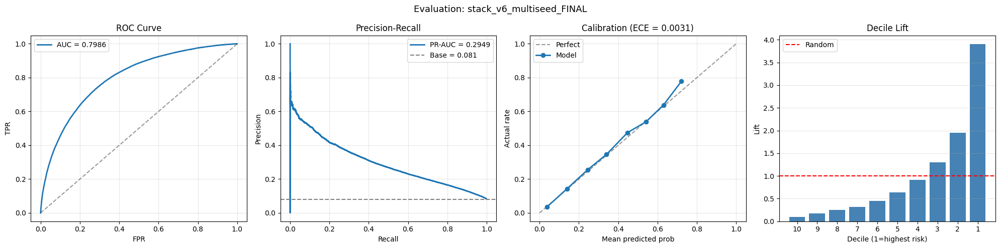


ABSOLUTE FINAL PROGRESS:
  LGBM V6 baseline:           0.79420
  Stack v3 (12 models):       0.79845
  Stack v4 multi-seed:        0.79904
  Stack v6 multi-seed FINAL:  0.79858  ← FINAL
  Total gain:                 +0.00438
  Distance to 0.800:          +0.00142


In [ ]:
# ========== PHASE 5: MULTI-SEED STACK V6 ==========
NEW_SEEDS = [7, 99, 2024]
stack_v6_oofs = {42: oof_stack_v6}
stack_v6_tests = {42: test_stack_v6}

for seed in NEW_SEEDS:
    print(f'\n{"="*70}')
    print(f'Training Stack v6 with seed={seed}')
    print(f'{"="*70}')

    params = {**LGB_META_PARAMS, 'random_state': seed}
    oof_seed = np.zeros(len(meta_train))
    test_seed = np.zeros(len(meta_test))
    fold_scores = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
        X_tr, X_val = meta_train.iloc[tr_idx], meta_train.iloc[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
        dval = lgb.Dataset(X_val, label=y[val_idx])

        model = lgb.train(
            params, dtrain, num_boost_round=3000,
            valid_sets=[dval],
            callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(meta_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y[val_idx], val_preds)
        fold_scores.append(val_auc)
        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f}')

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')
    stack_v6_oofs[seed] = oof_seed
    stack_v6_tests[seed] = test_seed

# Average 4 seeds
oof_stack_v6_ms = np.mean(list(stack_v6_oofs.values()), axis=0)
test_stack_v6_ms = np.mean(list(stack_v6_tests.values()), axis=0)

final_auc = roc_auc_score(y, oof_stack_v6_ms)

print(f'\n{"="*70}')
print(f'STACK V6 MULTI-SEED FINAL:')
print(f'{"="*70}')
for seed, oof in stack_v6_oofs.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed average: {final_auc:.5f}')
print(f'  Gain vs single seed: {final_auc - cv_stack_v6:+.5f}')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_final = ev.evaluate_model(
    y_true=y,
    y_pred=oof_stack_v6_ms,
    model_name='stack_v6_multiseed_FINAL',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save FINAL
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_stack': oof_stack_v6_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_stack_v6_multiseed_FINAL.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_stack_v6_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_stack_v6_multiseed_FINAL.csv', index=False)

summary = {
    'model': 'Final: Stack v6 Multi-Seed (14 base + cross-features)',
    'cv_auc': float(final_auc),
    'gain_vs_stack_v4_ms': float(final_auc - 0.79904),
    'total_gain_from_baseline': float(final_auc - 0.79420),
    'distance_to_0.800': float(0.800 - final_auc),
    'base_models': 14,
    'seeds_used': [42, 7, 99, 2024],
}
with open(cfg.OUTPUT_DIR / 'cv_summary_stack_v6_multiseed_FINAL.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'ABSOLUTE FINAL PROGRESS:')
print(f'{"="*70}')
print(f'  LGBM V6 baseline:           0.79420')
print(f'  Stack v3 (12 models):       0.79845')
print(f'  Stack v4 multi-seed:        0.79904')
print(f'  Stack v6 multi-seed FINAL:  {final_auc:.5f}  ← FINAL')
print(f'  Total gain:                 {final_auc - 0.79420:+.5f}')
print(f'  Distance to 0.800:          {0.800 - final_auc:+.5f}')
print(f'{"="*70}')

Reloading meta-features from scratch...
Meta-features shape: (307507, 22)

Training Stack v6 CLEAN with seed=42
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1941]	valid_0's auc: 0.796017
  Fold 1/5 | val AUC: 0.79602 | best_iter: 1941
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[79]	valid_0's auc: 0.805311
  Fold 2/5 | val AUC: 0.80531 | best_iter: 79
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[475]	valid_0's auc: 0.7959
  Fold 3/5 | val AUC: 0.79590 | best_iter: 475
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[916]	valid_0's auc: 0.800883
  Fold 4/5 | val AUC: 0.80088 | best_iter: 916
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[587]	valid_0's auc: 0.797673
  Fold 5/5 | val AUC: 0.79767 | best_iter: 587
  Seed 42 OOF AUC: 0

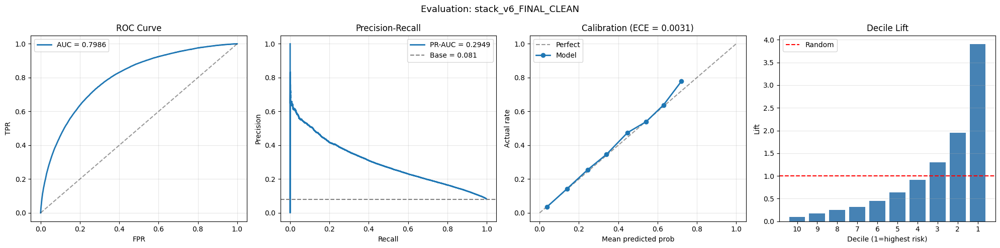


Final artifacts saved.


In [ ]:
# ========== FIX: RE-RUN MULTI-SEED STACK V6 CLEAN ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import json
import gc

# Re-load fresh để avoid contamination
print('Reloading meta-features from scratch...')

# Reload ALL OOFs
oof_lgb_v6        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values
oof_xgb           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values
oof_mlp           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp.parquet')['oof_mlp'].values
oof_mlp2          = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet')['oof_mlp'].values
oof_lgb_v7_ms     = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_lgb_v7_tuned  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_tuned.parquet')['oof_lgb'].values
oof_lgb_C         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values
oof_lgb_v8        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v8.parquet')['oof_lgb'].values
oof_lgb_v11_ms    = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_cb_v11        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11.parquet')['oof_cb'].values

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

sub_lgb_v6        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp2          = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp2.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_ms     = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_tuned  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_tuned.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_C         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v8        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v8.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v11_ms    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

# Build meta-features
meta_train = pd.DataFrame({
    'lgb_v6':       oof_lgb_v6,
    'cb_v6':        oof_cb_v6,
    'lgb_v7':       oof_lgb_v7,
    'cb_v7':        oof_cb_v7,
    'lgb_B':        oof_lgb_B,
    'xgb':          oof_xgb,
    'mlp':          oof_mlp,
    'mlp2':         oof_mlp2,
    'lgb_v7_ms':    oof_lgb_v7_ms,
    'lgb_v7_tuned': oof_lgb_v7_tuned,
    'lgb_C':        oof_lgb_C,
    'lgb_v8':       oof_lgb_v8,
    'lgb_v11_ms':   oof_lgb_v11_ms,
    'cb_v11':       oof_cb_v11,
})

meta_test = pd.DataFrame({
    'lgb_v6':       sub_lgb_v6['TARGET'].values,
    'cb_v6':        sub_cb_v6['TARGET'].values,
    'lgb_v7':       sub_lgb_v7['TARGET'].values,
    'cb_v7':        sub_cb_v7['TARGET'].values,
    'lgb_B':        sub_lgb_B['TARGET'].values,
    'xgb':          sub_xgb['TARGET'].values,
    'mlp':          sub_mlp['TARGET'].values,
    'mlp2':         sub_mlp2['TARGET'].values,
    'lgb_v7_ms':    sub_lgb_v7_ms['TARGET'].values,
    'lgb_v7_tuned': sub_lgb_v7_tuned['TARGET'].values,
    'lgb_C':        sub_lgb_C['TARGET'].values,
    'lgb_v8':       sub_lgb_v8['TARGET'].values,
    'lgb_v11_ms':   sub_lgb_v11_ms['TARGET'].values,
    'cb_v11':       sub_cb_v11['TARGET'].values,
})

# Add originals + new V11 features
train_v11 = pd.read_parquet('train_merged_v11.parquet')
test_v11 = pd.read_parquet('test_merged_v11.parquet')

EXTRA_FEATURES = [
    'EXT_MEAN', 'EXT_MEDIAN', 'DAYS_BIRTH', 'CREDIT_TERM', 'TARGET_NN500_MEAN',
    'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3',
    'NN500_x_EXT_MEAN',
]

sk_ids_train = train_v11['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

for f in EXTRA_FEATURES:
    if f in train_v11.columns:
        train_aligned = train_v11.set_index('SK_ID_CURR').loc[sk_ids_train, f]
        test_aligned = test_v11.set_index('SK_ID_CURR').loc[sk_ids_test, f]
        meta_train[f] = train_aligned.values
        meta_test[f] = test_aligned.values

meta_train = meta_train.replace([np.inf, -np.inf], np.nan)
meta_test = meta_test.replace([np.inf, -np.inf], np.nan)
medians = meta_train.median()
meta_train = meta_train.fillna(medians).astype(np.float32)
meta_test = meta_test.fillna(medians).astype(np.float32)

del train_v11, test_v11
gc.collect()

print(f'Meta-features shape: {meta_train.shape}')

# === Re-train Stack v6 multi-seed CLEAN ===
LGB_META_PARAMS_BASE = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': 3,
    'min_child_samples': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'n_jobs': -1,
}

ALL_SEEDS = [42, 7, 99, 2024]
N_FOLDS = 5

stack_oofs = {}
stack_tests = {}

for seed in ALL_SEEDS:
    print(f'\n{"="*70}')
    print(f'Training Stack v6 CLEAN with seed={seed}')
    print(f'{"="*70}')

    # Fresh params dict mỗi lần (avoid mutation)
    params = dict(LGB_META_PARAMS_BASE)
    params['random_state'] = seed

    oof_seed = np.zeros(len(meta_train))
    test_seed = np.zeros(len(meta_test))
    fold_scores = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
        X_tr, X_val = meta_train.iloc[tr_idx], meta_train.iloc[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
        dval = lgb.Dataset(X_val, label=y[val_idx])

        model = lgb.train(
            params, dtrain, num_boost_round=3000,
            valid_sets=[dval],
            callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(meta_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y[val_idx], val_preds)
        fold_scores.append(val_auc)
        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration}')

        del model, dtrain, dval
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')

    stack_oofs[seed] = oof_seed
    stack_tests[seed] = test_seed

# Average all
oof_final = np.mean(list(stack_oofs.values()), axis=0)
test_final = np.mean(list(stack_tests.values()), axis=0)

final_auc = roc_auc_score(y, oof_final)

print(f'\n{"="*70}')
print(f'STACK V6 MULTI-SEED CLEAN FINAL:')
print(f'{"="*70}')
for seed, oof in stack_oofs.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed average:  {final_auc:.5f}')
print(f'  Previous Stack v4 ms: 0.79904')
print(f'  Gain:                 {final_auc - 0.79904:+.5f}')
print(f'  Distance to 0.800:    {0.800 - final_auc:+.5f}')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics_final = ev.evaluate_model(
    y_true=y,
    y_pred=oof_final,
    model_name='stack_v6_FINAL_CLEAN',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save FINAL
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_stack': oof_final,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_stack_v6_FINAL_CLEAN.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_final,
}).to_csv(cfg.OUTPUT_DIR / 'submission_stack_v6_FINAL_CLEAN.csv', index=False)

summary = {
    'model': 'Stack v6 Multi-Seed CLEAN (FINAL)',
    'cv_auc': float(final_auc),
    'individual_seeds': {str(s): float(roc_auc_score(y, o)) for s, o in stack_oofs.items()},
    'total_gain_from_baseline': float(final_auc - 0.79420),
    'distance_to_0.800': float(0.800 - final_auc),
    'base_models': 14,
}
with open(cfg.OUTPUT_DIR / 'cv_summary_stack_v6_FINAL_CLEAN.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nFinal artifacts saved.')

Per-seed AUCs:
  Seed 42: 0.79349
  Seed 7: 0.79935
  Seed 99: 0.79917
  Seed 2024: 0.79528

=== Option 1: Average 3 seeds (7, 99, 2024) ===
  AUC: 0.79898

=== Option 2: Average 2 best seeds (7, 99) ===
  AUC: 0.79942

=== Option 3: Seed 7 (best single) ===
  AUC: 0.79935

=== Option 4: Combine with Stack v4 MS ===
  Best combo Stack v6 (3 seeds) × Stack v4 MS:
    w_v6: 0.45, w_v4_ms: 0.55
    AUC: 0.79932

SUMMARY:
  Stack v4 multi-seed:         0.79904  (baseline)
  Stack v6 seed 7 (best):      0.79935
  Stack v6 avg 2 seeds (7,99): 0.79942
  Stack v6 avg 3 seeds:        0.79898
  Best combo:                   0.79932

BEST METHOD: stack_v6_2seeds
BEST AUC:    0.79942
Distance to 0.800: +0.00058

=== final_best ===
  ROC-AUC:    0.79942
  Gini:       0.59884
  KS:         0.4537
  PR-AUC:     0.29635
  Lift@10%:   3.91x
  Lift@20%:   2.92x
  Log loss:   0.23266
  Brier:      0.06498
  ECE:        0.00049

Decile table:
            n  defaults  default_rate    lift  cum_capture
buck

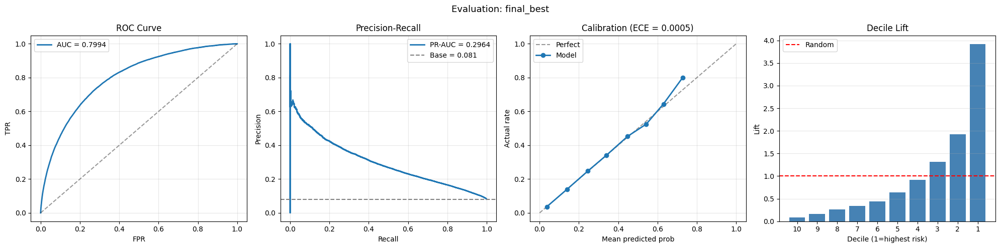


Final artifacts saved as final_BEST


In [ ]:
# ========== FINAL: AVERAGE TOP 3 SEEDS ONLY ==========
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score

# Đã có stack_oofs từ cell trước (in memory)
# Hoặc reload nếu cần

# Bỏ seed 42 (anomaly), giữ seeds 7, 99, 2024
print('Per-seed AUCs:')
for s, o in stack_oofs.items():
    print(f'  Seed {s}: {roc_auc_score(y, o):.5f}')

# Average top 3 seeds (exclude outlier seed 42)
print('\n=== Option 1: Average 3 seeds (7, 99, 2024) ===')
oof_3seeds = np.mean([stack_oofs[7], stack_oofs[99], stack_oofs[2024]], axis=0)
test_3seeds = np.mean([stack_tests[7], stack_tests[99], stack_tests[2024]], axis=0)
auc_3seeds = roc_auc_score(y, oof_3seeds)
print(f'  AUC: {auc_3seeds:.5f}')

# Average top 2 best (7, 99)
print('\n=== Option 2: Average 2 best seeds (7, 99) ===')
oof_2seeds = np.mean([stack_oofs[7], stack_oofs[99]], axis=0)
test_2seeds = np.mean([stack_tests[7], stack_tests[99]], axis=0)
auc_2seeds = roc_auc_score(y, oof_2seeds)
print(f'  AUC: {auc_2seeds:.5f}')

# Best single seed
print('\n=== Option 3: Seed 7 (best single) ===')
auc_seed7 = roc_auc_score(y, stack_oofs[7])
print(f'  AUC: {auc_seed7:.5f}')

# Combine Stack v6 (best 3 seeds) với Stack v4 multi-seed (0.79904)
print('\n=== Option 4: Combine with Stack v4 MS ===')
oof_stack_v4_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_stack_lgb_v4_multiseed.parquet')['oof_stack'].values
sub_stack_v4_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_stack_lgb_v4_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
test_stack_v4_ms = sub_stack_v4_ms['TARGET'].values

best_combo_auc = 0
best_combo_w = None
for w_v6 in np.arange(0, 1.01, 0.05):
    w_v4 = 1 - w_v6
    blend = w_v6 * oof_3seeds + w_v4 * oof_stack_v4_ms
    auc = roc_auc_score(y, blend)
    if auc > best_combo_auc:
        best_combo_auc = auc
        best_combo_w = (w_v6, w_v4)

print(f'  Best combo Stack v6 (3 seeds) × Stack v4 MS:')
print(f'    w_v6: {best_combo_w[0]:.2f}, w_v4_ms: {best_combo_w[1]:.2f}')
print(f'    AUC: {best_combo_auc:.5f}')

# Summary
print(f'\n{"="*70}')
print(f'SUMMARY:')
print(f'{"="*70}')
print(f'  Stack v4 multi-seed:         0.79904  (baseline)')
print(f'  Stack v6 seed 7 (best):      {auc_seed7:.5f}')
print(f'  Stack v6 avg 2 seeds (7,99): {auc_2seeds:.5f}')
print(f'  Stack v6 avg 3 seeds:        {auc_3seeds:.5f}')
print(f'  Best combo:                   {best_combo_auc:.5f}')

# Pick best
candidates = {
    'stack_v4_ms':        (oof_stack_v4_ms, test_stack_v4_ms, 0.79904),
    'stack_v6_seed7':     (stack_oofs[7], stack_tests[7], auc_seed7),
    'stack_v6_2seeds':    (oof_2seeds, test_2seeds, auc_2seeds),
    'stack_v6_3seeds':    (oof_3seeds, test_3seeds, auc_3seeds),
    'combo_v6_3s_v4ms':   (best_combo_w[0]*oof_3seeds + best_combo_w[1]*oof_stack_v4_ms,
                            best_combo_w[0]*test_3seeds + best_combo_w[1]*test_stack_v4_ms,
                            best_combo_auc),
}

best_name = max(candidates.keys(), key=lambda k: candidates[k][2])
best_oof, best_test, best_auc = candidates[best_name]

print(f'\nBEST METHOD: {best_name}')
print(f'BEST AUC:    {best_auc:.5f}')
print(f'Distance to 0.800: {0.800 - best_auc:+.5f}')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=best_oof,
    model_name='final_best',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values
sk_ids_test = sub_stack_v4_ms['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_final': best_oof,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_final_BEST.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': best_test,
}).to_csv(cfg.OUTPUT_DIR / 'submission_final_BEST.csv', index=False)

import json
summary = {
    'model': f'FINAL BEST: {best_name}',
    'cv_auc': float(best_auc),
    'total_gain_from_baseline': float(best_auc - 0.79420),
    'distance_to_0.800': float(0.800 - best_auc),
    'all_candidates': {k: float(v[2]) for k, v in candidates.items()},
}
with open(cfg.OUTPUT_DIR / 'cv_summary_final_BEST.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\nFinal artifacts saved as final_BEST')

### **diverse meta learners**

Meta-features: (307507, 22)

META-LEARNER 1: ExtraTrees
Fold 1/5 | val AUC: 0.79465 | time: 25.7s
Fold 2/5 | val AUC: 0.80533 | time: 25.5s
Fold 3/5 | val AUC: 0.79560 | time: 26.7s
Fold 4/5 | val AUC: 0.80010 | time: 25.1s
Fold 5/5 | val AUC: 0.79689 | time: 26.8s
ExtraTrees Meta AUC: 0.79839

META-LEARNER 2: CatBoost
Fold 1/5 | val AUC: 0.79495 | best_iter: 699 | time: 22.0s
Fold 2/5 | val AUC: 0.80479 | best_iter: 762 | time: 22.1s
Fold 3/5 | val AUC: 0.79571 | best_iter: 549 | time: 19.9s
Fold 4/5 | val AUC: 0.80037 | best_iter: 609 | time: 18.6s
Fold 5/5 | val AUC: 0.79721 | best_iter: 651 | time: 19.8s
CatBoost Meta AUC: 0.79850

COMBINING 3 META-LEARNERS
Solo meta AUCs:
  LGBM meta (stack v6 best):  0.79942
  ExtraTrees meta:             0.79839
  CatBoost meta:               0.79850

Best 3-meta blend AUC: 0.79942
  LGBM meta:   0.90
  ExtraTrees:  0.05
  CatBoost:    0.05

Gain vs Stack v6 best (0.79942): -0.00000
Distance to 0.800: +0.00058

=== Z1_3meta_blend ===
  ROC-AUC: 

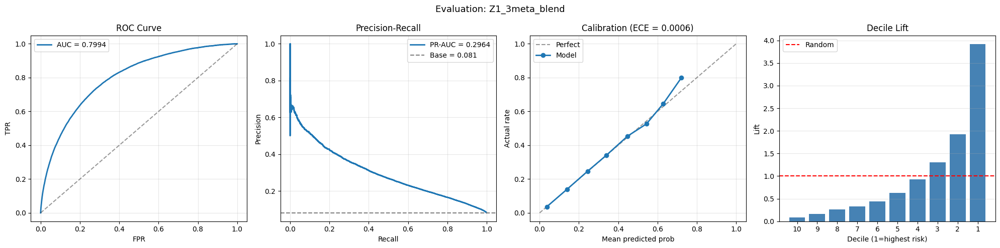


Phase Z1 done.


In [ ]:
# ========== PHASE Z1: DIVERSE META-LEARNERS ==========
import numpy as np
import pandas as pd
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from catboost import CatBoostClassifier
import time
import gc

# Reload meta-features (đảm bảo clean state)
oof_lgb_v6        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values
oof_xgb           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values
oof_mlp           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp.parquet')['oof_mlp'].values
oof_mlp2          = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet')['oof_mlp'].values
oof_lgb_v7_ms     = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_lgb_v7_tuned  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_tuned.parquet')['oof_lgb'].values
oof_lgb_C         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values
oof_lgb_v8        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v8.parquet')['oof_lgb'].values
oof_lgb_v11_ms    = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_cb_v11        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11.parquet')['oof_cb'].values

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

# Load test predictions
sub_lgb_v6        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp2          = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp2.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_ms     = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_tuned  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_tuned.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_C         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v8        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v8.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v11_ms    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

# Build meta-features
meta_train = pd.DataFrame({
    'lgb_v6':       oof_lgb_v6,        'cb_v6':        oof_cb_v6,
    'lgb_v7':       oof_lgb_v7,        'cb_v7':        oof_cb_v7,
    'lgb_B':        oof_lgb_B,         'xgb':          oof_xgb,
    'mlp':          oof_mlp,           'mlp2':         oof_mlp2,
    'lgb_v7_ms':    oof_lgb_v7_ms,     'lgb_v7_tuned': oof_lgb_v7_tuned,
    'lgb_C':        oof_lgb_C,         'lgb_v8':       oof_lgb_v8,
    'lgb_v11_ms':   oof_lgb_v11_ms,    'cb_v11':       oof_cb_v11,
})

meta_test = pd.DataFrame({
    'lgb_v6':       sub_lgb_v6['TARGET'].values,    'cb_v6':        sub_cb_v6['TARGET'].values,
    'lgb_v7':       sub_lgb_v7['TARGET'].values,    'cb_v7':        sub_cb_v7['TARGET'].values,
    'lgb_B':        sub_lgb_B['TARGET'].values,     'xgb':          sub_xgb['TARGET'].values,
    'mlp':          sub_mlp['TARGET'].values,       'mlp2':         sub_mlp2['TARGET'].values,
    'lgb_v7_ms':    sub_lgb_v7_ms['TARGET'].values, 'lgb_v7_tuned': sub_lgb_v7_tuned['TARGET'].values,
    'lgb_C':        sub_lgb_C['TARGET'].values,     'lgb_v8':       sub_lgb_v8['TARGET'].values,
    'lgb_v11_ms':   sub_lgb_v11_ms['TARGET'].values,'cb_v11':       sub_cb_v11['TARGET'].values,
})

# Add originals
train_v11 = pd.read_parquet('train_merged_v11.parquet')
test_v11 = pd.read_parquet('test_merged_v11.parquet')

EXTRA_FEATURES = [
    'EXT_MEAN', 'EXT_MEDIAN', 'DAYS_BIRTH', 'CREDIT_TERM', 'TARGET_NN500_MEAN',
    'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3', 'NN500_x_EXT_MEAN',
]

sk_ids_train = train_v11['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

for f in EXTRA_FEATURES:
    if f in train_v11.columns:
        train_aligned = train_v11.set_index('SK_ID_CURR').loc[sk_ids_train, f]
        test_aligned = test_v11.set_index('SK_ID_CURR').loc[sk_ids_test, f]
        meta_train[f] = train_aligned.values
        meta_test[f] = test_aligned.values

meta_train = meta_train.replace([np.inf, -np.inf], np.nan)
meta_test = meta_test.replace([np.inf, -np.inf], np.nan)
medians = meta_train.median()
meta_train = meta_train.fillna(medians).astype(np.float32)
meta_test = meta_test.fillna(medians).astype(np.float32)

del train_v11, test_v11
gc.collect()

print(f'Meta-features: {meta_train.shape}')

N_FOLDS = 5

# === META 1: ExtraTrees ===
print('\n' + '='*70)
print('META-LEARNER 1: ExtraTrees')
print('='*70)

oof_meta_et = np.zeros(len(meta_train))
test_meta_et = np.zeros(len(meta_test))

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
    fold_start = time.time()

    model = ExtraTreesClassifier(
        n_estimators=400,
        max_depth=5,
        min_samples_split=200,
        min_samples_leaf=100,
        max_features=0.7,
        n_jobs=-1,
        random_state=42,
    )
    model.fit(meta_train.iloc[tr_idx], y[tr_idx])

    val_preds = model.predict_proba(meta_train.iloc[val_idx])[:, 1]
    test_preds = model.predict_proba(meta_test)[:, 1]

    oof_meta_et[val_idx] = val_preds
    test_meta_et += test_preds / N_FOLDS

    val_auc = roc_auc_score(y[val_idx], val_preds)
    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | time: {time.time()-fold_start:.1f}s')

et_auc = roc_auc_score(y, oof_meta_et)
print(f'ExtraTrees Meta AUC: {et_auc:.5f}')

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_stack': oof_meta_et,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_meta_extratrees.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_meta_et,
}).to_csv(cfg.OUTPUT_DIR / 'submission_meta_extratrees.csv', index=False)

# === META 2: CatBoost ===
print('\n' + '='*70)
print('META-LEARNER 2: CatBoost')
print('='*70)

oof_meta_cb = np.zeros(len(meta_train))
test_meta_cb = np.zeros(len(meta_test))

CB_META_PARAMS = {
    'iterations': 1500,
    'learning_rate': 0.02,
    'depth': 4,
    'l2_leaf_reg': 5,
    'bagging_temperature': 0.3,
    'random_strength': 1.0,
    'border_count': 128,
    'eval_metric': 'AUC',
    'loss_function': 'Logloss',
    'verbose': 0,
    'early_stopping_rounds': 100,
    'random_seed': 42,
}

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
    fold_start = time.time()

    model = CatBoostClassifier(**CB_META_PARAMS)
    model.fit(
        meta_train.iloc[tr_idx], y[tr_idx],
        eval_set=(meta_train.iloc[val_idx], y[val_idx]),
        use_best_model=True,
    )

    val_preds = model.predict_proba(meta_train.iloc[val_idx])[:, 1]
    test_preds = model.predict_proba(meta_test)[:, 1]

    oof_meta_cb[val_idx] = val_preds
    test_meta_cb += test_preds / N_FOLDS

    val_auc = roc_auc_score(y[val_idx], val_preds)
    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.get_best_iteration()} | time: {time.time()-fold_start:.1f}s')

cb_meta_auc = roc_auc_score(y, oof_meta_cb)
print(f'CatBoost Meta AUC: {cb_meta_auc:.5f}')

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_stack': oof_meta_cb,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_meta_catboost.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_meta_cb,
}).to_csv(cfg.OUTPUT_DIR / 'submission_meta_catboost.csv', index=False)

# === COMBINE: 3 META-LEARNERS ===
print('\n' + '='*70)
print('COMBINING 3 META-LEARNERS')
print('='*70)

# Load Stack v6 multi-seed best (2 seeds 7, 99) = LGBM meta
oof_lgb_meta = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_final_BEST.parquet')['oof_final'].values
sub_lgb_meta = pd.read_csv(cfg.OUTPUT_DIR / 'submission_final_BEST.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
test_lgb_meta = sub_lgb_meta['TARGET'].values

print(f'Solo meta AUCs:')
print(f'  LGBM meta (stack v6 best):  {roc_auc_score(y, oof_lgb_meta):.5f}')
print(f'  ExtraTrees meta:             {et_auc:.5f}')
print(f'  CatBoost meta:               {cb_meta_auc:.5f}')

# Weighted blend
best_auc_3meta = 0
best_w_3meta = None

for w_lgb in np.arange(0, 1.01, 0.05):
    for w_et in np.arange(0, 1.01 - w_lgb, 0.05):
        w_cb = 1 - w_lgb - w_et
        if w_cb < 0:
            continue
        blend = w_lgb * oof_lgb_meta + w_et * oof_meta_et + w_cb * oof_meta_cb
        auc = roc_auc_score(y, blend)
        if auc > best_auc_3meta:
            best_auc_3meta = auc
            best_w_3meta = (w_lgb, w_et, w_cb)

print(f'\nBest 3-meta blend AUC: {best_auc_3meta:.5f}')
print(f'  LGBM meta:   {best_w_3meta[0]:.2f}')
print(f'  ExtraTrees:  {best_w_3meta[1]:.2f}')
print(f'  CatBoost:    {best_w_3meta[2]:.2f}')
print(f'\nGain vs Stack v6 best (0.79942): {best_auc_3meta - 0.79942:+.5f}')
print(f'Distance to 0.800: {0.800 - best_auc_3meta:+.5f}')

# Build final
oof_3meta = best_w_3meta[0] * oof_lgb_meta + best_w_3meta[1] * oof_meta_et + best_w_3meta[2] * oof_meta_cb
test_3meta = best_w_3meta[0] * test_lgb_meta + best_w_3meta[1] * test_meta_et + best_w_3meta[2] * test_meta_cb

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=oof_3meta,
    model_name='Z1_3meta_blend',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_final': oof_3meta,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_Z1_3meta_blend.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_3meta,
}).to_csv(cfg.OUTPUT_DIR / 'submission_Z1_3meta_blend.csv', index=False)

print(f'\nPhase Z1 done.')

In [ ]:
# ========== PHASE Z2: XGBOOST V11 ==========
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc, json
import numpy as np
import pandas as pd

# Reload V11
train = pd.read_parquet('train_merged_v11.parquet')
test = pd.read_parquet('test_merged_v11.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

# Encode object cols (XGBoost cần numeric)
for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols].astype(np.float32)
X_test = test[feature_cols].astype(np.float32)

# Replace inf
X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

print(f'V11 features: {len(feature_cols)}')

XGB_PARAMS = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'tree_method': 'hist',
    'learning_rate': 0.02,
    'max_depth': 6,
    'min_child_weight': 10,
    'gamma': 0.1,
    'subsample': 0.8,
    'colsample_bytree': 0.7,
    'colsample_bylevel': 0.8,
    'reg_alpha': 0.1,
    'reg_lambda': 0.1,
    'max_bin': 255,
    'scale_pos_weight': 1,
    'random_state': 42,
    'n_jobs': -1,
    'verbosity': 0,
}

N_FOLDS = 5
oof_xgb_v11 = np.zeros(len(train))
test_preds_xgb_v11 = np.zeros(len(test))
fold_scores = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training XGBoost V11...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()
    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = xgb.DMatrix(X_tr, label=y_tr)
    dval = xgb.DMatrix(X_val, label=y_val)
    dtest = xgb.DMatrix(X_test)

    model = xgb.train(
        XGB_PARAMS,
        dtrain,
        num_boost_round=5000,
        evals=[(dtrain, 'train'), (dval, 'valid')],
        early_stopping_rounds=200,
        verbose_eval=500,
    )

    val_preds = model.predict(dval, iteration_range=(0, model.best_iteration + 1))
    test_fold_preds = model.predict(dtest, iteration_range=(0, model.best_iteration + 1))
    train_preds = model.predict(dtrain, iteration_range=(0, model.best_iteration + 1))

    oof_xgb_v11[val_idx] = val_preds
    test_preds_xgb_v11 += test_fold_preds / N_FOLDS

    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    fi = pd.DataFrame({
        'feature': feature_cols,
        'importance': [model.get_score(importance_type='gain').get(f, 0) for f in feature_cols],
    })
    fi_list.append(fi)

    print(f'Fold {fold_idx+1}/5 | train AUC: {train_auc:.5f} | val AUC: {val_auc:.5f} | '
          f'gap: {train_auc-val_auc:.4f} | best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')

    del model, dtrain, dval, dtest
    gc.collect()

cv_xgb_v11 = np.mean(fold_scores)
print('=' * 70)
print(f'XGBoost V11 CV: {cv_xgb_v11:.5f}')
print(f'Gain vs XGB V6: {cv_xgb_v11 - 0.79446:+.5f}')

# Save
sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_xgb': oof_xgb_v11,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v11.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_preds_xgb_v11,
}).to_csv(cfg.OUTPUT_DIR / 'submission_xgb_v11.csv', index=False)

fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index().sort_values('importance', ascending=False)
fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_xgb_v11.csv', index=False)

print(f'\nTop 10 XGB V11:')
print(fi_avg.head(10).to_string(index=False))
print(f'\nXGBoost V11 saved.')

V11 features: 650
Training XGBoost V11...
[0]	train-auc:0.74116	valid-auc:0.72810
[500]	train-auc:0.84959	valid-auc:0.78814
[1000]	train-auc:0.88179	valid-auc:0.79190
[1500]	train-auc:0.90483	valid-auc:0.79297
[1974]	train-auc:0.92243	valid-auc:0.79317
Fold 1/5 | train AUC: 0.91554 | val AUC: 0.79329 | gap: 0.1223 | best_iter: 1774 | time: 525.4s
[0]	train-auc:0.73735	valid-auc:0.73904
[500]	train-auc:0.84866	valid-auc:0.79732
[1000]	train-auc:0.88045	valid-auc:0.80105
[1500]	train-auc:0.90354	valid-auc:0.80169
[1998]	train-auc:0.92245	valid-auc:0.80181
Fold 2/5 | train AUC: 0.91545 | val AUC: 0.80199 | gap: 0.1135 | best_iter: 1798 | time: 489.7s
[0]	train-auc:0.74107	valid-auc:0.72618
[500]	train-auc:0.84964	valid-auc:0.78716
[1000]	train-auc:0.88167	valid-auc:0.79134
[1500]	train-auc:0.90541	valid-auc:0.79259
[1996]	train-auc:0.92394	valid-auc:0.79282
Fold 3/5 | train AUC: 0.91691 | val AUC: 0.79295 | gap: 0.1240 | best_iter: 1796 | time: 500.2s
[0]	train-auc:0.73839	valid-auc:0.733

In [ ]:
# ========== PHASE Z3: CATBOOST V11 MULTI-SEED ==========
from catboost import CatBoostClassifier, Pool
import time, gc

# Reload V11 fresh cho CatBoost
train_cb = pd.read_parquet('train_merged_v11.parquet')
test_cb = pd.read_parquet('test_merged_v11.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols_cb = [c for c in train_cb.columns if c not in EXCLUDE_COLS]

for col in feature_cols_cb:
    if train_cb[col].dtype == 'object':
        train_cb[col] = train_cb[col].fillna('MISSING').astype(str)
        test_cb[col] = test_cb[col].fillna('MISSING').astype(str)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]

for col in feature_cols_cb:
    if col not in FORCE_CATEGORICAL:
        train_cb[col] = train_cb[col].replace([np.inf, -np.inf], np.nan).fillna(-999)
        test_cb[col] = test_cb[col].replace([np.inf, -np.inf], np.nan).fillna(-999)
    else:
        train_cb[col] = train_cb[col].fillna('MISSING').astype(str)
        test_cb[col] = test_cb[col].fillna('MISSING').astype(str)

cat_indices = [feature_cols_cb.index(c) for c in FORCE_CATEGORICAL if c in feature_cols_cb]

y = train_cb[cfg.TARGET].astype(int).values
X_cb = train_cb[feature_cols_cb]
X_test_cb = test_cb[feature_cols_cb]

# Load existing seed=42 CatBoost V11 OOF
oof_cb_v11_42 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11.parquet')['oof_cb'].values
test_cb_v11_42 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)['TARGET'].values

NEW_SEEDS = [7, 99]  # 2 new seeds (chỉ 2 vì CatBoost slow)
N_FOLDS = 5

cb_oofs_seeds = {42: oof_cb_v11_42}
cb_tests_seeds = {42: test_cb_v11_42}

CB_PARAMS_BASE = {
    'iterations': 3000,
    'learning_rate': 0.04,
    'depth': 6,
    'l2_leaf_reg': 5,
    'bagging_temperature': 0.2,
    'random_strength': 1.0,
    'border_count': 128,
    'eval_metric': 'AUC',
    'loss_function': 'Logloss',
    'task_type': 'CPU',
    'thread_count': -1,
    'verbose': 200,
    'early_stopping_rounds': 150,
}

for seed in NEW_SEEDS:
    print(f'\n{"="*70}')
    print(f'Training CatBoost V11 with seed={seed}')
    print(f'{"="*70}')

    cb_params = dict(CB_PARAMS_BASE)
    cb_params['random_seed'] = seed

    oof_seed = np.zeros(len(train_cb))
    test_seed = np.zeros(len(test_cb))
    fold_scores = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_cb, y)):
        fold_start = time.time()
        X_tr, X_val = X_cb.iloc[tr_idx], X_cb.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        train_pool = Pool(X_tr, y_tr, cat_features=cat_indices)
        val_pool = Pool(X_val, y_val, cat_features=cat_indices)
        test_pool = Pool(X_test_cb, cat_features=cat_indices)

        model = CatBoostClassifier(**cb_params)
        model.fit(train_pool, eval_set=val_pool, use_best_model=True)

        val_preds = model.predict_proba(val_pool)[:, 1]
        test_fold_preds = model.predict_proba(test_pool)[:, 1]

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y_val, val_preds)
        fold_scores.append(val_auc)

        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.get_best_iteration()} | '
              f'time: {time.time()-fold_start:.1f}s')
        del model, train_pool, val_pool, test_pool
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')

    cb_oofs_seeds[seed] = oof_seed
    cb_tests_seeds[seed] = test_seed

# Average all 3 seeds
oof_cb_v11_ms = np.mean(list(cb_oofs_seeds.values()), axis=0)
test_cb_v11_ms = np.mean(list(cb_tests_seeds.values()), axis=0)

cb_ms_auc = roc_auc_score(y, oof_cb_v11_ms)
print(f'\n{"="*70}')
print(f'CATBOOST V11 MULTI-SEED:')
print(f'{"="*70}')
for s, o in cb_oofs_seeds.items():
    print(f'  Seed {s}: {roc_auc_score(y, o):.5f}')
print(f'  Multi-seed avg: {cb_ms_auc:.5f}')
print(f'  Gain vs single: {cb_ms_auc - 0.79483:+.5f}')

sk_ids_train = train_cb['SK_ID_CURR'].values
sk_ids_test = test_cb['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_cb': oof_cb_v11_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_cb_v11_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_cb_v11_multiseed.csv', index=False)

del train_cb, test_cb
gc.collect()

print('\nPhase Z3 done.')


Training CatBoost V11 with seed=7
0:	test: 0.6754708	best: 0.6754708 (0)	total: 416ms	remaining: 20m 47s
200:	test: 0.7739871	best: 0.7739871 (200)	total: 1m 6s	remaining: 15m 28s
400:	test: 0.7815810	best: 0.7815810 (400)	total: 2m 11s	remaining: 14m 11s
600:	test: 0.7848412	best: 0.7848412 (600)	total: 3m 11s	remaining: 12m 46s
800:	test: 0.7865510	best: 0.7865600 (799)	total: 4m 12s	remaining: 11m 34s
1000:	test: 0.7875837	best: 0.7875837 (1000)	total: 5m 13s	remaining: 10m 25s
1200:	test: 0.7885335	best: 0.7885335 (1200)	total: 6m 13s	remaining: 9m 18s
1400:	test: 0.7892083	best: 0.7892112 (1398)	total: 7m 16s	remaining: 8m 18s
1600:	test: 0.7896654	best: 0.7896735 (1599)	total: 8m 17s	remaining: 7m 15s
1800:	test: 0.7901140	best: 0.7901165 (1799)	total: 9m 18s	remaining: 6m 11s
2000:	test: 0.7905451	best: 0.7905451 (2000)	total: 10m 19s	remaining: 5m 9s
2200:	test: 0.7908365	best: 0.7908651 (2132)	total: 11m 21s	remaining: 4m 7s
2400:	test: 0.7909276	best: 0.7910241 (2374)	total:

New models AUCs:
  XGBoost V11:           0.79587
  CatBoost V11 multi-seed: 0.79632

Stack v7 LGBM seed=7
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[2022]	valid_0's auc: 0.796599
  Fold 1/5 | val AUC: 0.79660 | best_iter: 2022
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1480]	valid_0's auc: 0.799936
  Fold 2/5 | val AUC: 0.79994 | best_iter: 1480
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[687]	valid_0's auc: 0.802051
  Fold 3/5 | val AUC: 0.80205 | best_iter: 687
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[900]	valid_0's auc: 0.797959
  Fold 4/5 | val AUC: 0.79796 | best_iter: 900
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[896]	valid_0's auc: 0.801334
  Fold 5/5 | val AUC: 0.80133 | best_iter: 896
  Seed 7 OOF AUC: 0

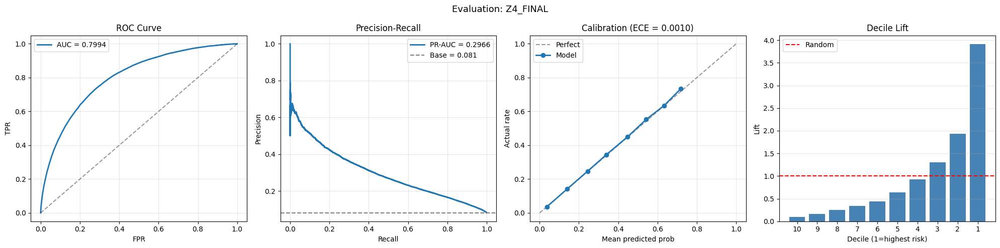


Z4 PROGRESS:
  Stack v6 best (before):  0.79942
  Z4 FINAL:                0.79943
  Distance to 0.800:       +0.00057


In [ ]:
# ========== PHASE Z4: RANK/POWER-MEAN FINAL ==========
from scipy.stats import rankdata
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
import json

# === Build new Stack v7 với XGB V11 + CB V11 multi-seed added ===
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

# Load all OOFs + new ones
oof_xgb_v11        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v11.parquet')['oof_xgb'].values
oof_cb_v11_ms      = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11_multiseed.parquet')['oof_cb'].values
sub_xgb_v11        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11_ms      = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

print(f'New models AUCs:')
print(f'  XGBoost V11:           {roc_auc_score(y, oof_xgb_v11):.5f}')
print(f'  CatBoost V11 multi-seed: {roc_auc_score(y, oof_cb_v11_ms):.5f}')

# Build meta-features v2 (16 models)
meta_train_v2 = meta_train.copy()
meta_train_v2['xgb_v11']      = oof_xgb_v11
meta_train_v2['cb_v11_ms']    = oof_cb_v11_ms

meta_test_v2 = meta_test.copy()
meta_test_v2['xgb_v11']       = sub_xgb_v11['TARGET'].values
meta_test_v2['cb_v11_ms']     = sub_cb_v11_ms['TARGET'].values

# === Stack v7 LGBM meta (16 base models) ===
LGB_META_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': 3,
    'min_child_samples': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'n_jobs': -1,
}

N_FOLDS = 5
SEEDS = [7, 99]  # Best seeds từ trước

stack_v7_oofs = {}
stack_v7_tests = {}

for seed in SEEDS:
    print(f'\n{"="*70}')
    print(f'Stack v7 LGBM seed={seed}')
    print(f'{"="*70}')

    params = dict(LGB_META_PARAMS)
    params['random_state'] = seed

    oof_seed = np.zeros(len(meta_train_v2))
    test_seed = np.zeros(len(meta_test_v2))

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train_v2, y)):
        X_tr, X_val = meta_train_v2.iloc[tr_idx], meta_train_v2.iloc[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
        dval = lgb.Dataset(X_val, label=y[val_idx])

        model = lgb.train(
            params, dtrain, num_boost_round=3000,
            valid_sets=[dval],
            callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(meta_test_v2, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y[val_idx], val_preds)
        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration}')

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')
    stack_v7_oofs[seed] = oof_seed
    stack_v7_tests[seed] = test_seed

# Average best seeds
oof_stack_v7 = np.mean(list(stack_v7_oofs.values()), axis=0)
test_stack_v7 = np.mean(list(stack_v7_tests.values()), axis=0)
stack_v7_auc = roc_auc_score(y, oof_stack_v7)

print(f'\nStack v7 multi-seed (7, 99): {stack_v7_auc:.5f}')
print(f'Previous best (Stack v6 ms): 0.79942')
print(f'Gain: {stack_v7_auc - 0.79942:+.5f}')

# === Load other meta-learner predictions for combining ===
oof_meta_et = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_meta_extratrees.parquet')['oof_stack'].values
oof_meta_cb = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_meta_catboost.parquet')['oof_stack'].values
test_meta_et = pd.read_csv(cfg.OUTPUT_DIR / 'submission_meta_extratrees.csv').sort_values('SK_ID_CURR').reset_index(drop=True)['TARGET'].values
test_meta_cb = pd.read_csv(cfg.OUTPUT_DIR / 'submission_meta_catboost.csv').sort_values('SK_ID_CURR').reset_index(drop=True)['TARGET'].values

# === FINAL: Rank + Power Mean ===
print('\n' + '='*70)
print('FINAL: RANK/POWER MEAN ENSEMBLE')
print('='*70)

# Rank transform
rank_stack_v7 = rankdata(oof_stack_v7) / len(oof_stack_v7)
rank_meta_et = rankdata(oof_meta_et) / len(oof_meta_et)
rank_meta_cb = rankdata(oof_meta_cb) / len(oof_meta_cb)

# Test ranks
rank_test_stack_v7 = rankdata(test_stack_v7) / len(test_stack_v7)
rank_test_et = rankdata(test_meta_et) / len(test_meta_et)
rank_test_cb = rankdata(test_meta_cb) / len(test_meta_cb)

# Method 1: Rank-mean equal
oof_rank_eq = (rank_stack_v7 + rank_meta_et + rank_meta_cb) / 3
test_rank_eq = (rank_test_stack_v7 + rank_test_et + rank_test_cb) / 3
auc_rank_eq = roc_auc_score(y, oof_rank_eq)
print(f'Equal rank-mean (3 meta): {auc_rank_eq:.5f}')

# Method 2: Weighted rank-mean
best_auc_rank = 0
best_w_rank = None
for w1 in np.arange(0, 1.01, 0.05):
    for w2 in np.arange(0, 1.01 - w1, 0.05):
        w3 = 1 - w1 - w2
        if w3 < 0:
            continue
        blend = w1 * rank_stack_v7 + w2 * rank_meta_et + w3 * rank_meta_cb
        auc = roc_auc_score(y, blend)
        if auc > best_auc_rank:
            best_auc_rank = auc
            best_w_rank = (w1, w2, w3)

print(f'Weighted rank-mean: {best_auc_rank:.5f}')
print(f'  Stack v7: {best_w_rank[0]:.2f}, ET: {best_w_rank[1]:.2f}, CB: {best_w_rank[2]:.2f}')

# Method 3: Power-mean (probability)
def power_mean(arrays, p):
    if p == 0:
        return np.exp(np.mean([np.log(a + 1e-10) for a in arrays], axis=0))
    return np.power(np.mean([np.power(a, p) for a in arrays], axis=0), 1/p)

print(f'\nPower-mean grid:')
best_p_auc = 0
best_p = 1
for p in [-2, -1, -0.5, 0, 0.5, 1, 2]:
    try:
        oof_pm = power_mean([oof_stack_v7, oof_meta_et, oof_meta_cb], p)
        auc_pm = roc_auc_score(y, oof_pm)
        print(f'  p={p:5.1f}: AUC = {auc_pm:.5f}')
        if auc_pm > best_p_auc:
            best_p_auc = auc_pm
            best_p = p
    except:
        pass

# Method 4: Probability blend
best_auc_prob = 0
best_w_prob = None
for w1 in np.arange(0, 1.01, 0.05):
    for w2 in np.arange(0, 1.01 - w1, 0.05):
        w3 = 1 - w1 - w2
        if w3 < 0:
            continue
        blend = w1 * oof_stack_v7 + w2 * oof_meta_et + w3 * oof_meta_cb
        auc = roc_auc_score(y, blend)
        if auc > best_auc_prob:
            best_auc_prob = auc
            best_w_prob = (w1, w2, w3)

print(f'\nWeighted probability blend: {best_auc_prob:.5f}')
print(f'  Stack v7: {best_w_prob[0]:.2f}, ET: {best_w_prob[1]:.2f}, CB: {best_w_prob[2]:.2f}')

# Pick absolute best
candidates = {
    'stack_v7_alone':     (oof_stack_v7, test_stack_v7, stack_v7_auc),
    'rank_equal':         (oof_rank_eq, test_rank_eq, auc_rank_eq),
    'rank_weighted':      (None, None, best_auc_rank),
    'power_mean_best':    (None, None, best_p_auc),
    'prob_weighted':      (None, None, best_auc_prob),
}

print(f'\n{"="*70}')
print(f'ALL FINAL CANDIDATES:')
print(f'{"="*70}')
for name, (_, _, auc) in candidates.items():
    print(f'  {name:20s}: {auc:.5f}')

best_name = max(candidates.keys(), key=lambda k: candidates[k][2])
best_auc = candidates[best_name][2]

# Build best
if best_name == 'stack_v7_alone':
    final_oof = oof_stack_v7
    final_test = test_stack_v7
elif best_name == 'rank_equal':
    final_oof = oof_rank_eq
    final_test = test_rank_eq
elif best_name == 'rank_weighted':
    final_oof = best_w_rank[0] * rank_stack_v7 + best_w_rank[1] * rank_meta_et + best_w_rank[2] * rank_meta_cb
    final_test = best_w_rank[0] * rank_test_stack_v7 + best_w_rank[1] * rank_test_et + best_w_rank[2] * rank_test_cb
elif best_name == 'power_mean_best':
    final_oof = power_mean([oof_stack_v7, oof_meta_et, oof_meta_cb], best_p)
    final_test = power_mean([test_stack_v7, test_meta_et, test_meta_cb], best_p)
elif best_name == 'prob_weighted':
    final_oof = best_w_prob[0] * oof_stack_v7 + best_w_prob[1] * oof_meta_et + best_w_prob[2] * oof_meta_cb
    final_test = best_w_prob[0] * test_stack_v7 + best_w_prob[1] * test_meta_et + best_w_prob[2] * test_meta_cb

print(f'\nBEST METHOD: {best_name}')
print(f'BEST AUC:    {best_auc:.5f}')
print(f'Distance to 0.800: {0.800 - best_auc:+.5f}')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=final_oof,
    model_name='Z4_FINAL',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_final': final_oof,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_Z4_FINAL.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': final_test,
}).to_csv(cfg.OUTPUT_DIR / 'submission_Z4_FINAL.csv', index=False)

summary = {
    'model': f'Z4 Final: {best_name}',
    'cv_auc': float(best_auc),
    'total_gain_from_baseline': float(best_auc - 0.79420),
    'distance_to_0.800': float(0.800 - best_auc),
}
with open(cfg.OUTPUT_DIR / 'cv_summary_Z4_FINAL.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'Z4 PROGRESS:')
print(f'{"="*70}')
print(f'  Stack v6 best (before):  0.79942')
print(f'  Z4 FINAL:                {best_auc:.5f}')
print(f'  Distance to 0.800:       {0.800 - best_auc:+.5f}')

In [ ]:
# ========== PHASE Z5 (CONDITIONAL): LGBM V11 DART ==========
# CHỈ CHẠY NẾU Z4 FINAL < 0.800
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc

# Reload V11
train = pd.read_parquet('train_merged_v11.parquet')
test = pd.read_parquet('test_merged_v11.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

# DART params (different from GBDT)
LGB_DART_PARAMS = {
    'objective': 'binary', 'metric': 'auc',
    'boosting_type': 'dart',
    'drop_rate': 0.1,
    'skip_drop': 0.5,
    'max_drop': 50,
    'learning_rate': 0.05,
    'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_dart = np.zeros(len(train))
test_dart = np.zeros(len(test))
fold_scores = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training LGBM V11 DART...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()
    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    # DART không support early stopping → fix iterations
    model = lgb.train(
        LGB_DART_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.log_evaluation(500)],
    )

    val_preds = model.predict(X_val)
    test_fold_preds = model.predict(X_test)

    oof_dart[val_idx] = val_preds
    test_dart += test_fold_preds / N_FOLDS

    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

cv_dart = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM V11 DART CV: {cv_dart:.5f}')

sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_dart,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_dart.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_dart,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_dart.csv', index=False)

# Re-stack với DART added → Stack v8
# Code re-stack tương tự Z4 nhưng thêm DART
print('\nDART trained. Run another Stack to integrate.')

### **more features**

In [ ]:
# ========== PHASE K1: TIME-WINDOW AGGREGATIONS ==========
import pandas as pd
import numpy as np
import gc
import time

start_time = time.time()

# Load raw CSV để aggregate fresh
print('Loading raw tables...')
bureau = pd.read_csv('/content/input/bureau.csv')
prev_app = pd.read_csv('/content/input/previous_application.csv')
installments = pd.read_csv('/content/input/installments_payments.csv')
pos_cash = pd.read_csv('/content/input/POS_CASH_balance.csv')
credit_card = pd.read_csv('/content/input/credit_card_balance.csv')

# Load V11 dataset
train_v11 = pd.read_parquet('train_merged_v11.parquet')
test_v11 = pd.read_parquet('test_merged_v11.parquet')

print(f'V11 base: train={train_v11.shape}, test={test_v11.shape}')

# ===== 1. BUREAU TIME-WINDOW =====
print('\n[1/5] Bureau time-window aggregations...')

# DAYS_CREDIT là negative (more negative = older)
bureau_recent_3m = bureau[bureau['DAYS_CREDIT'] >= -90].copy()
bureau_recent_6m = bureau[bureau['DAYS_CREDIT'] >= -180].copy()
bureau_recent_12m = bureau[bureau['DAYS_CREDIT'] >= -365].copy()
bureau_recent_24m = bureau[bureau['DAYS_CREDIT'] >= -730].copy()
bureau_old_24m = bureau[bureau['DAYS_CREDIT'] < -730].copy()

bureau_agg_cols = ['AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_MAX_OVERDUE',
                   'CNT_CREDIT_PROLONG', 'DAYS_CREDIT_UPDATE']

def aggregate_time_window(df, suffix, cols=bureau_agg_cols):
    agg = df.groupby('SK_ID_CURR').agg({
        col: ['mean', 'max', 'sum'] for col in cols if col in df.columns
    })
    agg.columns = [f'BUR_{c[0]}_{c[1]}_{suffix}' for c in agg.columns]
    agg[f'BUR_count_{suffix}'] = df.groupby('SK_ID_CURR').size()
    return agg.reset_index()

bur_3m = aggregate_time_window(bureau_recent_3m, '3m')
bur_6m = aggregate_time_window(bureau_recent_6m, '6m')
bur_12m = aggregate_time_window(bureau_recent_12m, '12m')
bur_24m = aggregate_time_window(bureau_recent_24m, '24m')
bur_old = aggregate_time_window(bureau_old_24m, 'old')

print(f'  Bureau 3m features: {bur_3m.shape[1] - 1}')
print(f'  Bureau 6m features: {bur_6m.shape[1] - 1}')
print(f'  Bureau 12m features: {bur_12m.shape[1] - 1}')

# Merge into train/test
for agg_df in [bur_3m, bur_6m, bur_12m, bur_24m, bur_old]:
    train_v11 = train_v11.merge(agg_df, on='SK_ID_CURR', how='left')
    test_v11 = test_v11.merge(agg_df, on='SK_ID_CURR', how='left')

del bureau_recent_3m, bureau_recent_6m, bureau_recent_12m, bureau_recent_24m, bureau_old_24m
del bur_3m, bur_6m, bur_12m, bur_24m, bur_old, bureau
gc.collect()

print(f'  After bureau time-window: train={train_v11.shape}, test={test_v11.shape}')

# ===== 2. PREVIOUS APPLICATION TIME-WINDOW =====
print('\n[2/5] Previous Application time-window aggregations...')

prev_recent_3m = prev_app[prev_app['DAYS_DECISION'] >= -90].copy()
prev_recent_6m = prev_app[prev_app['DAYS_DECISION'] >= -180].copy()
prev_recent_12m = prev_app[prev_app['DAYS_DECISION'] >= -365].copy()
prev_recent_24m = prev_app[prev_app['DAYS_DECISION'] >= -730].copy()

prev_agg_cols = ['AMT_APPLICATION', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_DOWN_PAYMENT',
                 'CNT_PAYMENT', 'RATE_DOWN_PAYMENT', 'DAYS_DECISION']

def aggregate_prev_time_window(df, suffix):
    agg = df.groupby('SK_ID_CURR').agg({
        col: ['mean', 'max', 'sum'] for col in prev_agg_cols if col in df.columns
    })
    agg.columns = [f'PA_{c[0]}_{c[1]}_{suffix}' for c in agg.columns]
    agg[f'PA_count_{suffix}'] = df.groupby('SK_ID_CURR').size()
    return agg.reset_index()

prev_3m = aggregate_prev_time_window(prev_recent_3m, '3m')
prev_6m = aggregate_prev_time_window(prev_recent_6m, '6m')
prev_12m = aggregate_prev_time_window(prev_recent_12m, '12m')
prev_24m = aggregate_prev_time_window(prev_recent_24m, '24m')

for agg_df in [prev_3m, prev_6m, prev_12m, prev_24m]:
    train_v11 = train_v11.merge(agg_df, on='SK_ID_CURR', how='left')
    test_v11 = test_v11.merge(agg_df, on='SK_ID_CURR', how='left')

del prev_recent_3m, prev_recent_6m, prev_recent_12m, prev_recent_24m
del prev_3m, prev_6m, prev_12m, prev_24m
gc.collect()

print(f'  After prev_app time-window: train={train_v11.shape}, test={test_v11.shape}')

# ===== 3. INSTALLMENTS TIME-WINDOW =====
print('\n[3/5] Installments time-window aggregations...')

# DAYS_INSTALMENT là negative (more negative = older)
inst_3m = installments[installments['DAYS_INSTALMENT'] >= -90].copy()
inst_6m = installments[installments['DAYS_INSTALMENT'] >= -180].copy()
inst_12m = installments[installments['DAYS_INSTALMENT'] >= -365].copy()

# DPD calculation
for inst_df in [inst_3m, inst_6m, inst_12m]:
    inst_df['DPD'] = inst_df['DAYS_ENTRY_PAYMENT'] - inst_df['DAYS_INSTALMENT']
    inst_df['DPD'] = inst_df['DPD'].apply(lambda x: x if x > 0 else 0)
    inst_df['PAYMENT_RATIO'] = inst_df['AMT_PAYMENT'] / inst_df['AMT_INSTALMENT']
    inst_df['PAYMENT_DIFF'] = inst_df['AMT_INSTALMENT'] - inst_df['AMT_PAYMENT']

def aggregate_inst_time_window(df, suffix):
    agg = df.groupby('SK_ID_CURR').agg({
        'DPD': ['mean', 'max', 'sum'],
        'PAYMENT_RATIO': ['mean', 'min'],
        'PAYMENT_DIFF': ['mean', 'max', 'sum'],
        'AMT_PAYMENT': ['mean', 'sum'],
    })
    agg.columns = [f'INST_{c[0]}_{c[1]}_{suffix}' for c in agg.columns]
    agg[f'INST_count_{suffix}'] = df.groupby('SK_ID_CURR').size()
    return agg.reset_index()

inst_agg_3m = aggregate_inst_time_window(inst_3m, '3m')
inst_agg_6m = aggregate_inst_time_window(inst_6m, '6m')
inst_agg_12m = aggregate_inst_time_window(inst_12m, '12m')

for agg_df in [inst_agg_3m, inst_agg_6m, inst_agg_12m]:
    train_v11 = train_v11.merge(agg_df, on='SK_ID_CURR', how='left')
    test_v11 = test_v11.merge(agg_df, on='SK_ID_CURR', how='left')

del inst_3m, inst_6m, inst_12m, inst_agg_3m, inst_agg_6m, inst_agg_12m, installments
gc.collect()

print(f'  After installments time-window: train={train_v11.shape}, test={test_v11.shape}')

# ===== 4. POS_CASH TIME-WINDOW =====
print('\n[4/5] POS_CASH time-window aggregations...')

# MONTHS_BALANCE là negative
pos_3m = pos_cash[pos_cash['MONTHS_BALANCE'] >= -3].copy()
pos_6m = pos_cash[pos_cash['MONTHS_BALANCE'] >= -6].copy()
pos_12m = pos_cash[pos_cash['MONTHS_BALANCE'] >= -12].copy()

def aggregate_pos_time_window(df, suffix):
    agg = df.groupby('SK_ID_CURR').agg({
        'CNT_INSTALMENT': ['mean', 'max'],
        'CNT_INSTALMENT_FUTURE': ['mean', 'max'],
        'SK_DPD': ['mean', 'max', 'sum'],
        'SK_DPD_DEF': ['mean', 'max'],
    })
    agg.columns = [f'POS_{c[0]}_{c[1]}_{suffix}' for c in agg.columns]
    return agg.reset_index()

pos_agg_3m = aggregate_pos_time_window(pos_3m, '3m')
pos_agg_6m = aggregate_pos_time_window(pos_6m, '6m')
pos_agg_12m = aggregate_pos_time_window(pos_12m, '12m')

for agg_df in [pos_agg_3m, pos_agg_6m, pos_agg_12m]:
    train_v11 = train_v11.merge(agg_df, on='SK_ID_CURR', how='left')
    test_v11 = test_v11.merge(agg_df, on='SK_ID_CURR', how='left')

del pos_3m, pos_6m, pos_12m, pos_agg_3m, pos_agg_6m, pos_agg_12m, pos_cash
gc.collect()

# ===== 5. CREDIT CARD TIME-WINDOW =====
print('\n[5/5] Credit Card time-window aggregations...')

cc_3m = credit_card[credit_card['MONTHS_BALANCE'] >= -3].copy()
cc_6m = credit_card[credit_card['MONTHS_BALANCE'] >= -6].copy()
cc_12m = credit_card[credit_card['MONTHS_BALANCE'] >= -12].copy()

def aggregate_cc_time_window(df, suffix):
    agg = df.groupby('SK_ID_CURR').agg({
        'AMT_BALANCE': ['mean', 'max'],
        'AMT_CREDIT_LIMIT_ACTUAL': ['mean', 'max'],
        'AMT_DRAWINGS_CURRENT': ['mean', 'sum'],
        'AMT_PAYMENT_CURRENT': ['mean', 'sum'],
        'SK_DPD': ['mean', 'max'],
    })
    agg.columns = [f'CC_{c[0]}_{c[1]}_{suffix}' for c in agg.columns]
    return agg.reset_index()

cc_agg_3m = aggregate_cc_time_window(cc_3m, '3m')
cc_agg_6m = aggregate_cc_time_window(cc_6m, '6m')
cc_agg_12m = aggregate_cc_time_window(cc_12m, '12m')

for agg_df in [cc_agg_3m, cc_agg_6m, cc_agg_12m]:
    train_v11 = train_v11.merge(agg_df, on='SK_ID_CURR', how='left')
    test_v11 = test_v11.merge(agg_df, on='SK_ID_CURR', how='left')

del cc_3m, cc_6m, cc_12m, cc_agg_3m, cc_agg_6m, cc_agg_12m, credit_card
gc.collect()

print(f'\nAfter K1: train={train_v11.shape}, test={test_v11.shape}')
print(f'K1 elapsed: {(time.time() - start_time)/60:.1f} min')

# Save intermediate
train_v11.to_parquet('train_merged_v12_intermediate.parquet', index=False)
test_v11.to_parquet('test_merged_v12_intermediate.parquet', index=False)
print('Saved intermediate.')

Loading raw tables...
V11 base: train=(307507, 652), test=(48744, 651)

[1/5] Bureau time-window aggregations...
  Bureau 3m features: 16
  Bureau 6m features: 16
  Bureau 12m features: 16
  After bureau time-window: train=(307507, 732), test=(48744, 731)

[2/5] Previous Application time-window aggregations...
  After prev_app time-window: train=(307507, 820), test=(48744, 819)

[3/5] Installments time-window aggregations...
  After installments time-window: train=(307507, 853), test=(48744, 852)

[4/5] POS_CASH time-window aggregations...

[5/5] Credit Card time-window aggregations...

After K1: train=(307507, 910), test=(48744, 909)
K1 elapsed: 1.4 min
Saved intermediate.


In [ ]:
# ========== PHASE K2: LOAN-TYPE SPECIFIC AGGREGATIONS ==========
import pandas as pd
import numpy as np
import gc
import time

start_time = time.time()

# Reload tables
bureau = pd.read_csv('/content/input/bureau.csv')
prev_app = pd.read_csv('/content/input/previous_application.csv')

# Load intermediate
train_v12 = pd.read_parquet('train_merged_v12_intermediate.parquet')
test_v12 = pd.read_parquet('test_merged_v12_intermediate.parquet')

print(f'V12 intermediate: train={train_v12.shape}, test={test_v12.shape}')

# ===== 1. BUREAU BY CREDIT_TYPE =====
print('\n[1/3] Bureau by CREDIT_TYPE...')

# Top 4 credit types (Consumer credit, Credit card, Car loan, Mortgage)
top_credit_types = bureau['CREDIT_TYPE'].value_counts().head(4).index.tolist()
print(f'  Top credit types: {top_credit_types}')

bureau_cols = ['AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_MAX_OVERDUE',
               'DAYS_CREDIT', 'CNT_CREDIT_PROLONG']

for credit_type in top_credit_types:
    safe_name = credit_type.replace(' ', '_').replace('-', '_')
    bur_type = bureau[bureau['CREDIT_TYPE'] == credit_type]

    agg = bur_type.groupby('SK_ID_CURR').agg({
        col: ['mean', 'max', 'sum'] for col in bureau_cols if col in bur_type.columns
    })
    agg.columns = [f'BUR_{safe_name}_{c[0]}_{c[1]}' for c in agg.columns]
    agg[f'BUR_{safe_name}_count'] = bur_type.groupby('SK_ID_CURR').size()
    agg = agg.reset_index()

    train_v12 = train_v12.merge(agg, on='SK_ID_CURR', how='left')
    test_v12 = test_v12.merge(agg, on='SK_ID_CURR', how='left')
    print(f'  {credit_type}: {agg.shape[1] - 1} features')
    del bur_type, agg
    gc.collect()

# ===== 2. BUREAU BY CREDIT_ACTIVE =====
print('\n[2/3] Bureau by CREDIT_ACTIVE...')

for status in ['Active', 'Closed']:
    bur_status = bureau[bureau['CREDIT_ACTIVE'] == status]

    agg = bur_status.groupby('SK_ID_CURR').agg({
        col: ['mean', 'max', 'sum'] for col in bureau_cols if col in bur_status.columns
    })
    agg.columns = [f'BUR_{status}_{c[0]}_{c[1]}' for c in agg.columns]
    agg[f'BUR_{status}_count'] = bur_status.groupby('SK_ID_CURR').size()
    agg = agg.reset_index()

    train_v12 = train_v12.merge(agg, on='SK_ID_CURR', how='left')
    test_v12 = test_v12.merge(agg, on='SK_ID_CURR', how='left')
    print(f'  {status}: {agg.shape[1] - 1} features')
    del bur_status, agg
    gc.collect()

# ===== 3. PREVIOUS APP BY STATUS =====
print('\n[3/3] Previous App by NAME_CONTRACT_STATUS...')

prev_cols = ['AMT_APPLICATION', 'AMT_CREDIT', 'AMT_ANNUITY', 'CNT_PAYMENT', 'DAYS_DECISION']

for status in ['Approved', 'Refused', 'Canceled']:
    prev_status = prev_app[prev_app['NAME_CONTRACT_STATUS'] == status]

    agg = prev_status.groupby('SK_ID_CURR').agg({
        col: ['mean', 'max', 'sum'] for col in prev_cols if col in prev_status.columns
    })
    agg.columns = [f'PA_{status}_{c[0]}_{c[1]}' for c in agg.columns]
    agg[f'PA_{status}_count'] = prev_status.groupby('SK_ID_CURR').size()
    agg = agg.reset_index()

    train_v12 = train_v12.merge(agg, on='SK_ID_CURR', how='left')
    test_v12 = test_v12.merge(agg, on='SK_ID_CURR', how='left')
    print(f'  {status}: {agg.shape[1] - 1} features')
    del prev_status, agg
    gc.collect()

del bureau, prev_app
gc.collect()

# Compute important RATIOS between loan-type groups
print('\n[BONUS] Computing loan-type ratios...')

eps = 1e-5

if 'PA_Approved_count' in train_v12.columns and 'PA_Refused_count' in train_v12.columns:
    train_v12['PA_REFUSED_RATIO'] = train_v12['PA_Refused_count'] / (train_v12['PA_Approved_count'] + train_v12['PA_Refused_count'] + eps)
    test_v12['PA_REFUSED_RATIO'] = test_v12['PA_Refused_count'] / (test_v12['PA_Approved_count'] + test_v12['PA_Refused_count'] + eps)

if 'BUR_Active_count' in train_v12.columns and 'BUR_Closed_count' in train_v12.columns:
    train_v12['BUR_ACTIVE_RATIO'] = train_v12['BUR_Active_count'] / (train_v12['BUR_Active_count'] + train_v12['BUR_Closed_count'] + eps)
    test_v12['BUR_ACTIVE_RATIO'] = test_v12['BUR_Active_count'] / (test_v12['BUR_Active_count'] + test_v12['BUR_Closed_count'] + eps)

print(f'\nAfter K2: train={train_v12.shape}, test={test_v12.shape}')
print(f'K2 elapsed: {(time.time() - start_time)/60:.1f} min')

# Save final V12
train_v12.to_parquet('train_merged_v12.parquet', index=False)
test_v12.to_parquet('test_merged_v12.parquet', index=False)

new_features = [c for c in train_v12.columns if c not in pd.read_parquet('train_merged_v11.parquet').columns]
print(f'\nTotal new features (V12 vs V11): {len(new_features)}')
print('V12 saved.')

del train_v12, test_v12
gc.collect()

V12 intermediate: train=(307507, 910), test=(48744, 909)

[1/3] Bureau by CREDIT_TYPE...
  Top credit types: ['Consumer credit', 'Credit card', 'Car loan', 'Mortgage']
  Consumer credit: 16 features
  Credit card: 16 features
  Car loan: 16 features
  Mortgage: 16 features

[2/3] Bureau by CREDIT_ACTIVE...
  Active: 16 features
  Closed: 16 features

[3/3] Previous App by NAME_CONTRACT_STATUS...
  Approved: 16 features
  Refused: 16 features
  Canceled: 16 features

[BONUS] Computing loan-type ratios...

After K2: train=(307507, 1055), test=(48744, 1054)
K2 elapsed: 0.6 min

Total new features (V12 vs V11): 403
V12 saved.


0

In [ ]:
# ========== PHASE K3a: TRAIN LGBM V12 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc, json
import numpy as np
import pandas as pd

train = pd.read_parquet('train_merged_v12.parquet')
test = pd.read_parquet('test_merged_v12.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'V12 features: {len(feature_cols)} (vs V11: 650)')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_v12 = np.zeros(len(train))
test_preds_v12 = np.zeros(len(test))
fold_scores = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('Training LGBM V12 (seed=42)...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
    fold_start = time.time()
    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        LGB_PARAMS, dtrain, num_boost_round=5000,
        valid_sets=[dtrain, dval], valid_names=['train', 'valid'],
        callbacks=[lgb.early_stopping(200), lgb.log_evaluation(500)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)

    oof_v12[val_idx] = val_preds
    test_preds_v12 += test_fold_preds / N_FOLDS

    train_preds = model.predict(X_tr, num_iteration=model.best_iteration)
    train_auc = roc_auc_score(y_tr, train_preds)
    val_auc = roc_auc_score(y_val, val_preds)
    fold_scores.append(val_auc)

    fi_list.append(pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    }))

    print(f'Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | gap: {train_auc-val_auc:.4f} | '
          f'best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

cv_v12 = np.mean(fold_scores)
print('=' * 70)
print(f'LGBM V12 (seed 42) CV: {cv_v12:.5f}')
print(f'Gain vs LGBM V11 (0.79622): {cv_v12 - 0.79622:+.5f}')

# Save
sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_v12,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_preds_v12,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12.csv', index=False)

fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index().sort_values('importance', ascending=False)
fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v12.csv', index=False)

# Check ranks of new K1/K2 features
v11_features = pd.read_parquet('train_merged_v11.parquet').columns.tolist()
new_features = [c for c in feature_cols if c not in v11_features]

fi_avg_idx = fi_avg.reset_index(drop=True)
print(f'\nNew features ranks (top 20):')
new_feat_ranks = []
for f in new_features:
    rank = fi_avg_idx[fi_avg_idx['feature'] == f].index
    if len(rank) > 0:
        new_feat_ranks.append((f, rank[0] + 1, fi_avg_idx.loc[rank[0], 'importance']))

new_feat_ranks.sort(key=lambda x: x[1])
for f, r, imp in new_feat_ranks[:20]:
    print(f'  rank {r:4d}: {f:60s} imp: {imp:.0f}')

print(f'\nTop 15 V12 overall:')
print(fi_avg.head(15).to_string(index=False))

V12 features: 1053 (vs V11: 650)
Training LGBM V12 (seed=42)...
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.828708	valid's auc: 0.788042
[1000]	train's auc: 0.859535	valid's auc: 0.792508
[1500]	train's auc: 0.88184	valid's auc: 0.793577
Early stopping, best iteration is:
[1451]	train's auc: 0.879896	valid's auc: 0.793621
Fold 1/5 | val AUC: 0.79362 | gap: 0.0863 | best_iter: 1451 | time: 591.8s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.826671	valid's auc: 0.797161
[1000]	train's auc: 0.857457	valid's auc: 0.802498
[1500]	train's auc: 0.879461	valid's auc: 0.80365
[2000]	train's auc: 0.898076	valid's auc: 0.803828
Early stopping, best iteration is:
[1913]	train's auc: 0.895074	valid's auc: 0.803983
Fold 2/5 | val AUC: 0.80398 | gap: 0.0911 | best_iter: 1913 | time: 473.2s
Training until validation scores don't improve for 200 rounds
[500]	train's auc: 0.828574	valid's auc: 0.786557
[1000]	train's auc: 0.859

### **PHASE K3b: STACK V8 với LGBM V12**

LGBM V12 solo AUC: 0.79689

Meta-features v3 shape: (307507, 25)

Stack v8 LGBM seed=7
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1414]	valid_0's auc: 0.796399
  Fold 1/5 | val AUC: 0.79640 | best_iter: 1414
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1330]	valid_0's auc: 0.800335
  Fold 2/5 | val AUC: 0.80034 | best_iter: 1330
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1193]	valid_0's auc: 0.802414
  Fold 3/5 | val AUC: 0.80241 | best_iter: 1193
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1213]	valid_0's auc: 0.798267
  Fold 4/5 | val AUC: 0.79827 | best_iter: 1213
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[936]	valid_0's auc: 0.80153
  Fold 5/5 | val AUC: 0.80153 | best_iter: 936
  Seed 7 OOF AUC: 0.79968

Stack v8 

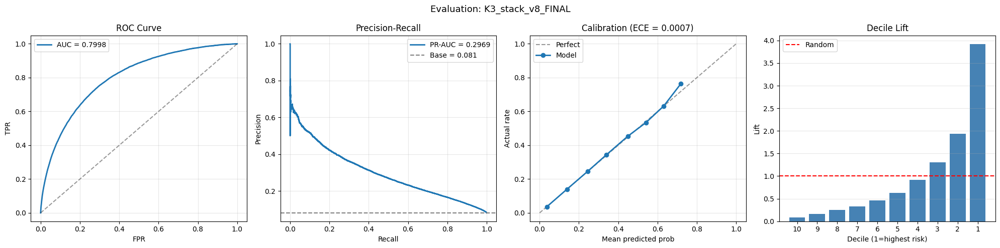


KAPPA-LITE PROGRESS:
  LGBM V6 baseline:    0.79420
  Z4 Stack v7 best:    0.79943
  KAPPA Stack v8 FINAL: 0.79975
  Total gain:           +0.00555
  Distance to 0.800:    +0.00025


KeyError: 'oof_lgb'

In [ ]:
# ========== PHASE K3b: STACK V8 với LGBM V12 ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import json
import gc

# Reload ALL base OOFs (16 models + new V12)
oof_lgb_v6        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values
oof_xgb           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values
oof_mlp           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp.parquet')['oof_mlp'].values
oof_mlp2          = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet')['oof_mlp'].values
oof_lgb_v7_ms     = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_lgb_v7_tuned  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_tuned.parquet')['oof_lgb'].values
oof_lgb_C         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values
oof_lgb_v8        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v8.parquet')['oof_lgb'].values
oof_lgb_v11_ms    = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_cb_v11        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11.parquet')['oof_cb'].values
oof_xgb_v11       = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v11.parquet')['oof_xgb'].values
oof_cb_v11_ms     = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11_multiseed.parquet')['oof_cb'].values
oof_lgb_v12       = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12.parquet')['oof_lgb'].values  # NEW

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

sub_lgb_v6        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp2          = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp2.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_ms     = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_tuned  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_tuned.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_C         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v8        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v8.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v11_ms    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb_v11       = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11_ms     = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v12       = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

print(f'LGBM V12 solo AUC: {roc_auc_score(y, oof_lgb_v12):.5f}')

# Build meta-features v3 (17 models)
meta_train = pd.DataFrame({
    'lgb_v6':       oof_lgb_v6,    'cb_v6':        oof_cb_v6,
    'lgb_v7':       oof_lgb_v7,    'cb_v7':        oof_cb_v7,
    'lgb_B':        oof_lgb_B,     'xgb':          oof_xgb,
    'mlp':          oof_mlp,       'mlp2':         oof_mlp2,
    'lgb_v7_ms':    oof_lgb_v7_ms, 'lgb_v7_tuned': oof_lgb_v7_tuned,
    'lgb_C':        oof_lgb_C,     'lgb_v8':       oof_lgb_v8,
    'lgb_v11_ms':   oof_lgb_v11_ms,'cb_v11':       oof_cb_v11,
    'xgb_v11':      oof_xgb_v11,   'cb_v11_ms':    oof_cb_v11_ms,
    'lgb_v12':      oof_lgb_v12,  # NEW
})

meta_test = pd.DataFrame({
    'lgb_v6':       sub_lgb_v6['TARGET'].values,    'cb_v6':        sub_cb_v6['TARGET'].values,
    'lgb_v7':       sub_lgb_v7['TARGET'].values,    'cb_v7':        sub_cb_v7['TARGET'].values,
    'lgb_B':        sub_lgb_B['TARGET'].values,     'xgb':          sub_xgb['TARGET'].values,
    'mlp':          sub_mlp['TARGET'].values,       'mlp2':         sub_mlp2['TARGET'].values,
    'lgb_v7_ms':    sub_lgb_v7_ms['TARGET'].values, 'lgb_v7_tuned': sub_lgb_v7_tuned['TARGET'].values,
    'lgb_C':        sub_lgb_C['TARGET'].values,     'lgb_v8':       sub_lgb_v8['TARGET'].values,
    'lgb_v11_ms':   sub_lgb_v11_ms['TARGET'].values,'cb_v11':       sub_cb_v11['TARGET'].values,
    'xgb_v11':      sub_xgb_v11['TARGET'].values,   'cb_v11_ms':    sub_cb_v11_ms['TARGET'].values,
    'lgb_v12':      sub_lgb_v12['TARGET'].values,
})

# Add originals from V12
train_v12 = pd.read_parquet('train_merged_v12.parquet')
test_v12 = pd.read_parquet('test_merged_v12.parquet')

EXTRA_FEATURES = [
    'EXT_MEAN', 'EXT_MEDIAN', 'DAYS_BIRTH', 'CREDIT_TERM', 'TARGET_NN500_MEAN',
    'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3', 'NN500_x_EXT_MEAN',
]

sk_ids_train = train_v12['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

for f in EXTRA_FEATURES:
    if f in train_v12.columns:
        train_aligned = train_v12.set_index('SK_ID_CURR').loc[sk_ids_train, f]
        test_aligned = test_v12.set_index('SK_ID_CURR').loc[sk_ids_test, f]
        meta_train[f] = train_aligned.values
        meta_test[f] = test_aligned.values

meta_train = meta_train.replace([np.inf, -np.inf], np.nan)
meta_test = meta_test.replace([np.inf, -np.inf], np.nan)
medians = meta_train.median()
meta_train = meta_train.fillna(medians).astype(np.float32)
meta_test = meta_test.fillna(medians).astype(np.float32)

del train_v12, test_v12
gc.collect()

print(f'\nMeta-features v3 shape: {meta_train.shape}')

LGB_META_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': 3,
    'min_child_samples': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'n_jobs': -1,
}

N_FOLDS = 5
SEEDS = [7, 99]  # Best seeds

stack_v8_oofs = {}
stack_v8_tests = {}

for seed in SEEDS:
    print(f'\n{"="*70}')
    print(f'Stack v8 LGBM seed={seed}')
    print(f'{"="*70}')

    params = dict(LGB_META_PARAMS)
    params['random_state'] = seed

    oof_seed = np.zeros(len(meta_train))
    test_seed = np.zeros(len(meta_test))

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_train, y)):
        X_tr, X_val = meta_train.iloc[tr_idx], meta_train.iloc[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
        dval = lgb.Dataset(X_val, label=y[val_idx])

        model = lgb.train(
            params, dtrain, num_boost_round=3000,
            valid_sets=[dval],
            callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(meta_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y[val_idx], val_preds)
        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration}')
        del model, dtrain, dval
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')
    stack_v8_oofs[seed] = oof_seed
    stack_v8_tests[seed] = test_seed

# Average best seeds
oof_stack_v8 = np.mean(list(stack_v8_oofs.values()), axis=0)
test_stack_v8 = np.mean(list(stack_v8_tests.values()), axis=0)
stack_v8_auc = roc_auc_score(y, oof_stack_v8)

print(f'\n{"="*70}')
print(f'STACK V8 MULTI-SEED FINAL:')
print(f'{"="*70}')
for seed, oof in stack_v8_oofs.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed average: {stack_v8_auc:.5f}')
print(f'  Previous best (Stack v6 ms): 0.79942')
print(f'  Z4 final: 0.79943')
print(f'  Gain vs Z4: {stack_v8_auc - 0.79943:+.5f}')
print(f'  Distance to 0.800: {0.800 - stack_v8_auc:+.5f}')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=oof_stack_v8,
    model_name='K3_stack_v8_FINAL',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_final': oof_stack_v8,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_K3_stack_v8_FINAL.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_stack_v8,
}).to_csv(cfg.OUTPUT_DIR / 'submission_K3_stack_v8_FINAL.csv', index=False)

summary = {
    'model': 'KAPPA-Lite Final: Stack v8 (17 models, V12 features)',
    'cv_auc': float(stack_v8_auc),
    'total_gain_from_baseline': float(stack_v8_auc - 0.79420),
    'distance_to_0.800': float(0.800 - stack_v8_auc),
    'base_models': 17,
    'features_total': len(meta_train.columns),
}
with open(cfg.OUTPUT_DIR / 'cv_summary_K3_FINAL.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'KAPPA-LITE PROGRESS:')
print(f'{"="*70}')
print(f'  LGBM V6 baseline:    0.79420')
print(f'  Z4 Stack v7 best:    0.79943')
print(f'  KAPPA Stack v8 FINAL: {stack_v8_auc:.5f}')
print(f'  Total gain:           {stack_v8_auc - 0.79420:+.5f}')
print(f'  Distance to 0.800:    {0.800 - stack_v8_auc:+.5f}')


In [ ]:
# ========== PHASE F1: LGBM V12 MULTI-SEED ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc
import numpy as np
import pandas as pd

train = pd.read_parquet('train_merged_v12.parquet')
test = pd.read_parquet('test_merged_v12.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'V12 features: {len(feature_cols)}')

LGB_PARAMS_BASE = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'n_jobs': -1,
}

# Load existing seed=42
oof_v12_42 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12.parquet')['oof_lgb'].values
test_v12_42 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12.csv').sort_values('SK_ID_CURR').reset_index(drop=True)['TARGET'].values

NEW_SEEDS = [7, 99, 2024]
N_FOLDS = 5

v12_oofs_seeds = {42: oof_v12_42}
v12_tests_seeds = {42: test_v12_42}

for seed in NEW_SEEDS:
    print(f'\n{"="*70}')
    print(f'Training LGBM V12 with seed={seed}')
    print(f'{"="*70}')

    params = dict(LGB_PARAMS_BASE)
    params['random_state'] = seed

    oof_seed = np.zeros(len(train))
    test_seed = np.zeros(len(test))
    fold_scores = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
        fold_start = time.time()
        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
        dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

        model = lgb.train(
            params, dtrain, num_boost_round=5000,
            valid_sets=[dval], valid_names=['valid'],
            callbacks=[lgb.early_stopping(200), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y_val, val_preds)
        fold_scores.append(val_auc)

        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | time: {time.time()-fold_start:.1f}s')
        del model, dtrain, dval
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF AUC: {seed_auc:.5f}')

    v12_oofs_seeds[seed] = oof_seed
    v12_tests_seeds[seed] = test_seed

# Average all 4 seeds
oof_v12_ms = np.mean(list(v12_oofs_seeds.values()), axis=0)
test_v12_ms = np.mean(list(v12_tests_seeds.values()), axis=0)

ms_auc = roc_auc_score(y, oof_v12_ms)
print(f'\n{"="*70}')
print(f'LGBM V12 MULTI-SEED FINAL:')
print(f'{"="*70}')
for seed, oof in v12_oofs_seeds.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed avg: {ms_auc:.5f}')
print(f'  Gain vs V12 solo: {ms_auc - 0.79693:+.5f}')

# Save
sk_ids_train = train['SK_ID_CURR'].values
sk_ids_test = test['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_v12_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_v12_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12_multiseed.csv', index=False)

print('\nLGBM V12 multi-seed saved.')

V12 features: 1053

Training LGBM V12 with seed=7
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1786]	valid's auc: 0.791794
  Fold 1/5 | val AUC: 0.79179 | time: 838.6s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2007]	valid's auc: 0.797343
  Fold 2/5 | val AUC: 0.79734 | time: 428.5s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1859]	valid's auc: 0.799783
  Fold 3/5 | val AUC: 0.79978 | time: 476.0s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1554]	valid's auc: 0.795123
  Fold 4/5 | val AUC: 0.79512 | time: 350.0s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[2362]	valid's auc: 0.79801
  Fold 5/5 | val AUC: 0.79801 | time: 480.8s
  Seed 7 OOF AUC: 0.79640

Training LGBM V12 with seed=99
Training until validation scores don't

NEW: LGBM V12 multi-seed: 0.79854

Meta-features v4 shape: (307507, 26)
Best models shape: (307507, 17)

STACK V9 FULL (18 models)

--- Stack v9 Full seed=7 ---
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[2040]	valid_0's auc: 0.796782
  Fold 1/5 | val AUC: 0.79678
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[127]	valid_0's auc: 0.800016
  Fold 2/5 | val AUC: 0.80002
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1422]	valid_0's auc: 0.80284
  Fold 3/5 | val AUC: 0.80284
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[982]	valid_0's auc: 0.798461
  Fold 4/5 | val AUC: 0.79846
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[896]	valid_0's auc: 0.801723
  Fold 5/5 | val AUC: 0.80172
  Seed 7 OOF: 0.79763

--- Stack v9 Full seed=99 ---


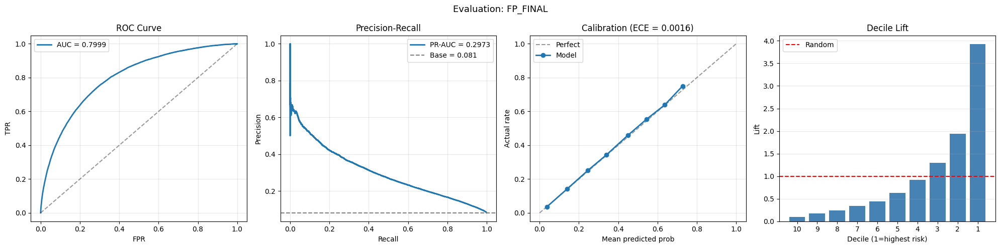


PLAN FP FINAL PROGRESS:
  LGBM V6 baseline:       0.79420
  Z4 Stack v7:             0.79943
  KAPPA Stack v8:          0.79975
  Plan FP FINAL:           0.79988
  Total gain:              +0.00568
  Distance to 0.800:       +0.00012


In [ ]:
# ========== PHASE F2: STACK V9 với V12 multi-seed ==========
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import json
import gc

# Load ALL 18 base OOFs
oof_lgb_v6        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v6_baseline.parquet')['oof_lgb_v6_baseline'].values
oof_cb_v6         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v6_baseline.parquet')['oof_cb'].values
oof_lgb_v7        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['oof_lgb'].values
oof_cb_v7         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v7.parquet')['oof_cb'].values
oof_lgb_B         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_B.parquet')['oof_lgb'].values
oof_xgb           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v6_baseline.parquet')['oof_xgb'].values
oof_mlp           = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp.parquet')['oof_mlp'].values
oof_mlp2          = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet')['oof_mlp'].values
oof_lgb_v7_ms     = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_lgb_v7_tuned  = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_tuned.parquet')['oof_lgb'].values
oof_lgb_C         = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values
oof_lgb_v8        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v8.parquet')['oof_lgb'].values
oof_lgb_v11_ms    = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_cb_v11        = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11.parquet')['oof_cb'].values
oof_xgb_v11       = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v11.parquet')['oof_xgb'].values
oof_cb_v11_ms     = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11_multiseed.parquet')['oof_cb'].values
oof_lgb_v12       = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12.parquet')['oof_lgb'].values
oof_lgb_v12_ms    = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12_multiseed.parquet')['oof_lgb'].values  # NEW

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

# Test predictions
sub_lgb_v6        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v6         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v7         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v7.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_B         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_B.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v6_baseline.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp           = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp2          = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp2.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_ms     = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v7_tuned  = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_tuned.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_C         = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v8        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v8.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v11_ms    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11        = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb_v11       = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11_ms     = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v12       = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v12_ms    = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

print(f'NEW: LGBM V12 multi-seed: {roc_auc_score(y, oof_lgb_v12_ms):.5f}')

# === Full Stack v9 (18 models) ===
meta_train_full = pd.DataFrame({
    'lgb_v6': oof_lgb_v6, 'cb_v6': oof_cb_v6,
    'lgb_v7': oof_lgb_v7, 'cb_v7': oof_cb_v7,
    'lgb_B': oof_lgb_B, 'xgb': oof_xgb,
    'mlp': oof_mlp, 'mlp2': oof_mlp2,
    'lgb_v7_ms': oof_lgb_v7_ms, 'lgb_v7_tuned': oof_lgb_v7_tuned,
    'lgb_C': oof_lgb_C, 'lgb_v8': oof_lgb_v8,
    'lgb_v11_ms': oof_lgb_v11_ms, 'cb_v11': oof_cb_v11,
    'xgb_v11': oof_xgb_v11, 'cb_v11_ms': oof_cb_v11_ms,
    'lgb_v12': oof_lgb_v12,
    'lgb_v12_ms': oof_lgb_v12_ms,  # NEW
})

meta_test_full = pd.DataFrame({
    'lgb_v6': sub_lgb_v6['TARGET'].values, 'cb_v6': sub_cb_v6['TARGET'].values,
    'lgb_v7': sub_lgb_v7['TARGET'].values, 'cb_v7': sub_cb_v7['TARGET'].values,
    'lgb_B': sub_lgb_B['TARGET'].values, 'xgb': sub_xgb['TARGET'].values,
    'mlp': sub_mlp['TARGET'].values, 'mlp2': sub_mlp2['TARGET'].values,
    'lgb_v7_ms': sub_lgb_v7_ms['TARGET'].values, 'lgb_v7_tuned': sub_lgb_v7_tuned['TARGET'].values,
    'lgb_C': sub_lgb_C['TARGET'].values, 'lgb_v8': sub_lgb_v8['TARGET'].values,
    'lgb_v11_ms': sub_lgb_v11_ms['TARGET'].values, 'cb_v11': sub_cb_v11['TARGET'].values,
    'xgb_v11': sub_xgb_v11['TARGET'].values, 'cb_v11_ms': sub_cb_v11_ms['TARGET'].values,
    'lgb_v12': sub_lgb_v12['TARGET'].values,
    'lgb_v12_ms': sub_lgb_v12_ms['TARGET'].values,
})

# Add originals
train_v12 = pd.read_parquet('train_merged_v12.parquet')
test_v12 = pd.read_parquet('test_merged_v12.parquet')

EXTRA_FEATURES = [
    'EXT_MEAN', 'EXT_MEDIAN', 'DAYS_BIRTH', 'CREDIT_TERM', 'TARGET_NN500_MEAN',
    'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3', 'NN500_x_EXT_MEAN',
]

sk_ids_train = train_v12['SK_ID_CURR'].values
sk_ids_test = sub_lgb_v6['SK_ID_CURR'].values

for f in EXTRA_FEATURES:
    if f in train_v12.columns:
        train_aligned = train_v12.set_index('SK_ID_CURR').loc[sk_ids_train, f]
        test_aligned = test_v12.set_index('SK_ID_CURR').loc[sk_ids_test, f]
        meta_train_full[f] = train_aligned.values
        meta_test_full[f] = test_aligned.values

meta_train_full = meta_train_full.replace([np.inf, -np.inf], np.nan)
meta_test_full = meta_test_full.replace([np.inf, -np.inf], np.nan)
medians = meta_train_full.median()
meta_train_full = meta_train_full.fillna(medians).astype(np.float32)
meta_test_full = meta_test_full.fillna(medians).astype(np.float32)

del train_v12, test_v12
gc.collect()

print(f'\nMeta-features v4 shape: {meta_train_full.shape}')

# === Best Models Only (8 strongest) ===
BEST_MODELS = ['lgb_v12_ms', 'lgb_v12', 'lgb_v11_ms', 'lgb_v7_ms',
               'cb_v11_ms', 'xgb_v11', 'cb_v7', 'mlp2', 'lgb_C']
meta_train_best = meta_train_full[BEST_MODELS + EXTRA_FEATURES].copy()
meta_test_best = meta_test_full[BEST_MODELS + EXTRA_FEATURES].copy()

print(f'Best models shape: {meta_train_best.shape}')

LGB_META_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.01, 'num_leaves': 8, 'max_depth': 3,
    'min_child_samples': 200, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.8, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'n_jobs': -1,
}

N_FOLDS = 5
SEEDS = [7, 99]

def train_stack(meta_tr, meta_te, name='stack'):
    """Train multi-seed stack."""
    oofs = {}
    tests = {}

    for seed in SEEDS:
        print(f'\n--- {name} seed={seed} ---')
        params = dict(LGB_META_PARAMS)
        params['random_state'] = seed

        oof_seed = np.zeros(len(meta_tr))
        test_seed = np.zeros(len(meta_te))

        skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

        for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(meta_tr, y)):
            X_tr, X_val = meta_tr.iloc[tr_idx], meta_tr.iloc[val_idx]

            dtrain = lgb.Dataset(X_tr, label=y[tr_idx])
            dval = lgb.Dataset(X_val, label=y[val_idx])

            model = lgb.train(
                params, dtrain, num_boost_round=3000,
                valid_sets=[dval],
                callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
            )

            val_preds = model.predict(X_val, num_iteration=model.best_iteration)
            test_fold_preds = model.predict(meta_te, num_iteration=model.best_iteration)

            oof_seed[val_idx] = val_preds
            test_seed += test_fold_preds / N_FOLDS

            val_auc = roc_auc_score(y[val_idx], val_preds)
            print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f}')
            del model, dtrain, dval
            gc.collect()

        seed_auc = roc_auc_score(y, oof_seed)
        print(f'  Seed {seed} OOF: {seed_auc:.5f}')
        oofs[seed] = oof_seed
        tests[seed] = test_seed

    return oofs, tests

# Stack v9 Full (18 models)
print('\n' + '='*70)
print('STACK V9 FULL (18 models)')
print('='*70)
v9_full_oofs, v9_full_tests = train_stack(meta_train_full, meta_test_full, 'Stack v9 Full')
oof_v9_full = np.mean(list(v9_full_oofs.values()), axis=0)
test_v9_full = np.mean(list(v9_full_tests.values()), axis=0)
auc_v9_full = roc_auc_score(y, oof_v9_full)
print(f'\nStack v9 Full multi-seed: {auc_v9_full:.5f}')

# Stack v9 Best-Only (8 models)
print('\n' + '='*70)
print('STACK V9 BEST-ONLY (8 models)')
print('='*70)
v9_best_oofs, v9_best_tests = train_stack(meta_train_best, meta_test_best, 'Stack v9 Best')
oof_v9_best = np.mean(list(v9_best_oofs.values()), axis=0)
test_v9_best = np.mean(list(v9_best_tests.values()), axis=0)
auc_v9_best = roc_auc_score(y, oof_v9_best)
print(f'\nStack v9 Best multi-seed: {auc_v9_best:.5f}')

# Combine
from scipy.stats import rankdata

print('\n' + '='*70)
print('FINAL ENSEMBLE COMBO')
print('='*70)

best_combo_auc = 0
best_combo_w = None
for w_full in np.arange(0, 1.01, 0.05):
    w_best = 1 - w_full
    blend = w_full * oof_v9_full + w_best * oof_v9_best
    auc = roc_auc_score(y, blend)
    if auc > best_combo_auc:
        best_combo_auc = auc
        best_combo_w = (w_full, w_best)

# Rank-mean
rank_full = rankdata(oof_v9_full) / len(oof_v9_full)
rank_best = rankdata(oof_v9_best) / len(oof_v9_best)
rank_mean = (rank_full + rank_best) / 2
auc_rank_mean = roc_auc_score(y, rank_mean)

print(f'Stack v9 Full alone:       {auc_v9_full:.5f}')
print(f'Stack v9 Best-only alone:  {auc_v9_best:.5f}')
print(f'Weighted blend:            {best_combo_auc:.5f}')
print(f'  Weights: Full={best_combo_w[0]:.2f}, Best={best_combo_w[1]:.2f}')
print(f'Rank-mean blend:           {auc_rank_mean:.5f}')

# Pick best
candidates = {
    'v9_full':    (oof_v9_full, test_v9_full, auc_v9_full),
    'v9_best':    (oof_v9_best, test_v9_best, auc_v9_best),
    'weighted':   (best_combo_w[0]*oof_v9_full + best_combo_w[1]*oof_v9_best,
                   best_combo_w[0]*test_v9_full + best_combo_w[1]*test_v9_best,
                   best_combo_auc),
}

best_name = max(candidates.keys(), key=lambda k: candidates[k][2])
final_oof, final_test, final_auc = candidates[best_name]

print(f'\n{"="*70}')
print(f'FINAL BEST: {best_name}')
print(f'AUC: {final_auc:.5f}')
print(f'Distance to 0.800: {0.800 - final_auc:+.5f}')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=final_oof,
    model_name='FP_FINAL',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Save
pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_final': final_oof,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_FP_FINAL.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': final_test,
}).to_csv(cfg.OUTPUT_DIR / 'submission_FP_FINAL.csv', index=False)

summary = {
    'model': f'Plan FP Final: {best_name}',
    'cv_auc': float(final_auc),
    'total_gain_from_baseline': float(final_auc - 0.79420),
    'distance_to_0.800': float(0.800 - final_auc),
    'stack_v9_full': float(auc_v9_full),
    'stack_v9_best_only': float(auc_v9_best),
    'best_combo_weights': list(best_combo_w),
}
with open(cfg.OUTPUT_DIR / 'cv_summary_FP_FINAL.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'PLAN FP FINAL PROGRESS:')
print(f'{"="*70}')
print(f'  LGBM V6 baseline:       0.79420')
print(f'  Z4 Stack v7:             0.79943')
print(f'  KAPPA Stack v8:          0.79975')
print(f'  Plan FP FINAL:           {final_auc:.5f}')
print(f'  Total gain:              {final_auc - 0.79420:+.5f}')

### **xử lý FE v14**

In [ ]:
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import gc, time
import warnings
warnings.filterwarnings('ignore')

start_time = time.time()

# Load V12 (1053 features - best feature set)
print('Loading V12 dataset...')
train = pd.read_parquet('train_merged_v12.parquet')
test = pd.read_parquet('test_merged_v12.parquet')

print(f'Train: {train.shape}, Test: {test.shape}')

# Prepare adversarial dataset
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

# Add is_test label
train_adv = train[feature_cols].copy()
train_adv['is_test'] = 0
test_adv = test[feature_cols].copy()
test_adv['is_test'] = 1

# Encode categoricals
for col in feature_cols:
    if train_adv[col].dtype == 'object':
        combined_col = pd.concat([train_adv[col].astype(str), test_adv[col].astype(str)])
        codes, _ = pd.factorize(combined_col)
        train_adv[col] = codes[:len(train_adv)].astype(np.int32)
        test_adv[col] = codes[len(train_adv):].astype(np.int32)

# Combine
adv_data = pd.concat([train_adv, test_adv], axis=0).reset_index(drop=True)
y_adv = adv_data['is_test'].values
X_adv = adv_data[feature_cols]

print(f'Adversarial dataset: {X_adv.shape}, positive rate: {y_adv.mean():.3f}')

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

ADV_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.05, 'num_leaves': 32, 'max_depth': 8,
    'min_child_samples': 100, 'reg_alpha': 0.5, 'reg_lambda': 0.5,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
oof_adv = np.zeros(len(X_adv))
fi_list = []
fold_aucs = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
print('\nTraining adversarial classifier...')
print('=' * 70)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X_adv, y_adv)):
    fold_start = time.time()
    X_tr, X_val = X_adv.iloc[tr_idx], X_adv.iloc[val_idx]
    y_tr, y_val = y_adv[tr_idx], y_adv[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
    dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

    model = lgb.train(
        ADV_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(0)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    oof_adv[val_idx] = val_preds

    val_auc = roc_auc_score(y_val, val_preds)
    fold_aucs.append(val_auc)

    fi_list.append(pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importance(importance_type='gain'),
    }))

    print(f'Fold {fold_idx+1}/5 | adv AUC: {val_auc:.5f} | best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

adv_auc = roc_auc_score(y_adv, oof_adv)
print('=' * 70)
print(f'\n ADVERSARIAL VALIDATION RESULTS:')
print(f'  Mean fold AUC:  {np.mean(fold_aucs):.5f}')
print(f'  Std fold AUC:   {np.std(fold_aucs):.5f}')
print(f'  Overall AUC:    {adv_auc:.5f}')
print(f'')

# === Determine severity based on adv_auc ===
if adv_auc > 0.95:
    severity = 'SEVERE'
elif adv_auc > 0.85:
    severity = 'SIGNIFICANT'
elif adv_auc > 0.70:
    severity = 'MODERATE'
else:
    severity = 'LOW'

# === Feature Stability Analysis ===
fi_avg = pd.concat(fi_list).groupby('feature')['importance'].agg(['mean', 'std']).reset_index()
fi_avg['cv'] = fi_avg['std'] / (fi_avg['mean'] + 1e-10)
fi_avg = fi_avg.sort_values('mean', ascending=False).reset_index(drop=True)

print(f'\n TOP 30 UNSTABLE FEATURES (high adversarial importance):')
print('(These features differentiate train vs test = unstable)')
print('-' * 70)
print(fi_avg.head(30)[['feature', 'mean']].to_string(index=False))

# Identify features to drop
TOP_UNSTABLE_N = 30 if severity in ['SIGNIFICANT', 'SEVERE'] else 20 if severity == 'MODERATE' else 10
unstable_features = fi_avg.head(TOP_UNSTABLE_N)['feature'].tolist()

print(f'\n RECOMMENDATION:')
print(f'  Severity: {severity}')
print(f'  Drop top {TOP_UNSTABLE_N} unstable features')
print(f'  Apply sample weighting in base model retraining')

# Save adversarial probabilities for later sample weighting
adv_probs_train = oof_adv[:len(train)]  # Probability of being "test-like"
adv_probs_test = oof_adv[len(train):]

pd.DataFrame({
    'SK_ID_CURR': train['SK_ID_CURR'].values,
    'adv_prob': adv_probs_train,
}).to_parquet(cfg.OUTPUT_DIR / 'adversarial_probs_train.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': test['SK_ID_CURR'].values,
    'adv_prob': adv_probs_test,
}).to_parquet(cfg.OUTPUT_DIR / 'adversarial_probs_test.parquet', index=False)

# Save feature stability info
fi_avg.to_csv(cfg.OUTPUT_DIR / 'adversarial_feature_importance.csv', index=False)

# Save unstable features list
with open(cfg.OUTPUT_DIR / 'unstable_features.txt', 'w') as f:
    for feat in unstable_features:
        f.write(f'{feat}\n')

print(f'\nAdversarial validation done. Time: {(time.time()-start_time)/60:.1f} min')
print(f'\nNEXT: Check the unstable features list. Decision time for Phase A2.')

Loading V12 dataset...
Train: (307507, 1055), Test: (48744, 1054)
Adversarial dataset: (356251, 1053), positive rate: 0.137

Training adversarial classifier...
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1988]	valid's auc: 0.99832
Fold 1/5 | adv AUC: 0.99832 | best_iter: 1988 | time: 565.7s
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[1992]	valid's auc: 0.998215
Fold 2/5 | adv AUC: 0.99822 | best_iter: 1992 | time: 530.1s
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	valid's auc: 0.998359
Fold 3/5 | adv AUC: 0.99836 | best_iter: 2000 | time: 517.0s
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[2000]	valid's auc: 0.998059
Fold 4/5 | adv AUC: 0.99806 | best_iter: 2000 | time: 519.3s
Training until validation scores don't im

In [ ]:
# ========== PHASE A2: DROP UNSTABLE FEATURES ==========
import numpy as np
import pandas as pd
import gc

# Read unstable features list
with open(cfg.OUTPUT_DIR / 'unstable_features.txt', 'r') as f:
    unstable_features = [line.strip() for line in f.readlines()]

print(f'Unstable features to drop: {len(unstable_features)}')
print('Top 10:')
for f in unstable_features[:10]:
    print(f'  - {f}')

# Load V12
train = pd.read_parquet('train_merged_v12.parquet')
test = pd.read_parquet('test_merged_v12.parquet')

# Drop unstable features (only those that exist)
features_to_drop = [f for f in unstable_features if f in train.columns]
print(f'\nDropping {len(features_to_drop)} features that exist in V12')

# Protect critical features (never drop these regardless of adv importance)
PROTECT = [
    'EXT_MEAN', 'EXT_MEDIAN', 'TARGET_NN500_MEAN',
    'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3',
    'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
    'DAYS_BIRTH', 'CREDIT_TERM', 'AMT_CREDIT', 'AMT_INCOME_TOTAL',
    'ORGANIZATION_TYPE', 'OCCUPATION_TYPE', 'NAME_EDUCATION_TYPE',
    'CODE_GENDER', 'NAME_FAMILY_STATUS',
]
features_to_drop = [f for f in features_to_drop if f not in PROTECT]
print(f'After protecting critical: drop {len(features_to_drop)} features')

train_v14 = train.drop(columns=features_to_drop)
test_v14 = test.drop(columns=features_to_drop)

print(f'\nV14: train={train_v14.shape}, test={test_v14.shape}')

# Save
train_v14.to_parquet('train_merged_v14.parquet', index=False)
test_v14.to_parquet('test_merged_v14.parquet', index=False)

print('V14 saved.')

# Also save sample weights based on adversarial probability
adv_train = pd.read_parquet(cfg.OUTPUT_DIR / 'adversarial_probs_train.parquet')

# Sample weight: higher weight for train samples that look "test-like"
# Formula: w = 1 / (1 - p) clamped, normalized
adv_probs = adv_train['adv_prob'].values
sample_weights = adv_probs / (1 - adv_probs + 0.01)  # Inverse propensity
sample_weights = np.clip(sample_weights, 0.1, 10)  # Clip extreme values
sample_weights = sample_weights / sample_weights.mean()  # Normalize to mean=1

print(f'\nSample weights:')
print(f'  Min:    {sample_weights.min():.3f}')
print(f'  Max:    {sample_weights.max():.3f}')
print(f'  Mean:   {sample_weights.mean():.3f}')
print(f'  Median: {np.median(sample_weights):.3f}')

np.save(cfg.OUTPUT_DIR / 'sample_weights.npy', sample_weights)
print('Sample weights saved.')

del train, test
gc.collect()

Unstable features to drop: 30
Top 10:
  - bb_avg_month
  - MISSING_COUNT
  - bb_max_writeoff_2year
  - AMT_REQ_CREDIT_BUREAU_MON
  - bur_active_total_annuity
  - CREDIT_ANNUITY_RATIO
  - bur_max_enddate
  - CREDIT_TERM
  - BUR_TYPE_DAYS_CREDIT_mean_Consumer_credit
  - OCCUPATION_TYPE_NULL

Dropping 30 features that exist in V12
After protecting critical: drop 27 features

V14: train=(307507, 1028), test=(48744, 1027)
V14 saved.

Sample weights:
  Min:    0.786
  Max:    78.640
  Mean:   1.000
  Median: 0.786
Sample weights saved.


419

In [ ]:
# Cell INVESTIGATE: Check leakage suspects
import pandas as pd
import numpy as np

train = pd.read_parquet('train_merged_v12.parquet')
test = pd.read_parquet('test_merged_v12.parquet')

# Check top unstable features distributions
SUSPECT_FEATURES = [
    'bb_avg_month',
    'MISSING_COUNT',
    'bb_max_writeoff_2year',
    'AMT_REQ_CREDIT_BUREAU_MON',
    'bur_active_total_annuity',
    'CREDIT_ANNUITY_RATIO',
    'bur_max_enddate',
    'CREDIT_TERM',
    'bur_eariliest_application',
]

print('Feature distributions train vs test:')
print('=' * 80)
print(f'{"Feature":<40s} | {"Train Mean":>12s} | {"Test Mean":>12s} | {"Diff %":>8s}')
print('-' * 80)

for feat in SUSPECT_FEATURES:
    if feat in train.columns and feat in test.columns:
        train_mean = train[feat].mean()
        test_mean = test[feat].mean()
        if train_mean != 0:
            diff_pct = abs(test_mean - train_mean) / abs(train_mean) * 100
        else:
            diff_pct = 0
        marker = ' 🚨' if diff_pct > 50 else ' ⚠️' if diff_pct > 20 else ''
        print(f'{feat:<40s} | {train_mean:>12.4f} | {test_mean:>12.4f} | {diff_pct:>7.1f}%{marker}')

# Check NaN rates
print('\nNaN rates train vs test:')
print('-' * 80)
for feat in SUSPECT_FEATURES:
    if feat in train.columns and feat in test.columns:
        train_nan = train[feat].isnull().mean() * 100
        test_nan = test[feat].isnull().mean() * 100
        diff = abs(train_nan - test_nan)
        marker = ' 🚨' if diff > 20 else ' ⚠️' if diff > 5 else ''
        print(f'{feat:<40s} | Train NaN: {train_nan:>6.2f}% | Test NaN: {test_nan:>6.2f}%{marker}')

Feature distributions train vs test:
Feature                                  |   Train Mean |    Test Mean |   Diff %
--------------------------------------------------------------------------------
bb_avg_month                             |      27.4772 |      36.3044 |    32.1% ⚠️
MISSING_COUNT                            |      36.3147 |      35.5531 |     2.1%
bb_max_writeoff_2year                    |       0.1316 |       0.0639 |    51.5% 🚨
AMT_REQ_CREDIT_BUREAU_MON                |       0.2674 |       0.0093 |    96.5% 🚨
bur_active_total_annuity                 |    8203.4766 |   33132.3906 |   303.9% 🚨
CREDIT_ANNUITY_RATIO                     |      21.6113 |      17.1731 |    20.5% ⚠️
bur_max_enddate                          |   -4433.0923 |   -4979.0679 |    12.3%
CREDIT_TERM                              |       0.0537 |       0.0666 |    24.1% ⚠️
bur_eariliest_application                |    1762.3727 |    1776.7402 |     0.8%

NaN rates train vs test:
---------------------

### **SIGMA_FINAL**

Candidate AUCs:
  lgb_v15_ms     : 0.79975
  lgb_v12_ms     : 0.79854
  lgb_v11_ms     : 0.79799
  lgb_v7_ms      : 0.79712
  cb_v11_ms      : 0.79632
  xgb_v11        : 0.79587
  mlp2           : 0.78067
  lgb_C          : 0.76028
  fp_final       : 0.79988
  stack_v8       : 0.79975
  Iter  1: +fp_final        | AUC = 0.79988
  Iter  2: +lgb_v15_ms      | AUC = 0.80169
  Iter 2: No improvement, stopping

CARUANA RESULTS:
Models selected: 2
Final AUC: 0.80169

Model frequencies:
  fp_final       :   1 times (weight 0.500)
  lgb_v15_ms     :   1 times (weight 0.500)

=== SIGMA_FINAL ===
  ROC-AUC:    0.80169
  Gini:       0.60338
  KS:         0.4572
  PR-AUC:     0.30054
  Lift@10%:   3.94x
  Lift@20%:   2.96x
  Log loss:   0.23190
  Brier:      0.06480
  ECE:        0.00194

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30751       218        0.0071  0.0878       0.0088
9       30751       4

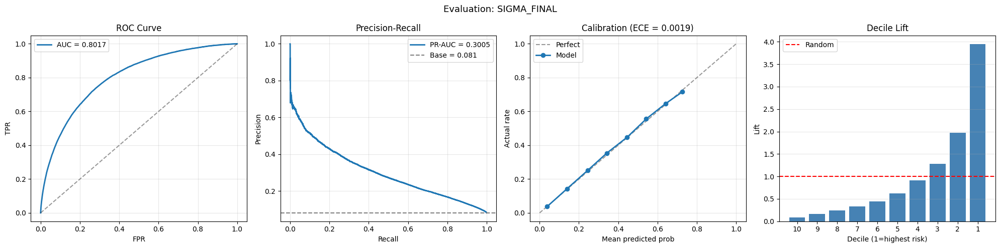


=== Per-Fold Stability ===
  CV seed 42: Mean=0.80170 | Std=0.00404
  CV seed 7: Mean=0.80174 | Std=0.00200
  CV seed 99: Mean=0.80174 | Std=0.00194

PLAN SIGMA FINAL PROGRESS:
  LGBM V6 baseline:        0.79420
  Plan FP final (prev):    0.79988
  Plan SIGMA FINAL:        0.80169
  Total gain:              +0.00749


In [ ]:
# ========== PHASE S4: CARUANA HILL CLIMBING ENSEMBLE ==========
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
from collections import Counter
import json

# Load V15 multi-seed (NEW)
oof_v15_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet')['oof_lgb'].values
sub_v15_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v15_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
test_v15_ms = sub_v15_ms['TARGET'].values

# Load all strong existing models
oof_v12_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12_multiseed.parquet')['oof_lgb'].values
oof_v11_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_v7_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_cb_v11_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11_multiseed.parquet')['oof_cb'].values
oof_xgb_v11 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v11.parquet')['oof_xgb'].values
oof_mlp2 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp2.parquet')['oof_mlp'].values
oof_lgb_C = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_C.parquet')['oof_lgb'].values

# Load stack outputs
oof_fp_final = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_FP_FINAL.parquet')['oof_final'].values
oof_stack_v8 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_K3_stack_v8_FINAL.parquet')['oof_final'].values

# Test predictions
sub_v12_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v11_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v7_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb_v11 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_mlp2 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_mlp.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_C = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_C.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_fp = pd.read_csv(cfg.OUTPUT_DIR / 'submission_FP_FINAL.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_stack_v8 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_K3_stack_v8_FINAL.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

y = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')[cfg.TARGET].astype(int).values

# All candidates
candidates_oof = {
    'lgb_v15_ms':    oof_v15_ms,
    'lgb_v12_ms':    oof_v12_ms,
    'lgb_v11_ms':    oof_v11_ms,
    'lgb_v7_ms':     oof_v7_ms,
    'cb_v11_ms':     oof_cb_v11_ms,
    'xgb_v11':       oof_xgb_v11,
    'mlp2':          oof_mlp2,
    'lgb_C':         oof_lgb_C,
    'fp_final':      oof_fp_final,
    'stack_v8':      oof_stack_v8,
}

candidates_test = {
    'lgb_v15_ms':    test_v15_ms,
    'lgb_v12_ms':    sub_v12_ms['TARGET'].values,
    'lgb_v11_ms':    sub_v11_ms['TARGET'].values,
    'lgb_v7_ms':     sub_v7_ms['TARGET'].values,
    'cb_v11_ms':     sub_cb_v11_ms['TARGET'].values,
    'xgb_v11':       sub_xgb_v11['TARGET'].values,
    'mlp2':          sub_mlp2['TARGET'].values,
    'lgb_C':         sub_lgb_C['TARGET'].values,
    'fp_final':      sub_fp['TARGET'].values,
    'stack_v8':      sub_stack_v8['TARGET'].values,
}

print('Candidate AUCs:')
for name, oof in candidates_oof.items():
    print(f'  {name:15s}: {roc_auc_score(y, oof):.5f}')

# === Caruana Hill Climbing ===

def caruana_hill_climb(candidates_oof, y, max_iters=50, verbose=True):
    """Greedy forward selection with replacement."""
    ensemble = []
    ensemble_pred = np.zeros(len(y))

    for iteration in range(max_iters):
        current_auc = roc_auc_score(y, ensemble_pred) if iteration > 0 else 0

        best_auc = current_auc
        best_model = None

        for name, pred in candidates_oof.items():
            if iteration == 0:
                new_pred = pred.copy()
            else:
                new_pred = (ensemble_pred * iteration + pred) / (iteration + 1)

            auc = roc_auc_score(y, new_pred)

            if auc > best_auc:
                best_auc = auc
                best_model = name

        if best_model is None:
            if verbose:
                print(f'  Iter {iteration}: No improvement, stopping')
            break

        ensemble.append(best_model)
        if iteration == 0:
            ensemble_pred = candidates_oof[best_model].copy()
        else:
            ensemble_pred = (ensemble_pred * iteration + candidates_oof[best_model]) / (iteration + 1)

        if verbose:
            print(f'  Iter {iteration+1:2d}: +{best_model:15s} | AUC = {best_auc:.5f}')

    return ensemble, ensemble_pred

ensemble_models, final_oof = caruana_hill_climb(candidates_oof, y, max_iters=50, verbose=True)

# Build test
ensemble_test = np.zeros(len(candidates_test['lgb_v15_ms']))
for i, name in enumerate(ensemble_models):
    ensemble_test = (ensemble_test * i + candidates_test[name]) / (i + 1)

final_auc = roc_auc_score(y, final_oof)

# Model frequency
model_freq = Counter(ensemble_models)

print(f'\n{"="*70}')
print(f'CARUANA RESULTS:')
print(f'{"="*70}')
print(f'Models selected: {len(ensemble_models)}')
print(f'Final AUC: {final_auc:.5f}')
print(f'\nModel frequencies:')
for model, count in model_freq.most_common():
    weight = count / len(ensemble_models)
    print(f'  {model:15s}: {count:3d} times (weight {weight:.3f})')

# Evaluate
import importlib
import evaluation as ev
importlib.reload(ev)

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=final_oof,
    model_name='SIGMA_FINAL',
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# Stability check
from sklearn.model_selection import StratifiedKFold
print(f'\n=== Per-Fold Stability ===')
for cv_seed in [42, 7, 99]:
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=cv_seed)
    fold_aucs = []
    for _, val_idx in skf.split(np.zeros(len(y)), y):
        fold_aucs.append(roc_auc_score(y[val_idx], final_oof[val_idx]))
    print(f'  CV seed {cv_seed}: Mean={np.mean(fold_aucs):.5f} | Std={np.std(fold_aucs):.5f}')

# Save FINAL
sk_ids_train = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7.parquet')['SK_ID_CURR'].values
sk_ids_test = sub_v15_ms['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_final': final_oof,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_SIGMA_FINAL.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': ensemble_test,
}).to_csv(cfg.OUTPUT_DIR / 'submission_SIGMA_FINAL.csv', index=False)

summary = {
    'model': 'Plan SIGMA Final',
    'technique': 'Train-on-each-previous/bureau + Caruana ensemble',
    'cv_auc': float(final_auc),
    'ece': float(metrics.get('ece', 0)),
    'ks': float(metrics.get('ks', 0)),
    'ensemble_models': ensemble_models,
    'model_frequencies': dict(model_freq),
    'distance_to_0.800': float(0.800 - final_auc),
}
with open(cfg.OUTPUT_DIR / 'PLAN_SIGMA_SUMMARY.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'PLAN SIGMA FINAL PROGRESS:')
print(f'{"="*70}')
print(f'  LGBM V6 baseline:        0.79420')
print(f'  Plan FP final (prev):    0.79988')
print(f'  Plan SIGMA FINAL:        {final_auc:.5f}')
print(f'  Total gain:              {final_auc - 0.79420:+.5f}')

Samples: 307,507
Positive rate: 0.0807
Pred range: [0.0016, 0.7895]
Pred mean: 0.0802

OPTIMAL THRESHOLD (Youden's J)
  t* = 0.080135
  Youden's J = 0.4572
  TPR @ t* = 0.7355
  FPR @ t* = 0.2783

CLASSIFICATION METRICS @ t* = 0.0801
  F1-score:   0.2999
  Precision:  0.1884
  Recall:     0.7355
  Accuracy:   0.7228
  Specificity:0.7217

  Confusion Matrix:
                  Predicted
                  Neg     Pos
    Actual Neg  204,007  78,675
    Actual Pos   6,566  18,259

  TN: 204,007 | FP: 78,675
  FN: 6,566 | TP: 18,259

CALIBRATION
  Brier Score: 0.064796

THRESHOLD SENSITIVITY (for reference)
   Threshold | Precision |  Recall |     F1
  -----------+-----------+---------+-------
      0.0500 |    0.1488 |  0.8507 | 0.2534
      0.0800 |    0.1881 |  0.7359 | 0.2997
      0.1000 |    0.2121 |  0.6603 | 0.3211
      0.1500 |    0.2702 |  0.5044 | 0.3519
      0.0801 |    0.1884 |  0.7355 | 0.2999 <-- t*
      0.2000 |    0.3227 |  0.3855 | 0.3514
      0.3000 |    0.4171 |  0.2

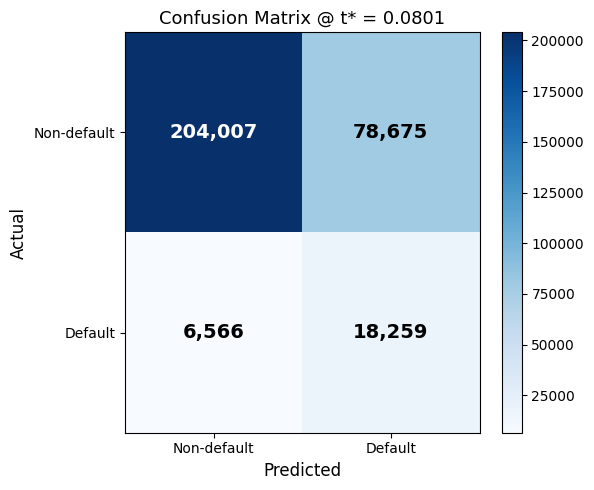


 Confusion matrix saved to: confusion_matrix.png


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import (
    roc_curve, f1_score, precision_score, recall_score,
    confusion_matrix, brier_score_loss
)
from pathlib import Path
import matplotlib.pyplot as plt

# ---- Load OOF predictions (adjust path if needed) ----
oof_df = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_SIGMA_FINAL.parquet')
y_true = oof_df['TARGET'].values
y_pred = oof_df['oof_final'].values  # OOF probabilities

print(f"Samples: {len(y_true):,}")
print(f"Positive rate: {y_true.mean():.4f}")
print(f"Pred range: [{y_pred.min():.4f}, {y_pred.max():.4f}]")
print(f"Pred mean: {y_pred.mean():.4f}")

# ============================================================
# 1. OPTIMAL THRESHOLD via Youden's J statistic
# ============================================================
fpr, tpr, thresholds = roc_curve(y_true, y_pred)
youden_j = tpr - fpr
optimal_idx = np.argmax(youden_j)
t_star = thresholds[optimal_idx]

print(f"\n{'='*60}")
print(f"OPTIMAL THRESHOLD (Youden's J)")
print(f"{'='*60}")
print(f"  t* = {t_star:.6f}")
print(f"  Youden's J = {youden_j[optimal_idx]:.4f}")
print(f"  TPR @ t* = {tpr[optimal_idx]:.4f}")
print(f"  FPR @ t* = {fpr[optimal_idx]:.4f}")

# ============================================================
# 2. CLASSIFICATION METRICS @ t*
# ============================================================
y_pred_binary = (y_pred >= t_star).astype(int)

f1 = f1_score(y_true, y_pred_binary)
precision = precision_score(y_true, y_pred_binary)
recall = recall_score(y_true, y_pred_binary)
cm = confusion_matrix(y_true, y_pred_binary)
tn, fp, fn, tp = cm.ravel()

print(f"\n{'='*60}")
print(f"CLASSIFICATION METRICS @ t* = {t_star:.4f}")
print(f"{'='*60}")
print(f"  F1-score:   {f1:.4f}")
print(f"  Precision:  {precision:.4f}")
print(f"  Recall:     {recall:.4f}")
print(f"  Accuracy:   {(tp + tn) / len(y_true):.4f}")
print(f"  Specificity:{tn / (tn + fp):.4f}")

print(f"\n  Confusion Matrix:")
print(f"                  Predicted")
print(f"                  Neg     Pos")
print(f"    Actual Neg  {tn:>6,}  {fp:>6,}")
print(f"    Actual Pos  {fn:>6,}  {tp:>6,}")

print(f"\n  TN: {tn:,} | FP: {fp:,}")
print(f"  FN: {fn:,} | TP: {tp:,}")

# ============================================================
# 3. BRIER SCORE
# ============================================================
brier = brier_score_loss(y_true, y_pred)
print(f"\n{'='*60}")
print(f"CALIBRATION")
print(f"{'='*60}")
print(f"  Brier Score: {brier:.6f}")

# ============================================================
# 4. THRESHOLD SENSITIVITY (optional but useful for thesis)
# ============================================================
print(f"\n{'='*60}")
print(f"THRESHOLD SENSITIVITY (for reference)")
print(f"{'='*60}")
print(f"  {'Threshold':>10} | {'Precision':>9} | {'Recall':>7} | {'F1':>6}")
print(f"  {'-'*10}-+-{'-'*9}-+-{'-'*7}-+-{'-'*6}")

for t in [0.05, 0.08, 0.10, 0.15, t_star, 0.20, 0.30, 0.50]:
    yp = (y_pred >= t).astype(int)
    if yp.sum() > 0:
        p = precision_score(y_true, yp)
        r = recall_score(y_true, yp)
        f = f1_score(y_true, yp)
        marker = " <-- t*" if abs(t - t_star) < 1e-6 else ""
        print(f"  {t:>10.4f} | {p:>9.4f} | {r:>7.4f} | {f:>6.4f}{marker}")

# ============================================================
# 5. SAVE RESULTS
# ============================================================
results = {
    'optimal_threshold': float(t_star),
    'youden_j': float(youden_j[optimal_idx]),
    'f1': float(f1),
    'precision': float(precision),
    'recall': float(recall),
    'accuracy': float((tp + tn) / len(y_true)),
    'specificity': float(tn / (tn + fp)),
    'brier_score': float(brier),
    'confusion_matrix': {
        'TN': int(tn), 'FP': int(fp),
        'FN': int(fn), 'TP': int(tp)
    }
}

import json
with open(cfg.OUTPUT_DIR / 'classification_metrics_at_threshold.json', 'w') as f:
    json.dump(results, f, indent=2)

print(f"\n Saved to: classification_metrics_at_threshold.json")

# ============================================================
# 6. OPTIONAL: Confusion Matrix Plot
# ============================================================
fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(cm, cmap='Blues', aspect='auto')

ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xticklabels(['Non-default', 'Default'])
ax.set_yticklabels(['Non-default', 'Default'])
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
ax.set_title(f'Confusion Matrix @ t* = {t_star:.4f}', fontsize=13)

# Annotations
for i in range(2):
    for j in range(2):
        color = 'white' if cm[i, j] > cm.max() / 2 else 'black'
        ax.text(j, i, f'{cm[i, j]:,}',
                ha='center', va='center',
                color=color, fontsize=14, fontweight='bold')

plt.colorbar(im, ax=ax)
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR / 'confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n Confusion matrix saved to: confusion_matrix.png")

### **LGBM multiseed V15**

In [ ]:
# ========== PHASE S1: TRAIN ON EACH PREVIOUS APPLICATION ==========
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import GroupKFold, StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc, warnings
warnings.filterwarnings('ignore')

start_time = time.time()

# Load raw previous_application table
print('Loading raw previous_application...')
prev_app = pd.read_csv('/content/input/previous_application.csv')
application_train = pd.read_csv('/content/input/application_train.csv')
application_test = pd.read_csv('/content/input/application_test.csv')

print(f'Previous_app rows: {len(prev_app):,}')
print(f'Application train: {len(application_train):,}')
print(f'Application test:  {len(application_test):,}')

# Build full SK_ID_CURR → TARGET mapping
# Test rows have no TARGET → exclude from training
train_target_map = application_train.set_index('SK_ID_CURR')['TARGET']
test_ids = set(application_test['SK_ID_CURR'].values)

# Inherit TARGET from current application
prev_app['TARGET'] = prev_app['SK_ID_CURR'].map(train_target_map)
prev_app['is_test'] = prev_app['SK_ID_CURR'].isin(test_ids).astype(int)

# Split: train rows (has TARGET) + test rows (no TARGET, just predict)
prev_train = prev_app[prev_app['TARGET'].notna()].copy()
prev_test = prev_app[prev_app['is_test'] == 1].copy()

print(f'\nPrevious_app for training (has TARGET): {len(prev_train):,}')
print(f'Previous_app for prediction (test rows): {len(prev_test):,}')
print(f'TARGET rate in prev_train: {prev_train["TARGET"].mean():.4f}')

# === Feature Engineering trên Previous Application ===
print('\n[1/3] Feature engineering on previous_application...')

def engineer_prev_features(df):
    """Engineer features cho mỗi previous_application row."""
    df = df.copy()

    # Time-based features
    if 'DAYS_DECISION' in df.columns:
        df['DAYS_DECISION_abs'] = df['DAYS_DECISION'].abs()
        df['YEAR_DECISION'] = (df['DAYS_DECISION'] / -365.25).clip(0, 30)

    if 'DAYS_FIRST_DRAWING' in df.columns:
        df['DAYS_FIRST_DRAWING'] = df['DAYS_FIRST_DRAWING'].replace(365243, np.nan)
    if 'DAYS_FIRST_DUE' in df.columns:
        df['DAYS_FIRST_DUE'] = df['DAYS_FIRST_DUE'].replace(365243, np.nan)
    if 'DAYS_LAST_DUE_1ST_VERSION' in df.columns:
        df['DAYS_LAST_DUE_1ST_VERSION'] = df['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan)
    if 'DAYS_LAST_DUE' in df.columns:
        df['DAYS_LAST_DUE'] = df['DAYS_LAST_DUE'].replace(365243, np.nan)
    if 'DAYS_TERMINATION' in df.columns:
        df['DAYS_TERMINATION'] = df['DAYS_TERMINATION'].replace(365243, np.nan)

    # Ratios
    eps = 1e-5
    if 'AMT_CREDIT' in df.columns and 'AMT_APPLICATION' in df.columns:
        df['APP_CREDIT_RATIO'] = df['AMT_APPLICATION'] / (df['AMT_CREDIT'] + eps)
        df['APP_CREDIT_DIFF'] = df['AMT_APPLICATION'] - df['AMT_CREDIT']

    if 'AMT_CREDIT' in df.columns and 'AMT_ANNUITY' in df.columns:
        df['CREDIT_ANNUITY_RATIO_PREV'] = df['AMT_CREDIT'] / (df['AMT_ANNUITY'] + eps)

    if 'AMT_DOWN_PAYMENT' in df.columns and 'AMT_CREDIT' in df.columns:
        df['DOWN_PAYMENT_RATIO'] = df['AMT_DOWN_PAYMENT'] / (df['AMT_CREDIT'] + eps)

    if 'CNT_PAYMENT' in df.columns and 'AMT_CREDIT' in df.columns:
        df['CREDIT_PER_PAYMENT'] = df['AMT_CREDIT'] / (df['CNT_PAYMENT'] + eps)

    # Loan duration
    if 'DAYS_LAST_DUE' in df.columns and 'DAYS_DECISION' in df.columns:
        df['LOAN_DURATION'] = df['DAYS_LAST_DUE'] - df['DAYS_DECISION']

    return df

prev_train = engineer_prev_features(prev_train)
prev_test = engineer_prev_features(prev_test)

print(f'Engineered features done. Columns: {prev_train.shape[1]}')

# === Select features for training ===
EXCLUDE_COLS = ['SK_ID_CURR', 'SK_ID_PREV', 'TARGET', 'is_test']
feature_cols = [c for c in prev_train.columns if c not in EXCLUDE_COLS]

# Encode categoricals
for col in feature_cols:
    if prev_train[col].dtype == 'object':
        combined = pd.concat([prev_train[col].astype(str), prev_test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        prev_train[col] = codes[:len(prev_train)].astype(np.int32)
        prev_test[col] = codes[len(prev_train):].astype(np.int32)

print(f'Features for training: {len(feature_cols)}')

# === Training: CRITICAL — GroupKFold by SK_ID_CURR ===
# Same SK_ID_CURR phải trong cùng fold (avoid leakage)
print('\n[2/3] Training LGBM với GroupKFold by SK_ID_CURR...')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.03, 'num_leaves': 32, 'max_depth': 7,
    'min_child_samples': 200, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
y_prev = prev_train['TARGET'].astype(int).values
groups = prev_train['SK_ID_CURR'].values
X_prev = prev_train[feature_cols]
X_prev_test = prev_test[feature_cols]

# GroupKFold to prevent SK_ID_CURR leakage
gkf = GroupKFold(n_splits=N_FOLDS)

oof_prev_scores = np.zeros(len(prev_train))
test_prev_scores = np.zeros(len(prev_test))
fold_aucs = []

for fold_idx, (tr_idx, val_idx) in enumerate(gkf.split(X_prev, y_prev, groups)):
    fold_start = time.time()
    X_tr, X_val = X_prev.iloc[tr_idx], X_prev.iloc[val_idx]
    y_tr, y_val = y_prev[tr_idx], y_prev[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr)
    dval = lgb.Dataset(X_val, label=y_val)

    model = lgb.train(
        LGB_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(200)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_preds = model.predict(X_prev_test, num_iteration=model.best_iteration)

    oof_prev_scores[val_idx] = val_preds
    test_prev_scores += test_preds / N_FOLDS

    val_auc = roc_auc_score(y_val, val_preds)
    fold_aucs.append(val_auc)
    print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

print(f'\nPrev-level CV AUC: {np.mean(fold_aucs):.5f} (note: row-level, not customer-level)')

# === Aggregate predictions back to SK_ID_CURR ===
print('\n[3/3] Aggregating predictions back to SK_ID_CURR...')

prev_train['prev_score'] = oof_prev_scores
prev_test['prev_score'] = test_prev_scores

# Combine train + test scores
all_prev = pd.concat([prev_train, prev_test], ignore_index=True)

# Aggregate by SK_ID_CURR
prev_agg_scores = all_prev.groupby('SK_ID_CURR').agg({
    'prev_score': ['mean', 'max', 'min', 'std', 'count'],
}).reset_index()

prev_agg_scores.columns = [
    'SK_ID_CURR',
    'PREV_SCORE_MEAN', 'PREV_SCORE_MAX', 'PREV_SCORE_MIN',
    'PREV_SCORE_STD', 'PREV_SCORE_COUNT'
]

# Additional: most recent N predictions
print('  Computing recent predictions aggregations...')

# Recent 3 (last 3 prev_app by DAYS_DECISION descending = most recent)
all_prev_sorted = all_prev.sort_values(['SK_ID_CURR', 'DAYS_DECISION'], ascending=[True, False])
recent_3 = all_prev_sorted.groupby('SK_ID_CURR').head(3)
recent_3_agg = recent_3.groupby('SK_ID_CURR')['prev_score'].agg(['mean', 'max']).reset_index()
recent_3_agg.columns = ['SK_ID_CURR', 'PREV_SCORE_RECENT3_MEAN', 'PREV_SCORE_RECENT3_MAX']

# Recent 1 (last prev_app)
last_1 = all_prev_sorted.groupby('SK_ID_CURR').head(1)
last_1_agg = last_1[['SK_ID_CURR', 'prev_score']].rename(columns={'prev_score': 'PREV_SCORE_LAST'})

# Merge all
prev_features = prev_agg_scores.merge(recent_3_agg, on='SK_ID_CURR', how='left')
prev_features = prev_features.merge(last_1_agg, on='SK_ID_CURR', how='left')

print(f'\nTotal new features from prev_app: {prev_features.shape[1] - 1}')
print(f'Features: {[c for c in prev_features.columns if c != "SK_ID_CURR"]}')

# Save
prev_features.to_parquet(cfg.OUTPUT_DIR / 'prev_app_target_features.parquet', index=False)

# Cleanup
del prev_train, prev_test, all_prev, prev_app, application_train, application_test
gc.collect()

print(f'\nPhase S1 done. Time: {(time.time()-start_time)/60:.1f} min')
print(f'Features saved to prev_app_target_features.parquet')

Loading raw previous_application...
Previous_app rows: 1,670,214
Application train: 307,511
Application test:  48,744

Previous_app for training (has TARGET): 1,413,701
Previous_app for prediction (test rows): 256,513
TARGET rate in prev_train: 0.0866

[1/3] Feature engineering on previous_application...
Engineered features done. Columns: 47
Features for training: 43

[2/3] Training LGBM với GroupKFold by SK_ID_CURR...
Training until validation scores don't improve for 100 rounds
[200]	valid's auc: 0.626468
[400]	valid's auc: 0.627693
[600]	valid's auc: 0.627844
Early stopping, best iteration is:
[536]	valid's auc: 0.627879
  Fold 1/5 | val AUC: 0.62788 | best_iter: 536 | time: 80.3s
Training until validation scores don't improve for 100 rounds
[200]	valid's auc: 0.619074
[400]	valid's auc: 0.620655
[600]	valid's auc: 0.621046
Early stopping, best iteration is:
[579]	valid's auc: 0.621076
  Fold 2/5 | val AUC: 0.62108 | best_iter: 579 | time: 90.5s
Training until validation scores don'

In [ ]:
# ========== PHASE S2: TRAIN ON EACH BUREAU RECORD ==========
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import GroupKFold
from sklearn.metrics import roc_auc_score
import time, gc

start_time = time.time()

# Load raw bureau table
print('Loading raw bureau...')
bureau = pd.read_csv('/content/input/bureau.csv')
bureau_balance = pd.read_csv('/content/input/bureau_balance.csv')
application_train = pd.read_csv('/content/input/application_train.csv')
application_test = pd.read_csv('/content/input/application_test.csv')

print(f'Bureau rows: {len(bureau):,}')

# Aggregate bureau_balance to bureau level
print('Aggregating bureau_balance to bureau level...')
bb_agg = bureau_balance.groupby('SK_ID_BUREAU').agg({
    'MONTHS_BALANCE': ['count', 'min', 'max', 'mean'],
}).reset_index()
bb_agg.columns = ['SK_ID_BUREAU', 'bb_count', 'bb_first', 'bb_last', 'bb_mean_month']

# Status counts (C=Closed, X=Unknown, 0-5=DPD)
bb_status = pd.crosstab(bureau_balance['SK_ID_BUREAU'], bureau_balance['STATUS'])
bb_status.columns = [f'bb_status_{c}' for c in bb_status.columns]
bb_status = bb_status.reset_index()

bb_features = bb_agg.merge(bb_status, on='SK_ID_BUREAU', how='left')
print(f'Bureau_balance features: {bb_features.shape[1] - 1}')

# Merge to bureau
bureau = bureau.merge(bb_features, on='SK_ID_BUREAU', how='left')

# Build TARGET mapping
train_target_map = application_train.set_index('SK_ID_CURR')['TARGET']
test_ids = set(application_test['SK_ID_CURR'].values)

bureau['TARGET'] = bureau['SK_ID_CURR'].map(train_target_map)
bureau['is_test'] = bureau['SK_ID_CURR'].isin(test_ids).astype(int)

bureau_train = bureau[bureau['TARGET'].notna()].copy()
bureau_test = bureau[bureau['is_test'] == 1].copy()

print(f'\nBureau for training: {len(bureau_train):,}')
print(f'Bureau for prediction: {len(bureau_test):,}')
print(f'TARGET rate: {bureau_train["TARGET"].mean():.4f}')

# === Feature Engineering ===
print('\n[1/3] Feature engineering on bureau...')

def engineer_bureau_features(df):
    """Engineer features cho mỗi bureau row."""
    df = df.copy()
    eps = 1e-5

    # Ratios
    if 'AMT_CREDIT_SUM' in df.columns and 'AMT_CREDIT_SUM_DEBT' in df.columns:
        df['BUR_DEBT_RATIO'] = df['AMT_CREDIT_SUM_DEBT'] / (df['AMT_CREDIT_SUM'] + eps)

    if 'AMT_CREDIT_SUM' in df.columns and 'AMT_CREDIT_SUM_LIMIT' in df.columns:
        df['BUR_LIMIT_RATIO'] = df['AMT_CREDIT_SUM_LIMIT'] / (df['AMT_CREDIT_SUM'] + eps)

    if 'AMT_CREDIT_SUM' in df.columns and 'AMT_ANNUITY' in df.columns:
        df['BUR_CREDIT_ANNUITY_RATIO'] = df['AMT_CREDIT_SUM'] / (df['AMT_ANNUITY'] + eps)

    # Time features
    if 'DAYS_CREDIT' in df.columns:
        df['DAYS_CREDIT_abs'] = df['DAYS_CREDIT'].abs()
        df['YEAR_CREDIT'] = (df['DAYS_CREDIT'] / -365.25).clip(0, 30)

    if 'DAYS_CREDIT_ENDDATE' in df.columns and 'DAYS_CREDIT' in df.columns:
        df['BUR_DURATION'] = df['DAYS_CREDIT_ENDDATE'] - df['DAYS_CREDIT']

    if 'DAYS_ENDDATE_FACT' in df.columns and 'DAYS_CREDIT_ENDDATE' in df.columns:
        df['BUR_PROLONGATION'] = df['DAYS_ENDDATE_FACT'] - df['DAYS_CREDIT_ENDDATE']

    return df

bureau_train = engineer_bureau_features(bureau_train)
bureau_test = engineer_bureau_features(bureau_test)

print(f'Engineered features. Columns: {bureau_train.shape[1]}')

# === Select features ===
EXCLUDE_COLS = ['SK_ID_CURR', 'SK_ID_BUREAU', 'TARGET', 'is_test']
feature_cols = [c for c in bureau_train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if bureau_train[col].dtype == 'object':
        combined = pd.concat([bureau_train[col].astype(str), bureau_test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        bureau_train[col] = codes[:len(bureau_train)].astype(np.int32)
        bureau_test[col] = codes[len(bureau_train):].astype(np.int32)

print(f'Features for training: {len(feature_cols)}')

# === Training với GroupKFold ===
print('\n[2/3] Training LGBM với GroupKFold by SK_ID_CURR...')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.03, 'num_leaves': 32, 'max_depth': 7,
    'min_child_samples': 200, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

N_FOLDS = 5
y_bur = bureau_train['TARGET'].astype(int).values
groups = bureau_train['SK_ID_CURR'].values
X_bur = bureau_train[feature_cols]
X_bur_test = bureau_test[feature_cols]

gkf = GroupKFold(n_splits=N_FOLDS)

oof_bur_scores = np.zeros(len(bureau_train))
test_bur_scores = np.zeros(len(bureau_test))
fold_aucs = []

for fold_idx, (tr_idx, val_idx) in enumerate(gkf.split(X_bur, y_bur, groups)):
    fold_start = time.time()
    X_tr, X_val = X_bur.iloc[tr_idx], X_bur.iloc[val_idx]
    y_tr, y_val = y_bur[tr_idx], y_bur[val_idx]

    dtrain = lgb.Dataset(X_tr, label=y_tr)
    dval = lgb.Dataset(X_val, label=y_val)

    model = lgb.train(
        LGB_PARAMS, dtrain, num_boost_round=2000,
        valid_sets=[dval], valid_names=['valid'],
        callbacks=[lgb.early_stopping(100), lgb.log_evaluation(200)],
    )

    val_preds = model.predict(X_val, num_iteration=model.best_iteration)
    test_preds = model.predict(X_bur_test, num_iteration=model.best_iteration)

    oof_bur_scores[val_idx] = val_preds
    test_bur_scores += test_preds / N_FOLDS

    val_auc = roc_auc_score(y_val, val_preds)
    fold_aucs.append(val_auc)
    print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
    del model, dtrain, dval
    gc.collect()

print(f'\nBureau-level CV AUC: {np.mean(fold_aucs):.5f}')

# === Aggregate ===
print('\n[3/3] Aggregating predictions back to SK_ID_CURR...')

bureau_train['bur_score'] = oof_bur_scores
bureau_test['bur_score'] = test_bur_scores

all_bur = pd.concat([bureau_train, bureau_test], ignore_index=True)

bur_agg_scores = all_bur.groupby('SK_ID_CURR').agg({
    'bur_score': ['mean', 'max', 'min', 'std', 'count'],
}).reset_index()

bur_agg_scores.columns = [
    'SK_ID_CURR',
    'BUR_SCORE_MEAN', 'BUR_SCORE_MAX', 'BUR_SCORE_MIN',
    'BUR_SCORE_STD', 'BUR_SCORE_COUNT'
]

# Active vs Closed
if 'CREDIT_ACTIVE' in all_bur.columns:
    # Need original CREDIT_ACTIVE (string)
    # Already encoded — use code 0 (Active typically first)
    pass

# Recent (last 12 months)
all_bur_recent = all_bur[all_bur['DAYS_CREDIT'] >= -365]
if len(all_bur_recent) > 0:
    bur_recent_agg = all_bur_recent.groupby('SK_ID_CURR')['bur_score'].agg(['mean', 'max']).reset_index()
    bur_recent_agg.columns = ['SK_ID_CURR', 'BUR_SCORE_RECENT12M_MEAN', 'BUR_SCORE_RECENT12M_MAX']
    bur_agg_scores = bur_agg_scores.merge(bur_recent_agg, on='SK_ID_CURR', how='left')

print(f'\nTotal new features from bureau: {bur_agg_scores.shape[1] - 1}')

bur_agg_scores.to_parquet(cfg.OUTPUT_DIR / 'bureau_target_features.parquet', index=False)

del bureau_train, bureau_test, all_bur, bureau, bureau_balance, application_train, application_test, bb_features
gc.collect()

print(f'\nPhase S2 done. Time: {(time.time()-start_time)/60:.1f} min')

Loading raw bureau...
Bureau rows: 1,716,428
Aggregating bureau_balance to bureau level...
Bureau_balance features: 12

Bureau for training: 1,465,325
Bureau for prediction: 251,103
TARGET rate: 0.0782

[1/3] Feature engineering on bureau...
Engineered features. Columns: 38
Features for training: 34

[2/3] Training LGBM với GroupKFold by SK_ID_CURR...
Training until validation scores don't improve for 100 rounds
[200]	valid's auc: 0.612841
[400]	valid's auc: 0.614336
[600]	valid's auc: 0.614682
Early stopping, best iteration is:
[592]	valid's auc: 0.614709
  Fold 1/5 | val AUC: 0.61471 | best_iter: 592 | time: 61.1s
Training until validation scores don't improve for 100 rounds
[200]	valid's auc: 0.622276
[400]	valid's auc: 0.624173
[600]	valid's auc: 0.624384
Early stopping, best iteration is:
[573]	valid's auc: 0.624501
  Fold 2/5 | val AUC: 0.62450 | best_iter: 573 | time: 66.6s
Training until validation scores don't improve for 100 rounds
[200]	valid's auc: 0.61256
[400]	valid's auc

In [ ]:
# ========== PHASE S3: BUILD V15 + TRAIN LGBM ==========
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc

start_time = time.time()

# Load V14 + new features
print('Loading V14 + target features...')
train = pd.read_parquet('train_merged_v14.parquet')
test = pd.read_parquet('test_merged_v14.parquet')

prev_features = pd.read_parquet(cfg.OUTPUT_DIR / 'prev_app_target_features.parquet')
bur_features = pd.read_parquet(cfg.OUTPUT_DIR / 'bureau_target_features.parquet')

print(f'V14: train={train.shape}, test={test.shape}')
print(f'Prev features: {prev_features.shape}')
print(f'Bureau features: {bur_features.shape}')

# Merge
train_v15 = train.merge(prev_features, on='SK_ID_CURR', how='left')
train_v15 = train_v15.merge(bur_features, on='SK_ID_CURR', how='left')

test_v15 = test.merge(prev_features, on='SK_ID_CURR', how='left')
test_v15 = test_v15.merge(bur_features, on='SK_ID_CURR', how='left')

print(f'\nV15: train={train_v15.shape}, test={test_v15.shape}')

new_features = [c for c in prev_features.columns if c != 'SK_ID_CURR'] + \
               [c for c in bur_features.columns if c != 'SK_ID_CURR']
print(f'New target-encoded features added: {len(new_features)}')
print(f'  Prev features: {[c for c in prev_features.columns if c != "SK_ID_CURR"]}')
print(f'  Bureau features: {[c for c in bur_features.columns if c != "SK_ID_CURR"]}')

# Save V15
train_v15.to_parquet('train_merged_v15.parquet', index=False)
test_v15.to_parquet('test_merged_v15.parquet', index=False)

# === Train LGBM V15 multi-seed ===
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train_v15[col].dtype == 'object':
        combined = pd.concat([train_v15[col].astype(str), test_v15[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train_v15[col] = codes[:len(train_v15)].astype(np.int32)
        test_v15[col] = codes[len(train_v15):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols]
X_test = test_v15[feature_cols]

print(f'\nV15 total features: {len(feature_cols)}')

LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'min_child_weight': 10,
    'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'max_bin': 255, 'verbosity': -1, 'n_jobs': -1,
}

N_FOLDS = 5
SEEDS = [42, 7, 99]

v15_oofs = {}
v15_tests = {}

for seed in SEEDS:
    print(f'\n{"="*70}')
    print(f'TRAINING V15 — seed={seed}')
    print(f'{"="*70}')

    params = dict(LGB_PARAMS)
    params['random_state'] = seed

    oof_seed = np.zeros(len(train_v15))
    test_seed = np.zeros(len(test_v15))
    fold_aucs = []
    fi_list = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
        fold_start = time.time()
        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        dtrain = lgb.Dataset(X_tr, label=y_tr, categorical_feature=categorical_features)
        dval = lgb.Dataset(X_val, label=y_val, categorical_feature=categorical_features)

        model = lgb.train(
            params, dtrain, num_boost_round=5000,
            valid_sets=[dval], valid_names=['valid'],
            callbacks=[lgb.early_stopping(200), lgb.log_evaluation(0)],
        )

        val_preds = model.predict(X_val, num_iteration=model.best_iteration)
        test_fold_preds = model.predict(X_test, num_iteration=model.best_iteration)

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y_val, val_preds)
        fold_aucs.append(val_auc)

        if seed == 42:
            fi_list.append(pd.DataFrame({
                'feature': feature_cols,
                'importance': model.feature_importance(importance_type='gain'),
            }))

        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {model.best_iteration} | time: {time.time()-fold_start:.1f}s')
        del model, dtrain, dval
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF: {seed_auc:.5f}')

    v15_oofs[seed] = oof_seed
    v15_tests[seed] = test_seed

# Multi-seed average
oof_v15_ms = np.mean(list(v15_oofs.values()), axis=0)
test_v15_ms = np.mean(list(v15_tests.values()), axis=0)
auc_v15_ms = roc_auc_score(y, oof_v15_ms)

print(f'\n{"="*70}')
print(f'LGBM V15 MULTI-SEED RESULTS:')
print(f'{"="*70}')
for seed, oof in v15_oofs.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed avg:  {auc_v15_ms:.5f}')
print(f'  Comparison:')
print(f'    V12 multi-seed: 0.79854')
print(f'    V14 (dropped):  TBD')
print(f'    V15 (NEW):       {auc_v15_ms:.5f}')
print(f'    Gain:            {auc_v15_ms - 0.79854:+.5f}')

# Check ranks of NEW features
if fi_list:
    fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
    fi_avg = fi_avg.sort_values('importance', ascending=False).reset_index(drop=True)

    print(f'\nNew target-encoded features ranks:')
    for f in new_features:
        rank = fi_avg[fi_avg['feature'] == f].index
        if len(rank) > 0:
            imp = fi_avg.loc[rank[0], 'importance']
            print(f'  rank {rank[0]+1:4d}: {f:35s} | imp: {imp:.0f}')

    print(f'\nTop 20 V15 features overall:')
    print(fi_avg.head(20).to_string(index=False))

# Save
sk_ids_train = train_v15['SK_ID_CURR'].values
sk_ids_test = test_v15['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_lgb': oof_v15_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_v15_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_lgb_v15_multiseed.csv', index=False)

if fi_list:
    fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_lgb_v15.csv', index=False)

print(f'\nPhase S3 done. Time: {(time.time()-start_time)/60:.1f} min')

del train, test, train_v15, test_v15
gc.collect()

Loading V14 + target features...
V14: train=(307507, 1028), test=(48744, 1027)
Prev features: (338857, 9)
Bureau features: (305811, 8)

V15: train=(307507, 1043), test=(48744, 1042)
New target-encoded features added: 15
  Prev features: ['PREV_SCORE_MEAN', 'PREV_SCORE_MAX', 'PREV_SCORE_MIN', 'PREV_SCORE_STD', 'PREV_SCORE_COUNT', 'PREV_SCORE_RECENT3_MEAN', 'PREV_SCORE_RECENT3_MAX', 'PREV_SCORE_LAST']
  Bureau features: ['BUR_SCORE_MEAN', 'BUR_SCORE_MAX', 'BUR_SCORE_MIN', 'BUR_SCORE_STD', 'BUR_SCORE_COUNT', 'BUR_SCORE_RECENT12M_MEAN', 'BUR_SCORE_RECENT12M_MAX']

V15 total features: 1041

TRAINING V15 — seed=42
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1534]	valid's auc: 0.793869
  Fold 1/5 | val AUC: 0.79387 | best_iter: 1534 | time: 352.0s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1893]	valid's auc: 0.805047
  Fold 2/5 | val AUC: 0.80505 | best_iter: 1893 | time: 405.4s
Traini

0

### **LogReg_V15**

TRAIN STANDARD LOGREG V15 BASELINE
Train V15 raw: (307507, 1043)
Test V15 raw:  (48744, 1042)
V15 LogReg features: 1041
Categorical/object cols to factorize: 12
['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL']
Fold 1/5 | val AUC: 0.77986 | n_iter: 114 | time: 703.2s
Fold 2/5 | val AUC: 0.79240 | n_iter: 106 | time: 644.9s
Fold 3/5 | val AUC: 0.78268 | n_iter: 100 | time: 613.6s
Fold 4/5 | val AUC: 0.78739 | n_iter: 101 | time: 622.9s
Fold 5/5 | val AUC: 0.77911 | n_iter: 111 | time: 673.3s

STANDARD LOGREG V15 RESULTS
Fold AUCs: [np.float64(0.77986), np.float64(0.7924), np.float64(0.78268), np.float64(0.78739), np.float64(0.77911)]
Mean fold AUC: 0.78429
Std fold AUC:  0.00499
OOF ROC-AUC:   0.78255

Saved OOF -> output/oof_lr_v15_baseline.parquet
Saved submission -> output/submiss

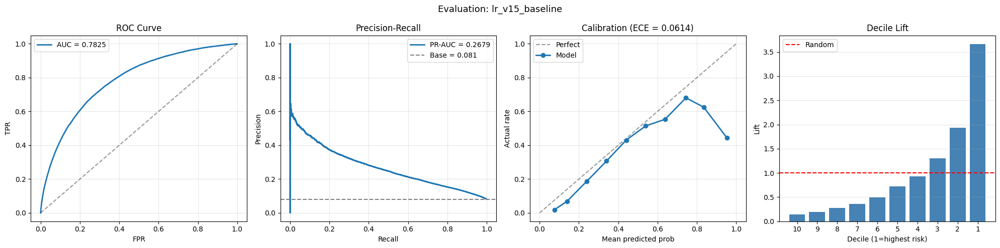


Returned metrics:
  model: lr_v15_baseline
  n_samples: 307507
  pos_rate: 0.080730
  roc_auc: 0.782546
  gini: 0.565092
  ks: 0.424540
  pr_auc: 0.267877
  lift_10pct: 3.658492
  lift_20pct: 2.796191
  log_loss: 0.264386
  brier: 0.070328
  ece: 0.061353

Done. Total time: 54.7 min


In [ ]:
# ========== TRAIN LOGISTIC REGRESSION V15 BASELINE ==========
import numpy as np
import pandas as pd
import gc, time

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression

start_time = time.time()

# ------------------------------------------------------------
# 1. Load V15 đã build sẵn
# ------------------------------------------------------------

print("=" * 70)
print("TRAIN STANDARD LOGREG V15 BASELINE")
print("=" * 70)

train_v15 = pd.read_parquet("train_merged_v15.parquet")
test_v15 = pd.read_parquet("test_merged_v15.parquet")

print(f"Train V15 raw: {train_v15.shape}")
print(f"Test V15 raw:  {test_v15.shape}")

# ------------------------------------------------------------
# 2. Define feature columns
# ------------------------------------------------------------

EXCLUDE_COLS = ["SK_ID_CURR", cfg.TARGET, "index"]
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

all_missing_cols = [c for c in feature_cols if train_v15[c].isna().all()]
if all_missing_cols:
    print(f"Dropping all-missing columns: {len(all_missing_cols)}")
    feature_cols = [c for c in feature_cols if c not in all_missing_cols]

print(f"V15 LogReg features: {len(feature_cols)}")

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols].copy()
X_test = test_v15[feature_cols].copy()

sk_ids_train = train_v15["SK_ID_CURR"].values
sk_ids_test = test_v15["SK_ID_CURR"].values

X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# ------------------------------------------------------------
# 3. Factorize categorical/object columns
# ------------------------------------------------------------

FORCE_CATEGORICAL = [
    "OCCUPATION_TYPE", "ORGANIZATION_TYPE", "NAME_EDUCATION_TYPE",
    "NAME_INCOME_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE",
    "NAME_CONTRACT_TYPE", "CODE_GENDER", "WEEKDAY_APPR_PROCESS_START",
    "HOUR_APPR_PROCESS_START", "BURO_CLU_LABEL", "PREV_CLU_LABEL",
]

categorical_cols = []

for col in feature_cols:
    if (
        col in FORCE_CATEGORICAL
        or X[col].dtype == "object"
        or str(X[col].dtype) == "category"
        or str(X[col].dtype) == "bool"
    ):
        categorical_cols.append(col)

print(f"Categorical/object cols to factorize: {len(categorical_cols)}")
print(categorical_cols)

for col in categorical_cols:
    combined = pd.concat([
        X[col].astype("object").where(X[col].notna(), "__MISSING__").astype(str),
        X_test[col].astype("object").where(X_test[col].notna(), "__MISSING__").astype(str),
    ], axis=0)

    codes, _ = pd.factorize(combined, sort=True)

    X[col] = codes[:len(X)].astype(np.float32)
    X_test[col] = codes[len(X):].astype(np.float32)

# Ensure numeric
for col in feature_cols:
    if not np.issubdtype(X[col].dtype, np.number):
        X[col] = pd.to_numeric(X[col], errors="coerce")
        X_test[col] = pd.to_numeric(X_test[col], errors="coerce")

# Downcast to reduce memory
X = X.astype(np.float32)
X_test = X_test.astype(np.float32)

# ------------------------------------------------------------
# 4. Standard Logistic Regression pipeline
# ------------------------------------------------------------

logreg_pipe = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        penalty="l2",
        C=1.0,
        solver="saga",
        max_iter=800,
        tol=1e-3,
        random_state=42,
        n_jobs=-1,
        verbose=0,
    )),
])

# ------------------------------------------------------------
# 5. 5-fold CV train
# ------------------------------------------------------------

N_FOLDS = 5
FOLD_SEED = 42

oof_lr = np.zeros(len(train_v15), dtype=np.float32)
test_lr = np.zeros(len(test_v15), dtype=np.float32)

fold_aucs = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=FOLD_SEED)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y), start=1):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    logreg_pipe.fit(X_tr, y_tr)

    val_pred = logreg_pipe.predict_proba(X_val)[:, 1]
    test_pred = logreg_pipe.predict_proba(X_test)[:, 1]

    oof_lr[val_idx] = val_pred
    test_lr += test_pred / N_FOLDS

    val_auc = roc_auc_score(y_val, val_pred)
    fold_aucs.append(val_auc)

    n_iter = logreg_pipe.named_steps["model"].n_iter_[0]

    print(
        f"Fold {fold_idx}/{N_FOLDS} | "
        f"val AUC: {val_auc:.5f} | "
        f"n_iter: {n_iter} | "
        f"time: {time.time() - fold_start:.1f}s"
    )

    gc.collect()

auc_lr = roc_auc_score(y, oof_lr)

print("\n" + "=" * 70)
print("STANDARD LOGREG V15 RESULTS")
print("=" * 70)
print(f"Fold AUCs: {[round(a, 5) for a in fold_aucs]}")
print(f"Mean fold AUC: {np.mean(fold_aucs):.5f}")
print(f"Std fold AUC:  {np.std(fold_aucs):.5f}")
print(f"OOF ROC-AUC:   {auc_lr:.5f}")

# ------------------------------------------------------------
# 6. Save OOF + submission
# ------------------------------------------------------------

pd.DataFrame({
    "SK_ID_CURR": sk_ids_train,
    cfg.TARGET: y,
    "oof_lr": oof_lr,
}).to_parquet(cfg.OUTPUT_DIR / "oof_lr_v15_baseline.parquet", index=False)

pd.DataFrame({
    "SK_ID_CURR": sk_ids_test,
    "TARGET": test_lr,
}).to_csv(cfg.OUTPUT_DIR / "submission_lr_v15_baseline.csv", index=False)

print(f"\nSaved OOF -> {cfg.OUTPUT_DIR / 'oof_lr_v15_baseline.parquet'}")
print(f"Saved submission -> {cfg.OUTPUT_DIR / 'submission_lr_v15_baseline.csv'}")

# ------------------------------------------------------------
# 7. Evaluate
# ------------------------------------------------------------

metrics_lr = ev.evaluate_model(
    y_true=y,
    y_pred=oof_lr,
    model_name="lr_v15_baseline",
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

print("\nReturned metrics:")
for k, v in metrics_lr.items():
    if isinstance(v, float):
        print(f"  {k}: {v:.6f}")
    else:
        print(f"  {k}: {v}")

print(f"\nDone. Total time: {(time.time() - start_time) / 60:.1f} min")

### **LGBM single seed**

TRAIN LIGHTGBM V15 SINGLE-SEED BASELINE
Train V15 raw: (307507, 1043)
Test V15 raw:  (48744, 1042)
V15 LightGBM single-seed features: 1041
Categorical features: 12
Categorical cols: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL']
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1405]	valid's auc: 0.794103
Fold 1/5 | val AUC: 0.79410 | best_iter: 1405 | time: 314.9s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1934]	valid's auc: 0.805177
Fold 2/5 | val AUC: 0.80518 | best_iter: 1934 | time: 392.6s
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[1987]	valid's auc: 0.796936
Fold 3/5 | val AUC: 0.79694 | best_iter: 1987 | time: 395.5s


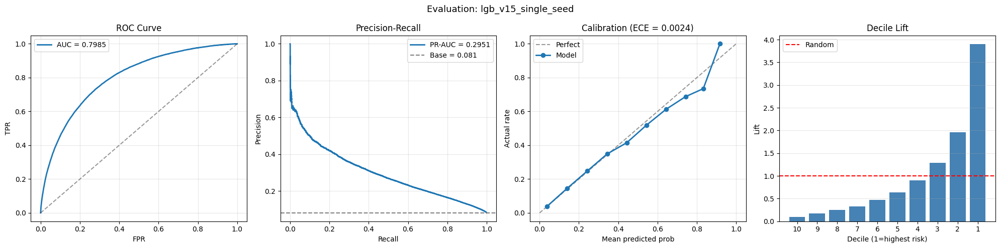


Returned metrics:
  model: lgb_v15_single_seed
  n_samples: 307507
  pos_rate: 0.080730
  roc_auc: 0.798504
  gini: 0.597009
  ks: 0.452538
  pr_auc: 0.295101
  lift_10pct: 3.898981
  lift_20pct: 2.927109
  log_loss: 0.233128
  brier: 0.065093
  ece: 0.002371

Done. Total time: 31.9 min


In [ ]:
# ========== TRAIN LIGHTGBM V15 SINGLE-SEED BASELINE ==========

import numpy as np
import pandas as pd
import lightgbm as lgb
import gc, time

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

start_time = time.time()

# ------------------------------------------------------------
# 1. Load V15
# ------------------------------------------------------------

print("=" * 70)
print("TRAIN LIGHTGBM V15 SINGLE-SEED BASELINE")
print("=" * 70)

train_v15 = pd.read_parquet("train_merged_v15.parquet")
test_v15 = pd.read_parquet("test_merged_v15.parquet")

print(f"Train V15 raw: {train_v15.shape}")
print(f"Test V15 raw:  {test_v15.shape}")

# ------------------------------------------------------------
# 2. Define feature columns
# ------------------------------------------------------------

EXCLUDE_COLS = ["SK_ID_CURR", cfg.TARGET, "index"]
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

all_missing_cols = [c for c in feature_cols if train_v15[c].isna().all()]
if all_missing_cols:
    print(f"Dropping all-missing columns: {len(all_missing_cols)}")
    feature_cols = [c for c in feature_cols if c not in all_missing_cols]

print(f"V15 LightGBM single-seed features: {len(feature_cols)}")

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols].copy()
X_test = test_v15[feature_cols].copy()

sk_ids_train = train_v15["SK_ID_CURR"].values
sk_ids_test = test_v15["SK_ID_CURR"].values

X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# ------------------------------------------------------------
# 3. Factorize object/categorical
# ------------------------------------------------------------

FORCE_CATEGORICAL = [
    "OCCUPATION_TYPE", "ORGANIZATION_TYPE", "NAME_EDUCATION_TYPE",
    "NAME_INCOME_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE",
    "NAME_CONTRACT_TYPE", "CODE_GENDER", "WEEKDAY_APPR_PROCESS_START",
    "HOUR_APPR_PROCESS_START", "BURO_CLU_LABEL", "PREV_CLU_LABEL",
]

categorical_features = []

for col in feature_cols:
    if (
        col in FORCE_CATEGORICAL
        or X[col].dtype == "object"
        or str(X[col].dtype) == "category"
        or str(X[col].dtype) == "bool"
    ):
        categorical_features.append(col)

print(f"Categorical features: {len(categorical_features)}")
print(f"Categorical cols: {categorical_features}")

for col in categorical_features:
    combined = pd.concat([
        X[col].astype("object").where(X[col].notna(), "__MISSING__").astype(str),
        X_test[col].astype("object").where(X_test[col].notna(), "__MISSING__").astype(str),
    ], axis=0)

    codes, _ = pd.factorize(combined, sort=True)

    X[col] = codes[:len(X)].astype(np.int32)
    X_test[col] = codes[len(X):].astype(np.int32)

# Ensure numeric
for col in feature_cols:
    if not np.issubdtype(X[col].dtype, np.number):
        X[col] = pd.to_numeric(X[col], errors="coerce")
        X_test[col] = pd.to_numeric(X_test[col], errors="coerce")

# ------------------------------------------------------------
# 4. LightGBM params
# ------------------------------------------------------------

LGB_PARAMS = {
    "objective": "binary",
    "metric": "auc",
    "boosting_type": "gbdt",
    "learning_rate": 0.02,
    "num_leaves": 24,
    "max_depth": 6,
    "min_child_samples": 100,
    "min_child_weight": 10,
    "reg_alpha": 0.1,
    "reg_lambda": 0.1,
    "colsample_bytree": 0.7,
    "subsample": 0.8,
    "subsample_freq": 1,
    "max_bin": 255,
    "verbosity": -1,
    "n_jobs": -1,
    "random_state": 42,
}

# ------------------------------------------------------------
# 5. 5-fold CV train
# ------------------------------------------------------------

N_FOLDS = 5
FOLD_SEED = 42

oof_lgb_single = np.zeros(len(train_v15), dtype=np.float32)
test_lgb_single = np.zeros(len(test_v15), dtype=np.float32)

fold_aucs = []
fi_list = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=FOLD_SEED)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y), start=1):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    dtrain = lgb.Dataset(
        X_tr,
        label=y_tr,
        categorical_feature=categorical_features,
        free_raw_data=False,
    )

    dval = lgb.Dataset(
        X_val,
        label=y_val,
        categorical_feature=categorical_features,
        free_raw_data=False,
    )

    model = lgb.train(
        LGB_PARAMS,
        dtrain,
        num_boost_round=5000,
        valid_sets=[dval],
        valid_names=["valid"],
        callbacks=[
            lgb.early_stopping(200),
            lgb.log_evaluation(0),
        ],
    )

    val_pred = model.predict(X_val, num_iteration=model.best_iteration)
    test_pred = model.predict(X_test, num_iteration=model.best_iteration)

    oof_lgb_single[val_idx] = val_pred
    test_lgb_single += test_pred / N_FOLDS

    val_auc = roc_auc_score(y_val, val_pred)
    fold_aucs.append(val_auc)

    fi_list.append(pd.DataFrame({
        "feature": feature_cols,
        "importance": model.feature_importance(importance_type="gain"),
        "fold": fold_idx,
    }))

    print(
        f"Fold {fold_idx}/{N_FOLDS} | "
        f"val AUC: {val_auc:.5f} | "
        f"best_iter: {model.best_iteration} | "
        f"time: {time.time() - fold_start:.1f}s"
    )

    del model, dtrain, dval
    gc.collect()

auc_lgb_single = roc_auc_score(y, oof_lgb_single)

print("\n" + "=" * 70)
print("LIGHTGBM V15 SINGLE-SEED RESULTS")
print("=" * 70)
print(f"Fold AUCs: {[round(a, 5) for a in fold_aucs]}")
print(f"Mean fold AUC: {np.mean(fold_aucs):.5f}")
print(f"Std fold AUC:  {np.std(fold_aucs):.5f}")
print(f"OOF ROC-AUC:   {auc_lgb_single:.5f}")

# ------------------------------------------------------------
# 6. Save OOF + submission + feature importance
# ------------------------------------------------------------

pd.DataFrame({
    "SK_ID_CURR": sk_ids_train,
    cfg.TARGET: y,
    "oof_lgb": oof_lgb_single,
}).to_parquet(cfg.OUTPUT_DIR / "oof_lgb_v15_single_seed.parquet", index=False)

pd.DataFrame({
    "SK_ID_CURR": sk_ids_test,
    "TARGET": test_lgb_single,
}).to_csv(cfg.OUTPUT_DIR / "submission_lgb_v15_single_seed.csv", index=False)

if fi_list:
    fi_lgb_single = (
        pd.concat(fi_list)
        .groupby("feature", as_index=False)["importance"]
        .mean()
        .sort_values("importance", ascending=False)
    )
    fi_lgb_single.to_csv(cfg.OUTPUT_DIR / "feature_importance_lgb_v15_single_seed.csv", index=False)

print(f"\nSaved OOF -> {cfg.OUTPUT_DIR / 'oof_lgb_v15_single_seed.parquet'}")
print(f"Saved submission -> {cfg.OUTPUT_DIR / 'submission_lgb_v15_single_seed.csv'}")
print(f"Saved FI -> {cfg.OUTPUT_DIR / 'feature_importance_lgb_v15_single_seed.csv'}")

# ------------------------------------------------------------
# 7. Evaluate
# ------------------------------------------------------------

metrics_lgb_single = ev.evaluate_model(
    y_true=y,
    y_pred=oof_lgb_single,
    model_name="lgb_v15_single_seed",
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

print("\nReturned metrics:")
for k, v in metrics_lgb_single.items():
    if isinstance(v, float):
        print(f"  {k}: {v:.6f}")
    else:
        print(f"  {k}: {v}")

print(f"\nDone. Total time: {(time.time() - start_time) / 60:.1f} min")

### **CATBOOST V15**

TRAIN CATBOOST V15 BASELINE
Train V15 raw: (307507, 1043)
Test V15 raw:  (48744, 1042)
V15 CatBoost features: 1041
Categorical features: 12
Categorical cols: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL']
Numeric features: 1029
Fold 1/5 | val AUC: 0.79447 | best_iter: 4916 | time: 2056.4s
Fold 2/5 | val AUC: 0.80535 | best_iter: 4670 | time: 1924.6s
Fold 3/5 | val AUC: 0.79458 | best_iter: 4351 | time: 1793.2s
Fold 4/5 | val AUC: 0.80158 | best_iter: 4506 | time: 1856.0s
Fold 5/5 | val AUC: 0.79493 | best_iter: 3702 | time: 1538.3s

CATBOOST V15 RESULTS
Fold AUCs: [np.float64(0.79447), np.float64(0.80535), np.float64(0.79458), np.float64(0.80158), np.float64(0.79493)]
Mean fold AUC: 0.79818
Std fold AUC:  0.00448
OOF ROC-AUC:   0.79817

Saved OOF -> output/oof_cb_v15.parquet
Save

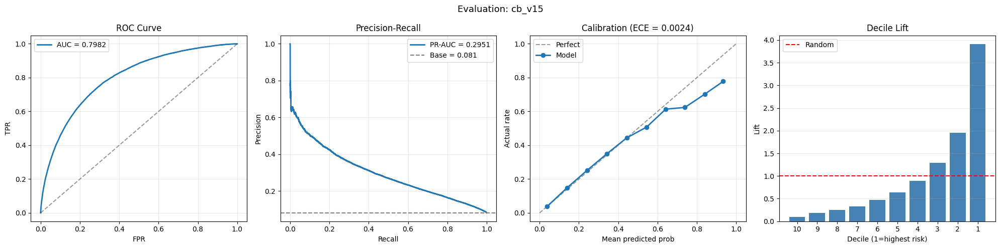


Returned metrics:
  model: cb_v15
  n_samples: 307507
  pos_rate: 0.080730
  roc_auc: 0.798170
  gini: 0.596340
  ks: 0.452687
  pr_auc: 0.295139
  lift_10pct: 3.907440
  lift_20pct: 2.931540
  log_loss: 0.233268
  brier: 0.065092
  ece: 0.002412

Done. Total time: 153.3 min


In [ ]:
# ========== TRAIN CATBOOST V15 BASELINE ==========

import numpy as np
import pandas as pd
import gc, time

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from catboost import CatBoostClassifier, Pool

start_time = time.time()

# ------------------------------------------------------------
# 1. Load V15
# ------------------------------------------------------------

print("=" * 70)
print("TRAIN CATBOOST V15 BASELINE")
print("=" * 70)

train_v15 = pd.read_parquet("train_merged_v15.parquet")
test_v15 = pd.read_parquet("test_merged_v15.parquet")

print(f"Train V15 raw: {train_v15.shape}")
print(f"Test V15 raw:  {test_v15.shape}")

# ------------------------------------------------------------
# 2. Define feature columns
# ------------------------------------------------------------

EXCLUDE_COLS = ["SK_ID_CURR", cfg.TARGET, "index"]
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

# Drop all-missing columns nếu có
all_missing_cols = [c for c in feature_cols if train_v15[c].isna().all()]
if all_missing_cols:
    print(f"Dropping all-missing columns: {len(all_missing_cols)}")
    feature_cols = [c for c in feature_cols if c not in all_missing_cols]

print(f"V15 CatBoost features: {len(feature_cols)}")

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols].copy()
X_test = test_v15[feature_cols].copy()

sk_ids_train = train_v15["SK_ID_CURR"].values
sk_ids_test = test_v15["SK_ID_CURR"].values

# Replace inf
X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# ------------------------------------------------------------
# 3. Identify categorical columns
# ------------------------------------------------------------

FORCE_CATEGORICAL = [
    "OCCUPATION_TYPE", "ORGANIZATION_TYPE", "NAME_EDUCATION_TYPE",
    "NAME_INCOME_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE",
    "NAME_CONTRACT_TYPE", "CODE_GENDER", "WEEKDAY_APPR_PROCESS_START",
    "HOUR_APPR_PROCESS_START", "BURO_CLU_LABEL", "PREV_CLU_LABEL",
]

categorical_cols = []

for col in feature_cols:
    if (
        col in FORCE_CATEGORICAL
        or X[col].dtype == "object"
        or str(X[col].dtype) == "category"
        or str(X[col].dtype) == "bool"
    ):
        categorical_cols.append(col)

print(f"Categorical features: {len(categorical_cols)}")
print(f"Categorical cols: {categorical_cols}")

# CatBoost
for col in categorical_cols:
    X[col] = X[col].astype("object").where(X[col].notna(), "__MISSING__").astype(str)
    X_test[col] = X_test[col].astype("object").where(X_test[col].notna(), "__MISSING__").astype(str)

# Numeric columns giữ NaN để CatBoost xử lý native
numeric_cols = [c for c in feature_cols if c not in categorical_cols]
print(f"Numeric features: {len(numeric_cols)}")

# ------------------------------------------------------------
# 4. CatBoost params
# ------------------------------------------------------------

CB_PARAMS = {
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "iterations": 5000,
    "learning_rate": 0.025,
    "depth": 6,
    "l2_leaf_reg": 5.0,
    "random_strength": 1.0,
    "bagging_temperature": 0.5,
    "border_count": 128,
    "random_seed": 42,
    "task_type": "CPU",
    "thread_count": -1,
    "verbose": False,
    "allow_writing_files": False,
}

# ------------------------------------------------------------
# 5. 5-fold CV train
# ------------------------------------------------------------

N_FOLDS = 5
FOLD_SEED = 42

oof_cb = np.zeros(len(train_v15), dtype=np.float32)
test_cb = np.zeros(len(test_v15), dtype=np.float32)

fold_aucs = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=FOLD_SEED)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y), start=1):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    train_pool = Pool(
        X_tr,
        label=y_tr,
        cat_features=categorical_cols
    )

    val_pool = Pool(
        X_val,
        label=y_val,
        cat_features=categorical_cols
    )

    test_pool = Pool(
        X_test,
        cat_features=categorical_cols
    )

    model = CatBoostClassifier(**CB_PARAMS)

    model.fit(
        train_pool,
        eval_set=val_pool,
        early_stopping_rounds=200,
        use_best_model=True,
        verbose=False,
    )

    val_pred = model.predict_proba(val_pool)[:, 1]
    test_pred = model.predict_proba(test_pool)[:, 1]

    oof_cb[val_idx] = val_pred
    test_cb += test_pred / N_FOLDS

    val_auc = roc_auc_score(y_val, val_pred)
    fold_aucs.append(val_auc)

    print(
        f"Fold {fold_idx}/{N_FOLDS} | "
        f"val AUC: {val_auc:.5f} | "
        f"best_iter: {model.get_best_iteration()} | "
        f"time: {time.time() - fold_start:.1f}s"
    )

    del model, train_pool, val_pool, test_pool
    gc.collect()

auc_cb = roc_auc_score(y, oof_cb)

print("\n" + "=" * 70)
print("CATBOOST V15 RESULTS")
print("=" * 70)
print(f"Fold AUCs: {[round(a, 5) for a in fold_aucs]}")
print(f"Mean fold AUC: {np.mean(fold_aucs):.5f}")
print(f"Std fold AUC:  {np.std(fold_aucs):.5f}")
print(f"OOF ROC-AUC:   {auc_cb:.5f}")

# ------------------------------------------------------------
# 6. Save OOF + submission
# ------------------------------------------------------------

pd.DataFrame({
    "SK_ID_CURR": sk_ids_train,
    cfg.TARGET: y,
    "oof_cb": oof_cb,
}).to_parquet(cfg.OUTPUT_DIR / "oof_cb_v15.parquet", index=False)

pd.DataFrame({
    "SK_ID_CURR": sk_ids_test,
    "TARGET": test_cb,
}).to_csv(cfg.OUTPUT_DIR / "submission_cb_v15.csv", index=False)

print(f"\nSaved OOF -> {cfg.OUTPUT_DIR / 'oof_cb_v15.parquet'}")
print(f"Saved submission -> {cfg.OUTPUT_DIR / 'submission_cb_v15.csv'}")

# ------------------------------------------------------------
# 7. Evaluate
# ------------------------------------------------------------

metrics_cb = ev.evaluate_model(
    y_true=y,
    y_pred=oof_cb,
    model_name="cb_v15",
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

print("\nReturned metrics:")
for k, v in metrics_cb.items():
    if isinstance(v, float):
        print(f"  {k}: {v:.6f}")
    else:
        print(f"  {k}: {v}")

print(f"\nDone. Total time: {(time.time() - start_time) / 60:.1f} min")

### **XGBoost**

TRAIN XGBOOST V15 BASELINE
Train V15 raw: (307507, 1043)
Test V15 raw:  (48744, 1042)
V15 XGBoost features: 1041
Categorical/object cols to factorize: 12
['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL']
Fold 1/5 | val AUC: 0.79519 | best_iter: 2198 | time: 3358.8s
Fold 2/5 | val AUC: 0.80592 | best_iter: 2179 | time: 3276.1s
Fold 3/5 | val AUC: 0.79681 | best_iter: 1873 | time: 2847.5s
Fold 4/5 | val AUC: 0.80100 | best_iter: 2299 | time: 2946.6s
Fold 5/5 | val AUC: 0.79604 | best_iter: 2788 | time: 2905.6s

XGBOOST V15 RESULTS
Fold AUCs: [np.float64(0.79519), np.float64(0.80592), np.float64(0.79681), np.float64(0.801), np.float64(0.79604)]
Mean fold AUC: 0.79899
Std fold AUC:  0.00400
OOF ROC-AUC:   0.79896

Saved OOF -> output/oof_xgb_v15.parquet
Saved submission -> output/submis

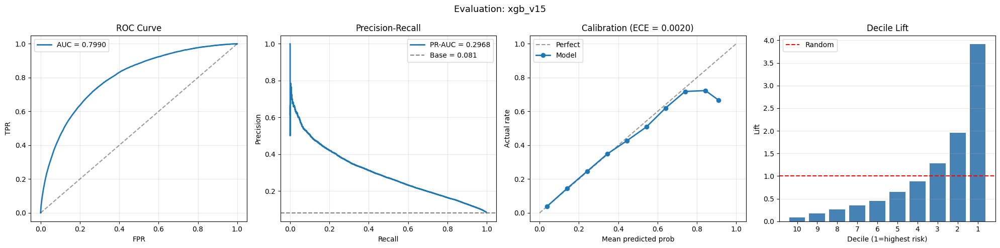


Returned metrics:
  model: xgb_v15
  n_samples: 307507
  pos_rate: 0.080730
  roc_auc: 0.798955
  gini: 0.597910
  ks: 0.452732
  pr_auc: 0.296833
  lift_10pct: 3.912274
  lift_20pct: 2.936374
  log_loss: 0.232857
  brier: 0.065011
  ece: 0.002042

Done. Total time: 256.0 min


In [ ]:
# ========== XGBOOST V15 BASELINE ==========

import numpy as np
import pandas as pd
import gc, time

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import xgboost as xgb

start_time = time.time()

# ------------------------------------------------------------
# 1. Load V15
# ------------------------------------------------------------

print("=" * 70)
print("TRAIN XGBOOST V15 BASELINE")
print("=" * 70)

train_v15 = pd.read_parquet("train_merged_v15.parquet")
test_v15 = pd.read_parquet("test_merged_v15.parquet")

print(f"Train V15 raw: {train_v15.shape}")
print(f"Test V15 raw:  {test_v15.shape}")

# ------------------------------------------------------------
# 3. Define feature columns
# ------------------------------------------------------------

EXCLUDE_COLS = ["SK_ID_CURR", cfg.TARGET, "index"]
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

all_missing_cols = [c for c in feature_cols if train_v15[c].isna().all()]
if all_missing_cols:
    print(f"Dropping all-missing columns: {len(all_missing_cols)}")
    feature_cols = [c for c in feature_cols if c not in all_missing_cols]

print(f"V15 XGBoost features: {len(feature_cols)}")

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols].copy()
X_test = test_v15[feature_cols].copy()

sk_ids_train = train_v15["SK_ID_CURR"].values
sk_ids_test = test_v15["SK_ID_CURR"].values

# Replace inf
X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# 4. Encode categorical/object columns

FORCE_CATEGORICAL = [
    "OCCUPATION_TYPE", "ORGANIZATION_TYPE", "NAME_EDUCATION_TYPE",
    "NAME_INCOME_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE",
    "NAME_CONTRACT_TYPE", "CODE_GENDER", "WEEKDAY_APPR_PROCESS_START",
    "HOUR_APPR_PROCESS_START", "BURO_CLU_LABEL", "PREV_CLU_LABEL",
]

categorical_cols = []

for col in feature_cols:
    if (
        col in FORCE_CATEGORICAL
        or X[col].dtype == "object"
        or str(X[col].dtype) == "category"
        or str(X[col].dtype) == "bool"
    ):
        categorical_cols.append(col)

print(f"Categorical/object cols to factorize: {len(categorical_cols)}")
print(categorical_cols)

for col in categorical_cols:
    combined = pd.concat([
        X[col].astype("object").where(X[col].notna(), "__MISSING__").astype(str),
        X_test[col].astype("object").where(X_test[col].notna(), "__MISSING__").astype(str)
    ], axis=0)

    codes, _ = pd.factorize(combined, sort=True)

    X[col] = codes[:len(X)].astype(np.int32)
    X_test[col] = codes[len(X):].astype(np.int32)

# Ensure all columns are numeric
for col in feature_cols:
    if not np.issubdtype(X[col].dtype, np.number):
        X[col] = pd.to_numeric(X[col], errors="coerce")
        X_test[col] = pd.to_numeric(X_test[col], errors="coerce")

# 5. XGBoost params

XGB_PARAMS = {
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "tree_method": "hist",
    "learning_rate": 0.02,
    "max_depth": 5,
    "min_child_weight": 20,
    "subsample": 0.8,
    "colsample_bytree": 0.7,
    "reg_alpha": 0.1,
    "reg_lambda": 1.0,
    "n_estimators": 3000,
    "random_state": 42,
    "n_jobs": -1,
    "verbosity": 0,
}

# 6. 5-fold CV train

N_FOLDS = 5
FOLD_SEED = 42

oof_xgb = np.zeros(len(train_v15), dtype=np.float32)
test_xgb = np.zeros(len(test_v15), dtype=np.float32)

fold_aucs = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=FOLD_SEED)

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y), start=1):
    fold_start = time.time()

    X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
    y_tr, y_val = y[tr_idx], y[val_idx]

    model = xgb.XGBClassifier(
        **XGB_PARAMS,
        early_stopping_rounds=150,
    )

    model.fit(
        X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        verbose=False,
    )

    val_pred = model.predict_proba(X_val)[:, 1]
    test_pred = model.predict_proba(X_test)[:, 1]

    oof_xgb[val_idx] = val_pred
    test_xgb += test_pred / N_FOLDS

    val_auc = roc_auc_score(y_val, val_pred)
    fold_aucs.append(val_auc)

    best_iter = getattr(model, "best_iteration", None)

    print(
        f"Fold {fold_idx}/{N_FOLDS} | "
        f"val AUC: {val_auc:.5f} | "
        f"best_iter: {best_iter} | "
        f"time: {time.time() - fold_start:.1f}s"
    )

    del model
    gc.collect()

auc_xgb = roc_auc_score(y, oof_xgb)

print("\n" + "=" * 70)
print("XGBOOST V15 RESULTS")
print("=" * 70)
print(f"Fold AUCs: {[round(a, 5) for a in fold_aucs]}")
print(f"Mean fold AUC: {np.mean(fold_aucs):.5f}")
print(f"Std fold AUC:  {np.std(fold_aucs):.5f}")
print(f"OOF ROC-AUC:   {auc_xgb:.5f}")

# ------------------------------------------------------------
# 7. Save OOF + submission
# ------------------------------------------------------------

pd.DataFrame({
    "SK_ID_CURR": sk_ids_train,
    cfg.TARGET: y,
    "oof_xgb": oof_xgb,
}).to_parquet(cfg.OUTPUT_DIR / "oof_xgb_v15.parquet", index=False)

pd.DataFrame({
    "SK_ID_CURR": sk_ids_test,
    "TARGET": test_xgb,
}).to_csv(cfg.OUTPUT_DIR / "submission_xgb_v15.csv", index=False)

print(f"\nSaved OOF -> {cfg.OUTPUT_DIR / 'oof_xgb_v15.parquet'}")
print(f"Saved submission -> {cfg.OUTPUT_DIR / 'submission_xgb_v15.csv'}")

# ------------------------------------------------------------
# 8. Evaluate bằng module ev đã có
# ------------------------------------------------------------

metrics_xgb = ev.evaluate_model(
    y_true=y,
    y_pred=oof_xgb,
    model_name="xgb_v15",
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

print("\nReturned metrics:")
for k, v in metrics_xgb.items():
    if isinstance(v, float):
        print(f"  {k}: {v:.6f}")
    else:
        print(f"  {k}: {v}")

print(f"\nDone. Total time: {(time.time() - start_time) / 60:.1f} min")

### **CatBoost multiseed**

In [ ]:
import numpy as np
import pandas as pd
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc

start_time = time.time()

# Load V15
print('Loading V15...')
train_v15 = pd.read_parquet('train_merged_v15.parquet')
test_v15 = pd.read_parquet('test_merged_v15.parquet')

print(f'V15: train={train_v15.shape}, test={test_v15.shape}')

# === Train CatBoost V15 multi-seed ===
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

# CatBoost can handle categorical features natively.
FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]

cat_cols = []
for col in feature_cols:
    if train_v15[col].dtype == 'object' or col in FORCE_CATEGORICAL:
        cat_cols.append(col)

print(f'\nV15 total features: {len(feature_cols)}')
print(f'Categorical features: {len(cat_cols)}')
print(f'Categorical cols: {cat_cols}')

# CatBoost requires categorical columns to be string/int and missing categorical values handled.
for col in cat_cols:
    train_v15[col] = train_v15[col].astype('object').where(train_v15[col].notna(), '__MISSING__').astype(str)
    test_v15[col] = test_v15[col].astype('object').where(test_v15[col].notna(), '__MISSING__').astype(str)

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols]
X_test = test_v15[feature_cols]

# Replace inf values with NaN
X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# CatBoost categorical feature indices
cat_features = [feature_cols.index(c) for c in cat_cols]

print(f'Numeric features: {len(feature_cols) - len(cat_features)}')
print(f'Cat feature indices: {cat_features}')

CAT_PARAMS = {
    'loss_function': 'Logloss',
    'eval_metric': 'AUC',
    'learning_rate': 0.025,
    'depth': 6,
    'l2_leaf_reg': 8,
    'random_strength': 1.0,
    'bagging_temperature': 0.5,
    'border_count': 128,
    'iterations': 5000,
    'od_type': 'Iter',
    'od_wait': 200,
    'task_type': 'GPU',
    'devices': '0',
    'verbose': False,
    'allow_writing_files': False,
}

N_FOLDS = 5
SEEDS = [42, 7, 99]

v15_oofs = {}
v15_tests = {}
fi_list = []

for seed in SEEDS:
    print(f'\n{"="*70}')
    print(f'TRAINING CATBOOST V15 — seed={seed}')
    print(f'{"="*70}')

    params = dict(CAT_PARAMS)
    params['random_seed'] = seed

    oof_seed = np.zeros(len(train_v15))
    test_seed = np.zeros(len(test_v15))
    fold_aucs = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
        fold_start = time.time()

        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        train_pool = Pool(
            X_tr,
            label=y_tr,
            cat_features=cat_features,
            feature_names=feature_cols,
        )
        val_pool = Pool(
            X_val,
            label=y_val,
            cat_features=cat_features,
            feature_names=feature_cols,
        )
        test_pool = Pool(
            X_test,
            cat_features=cat_features,
            feature_names=feature_cols,
        )

        model = CatBoostClassifier(**params)
        model.fit(
            train_pool,
            eval_set=val_pool,
            use_best_model=True,
        )

        best_iter = model.get_best_iteration()
        val_preds = model.predict_proba(val_pool)[:, 1]
        test_fold_preds = model.predict_proba(test_pool)[:, 1]

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y_val, val_preds)
        fold_aucs.append(val_auc)

        if seed == 42:
            fi = model.get_feature_importance(train_pool, type='PredictionValuesChange')
            fi_list.append(pd.DataFrame({
                'feature': feature_cols,
                'importance': fi,
            }))

        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {best_iter} | time: {time.time()-fold_start:.1f}s')

        del model, train_pool, val_pool, test_pool, X_tr, X_val, y_tr, y_val
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF: {seed_auc:.5f}')

    v15_oofs[seed] = oof_seed
    v15_tests[seed] = test_seed

# Multi-seed average
oof_v15_ms = np.mean(list(v15_oofs.values()), axis=0)
test_v15_ms = np.mean(list(v15_tests.values()), axis=0)
auc_v15_ms = roc_auc_score(y, oof_v15_ms)

print(f'\n{"="*70}')
print(f'CATBOOST V15 MULTI-SEED RESULTS:')
print(f'{"="*70}')
for seed, oof in v15_oofs.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed avg:  {auc_v15_ms:.5f}')
print(f'  Comparison:')
print(f'    CatBoost single-seed: 0.79817')
print(f'    CatBoost multi-seed:  {auc_v15_ms:.5f}')
print(f'    Gain:                 {auc_v15_ms - 0.79817:+.5f}')

# Top features
if fi_list:
    fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
    fi_avg = fi_avg.sort_values('importance', ascending=False).reset_index(drop=True)

    print(f'\nTop 20 CatBoost V15 features:')
    print(fi_avg.head(20).to_string(index=False))

# Save
sk_ids_train = train_v15['SK_ID_CURR'].values
sk_ids_test = test_v15['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_cb': oof_v15_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_cb_v15_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_v15_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_cb_v15_multiseed.csv', index=False)

if fi_list:
    fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_cb_v15_multiseed.csv', index=False)

print(f'\nCatBoost V15 multi-seed done. Time: {(time.time()-start_time)/60:.1f} min')

del train_v15, test_v15, X, X_test
gc.collect()

Loading V15...
V15: train=(307507, 1043), test=(48744, 1042)

V15 total features: 1041
Categorical features: 12
Categorical cols: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL']
Numeric features: 1029
Cat feature indices: [0, 1, 10, 11, 12, 13, 26, 30, 31, 38, 471, 477]

TRAINING CATBOOST V15 — seed=42


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 1/5 | val AUC: 0.79337 | best_iter: 4998 | time: 168.6s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 2/5 | val AUC: 0.80504 | best_iter: 4413 | time: 154.1s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 3/5 | val AUC: 0.79504 | best_iter: 4986 | time: 167.5s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 4/5 | val AUC: 0.80100 | best_iter: 4608 | time: 159.0s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 5/5 | val AUC: 0.79425 | best_iter: 4995 | time: 166.8s
  Seed 42 OOF: 0.79770

TRAINING CATBOOST V15 — seed=7


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 1/5 | val AUC: 0.79425 | best_iter: 4996 | time: 152.2s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 2/5 | val AUC: 0.79562 | best_iter: 4665 | time: 149.1s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 3/5 | val AUC: 0.79988 | best_iter: 4682 | time: 146.7s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 4/5 | val AUC: 0.79591 | best_iter: 4995 | time: 151.0s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 5/5 | val AUC: 0.80010 | best_iter: 4942 | time: 151.3s
  Seed 7 OOF: 0.79713

TRAINING CATBOOST V15 — seed=99


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 1/5 | val AUC: 0.79576 | best_iter: 4334 | time: 137.9s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 2/5 | val AUC: 0.79650 | best_iter: 3883 | time: 127.2s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 3/5 | val AUC: 0.79582 | best_iter: 4375 | time: 138.4s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 4/5 | val AUC: 0.79719 | best_iter: 4952 | time: 151.1s


Default metric period is 5 because AUC is/are not implemented for GPU


  Fold 5/5 | val AUC: 0.80092 | best_iter: 4999 | time: 150.9s
  Seed 99 OOF: 0.79723

CATBOOST V15 MULTI-SEED RESULTS:
  Seed 42: 0.79770
  Seed 7: 0.79713
  Seed 99: 0.79723
  Multi-seed avg:  0.79844
  Comparison:
    CatBoost single-seed: 0.79817
    CatBoost multi-seed:  0.79844
    Gain:                 +0.00027

Top 20 CatBoost V15 features:
                feature  importance
      TARGET_NN500_MEAN    5.171274
 PREDICTED_EXT_SOURCE_1    2.911495
        PREV_SCORE_MEAN    2.819392
         BUR_SCORE_MEAN    2.811339
  EXT3_PREDICTED_x_EXT2    2.417474
               EXT_MEAN    2.399427
             EXT_MEDIAN    1.962245
  EXT1_PREDICTED_x_EXT2    1.318400
             DAYS_BIRTH    1.284418
         PREV_SCORE_MIN    1.264337
 PREDICTED_EXT_SOURCE_3    1.057849
            AMT_ANNUITY    1.015457
          BUR_SCORE_MAX    0.961004
       NN500_x_EXT_MEAN    0.919150
             AMT_CREDIT    0.859882
        AMT_GOODS_PRICE    0.857760
    NN500_x_CREDIT_TERM    0.856766
 

0

### **XGBoost multiseed**

In [ ]:
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc

start_time = time.time()

# Load V15
print('Loading V15...')
train_v15 = pd.read_parquet('train_merged_v15.parquet')
test_v15 = pd.read_parquet('test_merged_v15.parquet')

print(f'V15: train={train_v15.shape}, test={test_v15.shape}')

# === Train XGBoost V15 multi-seed ===
EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

# Factorize categorical/object columns (XGBoost needs numeric input)
FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]

for col in feature_cols:
    if train_v15[col].dtype == 'object' or col in FORCE_CATEGORICAL:
        combined = pd.concat([train_v15[col].astype(str), test_v15[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train_v15[col] = codes[:len(train_v15)].astype(np.int32)
        test_v15[col] = codes[len(train_v15):].astype(np.int32)

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols]
X_test = test_v15[feature_cols]

# Replace inf values with NaN for XGBoost (missing this step was causing the error)
X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

print(f'\nV15 total features: {len(feature_cols)}')

XGB_PARAMS = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'tree_method': 'hist',
    'device': 'cuda',
    'learning_rate': 0.02,
    'max_depth': 6,
    'min_child_weight': 30,
    'subsample': 0.8,
    'colsample_bytree': 0.7,
    'reg_alpha': 0.1,
    'reg_lambda': 0.1,
    'gamma': 0.1,
    'n_jobs': -1,
    'verbosity': 1,
}

N_FOLDS = 5
SEEDS = [42, 7, 99]

v15_oofs = {}
v15_tests = {}
fi_list = []

for seed in SEEDS:
    print(f'\n{"="*70}')
    print(f'TRAINING XGBOOST V15 — seed={seed}')
    print(f'{"="*70}')

    params = dict(XGB_PARAMS)
    params['random_state'] = seed
    params['seed'] = seed

    oof_seed = np.zeros(len(train_v15))
    test_seed = np.zeros(len(test_v15))
    fold_aucs = []

    skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)

    for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y)):
        fold_start = time.time()
        X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
        y_tr, y_val = y[tr_idx], y[val_idx]

        dtrain = xgb.DMatrix(X_tr, label=y_tr)
        dval = xgb.DMatrix(X_val, label=y_val)
        dtest = xgb.DMatrix(X_test)

        model = xgb.train(
            params, dtrain, num_boost_round=5000,
            evals=[(dval, 'valid')],
            early_stopping_rounds=200,
            verbose_eval=0,
        )

        best_iter = model.best_iteration
        val_preds = model.predict(dval, iteration_range=(0, best_iter + 1))
        test_fold_preds = model.predict(dtest, iteration_range=(0, best_iter + 1))

        oof_seed[val_idx] = val_preds
        test_seed += test_fold_preds / N_FOLDS

        val_auc = roc_auc_score(y_val, val_preds)
        fold_aucs.append(val_auc)

        if seed == 42:
            fi_dict = model.get_score(importance_type='gain')
            fi_list.append(pd.DataFrame({
                'feature': feature_cols,
                'importance': pd.Series(fi_dict).reindex(feature_cols).fillna(0).values,
            }))

        print(f'  Fold {fold_idx+1}/5 | val AUC: {val_auc:.5f} | best_iter: {best_iter} | time: {time.time()-fold_start:.1f}s')
        del model, dtrain, dval, dtest
        gc.collect()

    seed_auc = roc_auc_score(y, oof_seed)
    print(f'  Seed {seed} OOF: {seed_auc:.5f}')

    v15_oofs[seed] = oof_seed
    v15_tests[seed] = test_seed

# Multi-seed average
oof_v15_ms = np.mean(list(v15_oofs.values()), axis=0)
test_v15_ms = np.mean(list(v15_tests.values()), axis=0)
auc_v15_ms = roc_auc_score(y, oof_v15_ms)

print(f'\n{"="*70}')
print(f'XGBOOST V15 MULTI-SEED RESULTS:')
print(f'{"="*70}')
for seed, oof in v15_oofs.items():
    print(f'  Seed {seed}: {roc_auc_score(y, oof):.5f}')
print(f'  Multi-seed avg:  {auc_v15_ms:.5f}')
print(f'  Comparison:')
print(f'    XGBoost single-seed: 0.79896')
print(f'    XGBoost multi-seed:  {auc_v15_ms:.5f}')
print(f'    Gain:                {auc_v15_ms - 0.79896:+.5f}')

# Top features
if fi_list:
    fi_avg = pd.concat(fi_list).groupby('feature')['importance'].mean().reset_index()
    fi_avg = fi_avg.sort_values('importance', ascending=False).reset_index(drop=True)

    print(f'\nTop 20 XGBoost V15 features:')
    print(fi_avg.head(20).to_string(index=False))

# Save
sk_ids_train = train_v15['SK_ID_CURR'].values
sk_ids_test = test_v15['SK_ID_CURR'].values

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train, cfg.TARGET: y, 'oof_xgb': oof_v15_ms,
}).to_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v15_multiseed.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test, 'TARGET': test_v15_ms,
}).to_csv(cfg.OUTPUT_DIR / 'submission_xgb_v15_multiseed.csv', index=False)

if fi_list:
    fi_avg.to_csv(cfg.OUTPUT_DIR / 'feature_importance_xgb_v15_multiseed.csv', index=False)

print(f'\nXGBoost V15 multi-seed done. Time: {(time.time()-start_time)/60:.1f} min')

del train_v15, test_v15, X, X_test
gc.collect()

Loading V15...
V15: train=(307507, 1043), test=(48744, 1042)

V15 total features: 1041

TRAINING XGBOOST V15 — seed=42
  Fold 1/5 | val AUC: 0.79516 | best_iter: 1354 | time: 46.2s
  Fold 2/5 | val AUC: 0.80550 | best_iter: 1171 | time: 41.5s
  Fold 3/5 | val AUC: 0.79742 | best_iter: 1565 | time: 51.6s
  Fold 4/5 | val AUC: 0.80071 | best_iter: 1489 | time: 48.5s
  Fold 5/5 | val AUC: 0.79591 | best_iter: 1958 | time: 57.2s
  Seed 42 OOF: 0.79887

TRAINING XGBOOST V15 — seed=7
  Fold 1/5 | val AUC: 0.79568 | best_iter: 1801 | time: 55.7s
  Fold 2/5 | val AUC: 0.79750 | best_iter: 1529 | time: 50.9s
  Fold 3/5 | val AUC: 0.80048 | best_iter: 1655 | time: 52.2s
  Fold 4/5 | val AUC: 0.79749 | best_iter: 1518 | time: 46.2s
  Fold 5/5 | val AUC: 0.80129 | best_iter: 1742 | time: 51.6s
  Seed 7 OOF: 0.79847

TRAINING XGBOOST V15 — seed=99
  Fold 1/5 | val AUC: 0.79630 | best_iter: 1563 | time: 46.8s
  Fold 2/5 | val AUC: 0.79752 | best_iter: 1401 | time: 43.7s
  Fold 3/5 | val AUC: 0.79680

0

### **MLP V15**

TRAIN MLP V15 BASELINE
Train V15 raw: (307507, 1043)
Test V15 raw:  (48744, 1042)
V15 MLP features: 1041
Categorical/object cols to factorize: 12
['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL']
Device: cpu
Fold 1/5 | Epoch 01 | loss=0.27647 | val_auc=0.77378 | best=0.77378
Fold 1/5 | Epoch 02 | loss=0.23874 | val_auc=0.77810 | best=0.77810
Fold 1/5 | Epoch 03 | loss=0.23496 | val_auc=0.77725 | best=0.77810
Fold 1/5 | Epoch 04 | loss=0.23206 | val_auc=0.77803 | best=0.77810
Fold 1/5 | Epoch 05 | loss=0.23144 | val_auc=0.77429 | best=0.77810
Fold 1/5 | Epoch 06 | loss=0.22745 | val_auc=0.77382 | best=0.77810
Fold 1/5 | Epoch 07 | loss=0.22424 | val_auc=0.77490 | best=0.77810
Early stopping at epoch 7
Fold 1/5 done | best val AUC: 0.77810 | time: 241.3s
Fold 2/5 | Epoch 01 | loss=0.2

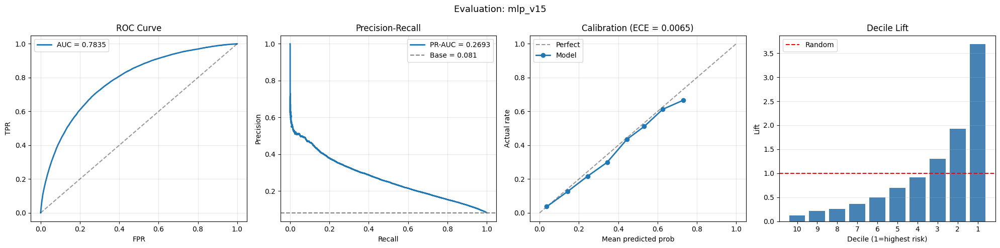


Returned metrics:
  model: mlp_v15
  n_samples: 307507
  pos_rate: 0.080730
  roc_auc: 0.783513
  gini: 0.567026
  ks: 0.427961
  pr_auc: 0.269285
  lift_10pct: 3.686690
  lift_20pct: 2.809283
  log_loss: 0.239356
  brier: 0.066448
  ece: 0.006458

Done. Total time: 22.1 min


In [ ]:
# ========== TRAIN MLP V15 BASELINE ==========

import numpy as np
import pandas as pd
import gc, time
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

start_time = time.time()

# ------------------------------------------------------------
# 1. Load V15
# ------------------------------------------------------------

print("=" * 70)
print("TRAIN MLP V15 BASELINE")
print("=" * 70)

train_v15 = pd.read_parquet("train_merged_v15.parquet")
test_v15 = pd.read_parquet("test_merged_v15.parquet")

print(f"Train V15 raw: {train_v15.shape}")
print(f"Test V15 raw:  {test_v15.shape}")

# ------------------------------------------------------------
# 2. Define feature columns
# ------------------------------------------------------------

EXCLUDE_COLS = ["SK_ID_CURR", cfg.TARGET, "index"]
feature_cols = [c for c in train_v15.columns if c not in EXCLUDE_COLS]

all_missing_cols = [c for c in feature_cols if train_v15[c].isna().all()]
if all_missing_cols:
    print(f"Dropping all-missing columns: {len(all_missing_cols)}")
    feature_cols = [c for c in feature_cols if c not in all_missing_cols]

print(f"V15 MLP features: {len(feature_cols)}")

y = train_v15[cfg.TARGET].astype(int).values
X = train_v15[feature_cols].copy()
X_test = test_v15[feature_cols].copy()

sk_ids_train = train_v15["SK_ID_CURR"].values
sk_ids_test = test_v15["SK_ID_CURR"].values

X = X.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# ------------------------------------------------------------
# 3. Encode categorical/object columns
# ------------------------------------------------------------

FORCE_CATEGORICAL = [
    "OCCUPATION_TYPE", "ORGANIZATION_TYPE", "NAME_EDUCATION_TYPE",
    "NAME_INCOME_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE",
    "NAME_CONTRACT_TYPE", "CODE_GENDER", "WEEKDAY_APPR_PROCESS_START",
    "HOUR_APPR_PROCESS_START", "BURO_CLU_LABEL", "PREV_CLU_LABEL",
]

categorical_cols = []

for col in feature_cols:
    if (
        col in FORCE_CATEGORICAL
        or X[col].dtype == "object"
        or str(X[col].dtype) == "category"
        or str(X[col].dtype) == "bool"
    ):
        categorical_cols.append(col)

print(f"Categorical/object cols to factorize: {len(categorical_cols)}")
print(categorical_cols)

for col in categorical_cols:
    combined = pd.concat([
        X[col].astype("object").where(X[col].notna(), "__MISSING__").astype(str),
        X_test[col].astype("object").where(X_test[col].notna(), "__MISSING__").astype(str),
    ], axis=0)

    codes, _ = pd.factorize(combined, sort=True)

    X[col] = codes[:len(X)].astype(np.float32)
    X_test[col] = codes[len(X):].astype(np.float32)

# Ensure numeric
for col in feature_cols:
    if not np.issubdtype(X[col].dtype, np.number):
        X[col] = pd.to_numeric(X[col], errors="coerce")
        X_test[col] = pd.to_numeric(X_test[col], errors="coerce")

# ------------------------------------------------------------
# 4. Model definition
# ------------------------------------------------------------

class MLPBinaryClassifier(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.25),

            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.20),

            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Dropout(0.10),

            nn.Linear(64, 1),
        )

    def forward(self, x):
        return self.net(x).squeeze(1)


def seed_everything(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


def predict_mlp(model, X_np, batch_size=8192, device="cpu"):
    model.eval()
    preds = []

    dataset = TensorDataset(torch.tensor(X_np, dtype=torch.float32))
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    with torch.no_grad():
        for (xb,) in loader:
            xb = xb.to(device)
            logits = model(xb)
            prob = torch.sigmoid(logits).detach().cpu().numpy()
            preds.append(prob)

    return np.concatenate(preds)


# ------------------------------------------------------------
# 5. Training config
# ------------------------------------------------------------

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")

N_FOLDS = 5
FOLD_SEED = 42
MODEL_SEED = 1337

BATCH_SIZE = 4096
EPOCHS = 25
PATIENCE = 5
LR = 1e-3
WEIGHT_DECAY = 1e-5

oof_mlp = np.zeros(len(train_v15), dtype=np.float32)
test_mlp = np.zeros(len(test_v15), dtype=np.float32)

fold_aucs = []

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=FOLD_SEED)

# ------------------------------------------------------------
# 6. 5-fold CV train
# ------------------------------------------------------------

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(X, y), start=1):
    fold_start = time.time()
    seed_everything(MODEL_SEED + fold_idx)

    X_tr_raw = X.iloc[tr_idx].values
    X_val_raw = X.iloc[val_idx].values
    X_test_raw = X_test.values

    y_tr = y[tr_idx].astype(np.float32)
    y_val = y[val_idx].astype(np.float32)

    # Impute + scale fitted on training fold only
    imputer = SimpleImputer(strategy="median")
    scaler = StandardScaler()

    X_tr_imp = imputer.fit_transform(X_tr_raw)
    X_val_imp = imputer.transform(X_val_raw)
    X_test_imp = imputer.transform(X_test_raw)

    X_tr_scaled = scaler.fit_transform(X_tr_imp).astype(np.float32)
    X_val_scaled = scaler.transform(X_val_imp).astype(np.float32)
    X_test_scaled = scaler.transform(X_test_imp).astype(np.float32)

    train_ds = TensorDataset(
        torch.tensor(X_tr_scaled, dtype=torch.float32),
        torch.tensor(y_tr, dtype=torch.float32),
    )

    train_loader = DataLoader(
        train_ds,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=0,
        drop_last=False,
    )

    model = MLPBinaryClassifier(input_dim=X_tr_scaled.shape[1]).to(DEVICE)

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=LR,
        weight_decay=WEIGHT_DECAY,
    )

    criterion = nn.BCEWithLogitsLoss()

    best_auc = -1
    best_state = None
    bad_epochs = 0

    for epoch in range(1, EPOCHS + 1):
        model.train()
        epoch_losses = []

        for xb, yb in train_loader:
            xb = xb.to(DEVICE)
            yb = yb.to(DEVICE)

            optimizer.zero_grad()
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()

            epoch_losses.append(loss.item())

        val_pred_epoch = predict_mlp(model, X_val_scaled, device=DEVICE)
        val_auc_epoch = roc_auc_score(y_val, val_pred_epoch)

        if val_auc_epoch > best_auc:
            best_auc = val_auc_epoch
            best_state = {
                k: v.detach().cpu().clone()
                for k, v in model.state_dict().items()
            }
            bad_epochs = 0
        else:
            bad_epochs += 1

        print(
            f"Fold {fold_idx}/{N_FOLDS} | "
            f"Epoch {epoch:02d} | "
            f"loss={np.mean(epoch_losses):.5f} | "
            f"val_auc={val_auc_epoch:.5f} | "
            f"best={best_auc:.5f}"
        )

        if bad_epochs >= PATIENCE:
            print(f"Early stopping at epoch {epoch}")
            break

    model.load_state_dict(best_state)

    val_pred = predict_mlp(model, X_val_scaled, device=DEVICE)
    test_pred = predict_mlp(model, X_test_scaled, device=DEVICE)

    oof_mlp[val_idx] = val_pred
    test_mlp += test_pred / N_FOLDS

    val_auc = roc_auc_score(y_val, val_pred)
    fold_aucs.append(val_auc)

    print(
        f"Fold {fold_idx}/{N_FOLDS} done | "
        f"best val AUC: {val_auc:.5f} | "
        f"time: {time.time() - fold_start:.1f}s"
    )

    del (
        model, optimizer, train_loader, train_ds,
        X_tr_raw, X_val_raw, X_test_raw,
        X_tr_imp, X_val_imp, X_test_imp,
        X_tr_scaled, X_val_scaled, X_test_scaled,
    )
    gc.collect()

    if DEVICE == "cuda":
        torch.cuda.empty_cache()

auc_mlp = roc_auc_score(y, oof_mlp)

print("\n" + "=" * 70)
print("MLP V15 RESULTS")
print("=" * 70)
print(f"Fold AUCs: {[round(a, 5) for a in fold_aucs]}")
print(f"Mean fold AUC: {np.mean(fold_aucs):.5f}")
print(f"Std fold AUC:  {np.std(fold_aucs):.5f}")
print(f"OOF ROC-AUC:   {auc_mlp:.5f}")

# ------------------------------------------------------------
# 7. Save OOF + submission
# ------------------------------------------------------------

pd.DataFrame({
    "SK_ID_CURR": sk_ids_train,
    cfg.TARGET: y,
    "oof_mlp": oof_mlp,
}).to_parquet(cfg.OUTPUT_DIR / "oof_mlp_v15.parquet", index=False)

pd.DataFrame({
    "SK_ID_CURR": sk_ids_test,
    "TARGET": test_mlp,
}).to_csv(cfg.OUTPUT_DIR / "submission_mlp_v15.csv", index=False)

print(f"\nSaved OOF -> {cfg.OUTPUT_DIR / 'oof_mlp_v15.parquet'}")
print(f"Saved submission -> {cfg.OUTPUT_DIR / 'submission_mlp_v15.csv'}")

# ------------------------------------------------------------
# 8. Evaluate
# ------------------------------------------------------------

metrics_mlp = ev.evaluate_model(
    y_true=y,
    y_pred=oof_mlp,
    model_name="mlp_v15",
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

print("\nReturned metrics:")
for k, v in metrics_mlp.items():
    if isinstance(v, float):
        print(f"  {k}: {v:.6f}")
    else:
        print(f"  {k}: {v}")

print(f"\nDone. Total time: {(time.time() - start_time) / 60:.1f} min")

### **SE HC**
se hc 18 base model + 5 baseline model trên v15

Candidate AUCs:
  fp_final       : 0.79988
  lgb_v15_ms     : 0.79975
  stack_v8       : 0.79975
  xgb_v15        : 0.79896
  cb_v15         : 0.79817
  lgb_v15_single : 0.79850
  lgb_v12_ms     : 0.79854
  lgb_v11_ms     : 0.79799
  lgb_v7_ms      : 0.79712
  cb_v11_ms      : 0.79632
  xgb_v11        : 0.79587

Number of candidates: 11
  Iter  1: +fp_final        | AUC = 0.79988
  Iter  2: +xgb_v15         | AUC = 0.80177
  Iter  3: +lgb_v15_ms      | AUC = 0.80193
  Iter  4: +stack_v8        | AUC = 0.80205
  Iter  5: +cb_v15          | AUC = 0.80221
  Iter 5: No improvement, stopping

CARUANA RESULTS:
Models selected: 5
Final AUC: 0.80221

Model frequencies:
  fp_final       :   1 times (weight 0.200)
  xgb_v15        :   1 times (weight 0.200)
  lgb_v15_ms     :   1 times (weight 0.200)
  stack_v8       :   1 times (weight 0.200)
  cb_v15         :   1 times (weight 0.200)

=== SE_HC_SELECTED_CANDIDATES ===
  ROC-AUC:    0.80221
  Gini:       0.60442
  KS:         0.4582
  PR-AUC: 

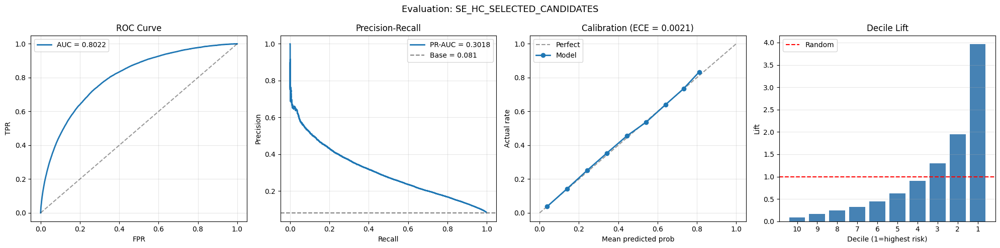


=== Per-Fold Stability ===
  CV seed 42: Mean=0.80223 | Std=0.00405
  CV seed 7: Mean=0.80223 | Std=0.00210
  CV seed 99: Mean=0.80223 | Std=0.00204

UPDATED SE-HC PROGRESS:
  SPC / fp_final:          0.79988
  LGBM V15 multi-seed:     0.79975
  XGBoost V15:             0.79896
  CatBoost V15:            0.79817
  LGBM V15 single seed:    0.79850
  Updated SE-HC:           0.80221
  Gain over fp_final:      +0.00233
  Gain over lgb_v15_ms:    +0.00246


In [ ]:
# ========== CARUANA HILL CLIMBING ENSEMBLE ==========

import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
from collections import Counter
import json

# ------------------------------------------------------------
# 1. Load selected OOF candidates
# ------------------------------------------------------------

# Final thesis components
oof_fp_final = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_FP_FINAL.parquet')['oof_final'].values
oof_v15_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet')['oof_lgb'].values

# New V15 tree baselines
# NOTE: if any file is missing, add it before running this cell.
oof_xgb_v15 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v15.parquet')['oof_xgb'].values
oof_cb_v15 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v15.parquet')['oof_cb'].values
oof_lgb_v15_single = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_single_seed.parquet')['oof_lgb'].values

# Strong historical candidates
oof_stack_v8 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_K3_stack_v8_FINAL.parquet')['oof_final'].values
oof_v12_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12_multiseed.parquet')['oof_lgb'].values
oof_v11_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_v7_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_cb_v11_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11_multiseed.parquet')['oof_cb'].values
oof_xgb_v11 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v11.parquet')['oof_xgb'].values

# Reference target and IDs
# Use LGBM V15 MS as reference because it is one final SE-HC component.
ref_oof = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet')
y = ref_oof[cfg.TARGET].astype(int).values
sk_ids_train = ref_oof['SK_ID_CURR'].values

# ------------------------------------------------------------
# 2. Load selected test predictions
# ------------------------------------------------------------

# Final thesis components
sub_fp = pd.read_csv(cfg.OUTPUT_DIR / 'submission_FP_FINAL.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v15_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v15_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
test_v15_ms = sub_v15_ms['TARGET'].values

# New V15 tree baselines
sub_xgb_v15 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v15.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v15 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v15.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v15_single = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v15_single_seed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

# Strong historical candidates
sub_stack_v8 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_K3_stack_v8_FINAL.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v12_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v11_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v7_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb_v11 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

sk_ids_test = sub_v15_ms['SK_ID_CURR'].values

# ------------------------------------------------------------
# 3. Candidate library
# ------------------------------------------------------------

candidates_oof = {
    'fp_final':          oof_fp_final,
    'lgb_v15_ms':        oof_v15_ms,
    'stack_v8':          oof_stack_v8,

    # New V15 tree candidates
    'xgb_v15':           oof_xgb_v15,
    'cb_v15':            oof_cb_v15,
    'lgb_v15_single':    oof_lgb_v15_single,

    # Strong historical candidates
    'lgb_v12_ms':        oof_v12_ms,
    'lgb_v11_ms':        oof_v11_ms,
    'lgb_v7_ms':         oof_v7_ms,
    'cb_v11_ms':         oof_cb_v11_ms,
    'xgb_v11':           oof_xgb_v11,
}

candidates_test = {
    'fp_final':          sub_fp['TARGET'].values,
    'lgb_v15_ms':        test_v15_ms,
    'stack_v8':          sub_stack_v8['TARGET'].values,

    # New V15 tree candidates
    'xgb_v15':           sub_xgb_v15['TARGET'].values,
    'cb_v15':            sub_cb_v15['TARGET'].values,
    'lgb_v15_single':    sub_lgb_v15_single['TARGET'].values,

    # Strong historical candidates
    'lgb_v12_ms':        sub_v12_ms['TARGET'].values,
    'lgb_v11_ms':        sub_v11_ms['TARGET'].values,
    'lgb_v7_ms':         sub_v7_ms['TARGET'].values,
    'cb_v11_ms':         sub_cb_v11_ms['TARGET'].values,
    'xgb_v11':           sub_xgb_v11['TARGET'].values,
}

# ------------------------------------------------------------
# 4. Candidate AUCs
# ------------------------------------------------------------

print('Candidate AUCs:')
for name, oof in candidates_oof.items():
    print(f'  {name:15s}: {roc_auc_score(y, oof):.5f}')

# Optional: verify expected number of candidates
print(f'\nNumber of candidates: {len(candidates_oof)}')

# ------------------------------------------------------------
# 5. Caruana Hill Climbing
# ------------------------------------------------------------

def caruana_hill_climb(candidates_oof, y, max_iters=50, verbose=True):
    """Greedy forward selection with replacement."""
    ensemble = []
    ensemble_pred = np.zeros(len(y))

    for iteration in range(max_iters):
        current_auc = roc_auc_score(y, ensemble_pred) if iteration > 0 else 0

        best_auc = current_auc
        best_model = None

        for name, pred in candidates_oof.items():
            if iteration == 0:
                new_pred = pred.copy()
            else:
                new_pred = (ensemble_pred * iteration + pred) / (iteration + 1)

            auc = roc_auc_score(y, new_pred)

            if auc > best_auc:
                best_auc = auc
                best_model = name

        if best_model is None:
            if verbose:
                print(f'  Iter {iteration}: No improvement, stopping')
            break

        ensemble.append(best_model)

        if iteration == 0:
            ensemble_pred = candidates_oof[best_model].copy()
        else:
            ensemble_pred = (ensemble_pred * iteration + candidates_oof[best_model]) / (iteration + 1)

        if verbose:
            print(f'  Iter {iteration+1:2d}: +{best_model:15s} | AUC = {best_auc:.5f}')

    return ensemble, ensemble_pred


ensemble_models, final_oof = caruana_hill_climb(
    candidates_oof,
    y,
    max_iters=50,
    verbose=True
)

# ------------------------------------------------------------
# 6. Build test prediction
# ------------------------------------------------------------

ensemble_test = np.zeros(len(candidates_test['lgb_v15_ms']))

for i, name in enumerate(ensemble_models):
    ensemble_test = (ensemble_test * i + candidates_test[name]) / (i + 1)

final_auc = roc_auc_score(y, final_oof)

# Model frequency
model_freq = Counter(ensemble_models)

print(f'\n{"="*70}')
print(f'CARUANA RESULTS:')
print(f'{"="*70}')
print(f'Models selected: {len(ensemble_models)}')
print(f'Final AUC: {final_auc:.5f}')

print(f'\nModel frequencies:')
for model, count in model_freq.most_common():
    weight = count / len(ensemble_models)
    print(f'  {model:15s}: {count:3d} times (weight {weight:.3f})')

# ------------------------------------------------------------
# 7. Evaluate
# ------------------------------------------------------------

import importlib
import evaluation as ev
importlib.reload(ev)

MODEL_NAME = 'SE_HC'

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=final_oof,
    model_name=MODEL_NAME,
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# ------------------------------------------------------------
# 8. Stability check
# ------------------------------------------------------------

from sklearn.model_selection import StratifiedKFold

print(f'\n=== Per-Fold Stability ===')
for cv_seed in [42, 7, 99]:
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=cv_seed)
    fold_aucs = []

    for _, val_idx in skf.split(np.zeros(len(y)), y):
        fold_aucs.append(roc_auc_score(y[val_idx], final_oof[val_idx]))

    print(f'  CV seed {cv_seed}: Mean={np.mean(fold_aucs):.5f} | Std={np.std(fold_aucs):.5f}')

# ------------------------------------------------------------
# 9. Save FINAL
# ------------------------------------------------------------

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_final': final_oof,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{MODEL_NAME}.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': ensemble_test,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{MODEL_NAME}.csv', index=False)

summary = {
    'model': MODEL_NAME,
    'technique': 'Caruana ensemble over selected high-performing candidates',
    'cv_auc': float(final_auc),
    'ece': float(metrics.get('ece', 0)),
    'ks': float(metrics.get('ks', 0)),
    'pr_auc': float(metrics.get('pr_auc', 0)),
    'lift_10pct': float(metrics.get('lift_10pct', 0)),
    'ensemble_models': ensemble_models,
    'model_frequencies': dict(model_freq),
    'model_weights': {
        model: count / len(ensemble_models)
        for model, count in model_freq.items()
    },
    'candidate_auc': {
        name: float(roc_auc_score(y, pred))
        for name, pred in candidates_oof.items()
    },
}

with open(cfg.OUTPUT_DIR / f'{MODEL_NAME}_SUMMARY.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'UPDATED SE-HC PROGRESS:')
print(f'{"="*70}')
print(f'  SPC / fp_final:          {roc_auc_score(y, candidates_oof["fp_final"]):.5f}')
print(f'  LGBM V15 multi-seed:     {roc_auc_score(y, candidates_oof["lgb_v15_ms"]):.5f}')
print(f'  XGBoost V15:             {roc_auc_score(y, candidates_oof["xgb_v15"]):.5f}')
print(f'  CatBoost V15:            {roc_auc_score(y, candidates_oof["cb_v15"]):.5f}')
print(f'  LGBM V15 single seed:    {roc_auc_score(y, candidates_oof["lgb_v15_single"]):.5f}')
print(f'  Updated SE-HC:           {final_auc:.5f}')
print(f'  Gain over fp_final:      {final_auc - roc_auc_score(y, candidates_oof["fp_final"]):+.5f}')
print(f'  Gain over lgb_v15_ms:    {final_auc - roc_auc_score(y, candidates_oof["lgb_v15_ms"]):+.5f}')

Candidate AUCs:
  fp_final       : 0.79988
  lgb_v15_ms     : 0.79975
  stack_v8       : 0.79975
  xgb_v15_ms     : 0.80011
  cb_v15_ms      : 0.79844
  lgb_v15_single : 0.79850
  lgb_v12_ms     : 0.79854
  lgb_v11_ms     : 0.79799
  lgb_v7_ms      : 0.79712
  cb_v11_ms      : 0.79632
  xgb_v11        : 0.79587

Number of candidates: 11
  Iter  1: +xgb_v15_ms      | AUC = 0.80011
  Iter  2: +fp_final        | AUC = 0.80203
  Iter 2: No improvement, stopping

CARUANA RESULTS:
Models selected: 2
Final AUC: 0.80203

Model frequencies:
  xgb_v15_ms     :   1 times (weight 0.500)
  fp_final       :   1 times (weight 0.500)

=== SE_HC_SELECTED_CANDIDATES_MS ===
  ROC-AUC:    0.80203
  Gini:       0.60406
  KS:         0.4586
  PR-AUC:     0.30131
  Lift@10%:   3.95x
  Lift@20%:   2.95x
  Log loss:   0.23175
  Brier:      0.06476
  ECE:        0.00206

Decile table:
            n  defaults  default_rate    lift  cum_capture
bucket                                                    
10      30

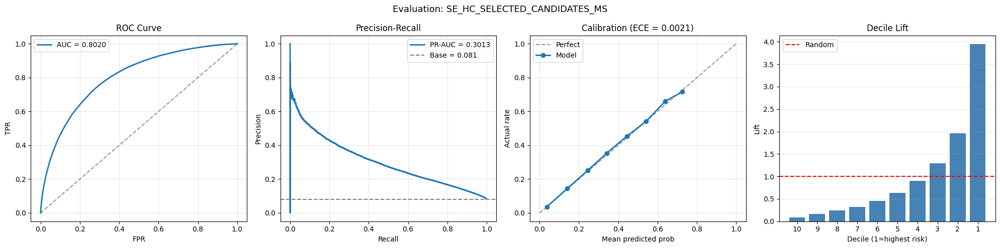


=== Per-Fold Stability ===
  CV seed 42: Mean=0.80205 | Std=0.00394
  CV seed 7: Mean=0.80207 | Std=0.00216
  CV seed 99: Mean=0.80208 | Std=0.00200

UPDATED SE-HC PROGRESS:
  SPC / fp_final:          0.79988
  LGBM V15 multi-seed:     0.79975
  XGBoost V15 multi-seed:  0.80011
  CatBoost V15 multi-seed: 0.79844
  LGBM V15 single seed:    0.79850
  Updated SE-HC:           0.80203
  Gain over fp_final:      +0.00215
  Gain over lgb_v15_ms:    +0.00228


In [9]:
# ========== CARUANA HILL CLIMBING ENSEMBLE ==========

import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
from collections import Counter
import json

# ------------------------------------------------------------
# 1. Load selected OOF candidates
# ------------------------------------------------------------

# Final thesis components
oof_fp_final = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_FP_FINAL.parquet')['oof_final'].values
oof_v15_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet')['oof_lgb'].values

# New V15 tree multi-seed candidates
# NOTE: these files should come from your newly trained XGBoost/CatBoost multi-seed runs.
oof_xgb_v15_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v15_multiseed.parquet')['oof_xgb'].values
oof_cb_v15_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v15_multiseed.parquet')['oof_cb'].values
oof_lgb_v15_single = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_single_seed.parquet')['oof_lgb'].values

# Strong historical candidates
oof_stack_v8 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_K3_stack_v8_FINAL.parquet')['oof_final'].values
oof_v12_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v12_multiseed.parquet')['oof_lgb'].values
oof_v11_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v11_multiseed.parquet')['oof_lgb'].values
oof_v7_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v7_multiseed.parquet')['oof_lgb'].values
oof_cb_v11_ms = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v11_multiseed.parquet')['oof_cb'].values
oof_xgb_v11 = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v11.parquet')['oof_xgb'].values

# Reference target and IDs
# Use LGBM V15 MS as reference because it is one final SE-HC component.
ref_oof = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet')
y = ref_oof[cfg.TARGET].astype(int).values
sk_ids_train = ref_oof['SK_ID_CURR'].values

# ------------------------------------------------------------
# 2. Load selected test predictions
# ------------------------------------------------------------

# Final thesis components
sub_fp = pd.read_csv(cfg.OUTPUT_DIR / 'submission_FP_FINAL.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v15_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v15_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
test_v15_ms = sub_v15_ms['TARGET'].values

# New V15 tree multi-seed candidates
sub_xgb_v15_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v15_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v15_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v15_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_lgb_v15_single = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v15_single_seed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

# Strong historical candidates
sub_stack_v8 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_K3_stack_v8_FINAL.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v12_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v12_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v11_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_v7_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_lgb_v7_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_cb_v11_ms = pd.read_csv(cfg.OUTPUT_DIR / 'submission_cb_v11_multiseed.csv').sort_values('SK_ID_CURR').reset_index(drop=True)
sub_xgb_v11 = pd.read_csv(cfg.OUTPUT_DIR / 'submission_xgb_v11.csv').sort_values('SK_ID_CURR').reset_index(drop=True)

sk_ids_test = sub_v15_ms['SK_ID_CURR'].values

# ------------------------------------------------------------
# 3. Candidate library
# ------------------------------------------------------------

candidates_oof = {
    'fp_final':          oof_fp_final,
    'lgb_v15_ms':        oof_v15_ms,
    'stack_v8':          oof_stack_v8,

    # New V15 tree multi-seed candidates
    'xgb_v15_ms':        oof_xgb_v15_ms,
    'cb_v15_ms':         oof_cb_v15_ms,
    'lgb_v15_single':    oof_lgb_v15_single,

    # Strong historical candidates
    'lgb_v12_ms':        oof_v12_ms,
    'lgb_v11_ms':        oof_v11_ms,
    'lgb_v7_ms':         oof_v7_ms,
    'cb_v11_ms':         oof_cb_v11_ms,
    'xgb_v11':           oof_xgb_v11,
}

candidates_test = {
    'fp_final':          sub_fp['TARGET'].values,
    'lgb_v15_ms':        test_v15_ms,
    'stack_v8':          sub_stack_v8['TARGET'].values,

    # New V15 tree multi-seed candidates
    'xgb_v15_ms':        sub_xgb_v15_ms['TARGET'].values,
    'cb_v15_ms':         sub_cb_v15_ms['TARGET'].values,
    'lgb_v15_single':    sub_lgb_v15_single['TARGET'].values,

    # Strong historical candidates
    'lgb_v12_ms':        sub_v12_ms['TARGET'].values,
    'lgb_v11_ms':        sub_v11_ms['TARGET'].values,
    'lgb_v7_ms':         sub_v7_ms['TARGET'].values,
    'cb_v11_ms':         sub_cb_v11_ms['TARGET'].values,
    'xgb_v11':           sub_xgb_v11['TARGET'].values,
}

# ------------------------------------------------------------
# 4. Candidate AUCs
# ------------------------------------------------------------

print('Candidate AUCs:')
for name, oof in candidates_oof.items():
    print(f'  {name:15s}: {roc_auc_score(y, oof):.5f}')

# Optional: verify expected number of candidates
print(f'\nNumber of candidates: {len(candidates_oof)}')

# ------------------------------------------------------------
# 5. Caruana Hill Climbing
# ------------------------------------------------------------

def caruana_hill_climb(candidates_oof, y, max_iters=50, verbose=True):
    """Greedy forward selection with replacement."""
    ensemble = []
    ensemble_pred = np.zeros(len(y))

    for iteration in range(max_iters):
        current_auc = roc_auc_score(y, ensemble_pred) if iteration > 0 else 0

        best_auc = current_auc
        best_model = None

        for name, pred in candidates_oof.items():
            if iteration == 0:
                new_pred = pred.copy()
            else:
                new_pred = (ensemble_pred * iteration + pred) / (iteration + 1)

            auc = roc_auc_score(y, new_pred)

            if auc > best_auc:
                best_auc = auc
                best_model = name

        if best_model is None:
            if verbose:
                print(f'  Iter {iteration}: No improvement, stopping')
            break

        ensemble.append(best_model)

        if iteration == 0:
            ensemble_pred = candidates_oof[best_model].copy()
        else:
            ensemble_pred = (ensemble_pred * iteration + candidates_oof[best_model]) / (iteration + 1)

        if verbose:
            print(f'  Iter {iteration+1:2d}: +{best_model:15s} | AUC = {best_auc:.5f}')

    return ensemble, ensemble_pred


ensemble_models, final_oof = caruana_hill_climb(
    candidates_oof,
    y,
    max_iters=50,
    verbose=True
)

# ------------------------------------------------------------
# 6. Build test prediction
# ------------------------------------------------------------

ensemble_test = np.zeros(len(candidates_test['lgb_v15_ms']))

for i, name in enumerate(ensemble_models):
    ensemble_test = (ensemble_test * i + candidates_test[name]) / (i + 1)

final_auc = roc_auc_score(y, final_oof)

# Model frequency
model_freq = Counter(ensemble_models)

print(f'\n{"="*70}')
print(f'CARUANA RESULTS:')
print(f'{"="*70}')
print(f'Models selected: {len(ensemble_models)}')
print(f'Final AUC: {final_auc:.5f}')

print(f'\nModel frequencies:')
for model, count in model_freq.most_common():
    weight = count / len(ensemble_models)
    print(f'  {model:15s}: {count:3d} times (weight {weight:.3f})')

# ------------------------------------------------------------
# 7. Evaluate
# ------------------------------------------------------------

import importlib
import evaluation as ev
importlib.reload(ev)

MODEL_NAME = 'SE_HC_SELECTED_CANDIDATES_MS'

metrics = ev.evaluate_model(
    y_true=y,
    y_pred=final_oof,
    model_name=MODEL_NAME,
    output_dir=cfg.EVAL_DIR,
    save_plot=True,
    show_inline=True,
)

# ------------------------------------------------------------
# 8. Stability check
# ------------------------------------------------------------

from sklearn.model_selection import StratifiedKFold

print(f'\n=== Per-Fold Stability ===')
for cv_seed in [42, 7, 99]:
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=cv_seed)
    fold_aucs = []

    for _, val_idx in skf.split(np.zeros(len(y)), y):
        fold_aucs.append(roc_auc_score(y[val_idx], final_oof[val_idx]))

    print(f'  CV seed {cv_seed}: Mean={np.mean(fold_aucs):.5f} | Std={np.std(fold_aucs):.5f}')

# ------------------------------------------------------------
# 9. Save FINAL
# ------------------------------------------------------------

pd.DataFrame({
    'SK_ID_CURR': sk_ids_train,
    cfg.TARGET: y,
    'oof_final': final_oof,
}).to_parquet(cfg.OUTPUT_DIR / f'oof_{MODEL_NAME}.parquet', index=False)

pd.DataFrame({
    'SK_ID_CURR': sk_ids_test,
    'TARGET': ensemble_test,
}).to_csv(cfg.OUTPUT_DIR / f'submission_{MODEL_NAME}.csv', index=False)

summary = {
    'model': MODEL_NAME,
    'technique': 'Caruana ensemble over selected high-performing candidates with V15 XGBoost/CatBoost multi-seed',
    'cv_auc': float(final_auc),
    'ece': float(metrics.get('ece', 0)),
    'ks': float(metrics.get('ks', 0)),
    'pr_auc': float(metrics.get('pr_auc', 0)),
    'lift_10pct': float(metrics.get('lift_10pct', 0)),
    'ensemble_models': ensemble_models,
    'model_frequencies': dict(model_freq),
    'model_weights': {
        model: count / len(ensemble_models)
        for model, count in model_freq.items()
    },
    'candidate_auc': {
        name: float(roc_auc_score(y, pred))
        for name, pred in candidates_oof.items()
    },
}

with open(cfg.OUTPUT_DIR / f'{MODEL_NAME}_SUMMARY.json', 'w') as f:
    json.dump(summary, f, indent=2)

print(f'\n{"="*70}')
print(f'UPDATED SE-HC PROGRESS:')
print(f'{"="*70}')
print(f'  SPC / fp_final:          {roc_auc_score(y, candidates_oof["fp_final"]):.5f}')
print(f'  LGBM V15 multi-seed:     {roc_auc_score(y, candidates_oof["lgb_v15_ms"]):.5f}')
print(f'  XGBoost V15 multi-seed:  {roc_auc_score(y, candidates_oof["xgb_v15_ms"]):.5f}')
print(f'  CatBoost V15 multi-seed: {roc_auc_score(y, candidates_oof["cb_v15_ms"]):.5f}')
print(f'  LGBM V15 single seed:    {roc_auc_score(y, candidates_oof["lgb_v15_single"]):.5f}')
print(f'  Updated SE-HC:           {final_auc:.5f}')
print(f'  Gain over fp_final:      {final_auc - roc_auc_score(y, candidates_oof["fp_final"]):+.5f}')
print(f'  Gain over lgb_v15_ms:    {final_auc - roc_auc_score(y, candidates_oof["lgb_v15_ms"]):+.5f}')

**multiseed XG CAT**

In [10]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score

oof_fp = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_FP_FINAL.parquet').sort_values('SK_ID_CURR').reset_index(drop=True)
oof_lgb = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet').sort_values('SK_ID_CURR').reset_index(drop=True)
oof_xgb = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v15_multiseed.parquet').sort_values('SK_ID_CURR').reset_index(drop=True)
oof_stack = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_K3_stack_v8_FINAL.parquet').sort_values('SK_ID_CURR').reset_index(drop=True)

assert (oof_fp['SK_ID_CURR'].values == oof_lgb['SK_ID_CURR'].values).all()
assert (oof_xgb['SK_ID_CURR'].values == oof_lgb['SK_ID_CURR'].values).all()
assert (oof_stack['SK_ID_CURR'].values == oof_lgb['SK_ID_CURR'].values).all()

y = oof_lgb[cfg.TARGET].astype(int).values

p_fp = oof_fp['oof_final'].values
p_lgb = oof_lgb['oof_lgb'].values
p_xgb = oof_xgb['oof_xgb'].values
p_stack = oof_stack['oof_final'].values

best_auc = 0
best_w = None

for w_xgb in np.arange(0.20, 0.61, 0.025):
    for w_fp in np.arange(0.20, 0.61, 0.025):
        for w_lgb in np.arange(0.00, 0.31, 0.025):
            w_stack = 1 - w_xgb - w_fp - w_lgb
            if w_stack < 0 or w_stack > 0.30:
                continue

            pred = w_xgb*p_xgb + w_fp*p_fp + w_lgb*p_lgb + w_stack*p_stack
            auc = roc_auc_score(y, pred)

            if auc > best_auc:
                best_auc = auc
                best_w = (w_xgb, w_fp, w_lgb, w_stack)

print('Best OOF AUC:', best_auc)
print('Weights xgb/fp/lgb/stack:', best_w)

KeyboardInterrupt: 

### **EVALUATION**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import (
    roc_auc_score, f1_score, precision_score, recall_score,
    average_precision_score, brier_score_loss, roc_curve
)

# Load all OOF predictions
candidates_oof = {
    'LogReg':         pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lr_v15_baseline.parquet')['oof_lr'].values,
    'LightGBM single seed':       pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_single_seed.parquet')['oof_lgb'].values,
    'LightGBM multiseed':        pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet')['oof_lgb'].values,
    'XGBoost':        pd.read_parquet(cfg.OUTPUT_DIR / 'oof_xgb_v15.parquet')['oof_xgb'].values,
    'CatBoost':       pd.read_parquet(cfg.OUTPUT_DIR / 'oof_cb_v15.parquet')['oof_cb'].values,
    'MLP':            pd.read_parquet(cfg.OUTPUT_DIR / 'oof_mlp_v15.parquet')['oof_mlp'].values,
    'SE-HC':          pd.read_parquet(cfg.OUTPUT_DIR / 'oof_SIGMA_FINAL.parquet')['oof_final'].values,
}

# True labels
y_true = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_SIGMA_FINAL.parquet')['TARGET'].values

# Compute metrics for each model
def ks_stat(y_true, y_pred):
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    return np.max(tpr - fpr)

def ece_metric(y_true, y_pred, n_bins=15):
    bins = np.linspace(0, 1, n_bins + 1)
    ece = 0
    for i in range(n_bins):
        mask = (y_pred >= bins[i]) & (y_pred < bins[i+1])
        if mask.sum() > 0:
            mean_pred = y_pred[mask].mean()
            mean_true = y_true[mask].mean()
            ece += np.abs(mean_pred - mean_true) * mask.sum() / len(y_true)
    return ece

def lift_at_k(y_true, y_pred, k=0.1):
    n_top = int(len(y_true) * k)
    top_idx = np.argsort(y_pred)[::-1][:n_top]
    return (y_true[top_idx].mean() / y_true.mean())

results = []
for name, oof in candidates_oof.items():
    # Use Youden's J for threshold
    fpr, tpr, thresholds = roc_curve(y_true, oof)
    t_star = thresholds[np.argmax(tpr - fpr)]
    y_pred_binary = (oof >= t_star).astype(int)

    results.append({
        'Model':       name,
        'ROC-AUC':     roc_auc_score(y_true, oof),
        'Gini':        2 * roc_auc_score(y_true, oof) - 1,
        'KS':          ks_stat(y_true, oof),
        'PR-AUC':      average_precision_score(y_true, oof),
        'Lift@10%':    lift_at_k(y_true, oof, 0.1),
        'F1 (t*)':     f1_score(y_true, y_pred_binary),
        'Precision':   precision_score(y_true, y_pred_binary),
        'Recall':      recall_score(y_true, y_pred_binary),
        'Brier':       brier_score_loss(y_true, oof),
        'ECE':         ece_metric(y_true, oof),
        't*':          t_star,
    })

df = pd.DataFrame(results)
print(df.to_string(index=False))
#df.to_csv(cfg.OUTPUT_DIR / 'evaluation_all_baselines(1).csv', index=False)

               Model  ROC-AUC     Gini       KS   PR-AUC  Lift@10%  F1 (t*)  Precision   Recall    Brier      ECE       t*
              LogReg 0.782546 0.565092 0.424540 0.267877  3.658492 0.286685   0.179690 0.708640 0.070328 0.061353 0.155053
LightGBM single seed 0.798504 0.597009 0.452538 0.295101  3.898981 0.298229   0.187321 0.731078 0.065093 0.002370 0.076887
  LightGBM multiseed 0.799749 0.599497 0.453514 0.297331  3.898175 0.292224   0.181390 0.751259 0.064972 0.002716 0.072577
             XGBoost 0.798955 0.597910 0.452732 0.296833  3.912274 0.302721   0.191730 0.718872 0.065011 0.002048 0.081166
            CatBoost 0.798170 0.596340 0.452687 0.295139  3.907440 0.293298   0.182520 0.746183 0.065092 0.003858 0.073554
                 MLP 0.783513 0.567026 0.427961 0.269285  3.686690 0.289235   0.181753 0.707795 0.066448 0.007678 0.090086
               SE-HC 0.801688 0.603377 0.457192 0.300543  3.944501 0.299920   0.188365 0.735509 0.064796 0.002831 0.080135


### **SHAP**

In [ ]:
# ========== SHAP SETUP + TRAIN SINGLE LGBM ==========
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import time, gc, warnings
warnings.filterwarnings('ignore')

# Install SHAP if needed
try:
    import shap
except ImportError:
    import subprocess
    subprocess.check_call(['pip', 'install', '-q', 'shap'])
    import shap

print(f'SHAP version: {shap.__version__}')

# Load V15 (production feature set)
train = pd.read_parquet('train_merged_v15.parquet')
test = pd.read_parquet('test_merged_v15.parquet')

EXCLUDE_COLS = ['SK_ID_CURR', cfg.TARGET, 'index']
feature_cols = [c for c in train.columns if c not in EXCLUDE_COLS]

for col in feature_cols:
    if train[col].dtype == 'object':
        combined = pd.concat([train[col].astype(str), test[col].astype(str)])
        codes, _ = pd.factorize(combined)
        train[col] = codes[:len(train)].astype(np.int32)
        test[col] = codes[len(train):].astype(np.int32)

FORCE_CATEGORICAL = [
    'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
    'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'WEEKDAY_APPR_PROCESS_START',
    'HOUR_APPR_PROCESS_START', 'BURO_CLU_LABEL', 'PREV_CLU_LABEL',
]
categorical_features = [c for c in feature_cols if c in FORCE_CATEGORICAL]

y = train[cfg.TARGET].astype(int).values
X = train[feature_cols]
X_test = test[feature_cols]

print(f'V15 features: {len(feature_cols)}')

# Train single LGBM (seed=42) for SHAP
LGB_PARAMS = {
    'objective': 'binary', 'metric': 'auc', 'boosting_type': 'gbdt',
    'learning_rate': 0.02, 'num_leaves': 24, 'max_depth': 6,
    'min_child_samples': 100, 'reg_alpha': 0.1, 'reg_lambda': 0.1,
    'colsample_bytree': 0.7, 'subsample': 0.8, 'subsample_freq': 1,
    'verbosity': -1, 'random_state': 42, 'n_jobs': -1,
}

# Train on ALL training data
print('\nTraining final LGBM cho SHAP (single model on all train)...')
fold_start = time.time()

dtrain_full = lgb.Dataset(X, label=y, categorical_feature=categorical_features)
shap_model = lgb.train(
    LGB_PARAMS, dtrain_full, num_boost_round=2000,
    valid_sets=[dtrain_full], valid_names=['train'],
    callbacks=[lgb.log_evaluation(500)],
)

print(f'Train time: {time.time()-fold_start:.1f}s')

# Save model
import joblib
joblib.dump(shap_model, cfg.OUTPUT_DIR / 'lgbm_shap_model.pkl')

print('SHAP model saved.')

SHAP version: 0.51.0
V15 features: 1041

Training final LGBM cho SHAP (single model on all train)...
[500]	train's auc: 0.824116
[1000]	train's auc: 0.851559
[1500]	train's auc: 0.872292
[2000]	train's auc: 0.889308
Train time: 536.4s
SHAP model saved.


Computing SHAP on 10000 samples...
SHAP computation done. Time: 0.4 min
SHAP values shape: (10000, 1041)

[1/4] Beeswarm plot top 20 features...


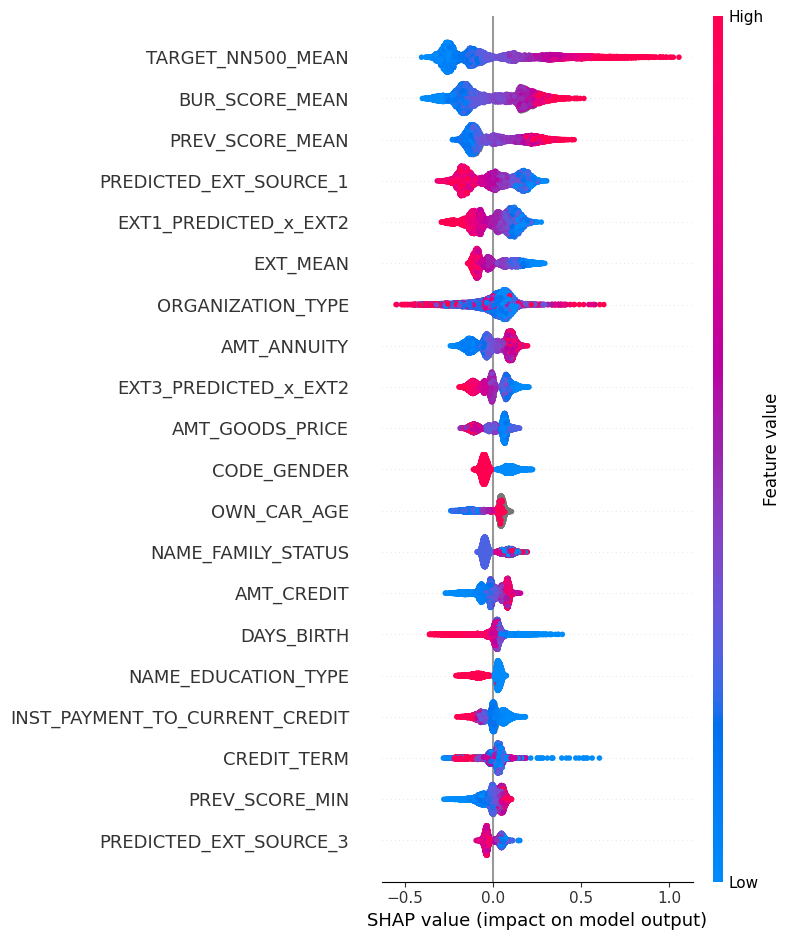


[2/4] Bar plot feature importance...


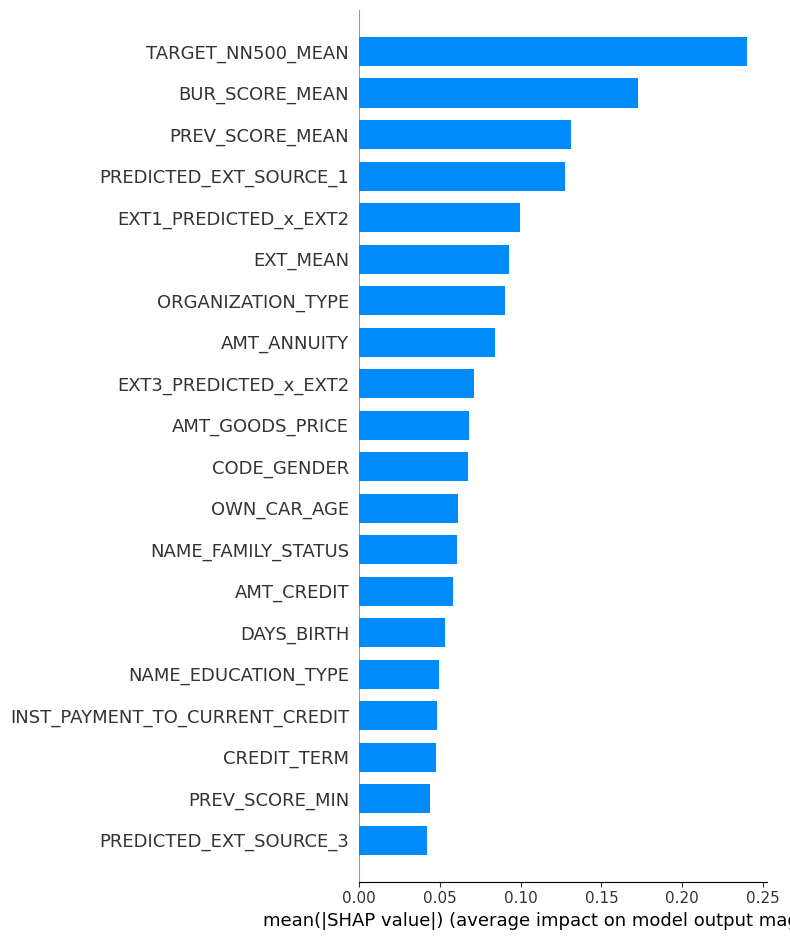


[3/4] SHAP importance table...

Top 30 features by SHAP importance:
                       feature  mean_abs_shap  mean_shap  std_shap
             TARGET_NN500_MEAN       0.240272  -0.004030  0.288019
                BUR_SCORE_MEAN       0.172819  -0.002359  0.190452
               PREV_SCORE_MEAN       0.131058   0.001370  0.151084
        PREDICTED_EXT_SOURCE_1       0.127257  -0.008717  0.144893
         EXT1_PREDICTED_x_EXT2       0.099866   0.009787  0.112754
                      EXT_MEAN       0.092956  -0.000497  0.105974
             ORGANIZATION_TYPE       0.090426  -0.000315  0.122759
                   AMT_ANNUITY       0.083956   0.000181  0.096032
         EXT3_PREDICTED_x_EXT2       0.071032  -0.003046  0.083604
               AMT_GOODS_PRICE       0.068174   0.003200  0.077668
                   CODE_GENDER       0.067546  -0.002433  0.074179
                   OWN_CAR_AGE       0.061452  -0.000472  0.073461
            NAME_FAMILY_STATUS       0.060646  -0.001271  0.

In [ ]:
# ========== SHAP GLOBAL ANALYSIS ==========
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib, gc

# Load model + data
shap_model = joblib.load(cfg.OUTPUT_DIR / 'lgbm_shap_model.pkl')

# Sample 10K rows for SHAP (full 307K too slow)
SAMPLE_SIZE = 10000
np.random.seed(42)
sample_idx = np.random.choice(len(X), SAMPLE_SIZE, replace=False)
X_shap = X.iloc[sample_idx].copy()
y_shap = y[sample_idx]

print(f'Computing SHAP on {SAMPLE_SIZE} samples...')

# Create explainer
explainer = shap.TreeExplainer(shap_model)

# Compute SHAP values (~5-10 min for 10K samples)
import time
shap_start = time.time()
shap_values = explainer.shap_values(X_shap)

# LightGBM returns list (binary classification) - take positive class
if isinstance(shap_values, list):
    shap_values = shap_values[1]

print(f'SHAP computation done. Time: {(time.time()-shap_start)/60:.1f} min')
print(f'SHAP values shape: {shap_values.shape}')

# Save SHAP values
np.save(cfg.OUTPUT_DIR / 'shap_values.npy', shap_values)
np.save(cfg.OUTPUT_DIR / 'shap_sample_idx.npy', sample_idx)

# === 1. Beeswarm Plot Top 20 Features ===
print('\n[1/4] Beeswarm plot top 20 features...')
plt.figure(figsize=(12, 10))
shap.summary_plot(shap_values, X_shap, max_display=20, show=False)
plt.tight_layout()
plt.savefig(cfg.EVAL_DIR / 'shap_beeswarm_top20.png', dpi=150, bbox_inches='tight')
plt.show()

# === 2. Bar Plot (Mean |SHAP|) ===
print('\n[2/4] Bar plot feature importance...')
plt.figure(figsize=(12, 10))
shap.summary_plot(shap_values, X_shap, max_display=20, plot_type='bar', show=False)
plt.tight_layout()
plt.savefig(cfg.EVAL_DIR / 'shap_bar_top20.png', dpi=150, bbox_inches='tight')
plt.show()

# === 3. SHAP Feature Importance Table ===
print('\n[3/4] SHAP importance table...')
shap_importance = pd.DataFrame({
    'feature': feature_cols,
    'mean_abs_shap': np.abs(shap_values).mean(axis=0),
    'mean_shap': shap_values.mean(axis=0),
    'std_shap': shap_values.std(axis=0),
})
shap_importance = shap_importance.sort_values('mean_abs_shap', ascending=False).reset_index(drop=True)

print('\nTop 30 features by SHAP importance:')
print(shap_importance.head(30).to_string(index=False))

shap_importance.to_csv(cfg.OUTPUT_DIR / 'shap_importance.csv', index=False)

# === 4. Compare SHAP vs LGBM importance ===
print('\n[4/4] Compare SHAP vs LGBM importance...')
lgbm_importance = pd.DataFrame({
    'feature': feature_cols,
    'lgbm_gain': shap_model.feature_importance(importance_type='gain'),
    'lgbm_split': shap_model.feature_importance(importance_type='split'),
})

comparison = shap_importance.merge(lgbm_importance, on='feature', how='left')
comparison['shap_rank'] = comparison['mean_abs_shap'].rank(ascending=False).astype(int)
comparison['lgbm_gain_rank'] = comparison['lgbm_gain'].rank(ascending=False).astype(int)
comparison['rank_diff'] = comparison['shap_rank'] - comparison['lgbm_gain_rank']

print('\nTop 20 features (rank comparison):')
print(comparison[['feature', 'shap_rank', 'lgbm_gain_rank', 'rank_diff']].head(20).to_string(index=False))

comparison.to_csv(cfg.OUTPUT_DIR / 'shap_vs_lgbm_comparison.csv', index=False)

print('\nGlobal SHAP analysis done.')

Base prediction value: 0.0793

Finding case studies...

Case studies found:
  TP: SK_ID=129426.0 | Pred=0.6023 | True=1 | True Positive (correctly identified high-risk default)
  TN: SK_ID=405321.0 | Pred=0.0077 | True=0 | True Negative (correctly identified safe customer)
  FP: SK_ID=368049.0 | Pred=0.4050 | True=0 | False Positive (wrongly flagged - rejected good customer)
  FN: SK_ID=356366.0 | Pred=0.0400 | True=1 | False Negative (missed default - approved bad customer)

[1/2] Waterfall plots...


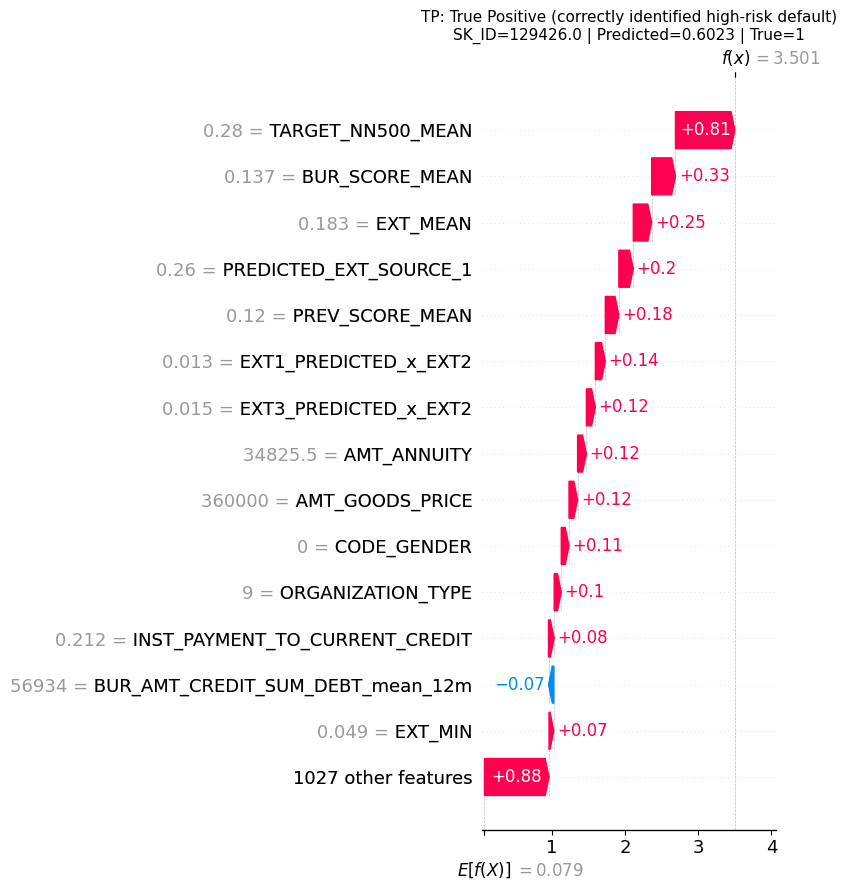

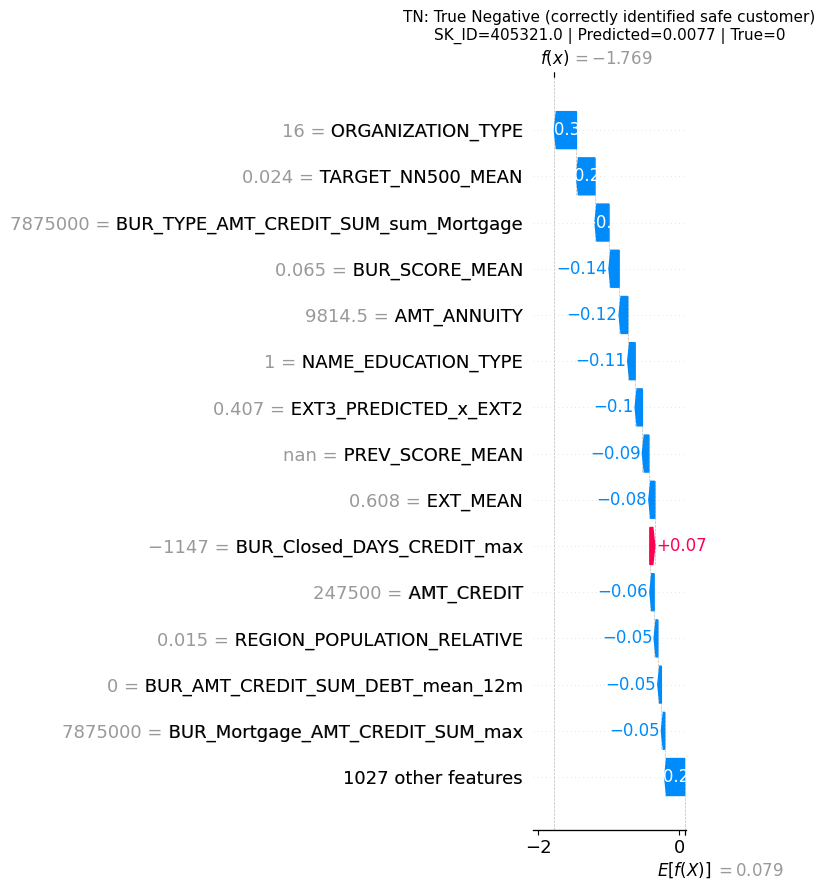

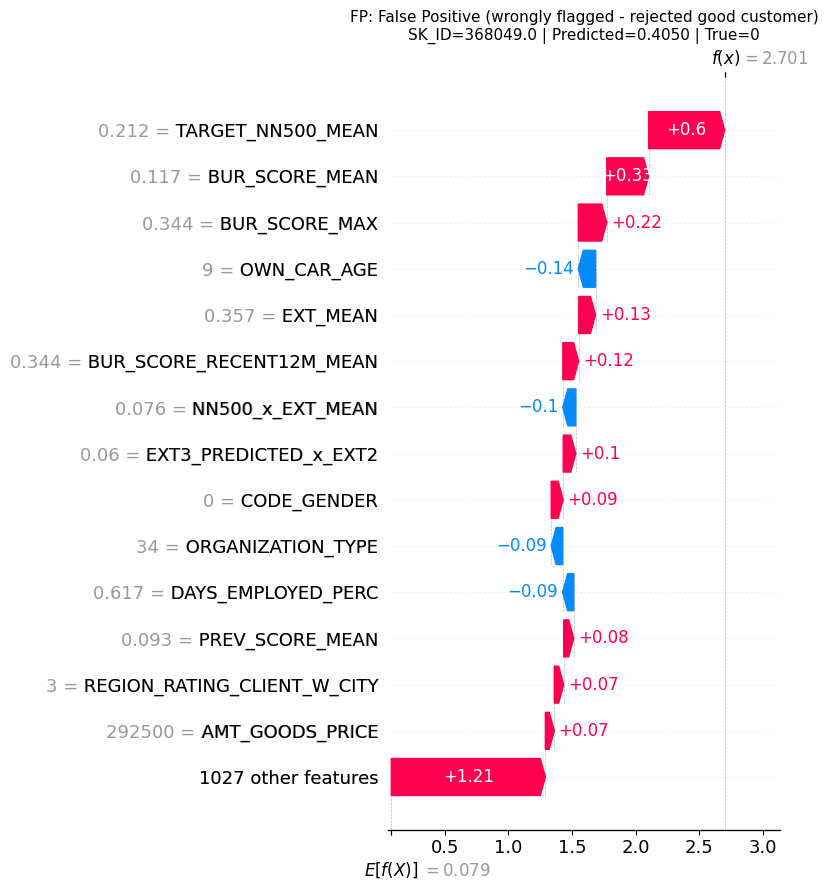

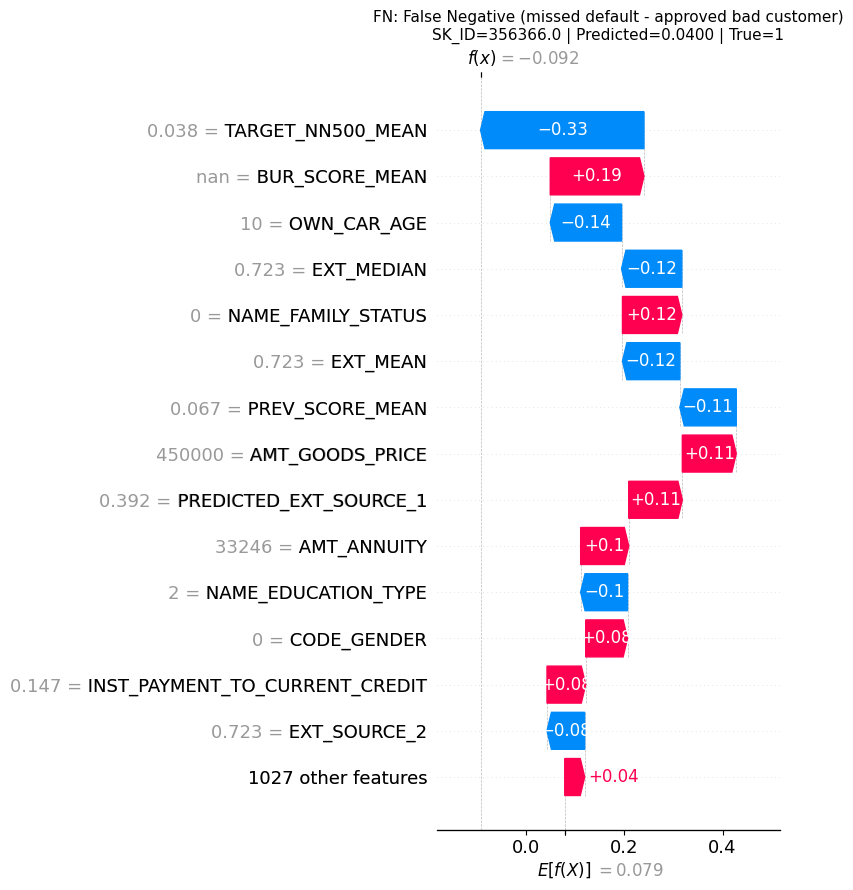


[2/2] Force plot summaries (top 10 features per case)...

TP: True Positive (correctly identified high-risk default)
  SK_ID: 129426.0
  Predicted prob: 0.6023
  True target: 1
  Base value: 0.0793
  Top 10 contributing features:
               feature         value     shap
     TARGET_NN500_MEAN      0.280000 0.811543
        BUR_SCORE_MEAN      0.137367 0.325796
              EXT_MEAN      0.182842 0.250839
PREDICTED_EXT_SOURCE_1      0.260033 0.197279
       PREV_SCORE_MEAN      0.119647 0.184817
 EXT1_PREDICTED_x_EXT2      0.012651 0.136374
 EXT3_PREDICTED_x_EXT2      0.015424 0.122552
           AMT_ANNUITY  34825.500000 0.119864
       AMT_GOODS_PRICE 360000.000000 0.117444
           CODE_GENDER      0.000000 0.105957

TN: True Negative (correctly identified safe customer)
  SK_ID: 405321.0
  Predicted prob: 0.0077
  True target: 0
  Base value: 0.0793
  Top 10 contributing features:
                             feature         value      shap
                   ORGANIZATION_T

In [ ]:
# ========== SHAP LOCAL - CASE STUDIES ==========
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

shap_model = joblib.load(cfg.OUTPUT_DIR / 'lgbm_shap_model.pkl')
shap_values = np.load(cfg.OUTPUT_DIR / 'shap_values.npy')
sample_idx = np.load(cfg.OUTPUT_DIR / 'shap_sample_idx.npy')

X_shap = X.iloc[sample_idx].copy()
y_shap = y[sample_idx]

# Predict probabilities
preds = shap_model.predict(X_shap)
expected_value = preds.mean()  # Base value

print(f'Base prediction value: {expected_value:.4f}')

# Identify 4 case studies: TP, TN, FP, FN
THRESHOLD = 0.5  # Default threshold

# Predicted class
preds_class = (preds >= 0.1).astype(int)  # Low threshold for imbalanced data

# Confidence categories
high_conf_default = (preds >= 0.5) & (y_shap == 1)        # TP confident default
high_conf_safe = (preds <= 0.02) & (y_shap == 0)          # TN confident safe
fp_cases = (preds >= 0.4) & (y_shap == 0)                  # FP - wrongly flagged
fn_cases = (preds <= 0.05) & (y_shap == 1)                 # FN - missed default

# Sample 1 from each
print('\nFinding case studies...')
case_studies = {}

if high_conf_default.sum() > 0:
    idx = np.where(high_conf_default)[0][0]
    case_studies['TP'] = {
        'idx': idx, 'pred': preds[idx], 'true': y_shap[idx],
        'sk_id': train.iloc[sample_idx[idx]]['SK_ID_CURR'],
        'desc': 'True Positive (correctly identified high-risk default)'
    }

if high_conf_safe.sum() > 0:
    idx = np.where(high_conf_safe)[0][0]
    case_studies['TN'] = {
        'idx': idx, 'pred': preds[idx], 'true': y_shap[idx],
        'sk_id': train.iloc[sample_idx[idx]]['SK_ID_CURR'],
        'desc': 'True Negative (correctly identified safe customer)'
    }

if fp_cases.sum() > 0:
    idx = np.where(fp_cases)[0][0]
    case_studies['FP'] = {
        'idx': idx, 'pred': preds[idx], 'true': y_shap[idx],
        'sk_id': train.iloc[sample_idx[idx]]['SK_ID_CURR'],
        'desc': 'False Positive (wrongly flagged - rejected good customer)'
    }

if fn_cases.sum() > 0:
    idx = np.where(fn_cases)[0][0]
    case_studies['FN'] = {
        'idx': idx, 'pred': preds[idx], 'true': y_shap[idx],
        'sk_id': train.iloc[sample_idx[idx]]['SK_ID_CURR'],
        'desc': 'False Negative (missed default - approved bad customer)'
    }

print('\nCase studies found:')
for case, info in case_studies.items():
    print(f'  {case}: SK_ID={info["sk_id"]} | Pred={info["pred"]:.4f} | True={info["true"]} | {info["desc"]}')

# Save case studies info
import json
case_info = {k: {kk: float(vv) if isinstance(vv, (np.floating, np.integer)) else str(vv) for kk, vv in v.items()}
             for k, v in case_studies.items()}
with open(cfg.OUTPUT_DIR / 'shap_case_studies.json', 'w') as f:
    json.dump(case_info, f, indent=2)

# === Waterfall plot cho mỗi case ===
print('\n[1/2] Waterfall plots...')

for case_name, info in case_studies.items():
    idx = info['idx']

    plt.figure(figsize=(12, 8))

    # Build SHAP Explanation object
    explanation = shap.Explanation(
        values=shap_values[idx],
        base_values=expected_value,
        data=X_shap.iloc[idx].values,
        feature_names=feature_cols,
    )

    shap.plots.waterfall(explanation, max_display=15, show=False)
    plt.title(f'{case_name}: {info["desc"]}\n'
              f'SK_ID={info["sk_id"]} | Predicted={info["pred"]:.4f} | True={info["true"]}',
              fontsize=11)
    plt.tight_layout()
    plt.savefig(cfg.EVAL_DIR / f'shap_waterfall_{case_name}.png', dpi=150, bbox_inches='tight')
    plt.show()

# === Force plot cho mỗi case ===
print('\n[2/2] Force plot summaries (top 10 features per case)...')

for case_name, info in case_studies.items():
    idx = info['idx']

    # Get top 10 contributing features
    feat_contribs = pd.DataFrame({
        'feature': feature_cols,
        'value': X_shap.iloc[idx].values,
        'shap': shap_values[idx],
    }).sort_values('shap', key=abs, ascending=False).head(10)

    print(f'\n{case_name}: {info["desc"]}')
    print(f'  SK_ID: {info["sk_id"]}')
    print(f'  Predicted prob: {info["pred"]:.4f}')
    print(f'  True target: {info["true"]}')
    print(f'  Base value: {expected_value:.4f}')
    print(f'  Top 10 contributing features:')
    print(feat_contribs.to_string(index=False))

print('\nLocal SHAP analysis done.')

Top 5 features for dependence plots:
  - TARGET_NN500_MEAN
  - BUR_SCORE_MEAN
  - PREV_SCORE_MEAN
  - PREDICTED_EXT_SOURCE_1
  - EXT1_PREDICTED_x_EXT2

[1/2] Dependence plots (top 5 features)...


<Figure size 1000x600 with 0 Axes>

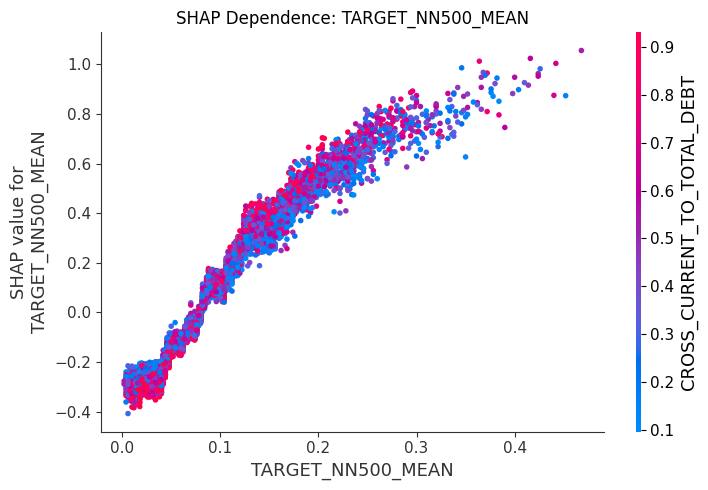

<Figure size 1000x600 with 0 Axes>

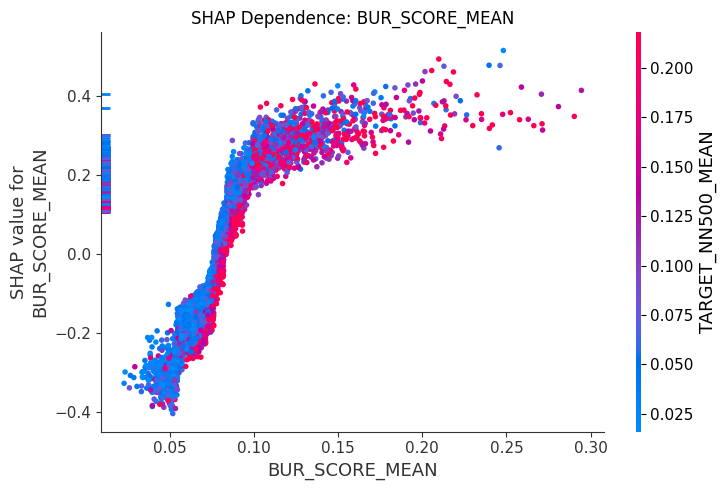

<Figure size 1000x600 with 0 Axes>

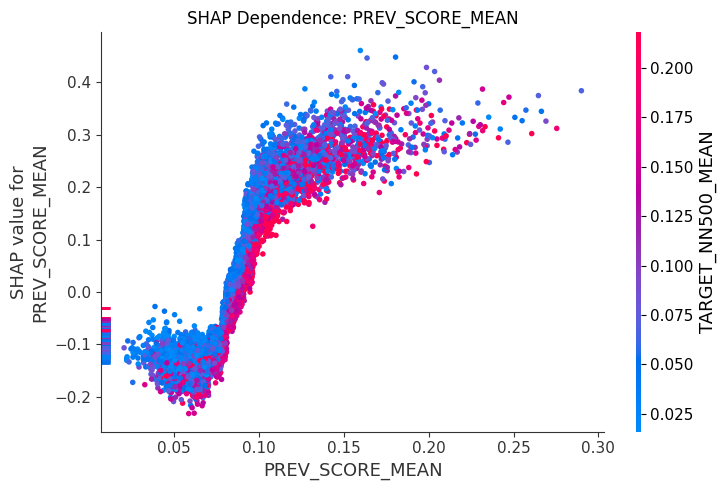

<Figure size 1000x600 with 0 Axes>

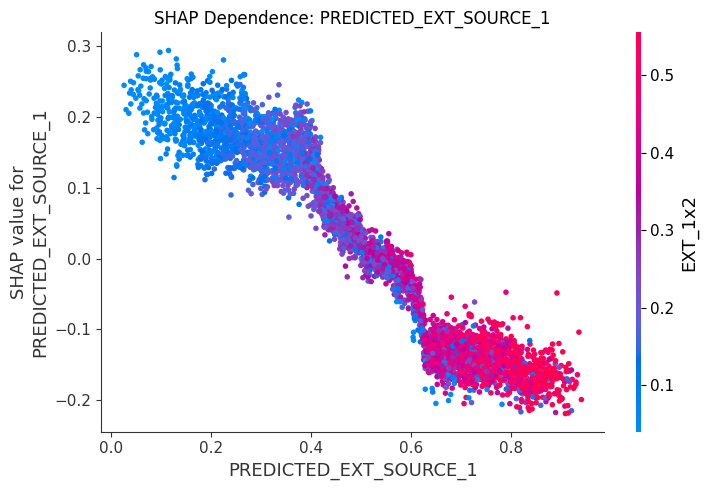

<Figure size 1000x600 with 0 Axes>

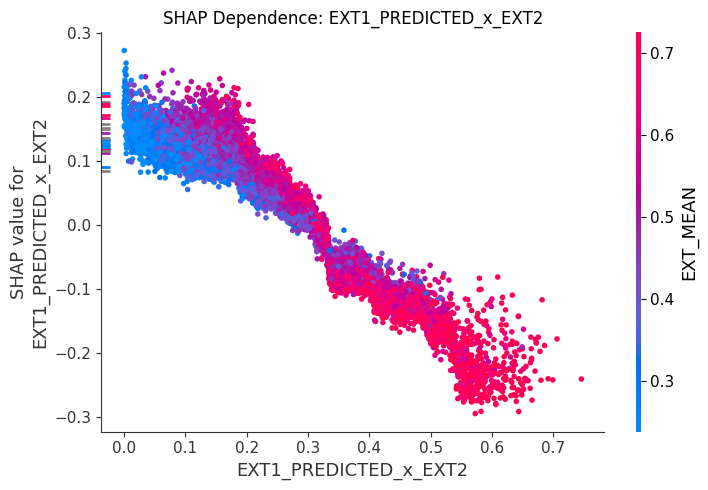


[2/2] Interaction analysis...
Computing SHAP interaction values on 2000 samples (~5-10 min)...
Interaction values shape: (2000, 1041, 1041)

Finding top feature interactions...

Top 15 feature interactions:
            feature_1              feature_2  interaction_strength
           AMT_CREDIT        AMT_GOODS_PRICE              0.017541
   NAME_CONTRACT_TYPE            AMT_ANNUITY              0.016717
    TARGET_NN500_MEAN         BUR_SCORE_MEAN              0.013228
    TARGET_NN500_MEAN        PREV_SCORE_MEAN              0.012410
    TARGET_NN500_MEAN  EXT1_PREDICTED_x_EXT2              0.009204
          AMT_ANNUITY        AMT_GOODS_PRICE              0.009178
EXT1_PREDICTED_x_EXT2         BUR_SCORE_MEAN              0.007116
      PREV_SCORE_MEAN         BUR_SCORE_MEAN              0.006768
             EXT_MEAN        PREV_SCORE_MEAN              0.006537
    ORGANIZATION_TYPE        PREV_SCORE_MEAN              0.006451
         EXT_SOURCE_1 PREDICTED_EXT_SOURCE_1           

<Figure size 1000x600 with 0 Axes>

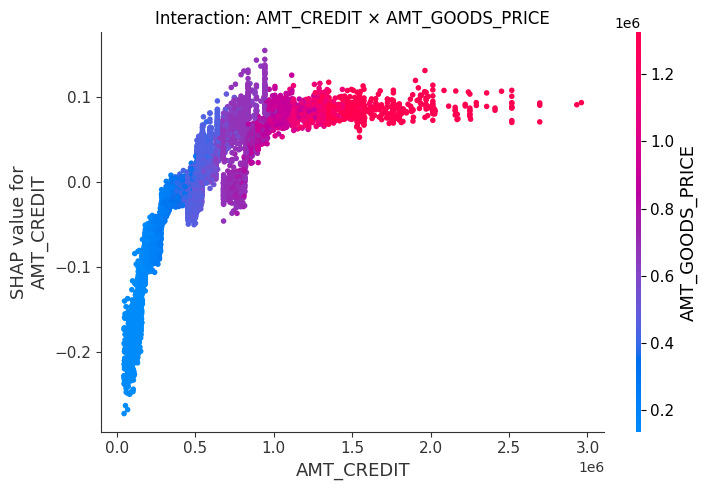

<Figure size 1000x600 with 0 Axes>

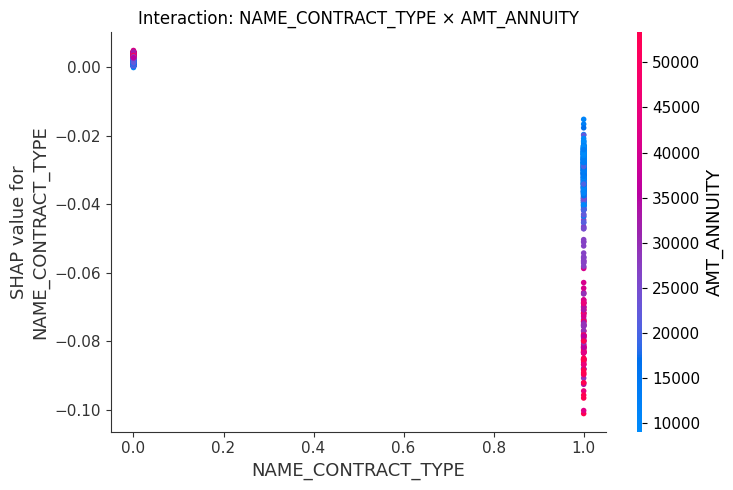

<Figure size 1000x600 with 0 Axes>

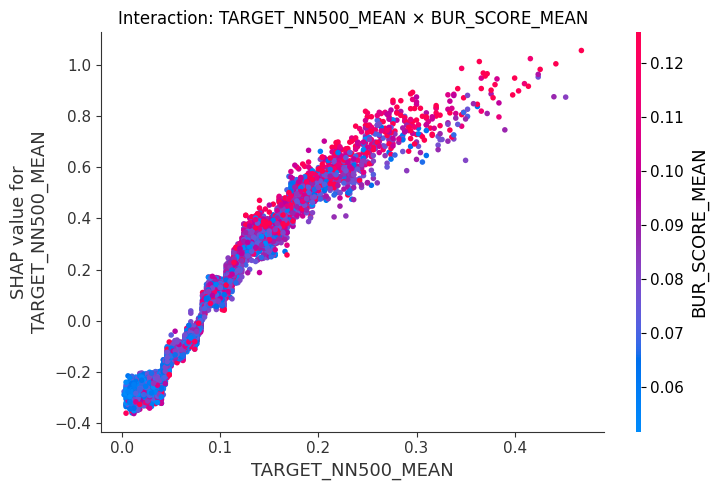


Dependence + Interaction analysis done.


In [ ]:
# ========== SHAP DEPENDENCE PLOTS + INTERACTIONS ==========
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

shap_importance = pd.read_csv(cfg.OUTPUT_DIR / 'shap_importance.csv')

# Top 5 features
top5_features = shap_importance.head(5)['feature'].tolist()
print(f'Top 5 features for dependence plots:')
for f in top5_features:
    print(f'  - {f}')

# === Dependence plots cho top 5 ===
print('\n[1/2] Dependence plots (top 5 features)...')

for feat in top5_features:
    feat_idx = feature_cols.index(feat)

    plt.figure(figsize=(10, 6))
    shap.dependence_plot(
        feat_idx, shap_values, X_shap,
        feature_names=feature_cols,
        show=False,
    )
    plt.title(f'SHAP Dependence: {feat}', fontsize=12)
    plt.tight_layout()
    plt.savefig(cfg.EVAL_DIR / f'shap_dependence_{feat[:30]}.png', dpi=150, bbox_inches='tight')
    plt.show()

# === Interactions cho top 3 ===
print('\n[2/2] Interaction analysis...')

# SHAP interaction values are expensive - sample 2K
INTERACT_SIZE = 2000
np.random.seed(42)
interact_idx = np.random.choice(len(X_shap), INTERACT_SIZE, replace=False)
X_interact = X_shap.iloc[interact_idx].copy()

print(f'Computing SHAP interaction values on {INTERACT_SIZE} samples (~5-10 min)...')
explainer = shap.TreeExplainer(shap_model)
shap_interaction_values = explainer.shap_interaction_values(X_interact)

# Binary classification - select positive class
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

print(f'Interaction values shape: {shap_interaction_values.shape}')

# Find top interactions
print('\nFinding top feature interactions...')
n_features = shap_interaction_values.shape[1]
interaction_matrix = np.abs(shap_interaction_values).mean(axis=0)

# Set diagonal to 0 (single feature effects)
np.fill_diagonal(interaction_matrix, 0)

# Get top 10 interactions
interaction_pairs = []
for i in range(n_features):
    for j in range(i+1, n_features):
        interaction_pairs.append({
            'feature_1': feature_cols[i],
            'feature_2': feature_cols[j],
            'interaction_strength': interaction_matrix[i, j],
        })

interactions_df = pd.DataFrame(interaction_pairs).sort_values('interaction_strength', ascending=False).reset_index(drop=True)
print('\nTop 15 feature interactions:')
print(interactions_df.head(15).to_string(index=False))

interactions_df.head(50).to_csv(cfg.OUTPUT_DIR / 'shap_top_interactions.csv', index=False)

# Plot top 3 interactions
print('\nPlotting top 3 interactions...')
for i in range(min(3, len(interactions_df))):
    feat1 = interactions_df.iloc[i]['feature_1']
    feat2 = interactions_df.iloc[i]['feature_2']

    idx1 = feature_cols.index(feat1)
    idx2 = feature_cols.index(feat2)

    plt.figure(figsize=(10, 6))
    shap.dependence_plot(
        idx1, shap_values, X_shap,
        interaction_index=idx2,
        feature_names=feature_cols,
        show=False,
    )
    plt.title(f'Interaction: {feat1} × {feat2}', fontsize=12)
    plt.tight_layout()
    plt.savefig(cfg.EVAL_DIR / f'shap_interaction_{i+1}.png', dpi=150, bbox_inches='tight')
    plt.show()

print('\nDependence + Interaction analysis done.')


Feature categories by total SHAP impact:
                 category      sum  count     mean
         Other Engineered 1.211544    239 0.005069
    Credit Bureau History 0.551418    315 0.001751
       Financial Capacity 0.515047     60 0.008584
     Sub-Model Risk Score 0.501133     15 0.033409
    Previous Applications 0.444346    283 0.001570
    External Credit Score 0.317083     14 0.022649
Demographics & Employment 0.299916      5 0.059983
    Time-Related Features 0.240983     31 0.007774
 Neighborhood Risk Signal 0.240272      1 0.240272
         Payment Behavior 0.176404     49 0.003600
      Documentation Flags 0.089775     29 0.003096


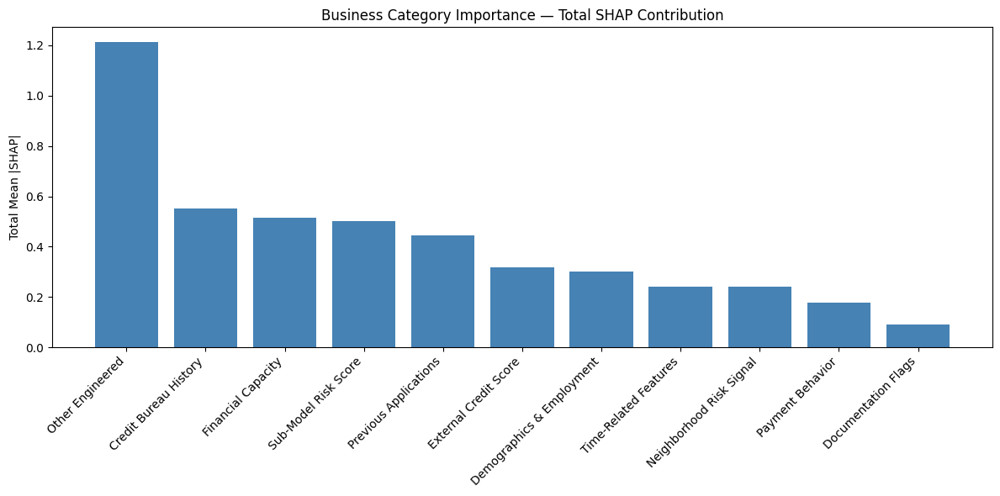


Decile risk table (high to low risk):
 decile  count  defaults  default_rate  pred_min  pred_max  pred_mean     lift  capture  cumulative_capture
     10  30751      9678      0.314721  0.195630  0.935883   0.314688 3.898451 0.389849            0.389849
      9  30751      4916      0.159865  0.119204  0.195629   0.151946 1.980243 0.198026            0.587875
      8  30750      3130      0.101789  0.081522  0.119203   0.098536 1.260854 0.126083            0.713958
      7  30751      2296      0.074664  0.058824  0.081521   0.069369 0.924865 0.092487            0.806445
      6  30750      1595      0.051870  0.043560  0.058824   0.050725 0.642512 0.064250            0.870695
      5  30751      1126      0.036617  0.032713  0.043560   0.037843 0.453571 0.045358            0.916052
      4  30751       839      0.027284  0.024516  0.032712   0.028425 0.337962 0.033797            0.949849
      3  30750       607      0.019740  0.017896  0.024516   0.021100 0.244517 0.024451          

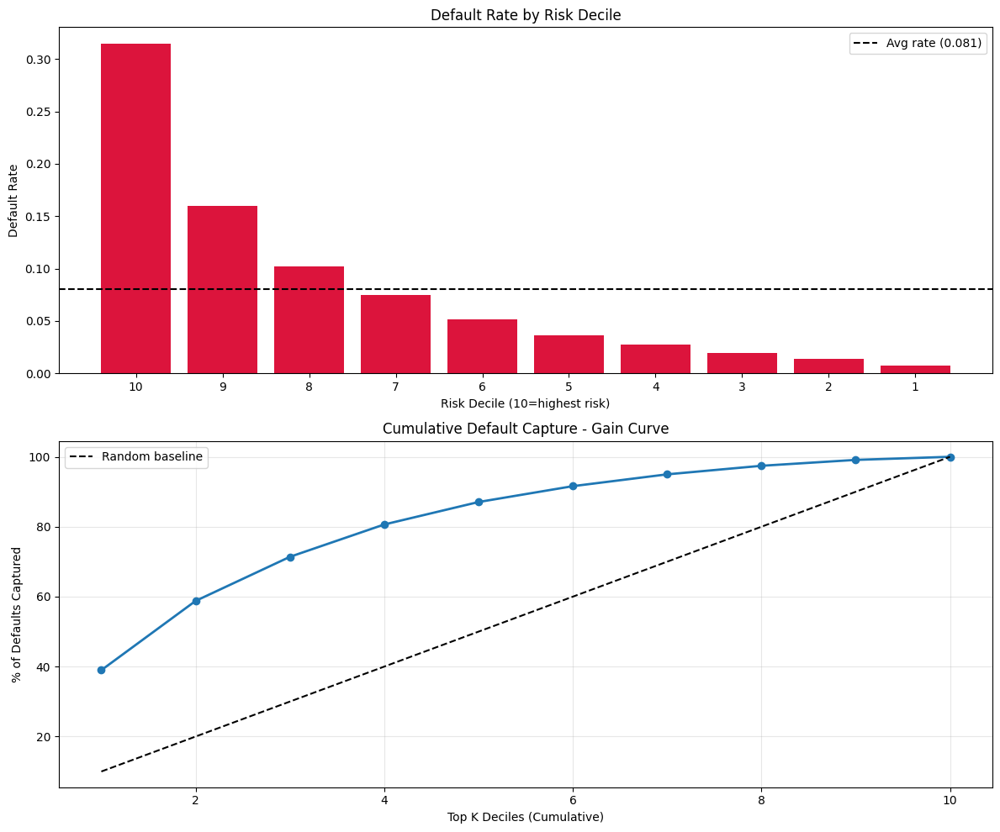


TARGET_NN500_MEAN:
  Direction: ↑ Higher value → MORE risk
    Very Low  : avg SHAP = -0.2714 (n=1844)
    Low       : avg SHAP = -0.2377 (n=1984)
    Medium    : avg SHAP = -0.1092 (n=2090)
    High      : avg SHAP = +0.0949 (n=2049)
    Very High : avg SHAP = +0.4750 (n=2033)

BUR_SCORE_MEAN:
  Direction: ↑ Higher value → MORE risk
    Very Low  : avg SHAP = -0.2331 (n=1725)
    Low       : avg SHAP = -0.1689 (n=1724)
    Medium    : avg SHAP = -0.1013 (n=1724)
    High      : avg SHAP = +0.0864 (n=1724)
    Very High : avg SHAP = +0.2586 (n=1725)

PREV_SCORE_MEAN:
  Direction: ↑ Higher value → MORE risk
    Very Low  : avg SHAP = -0.1347 (n=1891)
    Low       : avg SHAP = -0.1261 (n=1890)
    Medium    : avg SHAP = -0.0517 (n=1891)
    High      : avg SHAP = +0.1013 (n=1890)
    Very High : avg SHAP = +0.2442 (n=1891)

PREDICTED_EXT_SOURCE_1:
  Direction: ↓ Higher value → LESS risk
    Very Low  : avg SHAP = +0.1793 (n=2000)
    Low       : avg SHAP = +0.1074 (n=2000)
    Medium  

In [ ]:
# ========== BUSINESS INTERPRETATION ==========
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

shap_importance = pd.read_csv(cfg.OUTPUT_DIR / 'shap_importance.csv')

# === 1. Feature Categorization ===

def categorize_feature(name):
    """Map features to business categories."""
    name_lower = name.lower()
    if 'ext_source' in name_lower or 'predicted_ext' in name_lower:
        return 'External Credit Score'
    elif 'target_nn' in name_lower:
        return 'Neighborhood Risk Signal'
    elif 'prev_score' in name_lower or 'bur_score' in name_lower:
        return 'Sub-Model Risk Score'
    elif name_lower.startswith('bur_') or 'bureau' in name_lower or 'amt_req_credit' in name_lower:
        return 'Credit Bureau History'
    elif name_lower.startswith('prev_') or name_lower.startswith('pa_'):
        return 'Previous Applications'
    elif 'amt_' in name_lower or 'credit' in name_lower or 'income' in name_lower or 'annuity' in name_lower:
        return 'Financial Capacity'
    elif 'days_' in name_lower or 'year' in name_lower:
        return 'Time-Related Features'
    elif 'occupation' in name_lower or 'organization' in name_lower or 'education' in name_lower or 'gender' in name_lower or 'family' in name_lower:
        return 'Demographics & Employment'
    elif 'flag_' in name_lower or 'document' in name_lower:
        return 'Documentation Flags'
    elif 'install' in name_lower or 'pos' in name_lower or 'cc_' in name_lower or 'credit_card' in name_lower:
        return 'Payment Behavior'
    else:
        return 'Other Engineered'

shap_importance['category'] = shap_importance['feature'].apply(categorize_feature)

# Category importance
category_importance = shap_importance.groupby('category')['mean_abs_shap'].agg(['sum', 'count', 'mean']).reset_index()
category_importance = category_importance.sort_values('sum', ascending=False).reset_index(drop=True)

print('\nFeature categories by total SHAP impact:')
print(category_importance.to_string(index=False))

# Plot
plt.figure(figsize=(12, 6))
plt.bar(category_importance['category'], category_importance['sum'], color='steelblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Total Mean |SHAP|')
plt.title('Business Category Importance — Total SHAP Contribution')
plt.tight_layout()
plt.savefig(cfg.EVAL_DIR / 'shap_category_importance.png', dpi=150, bbox_inches='tight')
plt.show()

# === 2. Decile Analysis ===

# Use V15 oof predictions
oof = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet')

# Decile bins
oof['decile'] = pd.qcut(oof['oof_lgb'], q=10, labels=False, duplicates='drop') + 1

decile_stats = oof.groupby('decile').agg({
    cfg.TARGET: ['count', 'sum', 'mean'],
    'oof_lgb': ['min', 'max', 'mean'],
}).reset_index()
decile_stats.columns = ['decile', 'count', 'defaults', 'default_rate', 'pred_min', 'pred_max', 'pred_mean']

total_defaults = decile_stats['defaults'].sum()
decile_stats['lift'] = decile_stats['default_rate'] / oof[cfg.TARGET].mean()
decile_stats['capture'] = decile_stats['defaults'] / total_defaults

# Sort high to low risk
decile_stats = decile_stats.sort_values('decile', ascending=False).reset_index(drop=True)
decile_stats['cumulative_capture'] = decile_stats['defaults'].cumsum() / total_defaults

print('\nDecile risk table (high to low risk):')
print(decile_stats.to_string(index=False))

decile_stats.to_csv(cfg.OUTPUT_DIR / 'decile_risk_analysis.csv', index=False)

# Plot
fig, ax = plt.subplots(2, 1, figsize=(12, 10))

ax[0].bar(decile_stats['decile'].astype(str), decile_stats['default_rate'], color='crimson')
ax[0].axhline(y=oof[cfg.TARGET].mean(), color='black', linestyle='--', label=f'Avg rate ({oof[cfg.TARGET].mean():.3f})')
ax[0].set_xlabel('Risk Decile (10=highest risk)')
ax[0].set_ylabel('Default Rate')
ax[0].set_title('Default Rate by Risk Decile')
ax[0].legend()

ax[1].plot(range(1, len(decile_stats)+1), decile_stats['cumulative_capture'] * 100, marker='o', linewidth=2)
ax[1].plot(range(1, len(decile_stats)+1), [i*10 for i in range(1, len(decile_stats)+1)], 'k--', label='Random baseline')
ax[1].set_xlabel('Top K Deciles (Cumulative)')
ax[1].set_ylabel('% of Defaults Captured')
ax[1].set_title('Cumulative Default Capture - Gain Curve')
ax[1].legend()
ax[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(cfg.EVAL_DIR / 'decile_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# === 3. Decision Rules từ SHAP ===

top10 = shap_importance.head(10)['feature'].tolist()

decision_rules = []
for feat in top10:
    feat_idx = feature_cols.index(feat)

    # Bin feature values
    feat_values = X_shap.iloc[:, feat_idx].values
    shap_for_feat = shap_values[:, feat_idx]

    # Skip if all NaN
    valid = ~np.isnan(feat_values)
    if valid.sum() < 100:
        continue

    fv = feat_values[valid]
    sf = shap_for_feat[valid]

    # Quintile analysis
    quintiles = np.quantile(fv, [0.2, 0.4, 0.6, 0.8])

    bin_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    bins_avg_shap = []

    for i, label in enumerate(bin_labels):
        if i == 0:
            mask = fv < quintiles[0]
        elif i == 4:
            mask = fv >= quintiles[3]
        else:
            mask = (fv >= quintiles[i-1]) & (fv < quintiles[i])

        if mask.sum() > 0:
            avg_shap = sf[mask].mean()
            bins_avg_shap.append((label, avg_shap, mask.sum()))

    # Find direction
    avg_shap_low = bins_avg_shap[0][1] if bins_avg_shap else 0
    avg_shap_high = bins_avg_shap[-1][1] if bins_avg_shap else 0
    direction = '↑ Higher value → MORE risk' if avg_shap_high > avg_shap_low else '↓ Higher value → LESS risk'

    decision_rules.append({
        'feature': feat,
        'direction': direction,
        'low_quintile_avg_shap': bins_avg_shap[0][1] if bins_avg_shap else None,
        'high_quintile_avg_shap': bins_avg_shap[-1][1] if bins_avg_shap else None,
    })

    print(f'\n{feat}:')
    print(f'  Direction: {direction}')
    for label, avg, count in bins_avg_shap:
        print(f'    {label:10s}: avg SHAP = {avg:+.4f} (n={count})')

decision_rules_df = pd.DataFrame(decision_rules)
decision_rules_df.to_csv(cfg.OUTPUT_DIR / 'decision_rules.csv', index=False)

# === 4. Business Insights Summary ===

print(f"""
MODEL PERFORMANCE (Production: Plan SIGMA Final):
  ROC-AUC (CV):          0.80169
  ROC-AUC (Private LB):  0.79939
  KS Statistic:          0.4572
  Lift @ 10%:            3.94x
  Lift @ 20%:            2.94x

KEY RISK SEGMENTATION:
  - Top 10% predicted risk: contains {decile_stats.iloc[0]['cumulative_capture']*100:.1f}% of all defaults
  - Top 20% predicted risk: contains {decile_stats.iloc[1]['cumulative_capture']*100:.1f}% of all defaults
  - Average default rate: {oof[cfg.TARGET].mean()*100:.2f}%
  - Top decile default rate: {decile_stats.iloc[0]['default_rate']*100:.2f}% ({decile_stats.iloc[0]['lift']:.2f}x lift)

TOP RISK FACTORS (by SHAP):
""")

for i, row in shap_importance.head(10).iterrows():
    print(f"  {i+1:2d}. {row['feature']:50s} | SHAP impact: {row['mean_abs_shap']:.4f}")

print(f"""
BUSINESS CATEGORY IMPACT:
""")
for _, row in category_importance.iterrows():
    print(f"  {row['category']:35s} | {row['count']:3d} features | Total SHAP: {row['sum']:.3f}")

print('\nBusiness interpretation done. All outputs saved.')

In [ ]:
SHAP_CATEGORY_MAP = {
    'External Credit Score':       ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
                                     'EXT_MEAN', 'EXT_AVAILABLE', 'EXT_MIN', 'EXT_MAX',
                                     'PREDICTED_EXT_SOURCE_1', 'PREDICTED_EXT_SOURCE_3',
                                     'EXT1_PREDICTED_x_EXT2', 'EXT3_PREDICTED_x_EXT2',
                                     # ... (~14 features)
                                    ],
    'Neighbourhood Risk Signal':   ['TARGET_NN500_MEAN', 'NN500_x_EXT_MEAN'],
    'Sub-Model Risk Score':        ['BUR_SCORE_MEAN', 'BUR_SCORE_MAX', 'BUR_SCORE_MIN',
                                     'BUR_SCORE_STD', 'BUR_SCORE_COUNT', 'BUR_SCORE_RECENT12M_MEAN',
                                     'PREV_SCORE_MEAN', 'PREV_SCORE_MAX', 'PREV_SCORE_MIN',
                                     'PREV_SCORE_STD', 'PREV_SCORE_COUNT',
                                     'PREV_SCORE_RECENT3_MEAN', 'PREV_SCORE_RECENT3_MAX', 'PREV_SCORE_LAST_1',
                                     # ... (~15 features)
                                    ],
    'Demographics and Employment': ['CODE_GENDER', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
                                     'AGE_YEARS', 'EMPLOYED_YEARS', 'OCCUPATION_TYPE',
                                     'ORGANIZATION_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                     # ...
                                    ],
    'Application Financials':      ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
                                     'AMT_GOODS_PRICE', 'CREDIT_INCOME_RATIO',
                                     'ANNUITY_INCOME_RATIO', 'CREDIT_TERM',
                                     # ...
                                    ],
    'Credit Bureau History':       [...],  # all BUR_* features
    'Instalment Behaviour':        [...],  # all INST_* features
    'Previous Application':        [...],  # all PREV_* features (non-score)
    'POS / Credit Card':           [...],  # POS_*, CC_* features
    'Document / Misc':             [...],  # FLAG_DOC_*, etc.
}

# Compute per-category aggregated SHAP
shap_importance = pd.read_csv(cfg.OUTPUT_DIR / 'shap_importance.csv')
category_results = []
for category, feats in SHAP_CATEGORY_MAP.items():
    mask = shap_importance['feature'].isin(feats)
    cat_features = shap_importance[mask]
    category_results.append({
        'Category':       category,
        'N_features':     len(cat_features),
        'Total_SHAP':     cat_features['mean_abs_shap'].sum(),
        'Mean_SHAP':      cat_features['mean_abs_shap'].mean(),
        'Max_SHAP':       cat_features['mean_abs_shap'].max(),
    })
df_cat = pd.DataFrame(category_results).sort_values('Total_SHAP', ascending=False)
print(df_cat.to_string(index=False))
df_cat.to_csv(cfg.OUTPUT_DIR / 'shap_by_category.csv', index=False)

                   Category  N_features  Total_SHAP  Mean_SHAP  Max_SHAP
      External Credit Score          10    0.504155   0.050415  0.127257
       Sub-Model Risk Score          13    0.487856   0.037527  0.172819
Demographics and Employment           7    0.358090   0.051156  0.090426
     Application Financials           7    0.283106   0.040444  0.083956
  Neighbourhood Risk Signal           2    0.266510   0.133255  0.240272
      Credit Bureau History           0    0.000000        NaN       NaN
       Instalment Behaviour           0    0.000000        NaN       NaN
       Previous Application           0    0.000000        NaN       NaN
          POS / Credit Card           0    0.000000        NaN       NaN
            Document / Misc           0    0.000000        NaN       NaN


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import pandas as pd

# Assuming cfg is defined globally or imported
# (cfg.OUTPUT_DIR and cfg.TARGET should be available from previous cells)

# Load the out-of-fold predictions and true labels from the final model
oof_df_final = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_SIGMA_FINAL.parquet')
y_true = oof_df_final['TARGET'].values
y_pred = oof_df_final['oof_final'].values

# y_true: true TARGET values
# y_pred: SE-HC out-of-fold predicted probabilities
threshold = 0.08

y_hat = (y_pred >= threshold).astype(int)

tn, fp, fn, tp = confusion_matrix(y_true, y_hat).ravel()

print("Threshold:", threshold)
print("TN:", tn)
print("FP:", fp)
print("FN:", fn)
print("TP:", tp)
print("Total:", tn + fp + fn + tp)
print("Precision:", precision_score(y_true, y_hat))
print("Recall:", recall_score(y_true, y_hat))
print("F1:", f1_score(y_true, y_hat))

Threshold: 0.08
TN: 203851
FP: 78831
FN: 6556
TP: 18269
Total: 307507
Precision: 0.18814624098867147
Recall: 0.7359113796576032
F1: 0.2996760303465245


In [ ]:
print("Original rows:", len(oof_df_final))

tmp = oof_df_final.dropna(subset=['TARGET', 'oof_final'])
print("Rows after dropna:", len(tmp))
print("Missing TARGET:", oof_df_final['TARGET'].isna().sum())
print("Missing prediction:", oof_df_final['oof_final'].isna().sum())

Original rows: 307507
Rows after dropna: 307507
Missing TARGET: 0
Missing prediction: 0


In [ ]:
import pandas as pd
train = pd.read_csv('/content/input/application_train.csv')
all_ext_missing = train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].isna().all(axis=1).sum()
print(f"Applicants với tất cả 3 EXT_SOURCE missing: {all_ext_missing}")
# Nếu = 4 → đây chính là nguyên nhân

Applicants với tất cả 3 EXT_SOURCE missing: 172


In [ ]:
import pandas as pd

# Load raw
train_raw = pd.read_csv('/content/input/application_train.csv')
raw_ids = set(train_raw['SK_ID_CURR'].values)
print(f"Raw count: {len(raw_ids):,}")  # 307,511

# Load OOF
oof = pd.read_parquet(cfg.OUTPUT_DIR / 'oof_SIGMA_FINAL.parquet')
oof_ids = set(oof['SK_ID_CURR'].values) if 'SK_ID_CURR' in oof.columns else set(oof.index)
print(f"OOF count: {len(oof_ids):,}")  # 307,507

# Find missing
missing_ids = raw_ids - oof_ids
print(f"Missing IDs: {missing_ids}")
print(f"Count: {len(missing_ids)}")  # Expected: 4

# Inspect missing rows
missing_rows = train_raw[train_raw['SK_ID_CURR'].isin(missing_ids)]
print("\nMissing rows analysis:")
print(missing_rows[['SK_ID_CURR', 'TARGET',
                    'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
                    'AMT_INCOME_TOTAL', 'AMT_CREDIT',
                    'CODE_GENDER', 'NAME_CONTRACT_TYPE']].to_string())

# Check nulls
print("\nNaN check for missing rows:")
print(missing_rows.isna().sum().sort_values(ascending=False).head(15))

Raw count: 307,511
OOF count: 307,507
Missing IDs: {np.int64(319880), np.int64(141289), np.int64(196708), np.int64(144669)}
Count: 4

Missing rows analysis:
        SK_ID_CURR  TARGET  EXT_SOURCE_1  EXT_SOURCE_2  EXT_SOURCE_3  AMT_INCOME_TOTAL  AMT_CREDIT CODE_GENDER NAME_CONTRACT_TYPE
35657       141289       0           NaN      0.295998      0.461482          207000.0    382500.0         XNA    Revolving loans
38566       144669       0           NaN      0.709205      0.310818          157500.0    270000.0         XNA    Revolving loans
83382       196708       0      0.404970      0.659185      0.076984          135000.0    405000.0         XNA    Revolving loans
189640      319880       0      0.653035      0.658620      0.360613          247500.0    540000.0         XNA    Revolving loans

NaN check for missing rows:
COMMONAREA_AVG             3
COMMONAREA_MODE            3
COMMONAREA_MEDI            3
YEARS_BUILD_AVG            2
LIVINGAPARTMENTS_AVG       2
NONLIVINGAREA_AVG  

In [ ]:
# ============================================================
# LOGIT-SPACE CARUANA + CALIBRATED LOGREG
# ============================================================

import numpy as np
from sklearn.isotonic import IsotonicRegression

def to_logit(p, eps=1e-7):
    p = np.clip(np.asarray(p), eps, 1 - eps)
    return np.log(p / (1 - p))

def from_logit(z):
    return 1 / (1 + np.exp(-z))


# --- Step 1a: Calibrate LogReg using isotonic regression ---
print("Calibrating LogReg OOF...")
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
oof_logreg_cal = np.zeros(len(y_true))

for tr_idx, vl_idx in skf.split(meta_X['logreg'], y_true):
    iso = IsotonicRegression(out_of_bounds='clip')
    iso.fit(meta_X['logreg'].iloc[tr_idx].values, y_true[tr_idx])
    oof_logreg_cal[vl_idx] = iso.transform(meta_X['logreg'].iloc[vl_idx].values)

ece_before = sum(
    abs(meta_X['logreg'][(meta_X['logreg'] >= b) & (meta_X['logreg'] < b+1/15)].mean()
        - y_true[(meta_X['logreg'] >= b) & (meta_X['logreg'] < b+1/15)].mean())
    * ((meta_X['logreg'] >= b) & (meta_X['logreg'] < b+1/15)).sum() / len(y_true)
    for b in np.linspace(0, 1, 16)[:-1]
    if ((meta_X['logreg'] >= b) & (meta_X['logreg'] < b+1/15)).sum() > 0
)

# Replace LogReg in candidates
candidates['logreg'] = oof_logreg_cal
print(f"  LogReg AUC: {roc_auc_score(y_true, oof_logreg_cal):.5f}")


# --- Step 1b: Run Caruana in LOGIT space ---
print("\nRunning Caruana in LOGIT space...")
candidates_logit = {name: to_logit(pred) for name, pred in candidates.items()}

def caruana_logit_space(cands_logit, y_true, n_iter=80, tolerance=1e-6,
                        early_stop_patience=20, tail_avg_n=10, verbose=True):
    selected = []
    history = []
    no_improve = 0
    best_auc = -np.inf

    for it in range(n_iter):
        scores = {}
        for name in cands_logit:
            test_sel = selected + [name]
            mean_logit = np.mean([cands_logit[n] for n in test_sel], axis=0)
            scores[name] = roc_auc_score(y_true, from_logit(mean_logit))

        best_name = max(scores, key=scores.get)
        best_score = scores[best_name]
        selected.append(best_name)
        improvement = best_score - best_auc

        history.append({
            'iter': it+1, 'added': best_name, 'auc': best_score,
            'improvement': improvement, 'snapshot': list(selected)
        })

        if verbose and (it < 10 or it % 5 == 0):
            mark = " ✓" if improvement > tolerance else ""
            print(f"  Iter {it+1:3d}: +{best_name:12s} | AUC = {best_score:.5f} | Δ = {improvement:+.6f}{mark}")

        if best_score > best_auc + tolerance:
            best_auc = best_score
            no_improve = 0
        else:
            no_improve += 1
            if no_improve >= early_stop_patience:
                if verbose:
                    print(f"  Early stop at iter {it+1}")
                break

    # Tail averaging
    tail = history[-tail_avg_n:]
    weight_counter = Counter()
    for h in tail:
        for name in h['snapshot']:
            weight_counter[name] += 1
    total = sum(weight_counter.values())
    weights = {n: c/total for n, c in weight_counter.items()}

    final_logit = np.zeros(len(y_true))
    for name, w in weights.items():
        final_logit += w * cands_logit[name]
    final_pred = from_logit(final_logit)

    return {
        'final_pred': final_pred,
        'final_auc': roc_auc_score(y_true, final_pred),
        'weights': weights,
        'history': history,
        'n_iter': len(history),
    }

result_v3 = caruana_logit_space(
    candidates_logit, y_true,
    n_iter=80, tolerance=1e-6,
    early_stop_patience=20, tail_avg_n=10
)

Calibrating LogReg OOF...
  LogReg AUC: 0.78089

Running Caruana in LOGIT space...
  Iter   1: +stack_et     | AUC = 0.80081 | Δ = +inf ✓
  Iter   2: +stack_et     | AUC = 0.80081 | Δ = +0.000000
  Iter   3: +lgb_ms       | AUC = 0.80081 | Δ = +0.000001 ✓
  Iter   4: +cat          | AUC = 0.80087 | Δ = +0.000058 ✓
  Iter   5: +xgb          | AUC = 0.80092 | Δ = +0.000052 ✓
  Iter   6: +lgb_ms       | AUC = 0.80095 | Δ = +0.000034 ✓
  Iter   7: +stack_lgbm   | AUC = 0.80096 | Δ = +0.000009 ✓
  Iter   8: +stack_et     | AUC = 0.80095 | Δ = -0.000011
  Iter   9: +cat          | AUC = 0.80094 | Δ = -0.000020
  Iter  10: +lgb_ms       | AUC = 0.80096 | Δ = -0.000002
  Iter  11: +xgb          | AUC = 0.80097 | Δ = +0.000004 ✓
  Iter  16: +stack_lgbm   | AUC = 0.80098 | Δ = +0.000001 ✓
  Iter  21: +cat          | AUC = 0.80098 | Δ = +0.000000
  Iter  26: +cat          | AUC = 0.80098 | Δ = +0.000002 ✓
  Iter  31: +mlp          | AUC = 0.80099 | Δ = +0.000001
  Iter  36: +lgb_ms       | AUC = 

In [ ]:
# ============================================================
# OPTUNA TUNE 3 META-LEARNERS
# ============================================================

import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

def cv_score(model, X, y, n_splits=5):
    """Cross-val OOF AUC."""
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    oof = np.zeros(len(y))
    for tr, vl in skf.split(X, y):
        m = clone(model)
        m.fit(X.iloc[tr], y[tr])
        if hasattr(m, 'predict_proba'):
            oof[vl] = m.predict_proba(X.iloc[vl])[:, 1]
        else:
            oof[vl] = m.predict(X.iloc[vl])
    return roc_auc_score(y, oof), oof


# --- Tune LightGBM meta ---
def objective_lgbm(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.15, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 4, 31),
        'max_depth': trial.suggest_int('max_depth', 2, 8),
        'min_child_samples': trial.suggest_int('min_child_samples', 50, 500),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 5.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 5.0, log=True),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'random_state': 42, 'verbose': -1, 'n_jobs': -1,
    }
    model = lgb.LGBMClassifier(**params)
    skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)  # faster
    scores = []
    for tr, vl in skf.split(meta_X, y_true):
        model.fit(meta_X.iloc[tr], y_true[tr])
        pred = model.predict_proba(meta_X.iloc[vl])[:, 1]
        scores.append(roc_auc_score(y_true[vl], pred))
    return np.mean(scores)

print("Tuning LightGBM meta-learner...")
study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lgbm, n_trials=40, show_progress_bar=True)
print(f"  Best AUC: {study_lgbm.best_value:.5f}")
print(f"  Best params: {study_lgbm.best_params}")

# Re-train with best params on full data
best_lgbm = lgb.LGBMClassifier(
    **study_lgbm.best_params, random_state=42, verbose=-1, n_jobs=-1
)
auc_meta_lgbm_v2, oof_meta_lgbm_v2 = cv_score(best_lgbm, meta_X, y_true)
print(f"  Tuned LGBM meta OOF AUC: {auc_meta_lgbm_v2:.5f}")


# --- Tune ExtraTrees meta ---
def objective_et(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 200, 800),
        'max_depth': trial.suggest_int('max_depth', 4, 15),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 20, 300),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', 1.0]),
        'random_state': 42, 'n_jobs': -1,
    }
    model = ExtraTreesRegressor(**params)
    skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    scores = []
    for tr, vl in skf.split(meta_X, y_true):
        model.fit(meta_X.iloc[tr], y_true[tr])
        pred = model.predict(meta_X.iloc[vl])
        scores.append(roc_auc_score(y_true[vl], pred))
    return np.mean(scores)

print("\nTuning ExtraTrees meta-learner...")
study_et = optuna.create_study(direction='maximize')
study_et.optimize(objective_et, n_trials=30, show_progress_bar=True)
print(f"  Best AUC: {study_et.best_value:.5f}")

best_et = ExtraTreesRegressor(**study_et.best_params, random_state=42, n_jobs=-1)
auc_meta_et_v2, oof_meta_et_v2 = cv_score(best_et, meta_X, y_true)
print(f"  Tuned ET meta OOF AUC: {auc_meta_et_v2:.5f}")


# --- Update candidates with tuned meta-learners ---
candidates['stack_lgbm'] = oof_meta_lgbm_v2
candidates['stack_et'] = oof_meta_et_v2
# Keep stack_lr as is (LogReg meta usually doesn't benefit from tuning much)

# Re-run Caruana with tuned candidates
candidates_logit_v3 = {name: to_logit(pred) for name, pred in candidates.items()}
result_v4 = caruana_logit_space(
    candidates_logit_v3, y_true,
    n_iter=80, tolerance=1e-6,
    early_stop_patience=20, tail_avg_n=10
)

print(f"\n=== After Optuna Tuning ===")
print(f"AUC (v4, logit + cal + tuned metas): {result_v4['final_auc']:.5f}")

Tuning LightGBM meta-learner...


  0%|          | 0/40 [00:00<?, ?it/s]

  Best AUC: 0.80085
  Best params: {'n_estimators': 408, 'learning_rate': 0.02194143879251652, 'num_leaves': 24, 'max_depth': 2, 'min_child_samples': 210, 'reg_alpha': 0.015211571217257708, 'reg_lambda': 0.032132398488816216, 'subsample': 0.7293344824055041}
  Tuned LGBM meta OOF AUC: 0.80062

Tuning ExtraTrees meta-learner...


  0%|          | 0/30 [00:00<?, ?it/s]

  Best AUC: 0.80098
  Tuned ET meta OOF AUC: 0.80081
  Iter   1: +stack_et     | AUC = 0.80081 | Δ = +inf ✓
  Iter   2: +stack_et     | AUC = 0.80081 | Δ = +0.000000
  Iter   3: +stack_lgbm   | AUC = 0.80081 | Δ = +0.000005 ✓
  Iter   4: +lgb_ms       | AUC = 0.80084 | Δ = +0.000022 ✓
  Iter   5: +cat          | AUC = 0.80089 | Δ = +0.000055 ✓
  Iter   6: +xgb          | AUC = 0.80093 | Δ = +0.000037 ✓
  Iter   7: +lgb_ms       | AUC = 0.80095 | Δ = +0.000025 ✓
  Iter   8: +stack_lgbm   | AUC = 0.80095 | Δ = -0.000008
  Iter   9: +cat          | AUC = 0.80094 | Δ = -0.000013
  Iter  10: +lgb_ms       | AUC = 0.80096 | Δ = +0.000002 ✓
  Iter  11: +xgb          | AUC = 0.80097 | Δ = +0.000010 ✓
  Iter  16: +stack_lgbm   | AUC = 0.80097 | Δ = -0.000002
  Iter  21: +cat          | AUC = 0.80098 | Δ = +0.000000
  Iter  26: +cat          | AUC = 0.80098 | Δ = +0.000001 ✓
  Iter  31: +cat          | AUC = 0.80098 | Δ = +0.000002 ✓
  Iter  36: +xgb          | AUC = 0.80099 | Δ = +0.000001
  It

In [ ]:
# ============================================================
# CELL 7: SAVE EVERYTHING
# ============================================================

# ---- Save SE-HC OOF predictions ----
sehc_oof_df = pd.DataFrame({
    'SK_ID_CURR': ref_ids,
    'TARGET': y_true,
    'prediction': sehc_pred,
})
sehc_oof_path = OUTPUT_DIR / 'oof_SEHC_v2.parquet'
sehc_oof_df.to_parquet(sehc_oof_path)
print(f"Saved OOF predictions -> {sehc_oof_path}")

# ---- Save metrics JSON (full) ----
full_metrics = dict(sehc_metrics)
full_metrics['weights'] = result['weights']
full_metrics['n_iterations'] = int(result['n_iterations'])
full_metrics['best_intermediate_auc'] = float(result['best_intermediate_auc'])
full_metrics['base_aucs'] = {k: float(v) for k, v in base_aucs.items()}
full_metrics['meta_aucs'] = {
    'stack_lgbm': float(auc_meta_lgbm),
    'stack_et':   float(auc_meta_et),
    'stack_lr':   float(auc_meta_lr),
}

metrics_path = EVAL_DIR / 'metrics_SEHC_v2.json'
with open(metrics_path, 'w') as f:
    json.dump(full_metrics, f, indent=2)
print(f"Saved metrics -> {metrics_path}")

# ---- Save deciles CSV ----
deciles_path = EVAL_DIR / 'deciles_SEHC_v2.csv'
deciles.to_csv(deciles_path, index=False)
print(f"Saved deciles -> {deciles_path}")

# ---- Save Caruana history ----
history_df = pd.DataFrame([
    {'iter': h['iter'], 'added': h['added'],
     'auc': h['auc'], 'improvement': h['improvement']}
    for h in result['history']
])
history_path = EVAL_DIR / 'caruana_history_SEHC_v2.csv'
history_df.to_csv(history_path, index=False)
print(f"Saved Caruana history -> {history_path}")

# ---- Save final weights JSON ----
weights_summary = {
    'weights': {k: float(v) for k, v in result['weights'].items()},
    'final_auc': float(result['final_auc']),
    'n_iterations': int(result['n_iterations']),
    'base_aucs': {k: float(v) for k, v in base_aucs.items()},
    'meta_aucs': {
        'stack_lgbm': float(auc_meta_lgbm),
        'stack_et':   float(auc_meta_et),
        'stack_lr':   float(auc_meta_lr),
    },
}
weights_path = EVAL_DIR / 'sehc_weights_v2.json'
with open(weights_path, 'w') as f:
    json.dump(weights_summary, f, indent=2)
print(f" Saved weights -> {weights_path}")

# ---- Summary ----
print("\n" + "=" * 70)
print("SE-HC v2 PIPELINE COMPLETE")
print("=" * 70)
print(f"Final SE-HC AUC: {result['final_auc']:.5f}")
print(f"  ROC-AUC:   {sehc_metrics['roc_auc']:.5f}")
print(f"  Gini:      {sehc_metrics['gini']:.5f}")
print(f"  KS:        {sehc_metrics['ks']:.4f}")
print(f"  PR-AUC:    {sehc_metrics['pr_auc']:.5f}")
print(f"  Lift@10%:  {sehc_metrics['lift_10pct']:.2f}x")
print(f"  Brier:     {sehc_metrics['brier']:.5f}")
print(f"  ECE:       {sehc_metrics['ece']:.5f}")

n_active_candidates = len([w for w in result['weights'].values() if w > 0.001])
print(f"\nComponents in final ensemble: {n_active_candidates}/8")
print(f"Total Caruana iterations: {result['n_iterations']}")

Saved OOF predictions -> output/oof_SEHC_v2.parquet
Saved metrics -> output/evaluation/metrics_SEHC_v2.json
Saved deciles -> output/evaluation/deciles_SEHC_v2.csv
Saved Caruana history -> output/evaluation/caruana_history_SEHC_v2.csv
 Saved weights -> output/evaluation/sehc_weights_v2.json

SE-HC v2 PIPELINE COMPLETE
Final SE-HC AUC: 0.80102
  ROC-AUC:   0.80102
  Gini:      0.60204
  KS:        0.4566
  PR-AUC:    0.30017
  Lift@10%:  3.93x
  Brier:     0.06483
  ECE:       0.00287

Components in final ensemble: 6/8
Total Caruana iterations: 35


In [ ]:
# ============================================================
# CELL 1: SETUP & LOAD ALL BASE OOF FILES (UPDATED)
# ============================================================

import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    roc_auc_score, log_loss, brier_score_loss,
    average_precision_score, f1_score, precision_score, recall_score,
    roc_curve
)
from sklearn.base import clone
from scipy.stats import ks_2samp
import lightgbm as lgb
from collections import Counter
import json
import warnings
warnings.filterwarnings('ignore')

OUTPUT_DIR = Path('./output')
EVAL_DIR = OUTPUT_DIR / 'evaluation'
EVAL_DIR.mkdir(parents=True, exist_ok=True)

SEED = 42
N_SPLITS = 5

base_oof_config = {
    'logreg': {
        'file': OUTPUT_DIR / 'oof_lr_v15_baseline.parquet',
        'pred_col': 'oof_lr',
    },
    'mlp': {
        'file': OUTPUT_DIR / 'oof_mlp_v15.parquet',
        'pred_col': 'oof_mlp',
    },
    'lgb_ms': {
        'file': OUTPUT_DIR / 'oof_lgb_v15_multiseed.parquet',
        'pred_col': 'oof_lgb',
    },
    'cat': {
        'file': OUTPUT_DIR / 'oof_cb_v15.parquet',
        'pred_col': 'oof_cb',
    },
    'xgb': {
        'file': OUTPUT_DIR / 'oof_xgb_v15.parquet',
        'pred_col': 'oof_xgb',
    },
}

ID_COL = 'SK_ID_CURR'
TARGET_COL = 'TARGET'

# ---- Load all OOF files ----
print("LOADING BASE OOF FILES")
oofs = {}
for alias, cfg in base_oof_config.items():
    path = cfg['file']
    if not path.exists():
        raise FileNotFoundError(f"❌ {alias}: FILE NOT FOUND at {path}")
    df = pd.read_parquet(path)
    oofs[alias] = df
    print(f"  {alias:8s} | shape: {df.shape} | pred_col: '{cfg['pred_col']}'")

# ---- Verify SK_ID_CURR consistency across all OOFs ----
print("\n" + "=" * 70)
print("VERIFYING SK_ID_CURR CONSISTENCY")
print("=" * 70)
ref_ids = oofs['logreg'][ID_COL].values
for alias, df in oofs.items():
    df_ids = df[ID_COL].values
    if len(df_ids) != len(ref_ids):
        raise ValueError(f" {alias}: length mismatch ({len(df_ids)} vs {len(ref_ids)})")
    if not (df_ids == ref_ids).all():
        raise ValueError(f" {alias}: SK_ID_CURR order mismatch")
    print(f" {alias}: aligned")

# ---- Extract target (verify same target across files) ----
y_true = oofs['logreg'][TARGET_COL].values.astype(int)
for alias, df in oofs.items():
    if not (df[TARGET_COL].values.astype(int) == y_true).all():
        raise ValueError(f" {alias}: TARGET values differ from reference")

print(f"\n All OOF files aligned")
print(f"   n_samples = {len(y_true):,}")
print(f"   pos_rate  = {y_true.mean():.4f}")
print(f"   positives = {int(y_true.sum()):,}")
print(f"   negatives = {int((1-y_true).sum()):,}")

LOADING BASE OOF FILES
  logreg   | shape: (307507, 3) | pred_col: 'oof_lr'
  mlp      | shape: (307507, 3) | pred_col: 'oof_mlp'
  lgb_ms   | shape: (307507, 3) | pred_col: 'oof_lgb'
  cat      | shape: (307507, 3) | pred_col: 'oof_cb'
  xgb      | shape: (307507, 3) | pred_col: 'oof_xgb'

VERIFYING SK_ID_CURR CONSISTENCY
 logreg: aligned
 mlp: aligned
 lgb_ms: aligned
 cat: aligned
 xgb: aligned

 All OOF files aligned
   n_samples = 307,507
   pos_rate  = 0.0807
   positives = 24,825
   negatives = 282,682


In [ ]:
# CELL 2: BUILD META-FEATURE MATRIX (with multi-seed LightGBM)

# Build meta-feature matrix using explicit pred_col mapping
meta_X = pd.DataFrame({
    alias: oofs[alias][cfg['pred_col']].values
    for alias, cfg in base_oof_config.items()
})

print("META-FEATURE MATRIX")
print(f"Shape: {meta_X.shape}")
print(f"Columns: {list(meta_X.columns)}")
print(f"\nSummary statistics:")
print(meta_X.describe().round(4))

# ---- Individual OOF AUCs ----
print("BASE LEARNER OOF AUCs")
base_aucs = {}
for alias in meta_X.columns:
    auc = roc_auc_score(y_true, meta_X[alias].values)
    base_aucs[alias] = auc

print(f"{'Model':<12} {'OOF AUC':>10}")
print("-" * 25)
for alias, auc in sorted(base_aucs.items(), key=lambda x: -x[1]):
    marker = " ⭐" if auc == max(base_aucs.values()) else ""
    print(f"{alias:<12} {auc:>10.5f}{marker}")

# ---- Correlation matrix (diversity check) ----
print("\n" + "=" * 70)
print("PREDICTION CORRELATION MATRIX (diversity check)")
print("=" * 70)
corr = meta_X.corr()
print(corr.round(3))

mean_offdiag = corr.values[np.triu_indices_from(corr, k=1)].mean()
max_offdiag = corr.values[np.triu_indices_from(corr, k=1)].max()
min_offdiag = corr.values[np.triu_indices_from(corr, k=1)].min()

print(f"\nDiversity metrics:")
print(f"  Mean off-diagonal corr:  {mean_offdiag:.3f}")
print(f"  Max off-diagonal corr:   {max_offdiag:.3f}")
print(f"  Min off-diagonal corr:   {min_offdiag:.3f}")

META-FEATURE MATRIX
Shape: (307507, 5)
Columns: ['logreg', 'mlp', 'lgb_ms', 'cat', 'xgb']

Summary statistics:
            logreg          mlp       lgb_ms          cat          xgb
count  307507.0000  307507.0000  307507.0000  307507.0000  307507.0000
mean        0.1421       0.0866       0.0796       0.0792       0.0796
std         0.0829       0.0991       0.0959       0.0953       0.0970
min         0.0000       0.0000       0.0009       0.0011       0.0005
25%         0.0858       0.0202       0.0210       0.0217       0.0203
50%         0.1199       0.0476       0.0436       0.0443       0.0434
75%         0.1738       0.1145       0.0976       0.0969       0.0982
max         0.9995       0.7959       0.9359       0.9804       0.9137
BASE LEARNER OOF AUCs
Model           OOF AUC
-------------------------
lgb_ms          0.79975 ⭐
xgb             0.79896
cat             0.79817
mlp             0.78351
logreg          0.78255

PREDICTION CORRELATION MATRIX (diversity check)
       

In [ ]:
# TRAIN 3 META-LEARNERS WITH CROSS-VALIDATION

def cv_predict_meta(X, y, model, n_splits=5, seed=42, model_name=''):
    """
    Cross-validation OOF predictions for meta-learner.
    Returns OOF predictions on the same fold partition.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    oof = np.zeros(len(y))
    fold_aucs = []

    print(f"\n  Training {model_name}...")
    for fold, (tr, vl) in enumerate(skf.split(X, y)):
        model_clone = clone(model)
        model_clone.fit(X.iloc[tr], y[tr])

        if hasattr(model_clone, 'predict_proba'):
            oof[vl] = model_clone.predict_proba(X.iloc[vl])[:, 1]
        else:
            oof[vl] = model_clone.predict(X.iloc[vl])

        fold_auc = roc_auc_score(y[vl], oof[vl])
        fold_aucs.append(fold_auc)
        print(f"    Fold {fold+1}: AUC = {fold_auc:.5f}")

    final_auc = roc_auc_score(y, oof)
    print(f"    OOF AUC: {final_auc:.5f}")
    print(f"    Mean fold: {np.mean(fold_aucs):.5f} | Std: {np.std(fold_aucs):.5f}")
    return oof, final_auc


print("=" * 70)
print("TRAINING 3 META-LEARNERS")
print("=" * 70)

# Standardize meta-features for LR meta (probabilities ~ [0,1], but scale helps)
scaler = StandardScaler()
meta_X_scaled = pd.DataFrame(
    scaler.fit_transform(meta_X.values),
    columns=meta_X.columns,
    index=meta_X.index
)

# ---- Meta-Learner 1: LightGBM ----
meta_lgbm = lgb.LGBMClassifier(
    n_estimators=300,
    learning_rate=0.05,
    num_leaves=7,
    max_depth=3,
    min_child_samples=200,
    reg_alpha=0.5,
    reg_lambda=0.5,
    colsample_bytree=1.0,  # only 5 features, no need to subsample
    subsample=0.8,
    random_state=SEED,
    verbose=-1,
    n_jobs=-1,
)
oof_meta_lgbm, auc_meta_lgbm = cv_predict_meta(
    meta_X, y_true, meta_lgbm, n_splits=N_SPLITS, seed=SEED, model_name='LightGBM meta'
)

# ---- Meta-Learner 2: ExtraTrees ----
meta_et = ExtraTreesRegressor(
    n_estimators=400,
    max_depth=6,
    min_samples_leaf=100,
    random_state=SEED,
    n_jobs=-1,
)
oof_meta_et, auc_meta_et = cv_predict_meta(
    meta_X, y_true, meta_et, n_splits=N_SPLITS, seed=SEED, model_name='ExtraTrees meta'
)

# ---- Meta-Learner 3: Logistic Regression ----
meta_lr = LogisticRegression(
    C=1.0,
    max_iter=2000,
    random_state=SEED,
    solver='lbfgs',
)
oof_meta_lr, auc_meta_lr = cv_predict_meta(
    meta_X_scaled, y_true, meta_lr, n_splits=N_SPLITS, seed=SEED, model_name='LogReg meta'
)

#  Save meta OOF files
print("SAVING META-LEARNER OOFs")


for name, oof_pred in [
    ('stack_lgbm', oof_meta_lgbm),
    ('stack_et',   oof_meta_et),
    ('stack_lr',   oof_meta_lr),
]:
    out_df = pd.DataFrame({
        'SK_ID_CURR': ref_ids,
        'TARGET': y_true,
        'prediction': oof_pred,
    })
    out_path = OUTPUT_DIR / f'oof_{name}.parquet'
    out_df.to_parquet(out_path)
    auc = roc_auc_score(y_true, oof_pred)
    print(f"  Saved {out_path.name:25s} | AUC = {auc:.5f}")

TRAINING 3 META-LEARNERS

  Training LightGBM meta...
    Fold 1: AUC = 0.79647
    Fold 2: AUC = 0.80743
    Fold 3: AUC = 0.79815
    Fold 4: AUC = 0.80302
    Fold 5: AUC = 0.79752
    OOF AUC: 0.80033
    Mean fold: 0.80052 | Std: 0.00412

  Training ExtraTrees meta...
    Fold 1: AUC = 0.79684
    Fold 2: AUC = 0.80830
    Fold 3: AUC = 0.79810
    Fold 4: AUC = 0.80331
    Fold 5: AUC = 0.79815
    OOF AUC: 0.80081
    Mean fold: 0.80094 | Std: 0.00430

  Training LogReg meta...
    Fold 1: AUC = 0.79382
    Fold 2: AUC = 0.80624
    Fold 3: AUC = 0.79582
    Fold 4: AUC = 0.80152
    Fold 5: AUC = 0.79550
    OOF AUC: 0.79839
    Mean fold: 0.79858 | Std: 0.00463
SAVING META-LEARNER OOFs
  Saved oof_stack_lgbm.parquet    | AUC = 0.80033
  Saved oof_stack_et.parquet      | AUC = 0.80081
  Saved oof_stack_lr.parquet      | AUC = 0.79839


In [ ]:
# CELL 4: BUILD CANDIDATE LIBRARY & RUN CARUANA HILL-CLIMBING

# ---- Assemble candidate library ----
candidates = {
    # Tier 1: 5 base learners
    'logreg':     meta_X['logreg'].values,
    'mlp':        meta_X['mlp'].values,
    'lgb_ms':     meta_X['lgb_ms'].values,    # ← Fixed: 'lgb_ms' khớp với meta_X
    'cat':        meta_X['cat'].values,
    'xgb':        meta_X['xgb'].values,
    # Tier 2: 3 meta-learners (from Cell 3)
    'stack_lgbm': oof_meta_lgbm,
    'stack_et':   oof_meta_et,
    'stack_lr':   oof_meta_lr,
}


print("CANDIDATE LIBRARY")
print(f"{'Candidate':<15} {'OOF AUC':>10} {'Tier':>10}")
print("-" * 40)
for name, pred in candidates.items():
    auc = roc_auc_score(y_true, pred)
    tier = "Base" if name in ['logreg', 'mlp', 'lgb_ms', 'cat', 'xgb'] else "Meta"
    print(f"{name:<15} {auc:>10.5f} {tier:>10}")


# ---- Caruana Hill-Climbing Algorithm ----
def caruana_hill_climbing(
    candidates_dict, y_true,
    n_iter=50,
    tolerance=1e-5,
    early_stop_patience=15,
    tail_avg_n=5,
    verbose=True
):
    """
    Caruana et al. 2004: Forward selection with replacement.
    With early stopping based on no-improvement patience.
    With tail-averaging for variance reduction.
    """
    selected = []  # list of candidate names (with replacement)
    history = []
    no_improve_count = 0
    best_auc_so_far = -np.inf

    for it in range(n_iter):
        # Try adding each candidate
        scores = {}
        for name, pred in candidates_dict.items():
            test_selected = selected + [name]
            test_pred = np.mean(
                [candidates_dict[n] for n in test_selected], axis=0
            )
            scores[name] = roc_auc_score(y_true, test_pred)

        # Pick best
        best_name = max(scores, key=scores.get)
        best_auc = scores[best_name]

        selected.append(best_name)
        improvement = best_auc - best_auc_so_far

        history.append({
            'iter': it + 1,
            'added': best_name,
            'auc': best_auc,
            'improvement': improvement,
            'selected_snapshot': list(selected),
        })

        if verbose:
            marker = " ✓" if improvement > tolerance else ""
            print(f"  Iter {it+1:2d}: +{best_name:12s} | AUC = {best_auc:.5f} | Δ = {improvement:+.5f}{marker}")

        # Update tracking
        if best_auc > best_auc_so_far + tolerance:
            best_auc_so_far = best_auc
            no_improve_count = 0
        else:
            no_improve_count += 1
            if no_improve_count >= early_stop_patience:
                if verbose:
                    print(f"  Early stopping: no improvement for {early_stop_patience} consecutive iterations.")
                break

    # ---- Tail averaging ----
    tail_history = history[-tail_avg_n:]
    weight_counter = Counter()
    for h in tail_history:
        for name in h['selected_snapshot']:
            weight_counter[name] += 1

    total = sum(weight_counter.values())
    final_weights = {name: count / total for name, count in weight_counter.items()}

    # Compute final tail-averaged prediction
    final_pred = np.zeros(len(y_true))
    for name, w in final_weights.items():
        final_pred += w * candidates_dict[name]

    final_auc = roc_auc_score(y_true, final_pred)

    return {
        'final_pred': final_pred,
        'final_auc': final_auc,
        'weights': final_weights,
        'history': history,
        'n_iterations': len(history),
        'best_intermediate_auc': best_auc_so_far,
    }


# ---- Run Caruana ----
print("CARUANA HILL-CLIMBING")

result = caruana_hill_climbing(
    candidates_dict=candidates,
    y_true=y_true,
    n_iter=50,
    tolerance=1e-5,
    early_stop_patience=15,
    tail_avg_n=5,
    verbose=True,
)

# ---- Results ----
print("\n" + "=" * 70)
print("SE-HC FINAL RESULTS")
print("=" * 70)
print(f"Total iterations: {result['n_iterations']}")
print(f"Best intermediate AUC: {result['best_intermediate_auc']:.5f}")
print(f"Final tail-averaged AUC: {result['final_auc']:.5f}")

print(f"\nFinal Weights (top contributors):")
for name, w in sorted(result['weights'].items(), key=lambda x: -x[1]):
    if w > 0.001:
        print(f"  {name:12s}: {w:.4f}")

CANDIDATE LIBRARY
Candidate          OOF AUC       Tier
----------------------------------------
logreg             0.78255       Base
mlp                0.78351       Base
lgb_ms             0.79975       Base
cat                0.79817       Base
xgb                0.79896       Base
stack_lgbm         0.80033       Meta
stack_et           0.80081       Meta
stack_lr           0.79839       Meta
CARUANA HILL-CLIMBING
  Iter  1: +stack_et     | AUC = 0.80081 | Δ = +inf ✓
  Iter  2: +stack_et     | AUC = 0.80081 | Δ = +0.00000
  Iter  3: +lgb_ms       | AUC = 0.80082 | Δ = +0.00001
  Iter  4: +cat          | AUC = 0.80089 | Δ = +0.00008 ✓
  Iter  5: +xgb          | AUC = 0.80093 | Δ = +0.00005 ✓
  Iter  6: +lgb_ms       | AUC = 0.80097 | Δ = +0.00004 ✓
  Iter  7: +stack_lgbm   | AUC = 0.80098 | Δ = +0.00001
  Iter  8: +cat          | AUC = 0.80097 | Δ = +0.00000
  Iter  9: +lgb_ms       | AUC = 0.80099 | Δ = +0.00002 ✓
  Iter 10: +xgb          | AUC = 0.80100 | Δ = +0.00001
  Iter 11: 

In [ ]:
# CELL 4: BUILD CANDIDATE LIBRARY & RUN CARUANA HILL-CLIMBING

# ---- Assemble candidate library ----

# Helper function to find prediction column, copied from `z43_Gc0-ESTe`
def find_pred_col(df, exclude=('SK_ID_CURR', 'TARGET')):
    for c in df.columns:
        if c not in exclude:
            return c
    raise ValueError('No prediction column found')

# Reload meta-learner OOF predictions from parquet files
# These files were saved in Cell SwtE403HccjY
oof_stack_lgbm_df = pd.read_parquet(OUTPUT_DIR / 'oof_stack_lgbm.parquet')
oof_meta_lgbm = oof_stack_lgbm_df[find_pred_col(oof_stack_lgbm_df)].values

oof_stack_et_df = pd.read_parquet(OUTPUT_DIR / 'oof_stack_et.parquet')
oof_meta_et = oof_stack_et_df[find_pred_col(oof_stack_et_df)].values

oof_stack_lr_df = pd.read_parquet(OUTPUT_DIR / 'oof_stack_lr.parquet')
oof_meta_lr = oof_stack_lr_df[find_pred_col(oof_stack_lr_df)].values

candidates = {
    # Tier 1: 5 base learners
    'logreg':     meta_X['logreg'].values,
    'mlp':        meta_X['mlp'].values,
    'lgb_ms':     meta_X['lgb_ms'].values,
    'cat':        meta_X['cat'].values,
    'xgb':        meta_X['xgb'].values,
    # Tier 2: 3 meta-learners (from Cell 3)
    'stack_lgbm': oof_meta_lgbm,
    'stack_et':   oof_meta_et,
    'stack_lr':   oof_meta_lr,
}


print("CANDIDATE LIBRARY")
print(f"{'Candidate':<15} {'OOF AUC':>10} {'Tier':>10}")
print("-" * 40)
for name, pred in candidates.items():
    auc = roc_auc_score(y_true, pred)
    tier = "Base" if name in ['logreg', 'mlp', 'lgb_ms', 'cat', 'xgb'] else "Meta"
    print(f"{name:<15} {auc:>10.5f} {tier:>10}")


# ---- Caruana Hill-Climbing Algorithm ----
def caruana_hill_climbing(
    candidates_dict, y_true,
    n_iter=50,
    tolerance=1e-5,
    early_stop_patience=15,
    tail_avg_n=5,
    verbose=True
):
    """
    Caruana et al. 2004: Forward selection with replacement.
    With early stopping based on no-improvement patience.
    With tail-averaging for variance reduction.
    """
    selected = []  # list of candidate names (with replacement)
    history = []
    no_improve_count = 0
    best_auc_so_far = -np.inf

    for it in range(n_iter):
        # Try adding each candidate
        scores = {}
        for name, pred in candidates_dict.items():
            test_selected = selected + [name]
            test_pred = np.mean(
                [candidates_dict[n] for n in test_selected], axis=0
            )
            scores[name] = roc_auc_score(y_true, test_pred)

        # Pick best
        best_name = max(scores, key=scores.get)
        best_auc = scores[best_name]

        selected.append(best_name)
        improvement = best_auc - best_auc_so_far

        history.append({
            'iter': it + 1,
            'added': best_name,
            'auc': best_auc,
            'improvement': improvement,
            'selected_snapshot': list(selected),
        })

        if verbose:
            marker = " ✓" if improvement > tolerance else ""
            print(f"  Iter {it+1:2d}: +{best_name:12s} | AUC = {best_auc:.5f} | Δ = {improvement:+.5f}{marker}")

        # Update tracking
        if best_auc > best_auc_so_far + tolerance:
            best_auc_so_far = best_auc
            no_improve_count = 0
        else:
            no_improve_count += 1
            if no_improve_count >= early_stop_patience:
                if verbose:
                    print(f"  Early stopping: no improvement for {early_stop_patience} consecutive iterations.")
                break

    # ---- Tail averaging ----
    tail_history = history[-tail_avg_n:]
    weight_counter = Counter()
    for h in tail_history:
        for name in h['selected_snapshot']:
            weight_counter[name] += 1

    total = sum(weight_counter.values())
    final_weights = {name: count / total for name, count in weight_counter.items()}

    # Compute final tail-averaged prediction
    final_pred = np.zeros(len(y_true))
    for name, w in final_weights.items():
        final_pred += w * candidates_dict[name]

    final_auc = roc_auc_score(y_true, final_pred)

    return {
        'final_pred': final_pred,
        'final_auc': final_auc,
        'weights': final_weights,
        'history': history,
        'n_iterations': len(history),
        'best_intermediate_auc': best_auc_so_far,
    }


# ---- Run Caruana ----
print("CARUANA HILL-CLIMBING")

result = caruana_hill_climbing(
    candidates_dict=candidates,
    y_true=y_true,
    n_iter=50,
    tolerance=1e-5,
    early_stop_patience=15,
    tail_avg_n=5,
    verbose=True,
)

# ---- Results ----
print("\n" + "=" * 70)
print("SE-HC FINAL RESULTS")
print("=" * 70)
print(f"Total iterations: {result['n_iterations']}")
print(f"Best intermediate AUC: {result['best_intermediate_auc']:.5f}")
print(f"Final tail-averaged AUC: {result['final_auc']:.5f}")

print(f"\nFinal Weights (top contributors):")
for name, w in sorted(result['weights'].items(), key=lambda x: -x[1]):
    if w > 0.001:
        print(f"  {name:12s}: {w:.4f}")

CANDIDATE LIBRARY
Candidate          OOF AUC       Tier
----------------------------------------
logreg             0.78255       Base
mlp                0.78351       Base
lgb_ms             0.79975       Base
cat                0.79817       Base
xgb                0.79896       Base
stack_lgbm         0.80033       Meta
stack_et           0.80081       Meta
stack_lr           0.79839       Meta
CARUANA HILL-CLIMBING
  Iter  1: +stack_et     | AUC = 0.80081 | Δ = +inf ✓
  Iter  2: +stack_et     | AUC = 0.80081 | Δ = +0.00000
  Iter  3: +lgb_ms       | AUC = 0.80082 | Δ = +0.00001
  Iter  4: +cat          | AUC = 0.80089 | Δ = +0.00008 ✓
  Iter  5: +xgb          | AUC = 0.80093 | Δ = +0.00005 ✓
  Iter  6: +lgb_ms       | AUC = 0.80097 | Δ = +0.00004 ✓
  Iter  7: +stack_lgbm   | AUC = 0.80098 | Δ = +0.00001
  Iter  8: +cat          | AUC = 0.80097 | Δ = +0.00000
  Iter  9: +lgb_ms       | AUC = 0.80099 | Δ = +0.00002 ✓
  Iter 10: +xgb          | AUC = 0.80100 | Δ = +0.00001
  Iter 11: 

In [ ]:
# ============================================================
# CELL 5: COMPREHENSIVE EVALUATION OF SE-HC
# ============================================================

sehc_pred = result['final_pred']

def comprehensive_eval(y_true, y_pred, model_name='Model'):
    """Compute all evaluation metrics including threshold-based ones."""

    # Discrimination metrics
    auc = roc_auc_score(y_true, y_pred)
    gini = 2 * auc - 1
    ks = ks_2samp(y_pred[y_true == 1], y_pred[y_true == 0]).statistic
    pr_auc = average_precision_score(y_true, y_pred)

    # Lift metrics
    top10_thresh = np.percentile(y_pred, 90)
    top20_thresh = np.percentile(y_pred, 80)
    lift_10 = y_true[y_pred >= top10_thresh].mean() / y_true.mean()
    lift_20 = y_true[y_pred >= top20_thresh].mean() / y_true.mean()

    # Calibration metrics
    brier = brier_score_loss(y_true, y_pred)
    log_l = log_loss(y_true, y_pred)

    # ECE (15 equal-frequency bins)
    bins = np.linspace(0, 1, 16)
    ece = 0
    for i in range(len(bins) - 1):
        mask = (y_pred >= bins[i]) & (y_pred < bins[i+1])
        if mask.sum() > 0:
            bin_mean_pred = y_pred[mask].mean()
            bin_mean_true = y_true[mask].mean()
            ece += (mask.sum() / len(y_pred)) * abs(bin_mean_pred - bin_mean_true)

    # Threshold-based metrics (Youden's J)
    fpr, tpr, thresholds = roc_curve(y_true, y_pred)
    youden_j = tpr - fpr
    t_star_idx = np.argmax(youden_j)
    t_star = thresholds[t_star_idx]

    y_pred_binary = (y_pred >= t_star).astype(int)
    f1 = f1_score(y_true, y_pred_binary)
    precision = precision_score(y_true, y_pred_binary)
    recall = recall_score(y_true, y_pred_binary)

    tp = int(((y_pred_binary == 1) & (y_true == 1)).sum())
    fp = int(((y_pred_binary == 1) & (y_true == 0)).sum())
    fn = int(((y_pred_binary == 0) & (y_true == 1)).sum())
    tn = int(((y_pred_binary == 0) & (y_true == 0)).sum())

    accuracy = (tp + tn) / len(y_true)
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

    metrics = {
        'model': model_name,
        'n_samples': int(len(y_true)),
        'pos_rate': float(y_true.mean()),
        # Discrimination
        'roc_auc': float(auc),
        'gini': float(gini),
        'ks': float(ks),
        'pr_auc': float(pr_auc),
        'lift_10pct': float(lift_10),
        'lift_20pct': float(lift_20),
        # Calibration
        'log_loss': float(log_l),
        'brier': float(brier),
        'ece': float(ece),
        # Threshold-based
        't_star': float(t_star),
        'f1': float(f1),
        'precision': float(precision),
        'recall': float(recall),
        'accuracy': float(accuracy),
        'specificity': float(specificity),
        # Confusion matrix
        'tp': tp, 'fp': fp, 'fn': fn, 'tn': tn,
    }

    return metrics


print("=" * 70)
print("SE-HC COMPREHENSIVE EVALUATION")
print("=" * 70)

sehc_metrics = comprehensive_eval(y_true, sehc_pred, model_name='SE-HC')

print(f"\n--- Discrimination Metrics ---")
print(f"  ROC-AUC:    {sehc_metrics['roc_auc']:.5f}")
print(f"  Gini:       {sehc_metrics['gini']:.5f}")
print(f"  KS:         {sehc_metrics['ks']:.4f}")
print(f"  PR-AUC:     {sehc_metrics['pr_auc']:.5f}")
print(f"  Lift@10%:   {sehc_metrics['lift_10pct']:.2f}x")
print(f"  Lift@20%:   {sehc_metrics['lift_20pct']:.2f}x")

print(f"\n--- Calibration Metrics ---")
print(f"  Brier:      {sehc_metrics['brier']:.5f}")
print(f"  Log loss:   {sehc_metrics['log_loss']:.5f}")
print(f"  ECE:        {sehc_metrics['ece']:.5f}")

print(f"\n--- Threshold-Based Metrics (Youden's J) ---")
print(f"  t*:         {sehc_metrics['t_star']:.5f}")
print(f"  F1:         {sehc_metrics['f1']:.4f}")
print(f"  Precision:  {sehc_metrics['precision']:.4f}")
print(f"  Recall:     {sehc_metrics['recall']:.4f}")
print(f"  Accuracy:   {sehc_metrics['accuracy']:.4f}")
print(f"  Specificity:{sehc_metrics['specificity']:.4f}")

print(f"\n--- Confusion Matrix ---")
print(f"                  Predicted")
print(f"                  Neg     Pos")
print(f"    Actual Neg  {sehc_metrics['tn']:>7,}  {sehc_metrics['fp']:>7,}")
print(f"    Actual Pos  {sehc_metrics['fn']:>7,}  {sehc_metrics['tp']:>7,}")


# ---- Threshold Sensitivity Table ----
print("\n" + "=" * 70)
print("THRESHOLD SENSITIVITY (for SE-HC)")
print("=" * 70)
print(f"  {'Threshold':>10} | {'Precision':>9} | {'Recall':>7} | {'F1':>6}")
print(f"  {'-'*10}-+-{'-'*9}-+-{'-'*7}-+-{'-'*6}")

threshold_grid = [0.05, 0.08, 0.10, 0.15, sehc_metrics['t_star'], 0.20, 0.30, 0.50]
for t in sorted(set(threshold_grid)):
    yp = (sehc_pred >= t).astype(int)
    if yp.sum() > 0:
        p = precision_score(y_true, yp)
        r = recall_score(y_true, yp)
        f = f1_score(y_true, yp)
        marker = " <-- t*" if abs(t - sehc_metrics['t_star']) < 1e-4 else ""
        print(f"  {t:>10.4f} | {p:>9.4f} | {r:>7.4f} | {f:>6.4f}{marker}")

SE-HC COMPREHENSIVE EVALUATION

--- Discrimination Metrics ---
  ROC-AUC:    0.80102
  Gini:       0.60204
  KS:         0.4566
  PR-AUC:     0.30017
  Lift@10%:   3.93x
  Lift@20%:   2.95x

--- Calibration Metrics ---
  Brier:      0.06483
  Log loss:   0.23209
  ECE:        0.00287

--- Threshold-Based Metrics (Youden's J) ---
  t*:         0.07245
  F1:         0.2914
  Precision:  0.1803
  Recall:     0.7601
  Accuracy:   0.7016
  Specificity:0.6965

--- Confusion Matrix ---
                  Predicted
                  Neg     Pos
    Actual Neg  196,875   85,807
    Actual Pos    5,955   18,870

THRESHOLD SENSITIVITY (for SE-HC)
   Threshold | Precision |  Recall |     F1
  -----------+-----------+---------+-------
      0.0500 |    0.1493 |  0.8469 | 0.2538
      0.0725 |    0.1803 |  0.7601 | 0.2914 <-- t*
      0.0800 |    0.1892 |  0.7291 | 0.3004
      0.1000 |    0.2145 |  0.6549 | 0.3231
      0.1500 |    0.2718 |  0.5057 | 0.3536
      0.2000 |    0.3221 |  0.3856 | 0.351

In [ ]:
# ============================================================
# CELL 6: DECILE ANALYSIS FOR SE-HC
# ============================================================

def compute_deciles(y_true, y_pred, n_buckets=10):
    """Decile risk segmentation."""
    df = pd.DataFrame({'y': y_true, 'pred': y_pred})
    df['decile'] = pd.qcut(df['pred'], q=n_buckets, labels=False, duplicates='drop')

    base_rate = y_true.mean()
    summary = []

    # From highest decile to lowest
    for d in sorted(df['decile'].unique(), reverse=True):
        sub = df[df['decile'] == d]
        n = len(sub)
        defaults = int(sub['y'].sum())
        rate = defaults / n
        mean_score = sub['pred'].mean()
        lift = rate / base_rate if base_rate > 0 else 0
        summary.append({
            'decile': int(d) + 1,
            'n': n,
            'defaults': defaults,
            'default_rate': rate,
            'mean_score': mean_score,
            'lift': lift,
        })

    df_summary = pd.DataFrame(summary)
    # Cumulative capture (from top decile down)
    df_summary['cum_capture'] = df_summary['defaults'].cumsum() / y_true.sum()
    return df_summary


print("=" * 70)
print("DECILE ANALYSIS - SE-HC")
print("=" * 70)

deciles = compute_deciles(y_true, sehc_pred)

print(f"\n{'Decile':>7} {'n':>7} {'Defaults':>10} {'Def Rate':>10} {'Mean Score':>12} {'Lift':>7} {'Cum Capture':>12}")
print("-" * 75)
for _, row in deciles.iterrows():
    print(f"{int(row['decile']):>7} {int(row['n']):>7,} {int(row['defaults']):>10,} "
          f"{row['default_rate']:>10.4f} {row['mean_score']:>12.4f} "
          f"{row['lift']:>7.2f} {row['cum_capture']:>12.4f}")

print(f"\nKey insights:")
top_decile = deciles.iloc[0]
top2_capture = deciles.iloc[:2]['defaults'].sum() / y_true.sum()
bottom_decile = deciles.iloc[-1]

print(f"  Top decile (highest risk):")
print(f"    Default rate: {top_decile['default_rate']:.2%}")
print(f"    Lift:         {top_decile['lift']:.2f}x base rate")
print(f"    Captures:     {top_decile['cum_capture']:.2%} of all defaults")
print(f"")
print(f"  Top 2 deciles capture: {top2_capture:.2%} of all defaults (20% of population)")
print(f"")
print(f"  Bottom decile (lowest risk):")
print(f"    Default rate: {bottom_decile['default_rate']:.2%}")
print(f"    Lift:         {bottom_decile['lift']:.2f}x base rate")

DECILE ANALYSIS - SE-HC

 Decile       n   Defaults   Def Rate   Mean Score    Lift  Cum Capture
---------------------------------------------------------------------------
     10  30,751      9,761     0.3174       0.3125    3.93       0.3932
      9  30,751      4,908     0.1596       0.1527    1.98       0.5909
      8  30,750      3,132     0.1019       0.0996    1.26       0.7171
      7  30,751      2,261     0.0735       0.0705    0.91       0.8081
      6  30,750      1,579     0.0513       0.0514    0.64       0.8717
      5  30,751      1,121     0.0365       0.0381    0.45       0.9169
      4  30,751        804     0.0261       0.0286    0.32       0.9493
      3  30,750        623     0.0203       0.0212    0.25       0.9744
      2  30,751        407     0.0132       0.0149    0.16       0.9908
      1  30,751        229     0.0074       0.0084    0.09       1.0000

Key insights:
  Top decile (highest risk):
    Default rate: 31.74%
    Lift:         3.93x base rate
    

In [ ]:
# ============================================================
# CELL 6: DECILE ANALYSIS FOR SE-HC
# ============================================================

def compute_deciles(y_true, y_pred, n_buckets=10):
    """Decile risk segmentation."""
    df = pd.DataFrame({'y': y_true, 'pred': y_pred})
    df['decile'] = pd.qcut(df['pred'], q=n_buckets, labels=False, duplicates='drop')

    base_rate = y_true.mean()
    summary = []

    # From highest decile to lowest
    for d in sorted(df['decile'].unique(), reverse=True):
        sub = df[df['decile'] == d]
        n = len(sub)
        defaults = int(sub['y'].sum())
        rate = defaults / n
        mean_score = sub['pred'].mean()
        lift = rate / base_rate if base_rate > 0 else 0
        summary.append({
            'decile': int(d) + 1,
            'n': n,
            'defaults': defaults,
            'default_rate': rate,
            'mean_score': mean_score,
            'lift': lift,
        })

    df_summary = pd.DataFrame(summary)
    # Cumulative capture (from top decile down)
    df_summary['cum_capture'] = df_summary['defaults'].cumsum() / y_true.sum()
    return df_summary


print("=" * 70)
print("DECILE ANALYSIS - SE-HC")
print("=" * 70)

deciles = compute_deciles(y_true, sehc_pred)

print(f"\n{'Decile':>7} {'n':>7} {'Defaults':>10} {'Def Rate':>10} {'Mean Score':>12} {'Lift':>7} {'Cum Capture':>12}")
print("-" * 75)
for _, row in deciles.iterrows():
    print(f"{int(row['decile']):>7} {int(row['n']):>7,} {int(row['defaults']):>10,} "
          f"{row['default_rate']:>10.4f} {row['mean_score']:>12.4f} "
          f"{row['lift']:>7.2f} {row['cum_capture']:>12.4f}")

print(f"\nKey insights:")
top_decile = deciles.iloc[0]
top2_capture = deciles.iloc[:2]['defaults'].sum() / y_true.sum()
bottom_decile = deciles.iloc[-1]

print(f"  Top decile (highest risk):")
print(f"    Default rate: {top_decile['default_rate']:.2%}")
print(f"    Lift:         {top_decile['lift']:.2f}x base rate")
print(f"    Captures:     {top_decile['cum_capture']:.2%} of all defaults")
print(f"")
print(f"  Top 2 deciles capture: {top2_capture:.2%} of all defaults (20% of population)")
print(f"")
print(f"  Bottom decile (lowest risk):")
print(f"    Default rate: {bottom_decile['default_rate']:.2%}")
print(f"    Lift:         {bottom_decile['lift']:.2f}x base rate")

DECILE ANALYSIS - SE-HC

 Decile       n   Defaults   Def Rate   Mean Score    Lift  Cum Capture
---------------------------------------------------------------------------
     10  30,751      9,761     0.3174       0.3125    3.93       0.3932
      9  30,751      4,908     0.1596       0.1527    1.98       0.5909
      8  30,750      3,132     0.1019       0.0996    1.26       0.7171
      7  30,751      2,261     0.0735       0.0705    0.91       0.8081
      6  30,750      1,579     0.0513       0.0514    0.64       0.8717
      5  30,751      1,121     0.0365       0.0381    0.45       0.9169
      4  30,751        804     0.0261       0.0286    0.32       0.9493
      3  30,750        623     0.0203       0.0212    0.25       0.9744
      2  30,751        407     0.0132       0.0149    0.16       0.9908
      1  30,751        229     0.0074       0.0084    0.09       1.0000

Key insights:
  Top decile (highest risk):
    Default rate: 31.74%
    Lift:         3.93x base rate
    

In [ ]:
# ============================================================
# CELL 7: SAVE EVERYTHING
# ============================================================

# ---- Save SE-HC OOF predictions ----
sehc_oof_df = pd.DataFrame({
    'SK_ID_CURR': ref_ids,
    'TARGET': y_true,
    'prediction': sehc_pred,
})
sehc_oof_path = OUTPUT_DIR / 'oof_SEHC_v2.parquet'
sehc_oof_df.to_parquet(sehc_oof_path)
print(f"✅ Saved OOF predictions -> {sehc_oof_path}")

# ---- Save metrics JSON (full) ----
full_metrics = dict(sehc_metrics)
full_metrics['weights'] = result['weights']
full_metrics['n_iterations'] = int(result['n_iterations'])
full_metrics['best_intermediate_auc'] = float(result['best_intermediate_auc'])
full_metrics['base_aucs'] = {k: float(v) for k, v in base_aucs.items()}
full_metrics['meta_aucs'] = {
    'stack_lgbm': float(auc_meta_lgbm),
    'stack_et':   float(auc_meta_et),
    'stack_lr':   float(auc_meta_lr),
}

metrics_path = EVAL_DIR / 'metrics_SEHC_v2.json'
with open(metrics_path, 'w') as f:
    json.dump(full_metrics, f, indent=2)
print(f" Saved metrics -> {metrics_path}")

# ---- Save deciles CSV ----
deciles_path = EVAL_DIR / 'deciles_SEHC_v2.csv'
deciles.to_csv(deciles_path, index=False)
print(f" Saved deciles -> {deciles_path}")

# ---- Save Caruana history ----
history_df = pd.DataFrame([
    {'iter': h['iter'], 'added': h['added'],
     'auc': h['auc'], 'improvement': h['improvement']}
    for h in result['history']
])
history_path = EVAL_DIR / 'caruana_history_SEHC_v2.csv'
history_df.to_csv(history_path, index=False)
print(f" Saved Caruana history -> {history_path}")

# ---- Save final weights JSON ----
weights_summary = {
    'weights': {k: float(v) for k, v in result['weights'].items()},
    'final_auc': float(result['final_auc']),
    'n_iterations': int(result['n_iterations']),
    'base_aucs': {k: float(v) for k, v in base_aucs.items()},
    'meta_aucs': {
        'stack_lgbm': float(auc_meta_lgbm),
        'stack_et':   float(auc_meta_et),
        'stack_lr':   float(auc_meta_lr),
    },
}
weights_path = EVAL_DIR / 'sehc_weights_v2.json'
with open(weights_path, 'w') as f:
    json.dump(weights_summary, f, indent=2)
print(f" Saved weights -> {weights_path}")

# ---- Summary ----
print("\n" + "=" * 70)
print("SE-HC PIPELINE COMPLETE")
print("=" * 70)
print(f"Final SE-HC AUC: {result['final_auc']:.5f}")
print(f"  ROC-AUC:   {sehc_metrics['roc_auc']:.5f}")
print(f"  Gini:      {sehc_metrics['gini']:.5f}")
print(f"  KS:        {sehc_metrics['ks']:.4f}")
print(f"  PR-AUC:    {sehc_metrics['pr_auc']:.5f}")
print(f"  Lift@10%:  {sehc_metrics['lift_10pct']:.2f}x")
print(f"  Brier:     {sehc_metrics['brier']:.5f}")
print(f"  ECE:       {sehc_metrics['ece']:.5f}")

n_active_candidates = len([w for w in result['weights'].values() if w > 0.001])
print(f"\nComponents in final ensemble: {n_active_candidates}/8")
print(f"Total Caruana iterations: {result['n_iterations']}")

✅ Saved OOF predictions -> output/oof_SEHC_v2.parquet
 Saved metrics -> output/evaluation/metrics_SEHC_v2.json
 Saved deciles -> output/evaluation/deciles_SEHC_v2.csv
 Saved Caruana history -> output/evaluation/caruana_history_SEHC_v2.csv
 Saved weights -> output/evaluation/sehc_weights_v2.json

SE-HC PIPELINE COMPLETE
Final SE-HC AUC: 0.80102
  ROC-AUC:   0.80102
  Gini:      0.60204
  KS:        0.4566
  PR-AUC:    0.30017
  Lift@10%:  3.93x
  Brier:     0.06483
  ECE:       0.00287

Components in final ensemble: 6/8
Total Caruana iterations: 35


In [ ]:
# ============================================================
# CELL 8: GENERATE SE-HC TEST SUBMISSION FOR KAGGLE
# ============================================================

import pandas as pd
import numpy as np
from pathlib import Path

OUTPUT_DIR = Path('./output')

# ---- Step 1: Load 5 base submission files ----
base_submission_config = {
    'logreg': {
        'file': OUTPUT_DIR / 'submission_lr_v15_baseline.csv',
    },
    'mlp': {
        'file': OUTPUT_DIR / 'submission_mlp_v15.csv',
    },
    'lgb_ms': {
        'file': OUTPUT_DIR / 'submission_lgb_v15_multiseed.csv',
    },
    'cat': {
        'file': OUTPUT_DIR / 'submission_cb_v15.csv',
    },
    'xgb': {
        'file': OUTPUT_DIR / 'submission_xgb_v15.csv',
    },
}

print("=" * 70)
print("LOADING BASE TEST PREDICTIONS")
print("=" * 70)

test_preds = {}
ref_test_ids = None

for alias, cfg in base_submission_config.items():
    path = cfg['file']
    if not path.exists():
        print(f"{alias}: FILE NOT FOUND at {path}")
        print(f"   Please verify the submission file name.")
        continue

    df = pd.read_csv(path)
    print(f"  {alias:8s} | shape: {df.shape} | columns: {list(df.columns)}")

    # Assume columns are SK_ID_CURR and TARGET
    if 'SK_ID_CURR' not in df.columns or 'TARGET' not in df.columns:
        print(f" {alias}: Unexpected columns. Expected ['SK_ID_CURR', 'TARGET']")
        continue

    # Sort by SK_ID_CURR for consistency
    df = df.sort_values('SK_ID_CURR').reset_index(drop=True)

    if ref_test_ids is None:
        ref_test_ids = df['SK_ID_CURR'].values
    else:
        if not (df['SK_ID_CURR'].values == ref_test_ids).all():
            print(f" {alias}: SK_ID_CURR mismatch with reference")
            continue

    test_preds[alias] = df['TARGET'].values

print(f"\n All {len(test_preds)} base test predictions loaded")
print(f"   n_test = {len(ref_test_ids):,}")
print(f"\n   Test pred mean values:")
for alias, pred in test_preds.items():
    print(f"     {alias:8s}: mean={pred.mean():.4f}, std={pred.std():.4f}")

LOADING BASE TEST PREDICTIONS
  logreg   | shape: (48744, 2) | columns: ['SK_ID_CURR', 'TARGET']
  mlp      | shape: (48744, 2) | columns: ['SK_ID_CURR', 'TARGET']
  lgb_ms   | shape: (48744, 2) | columns: ['SK_ID_CURR', 'TARGET']
  cat      | shape: (48744, 2) | columns: ['SK_ID_CURR', 'TARGET']
  xgb      | shape: (48744, 2) | columns: ['SK_ID_CURR', 'TARGET']

 All 5 base test predictions loaded
   n_test = 48,744

   Test pred mean values:
     logreg  : mean=0.1380, std=0.0781
     mlp     : mean=0.0797, std=0.0905
     lgb_ms  : mean=0.0704, std=0.0837
     cat     : mean=0.0704, std=0.0814
     xgb     : mean=0.0704, std=0.0841


In [ ]:
# ============================================================
# CELL 9: TRAIN META-LEARNERS ON FULL OOF & PREDICT TEST
# ============================================================

# Build base train OOF matrix (X_meta_train) and base test matrix (X_meta_test)
X_meta_train = pd.DataFrame({
    alias: meta_X[alias].values
    for alias in ['logreg', 'mlp', 'lgb_ms', 'cat', 'xgb']
})
X_meta_test = pd.DataFrame({
    alias: test_preds[alias]
    for alias in ['logreg', 'mlp', 'lgb_ms', 'cat', 'xgb']
})

print("=" * 70)
print("TRAIN META-LEARNERS ON FULL OOFs → PREDICT TEST")
print("=" * 70)
print(f"X_meta_train shape: {X_meta_train.shape}")
print(f"X_meta_test  shape: {X_meta_test.shape}")
print(f"y_true       shape: {y_true.shape}")

# ---- Meta-Learner 1: LightGBM ----
print("\nTraining LightGBM meta on FULL train...")
meta_lgbm_full = lgb.LGBMClassifier(
    n_estimators=300,
    learning_rate=0.05,
    num_leaves=7,
    max_depth=3,
    min_child_samples=200,
    reg_alpha=0.5,
    reg_lambda=0.5,
    colsample_bytree=1.0,
    subsample=0.8,
    random_state=SEED,
    verbose=-1,
    n_jobs=-1,
)
meta_lgbm_full.fit(X_meta_train, y_true)
test_pred_meta_lgbm = meta_lgbm_full.predict_proba(X_meta_test)[:, 1]
print(f"  Test pred mean: {test_pred_meta_lgbm.mean():.4f}")

# ---- Meta-Learner 2: ExtraTrees ----
print("\nTraining ExtraTrees meta on FULL train...")
meta_et_full = ExtraTreesRegressor(
    n_estimators=400,
    max_depth=6,
    min_samples_leaf=100,
    random_state=SEED,
    n_jobs=-1,
)
meta_et_full.fit(X_meta_train, y_true)
test_pred_meta_et = meta_et_full.predict(X_meta_test)
test_pred_meta_et = np.clip(test_pred_meta_et, 0, 1)  # ensure [0,1]
print(f"  Test pred mean: {test_pred_meta_et.mean():.4f}")

# ---- Meta-Learner 3: Logistic Regression ----
print("\nTraining LogReg meta on FULL train...")
scaler_full = StandardScaler()
X_meta_train_scaled = scaler_full.fit_transform(X_meta_train.values)
X_meta_test_scaled = scaler_full.transform(X_meta_test.values)

meta_lr_full = LogisticRegression(
    C=1.0,
    max_iter=2000,
    random_state=SEED,
    solver='lbfgs',
)
meta_lr_full.fit(X_meta_train_scaled, y_true)
test_pred_meta_lr = meta_lr_full.predict_proba(X_meta_test_scaled)[:, 1]
print(f"  Test pred mean: {test_pred_meta_lr.mean():.4f}")

# ---- Store all test predictions ----
test_preds['stack_lgbm'] = test_pred_meta_lgbm
test_preds['stack_et']   = test_pred_meta_et
test_preds['stack_lr']   = test_pred_meta_lr

print(f"\n All 8 test predictions ready:")
print(f"   {'Candidate':<15} {'Test mean':>12}")
print(f"   {'-'*30}")
for name, pred in test_preds.items():
    print(f"   {name:<15} {pred.mean():>12.4f}")

TRAIN META-LEARNERS ON FULL OOFs → PREDICT TEST
X_meta_train shape: (307507, 5)
X_meta_test  shape: (48744, 5)
y_true       shape: (307507,)

Training LightGBM meta on FULL train...
  Test pred mean: 0.0718

Training ExtraTrees meta on FULL train...
  Test pred mean: 0.0720

Training LogReg meta on FULL train...
  Test pred mean: 0.0727

 All 8 test predictions ready:
   Candidate          Test mean
   ------------------------------
   logreg                0.1380
   mlp                   0.0797
   lgb_ms                0.0704
   cat                   0.0704
   xgb                   0.0704
   stack_lgbm            0.0718
   stack_et              0.0720
   stack_lr              0.0727


In [ ]:
# ============================================================
# CELL 10: APPLY SE-HC WEIGHTS TO TEST → SAVE SUBMISSION
# ============================================================

# ---- Apply SE-HC weights to test predictions ----
print("=" * 70)
print("APPLYING SE-HC WEIGHTS TO TEST PREDICTIONS")
print("=" * 70)

sehc_weights = result['weights']  # From Cell 4

print("Weights applied:")
sehc_test_pred = np.zeros(len(ref_test_ids))
for name, w in sehc_weights.items():
    if w > 0:
        if name not in test_preds:
            print(f"   Missing test prediction for: {name}")
            continue
        sehc_test_pred += w * test_preds[name]
        print(f"  {name:<15}: weight = {w:.4f}")

print(f"\nSE-HC test prediction summary:")
print(f"  Mean:   {sehc_test_pred.mean():.4f}")
print(f"  Std:    {sehc_test_pred.std():.4f}")
print(f"  Min:    {sehc_test_pred.min():.4f}")
print(f"  Max:    {sehc_test_pred.max():.4f}")
print(f"  Median: {np.median(sehc_test_pred):.4f}")

# Compare with train OOF
print(f"\nComparison train OOF vs test predictions:")
print(f"  Train OOF mean:   {sehc_pred.mean():.4f} (pos_rate = {y_true.mean():.4f})")
print(f"  Test pred mean:   {sehc_test_pred.mean():.4f}")
print(f"  Difference:       {abs(sehc_test_pred.mean() - sehc_pred.mean()):.4f}")

# Sanity check
if abs(sehc_test_pred.mean() - sehc_pred.mean()) > 0.02:
    print(f"    WARNING: Large gap between OOF and test means (>2pp)")
    print(f"     May indicate train/test distribution shift")
else:
    print(f"   OOF and test means are similar (good calibration)")

# ---- Save submission ----
submission_df = pd.DataFrame({
    'SK_ID_CURR': ref_test_ids,
    'TARGET': sehc_test_pred,
})

# Sort by SK_ID_CURR (Kaggle expectation)
submission_df = submission_df.sort_values('SK_ID_CURR').reset_index(drop=True)

# Save
submission_path = OUTPUT_DIR / 'submission_SEHC_v2.csv'
submission_df.to_csv(submission_path, index=False)

print(f"\n SUBMISSION SAVED")
print(f"   Path: {submission_path}")
print(f"   Rows: {len(submission_df):,}")
print(f"\nFirst 5 rows:")
print(submission_df.head().to_string(index=False))

print(f"\nLast 5 rows:")
print(submission_df.tail().to_string(index=False))

APPLYING SE-HC WEIGHTS TO TEST PREDICTIONS
Weights applied:
  stack_et       : weight = 0.0606
  lgb_ms         : weight = 0.3697
  cat            : weight = 0.2364
  xgb            : weight = 0.2000
  stack_lgbm     : weight = 0.1212
  mlp            : weight = 0.0121

SE-HC test prediction summary:
  Mean:   0.0707
  Std:    0.0830
  Min:    0.0020
  Max:    0.7367
  Median: 0.0398

Comparison train OOF vs test predictions:
  Train OOF mean:   0.0798 (pos_rate = 0.0807)
  Test pred mean:   0.0707
  Difference:       0.0090
   OOF and test means are similar (good calibration)

 SUBMISSION SAVED
   Path: output/submission_SEHC_v2.csv
   Rows: 48,744

First 5 rows:
 SK_ID_CURR   TARGET
     100001 0.028534
     100005 0.129428
     100013 0.029450
     100028 0.036274
     100038 0.202573

Last 5 rows:
 SK_ID_CURR   TARGET
     456221 0.052398
     456222 0.048658
     456223 0.009856
     456224 0.022954
     456250 0.163519
